In [3]:
import pandas as pd
import numpy as np
from datetime import datetime
from matplotlib.patches import Patch
import matplotlib.pyplot as plt
import statsmodels.api as sm
import matplotlib.dates as mdates
from pandas.tseries.offsets import MonthEnd, MonthBegin
import warnings
warnings.filterwarnings('ignore')
import seaborn as sns
import time
import os
from matplotlib.patches import Rectangle
import wrds
import matplotlib.gridspec as gridspec
from scipy.interpolate import interp1d
from momentum_functions import *

# Create main directories
os.makedirs('results/plots', exist_ok=True)
os.makedirs('results/tables', exist_ok=True)

# Create analysis subdirectories for plots
for i in range(1, 8):
    os.makedirs(f'results/plots/analysis_{i}', exist_ok=True)

# Create analysis subdirectories for tables
for i in range(1, 8):
    os.makedirs(f'results/tables/analysis_{i}', exist_ok=True)

# Create transaction cost analysis directories
os.makedirs('results/plots/transaction_cost_analysis', exist_ok=True)
os.makedirs('results/tables/transaction_cost_analysis', exist_ok=True)

# Configure matplotlib for academic publication standards
plt.rcParams.update({
    'font.family': 'serif',
    'font.serif': ['Times New Roman', 'DejaVu Serif'],
    'font.size': 10,
    'axes.labelsize': 11,
    'axes.titlesize': 12,
    'xtick.labelsize': 9,
    'ytick.labelsize': 9,
    'legend.fontsize': 9,
    'figure.dpi': 300,
    'savefig.dpi': 300,
    'text.usetex': False  # Set to True if LaTeX is available
})

#### ============================================================================
#### CRSP DATA EXTRACTION AND PREPROCESSING FOR STRATEGY ANALYSIS
#### ============================================================================

In [4]:
"""
================================================================================
CRSP DATA EXTRACTION FROM WRDS 
================================================================================

This cell implements the data extraction phase of the CRSP processing pipeline.
It connects to WRDS (Wharton Research Data Services) and extracts comprehensive
equity market data for momentum strategy analysis.

The extraction includes:
1. Monthly stock returns with delisting adjustments (Shumway, 1997)
2. Market capitalization for size-based filtering
3. Bid-ask spread data for transaction cost modeling
4. Market index returns for state classification

Requirements:
- Active WRDS account with CRSP access
- wrds Python package installed (pip install wrds)
- Sufficient disk space (~200MB for output files)

Output Files:
- Datasets/crsp_monthly_raw.csv: Complete panel data
- Datasets/crsp_index_raw.csv: Market index returns

Author: Arnau Rodon Comas
Date: 25/05/2025
================================================================================
"""

# ============================================================================
# CONFIGURATION PARAMETERS
# ============================================================================
# Define sample period for analysis
# Starting from 1935 ensures we capture the full history of organized exchanges
START_DATE = "1935-01-01"
END_DATE = "2025-05-31"

# Output directory for processed data files
OUTPUT_DIR = "Datasets"

# Create output directory if it doesn't exist
os.makedirs(OUTPUT_DIR, exist_ok=True)

# Define output file paths
MONTHLY_RAW_PATH = os.path.join(OUTPUT_DIR, "crsp_monthly_raw.csv")
INDEX_RAW_PATH = os.path.join(OUTPUT_DIR, "crsp_index_raw.csv")

# ============================================================================
# DISPLAY EXTRACTION PARAMETERS
# ============================================================================
print("=" * 80)
print("CRSP DATA EXTRACTION FROM WRDS")
print("=" * 80)
print(f"Sample Period: {START_DATE} to {END_DATE}")
print(f"Output Directory: {OUTPUT_DIR}")
print("=" * 80)

# ============================================================================
# PHASE I: DATA EXTRACTION FROM WRDS
# ============================================================================

print("\nPHASE I: EXTRACTING DATA FROM WRDS DATABASE")
print("-" * 80)
print("Note: This query processes approximately 2 million observations")
print("Expected execution time: 5-15 minutes depending on server load")

# ============================================================================
# ESTABLISH WRDS CONNECTION
# ============================================================================
# The connection will prompt for credentials if not cached
# Credentials are typically stored in ~/.pgpass (Unix) or pgpass.conf (Windows)

print("\nEstablishing WRDS connection...")
conn = wrds.Connection()  # Will prompt for username/password if needed
print("   ✓ Connected to WRDS")

# Track extraction time for performance monitoring
start_time = time.time()

# ============================================================================
# SQL QUERY FOR COMPREHENSIVE DATA EXTRACTION
# ============================================================================
# This query implements best practices for CRSP data extraction:
# 1. Uses CRSP v2 tables (MSF_V2, DSF_V2) for improved data quality
# 2. Implements proper date filtering to avoid survivorship bias
# 3. Extracts bid-ask spreads with fallback logic for missing quotes
# 4. Includes delisting-adjusted returns (MTHRET)

monthly_sql = f"""
/* ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━
   CRSP MONTHLY PANEL DATA EXTRACTION QUERY
   
   This query extracts comprehensive equity data following academic
   best practices for momentum strategy research:
   
   Security Selection Criteria:
   - SHRCD 10-11: Common shares only (excludes ADRs, REITs, etc.)
   - EXCHCD -2 to 2: NYSE, AMEX, NASDAQ (major US exchanges)
   
   Key Variables:
   - MTHRET: Monthly returns with delisting adjustments
   - MTHCAP: End-of-month market capitalization
   - BID/ASK: Quoted spreads for transaction cost estimation
   
   Date Handling:
   - Uses NAMEDT/NAMEENDDT to track security lifecycles
   - Prevents survivorship bias through proper date filtering
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ */
   
WITH params AS (
    -- Define extraction period as parameters for clarity
    SELECT DATE '{START_DATE}' AS start_date,
           DATE '{END_DATE}'   AS end_date
),

/* ─────────────────────────────────────────────────────────────────
   Step 0: Define Universe of Eligible Securities
   
   This CTE identifies all securities that meet our criteria at any
   point during the sample period. The COALESCE ensures we properly
   handle securities that are still active (NULL NAMEENDDT).
   ───────────────────────────────────────────────────────────────── */
names AS (
    SELECT permno,                              -- Permanent security ID
           permco,                              -- Permanent company ID
           exchcd,                              -- Exchange code
           shrcd,                               -- Share code
           namedt,                              -- Name start date
           COALESCE(nameenddt, DATE '{END_DATE}') AS nameenddt  -- Name end date
    FROM   crsp.stocknames
    WHERE  shrcd BETWEEN 10 AND 11              -- Common shares only
      AND  exchcd BETWEEN -2 AND 2              -- Major US exchanges
),

/* ─────────────────────────────────────────────────────────────────
   Step 1: Extract Monthly Returns and Market Data
   
   Uses MSF_V2 (Monthly Stock File Version 2) which includes:
   - MTHRET: Total return including delisting adjustments
   - MTHCAP: Market cap (price × shares outstanding)
   
   The date filtering ensures we only get observations when the
   security was actively traded under its current PERMNO.
   ───────────────────────────────────────────────────────────────── */
msf_base AS (
    SELECT m.permno,
           n.permco,
           m.mthcaldt              AS date,     -- Month-end calendar date
           m.mthret                AS ret,      -- Total return (with delistings)
           m.mthvol                AS vol,      -- Monthly volume
           m.mthprc                AS prc,      -- Month-end price
           m.shrout,                            -- Shares outstanding (thousands)
           m.mthcap                AS mktcap    -- Market cap (millions)
    FROM   crsp.msf_v2   m
    JOIN   names         n USING (permno)
    JOIN   params        p ON m.mthcaldt BETWEEN p.start_date AND p.end_date
    WHERE  m.mthcaldt BETWEEN n.namedt AND n.nameenddt  -- Active security check
),

/* ─────────────────────────────────────────────────────────────────
   Step 2: Extract Daily Bid-Ask Quotes for Liquidity Measurement
   
   Transaction costs are a critical component of momentum strategies.
   We extract end-of-month bid-ask quotes with fallback logic:
   - Primary: End-of-month quotes (BID_EOM, ASK_EOM)
   - Fallback 1: Previous day quotes (PREV_BID, PREV_ASK)
   - Fallback 2: Next day quotes (NEXT_BID, NEXT_ASK)
   
   This approach maximizes data coverage while maintaining accuracy.
   ───────────────────────────────────────────────────────────────── */
daily_quotes AS (
    SELECT d.permno,
           d.dlycaldt                               AS caldt,
           d.dlybid                                 AS bid_eom,     -- End-of-month bid
           d.dlyask                                 AS ask_eom     -- End-of-month ask
    FROM   crsp.dsf_v2  d
    JOIN   names        n USING (permno)
    JOIN   params       p ON d.dlycaldt BETWEEN p.start_date AND p.end_date
    WHERE  d.dlycaldt BETWEEN n.namedt AND n.nameenddt
),

/* ─────────────────────────────────────────────────────────────────
   Step 3: Extract Market Index Returns for State Classification
   
   The MSI (Monthly Stock Indices) table provides:
   - VWRETD: Value-weighted market return (cap-weighted)
   - EWRETD: Equal-weighted market return
   
   We use VWRETD for market state classification as it better
   represents overall market conditions.
   ───────────────────────────────────────────────────────────────── */
vw_index AS (
    SELECT date AS idx_date, 
           vwretd,                              -- Value-weighted return
           ewretd                               -- Equal-weighted return
    FROM   crsp.msi
    JOIN   params p ON date BETWEEN p.start_date AND p.end_date
)

/* ─────────────────────────────────────────────────────────────────
   Step 4: Merge All Components into Final Dataset
   
   Left joins ensure we retain all monthly observations even if
   bid-ask quotes are missing. The ORDER BY clause ensures
   chronological ordering within each security.
   ───────────────────────────────────────────────────────────────── */
SELECT  m.*,
        -- Bid-ask spread components
        q.bid_eom,
        q.ask_eom,
        -- Market index returns
        i.vwretd,
        i.ewretd
FROM    msf_base           m
LEFT    JOIN daily_quotes  q ON q.permno = m.permno
                           AND q.caldt  = m.date        -- Match on month-end date
LEFT    JOIN vw_index     i ON i.idx_date = m.date
ORDER   BY m.permno, m.date;
"""

# ============================================================================
# EXECUTE QUERY AND RETRIEVE DATA
# ============================================================================
print("\nExecuting SQL query on WRDS server...")
print("(This may take several minutes for large date ranges)")

# Execute query and retrieve results as pandas DataFrame
panel = conn.raw_sql(monthly_sql)

# Calculate and display extraction statistics
elapsed_time = time.time() - start_time
print(f"\n✓ Data extraction completed successfully:")
print(f"  - Total observations: {len(panel):,}")
print(f"  - Unique securities: {panel['permno'].nunique():,}")
print(f"  - Execution time: {elapsed_time:.1f} seconds")
print(f"  - Average speed: {len(panel)/elapsed_time:.0f} obs/second")

# ============================================================================
# SAVE EXTRACTED DATA TO LOCAL FILES
# ============================================================================
print("\nSaving extracted data to local files...")

# Save complete panel data
panel.to_csv(MONTHLY_RAW_PATH, index=False)
file_size_mb = os.path.getsize(MONTHLY_RAW_PATH) / 1024 / 1024
print(f"  - Monthly panel data saved to: {MONTHLY_RAW_PATH}")
print(f"  - File size: {file_size_mb:.1f} MB")

# Extract and save index data separately for efficiency
# Index data is much smaller and frequently accessed
index_columns = ['date', 'vwretd', 'ewretd']
crsp_index = (panel[index_columns]
              .drop_duplicates()        # Remove duplicate dates
              .sort_values('date')      # Ensure chronological order
              .reset_index(drop=True))

crsp_index.to_csv(INDEX_RAW_PATH, index=False)
index_size_mb = os.path.getsize(INDEX_RAW_PATH) / 1024 / 1024
print(f"  - Index data saved to: {INDEX_RAW_PATH}")
print(f"  - File size: {index_size_mb:.1f} MB")

# ============================================================================
# DATA EXTRACTION SUMMARY STATISTICS
# ============================================================================
print("\n" + "=" * 80)
print("DATA EXTRACTION SUMMARY STATISTICS")
print("=" * 80)

# Monthly panel data characteristics
print("\nMonthly Panel Data Characteristics:")
print(f"  Total observations:     {len(panel):,}")
print(f"  Sample period:          {panel['date'].min()} to {panel['date'].max()}")
print(f"  Unique securities:      {panel['permno'].nunique():,}")
print(f"  Unique companies:       {panel['permco'].nunique():,}")

# Data completeness check
print("\nData Completeness:")
for col in ['ret', 'mktcap', 'bid_eom', 'ask_eom']:
    pct_complete = panel[col].notna().mean() * 100
    print(f"  {col:15s} {pct_complete:6.2f}% complete")

# Verify critical columns are present
key_cols = ['permno', 'date', 'ret', 'prc', 'vol', 'shrout', 'mktcap', 'vwretd']
missing_cols = [col for col in key_cols if col not in panel.columns]
if missing_cols:
    print(f"\n  ⚠ WARNING: Missing columns: {missing_cols}")
else:
    print("\n  ✓ Data integrity check: PASSED")

# Index data summary
print(f"\nMarket Index Data Characteristics:")
print(f"  Total months:           {len(crsp_index):,}")
print(f"  Sample period:          {crsp_index['date'].min()} to {crsp_index['date'].max()}")
print(f"  Data completeness:      {crsp_index['vwretd'].notna().mean()*100:.2f}%")

# ============================================================================
# CLOSE DATABASE CONNECTION
# ============================================================================
conn.close()
print("\n✓ Database connection closed successfully")
print("\nData extraction complete! Proceed to preprocessing phase.")
print("=" * 80)

CRSP DATA EXTRACTION FROM WRDS
Sample Period: 1935-01-01 to 2025-05-31
Output Directory: Datasets

PHASE I: EXTRACTING DATA FROM WRDS DATABASE
--------------------------------------------------------------------------------
Note: This query processes approximately 2 million observations
Expected execution time: 5-15 minutes depending on server load

Establishing WRDS connection...
WRDS recommends setting up a .pgpass file.
You can create this file yourself at any time with the create_pgpass_file() function.
Loading library list...
Done
   ✓ Connected to WRDS

Executing SQL query on WRDS server...
(This may take several minutes for large date ranges)

✓ Data extraction completed successfully:
  - Total observations: 1,852,275
  - Unique securities: 10,304
  - Execution time: 272.4 seconds
  - Average speed: 6800 obs/second

Saving extracted data to local files...
  - Monthly panel data saved to: Datasets\crsp_monthly_raw.csv
  - File size: 152.3 MB
  - Index data saved to: Datasets\crsp

In [5]:
"""
================================================================================
CRSP DATA PREPROCESSING 
================================================================================

This cell implements the data preprocessing phase, transforming raw CRSP data
into analysis-ready format for momentum strategy implementation.

Key preprocessing steps:
1. Bid-ask spread calculation with missing data imputation
2. Return winsorization to handle extreme outliers
3. Log return computation for accurate multi-period compounding
4. Historical commission data integration
5. Market state map preparation

The preprocessing ensures data quality while preserving economic meaning,
following best practices from the empirical finance literature.

Input Files (from Cell 1):
- Datasets/crsp_monthly_raw.csv
- Datasets/crsp_index_raw.csv
- Datasets/Commissions_monthly.csv (external file with historical commissions)

Author: Arnau Rodon Comas
Date: 25/05/2025
================================================================================
"""

# ============================================================================
# SETUP AND DATA LOADING
# ============================================================================
print("=" * 80)
print("CRSP DATA PREPROCESSING PIPELINE")
print("=" * 80)
print(f"Processing Date: {datetime.now().strftime('%Y-%m-%d %H:%M:%S')}")
print("=" * 80)

# ----------------------------------------------------------------------------
# Step 1: Load Extracted Data from Previous Phase
# ----------------------------------------------------------------------------
print("\nStep 1: Loading extracted CRSP data files...")

# Load stock panel data
crsp_stock_data = pd.read_csv("Datasets/crsp_monthly_raw.csv")
initial_obs = len(crsp_stock_data)
print(f"  ✓ Loaded {initial_obs:,} stock-month observations")

# Load market index data
crsp_index_data = pd.read_csv("Datasets/crsp_index_raw.csv")
print(f"  ✓ Loaded {len(crsp_index_data):,} months of index data")

# Display data characteristics
print(f"\nData Characteristics:")
print(f"  - Date range: {crsp_stock_data['date'].min()} to {crsp_stock_data['date'].max()}")
print(f"  - Unique stocks: {crsp_stock_data['permno'].nunique():,}")
print(f"  - Memory usage: {crsp_stock_data.memory_usage().sum() / 1024**2:.1f} MB")

# ============================================================================
# STEP 2: CALCULATE BID-ASK HALF-SPREADS
# ============================================================================
print("\n" + "-" * 80)
print("Step 2: Computing bid-ask half-spreads for transaction cost analysis...")
print("-" * 80)

# ----------------------------------------------------------------------------
# 2.1: Calculate Primary Half-Spreads
# ----------------------------------------------------------------------------
# Half-spread = 0.5 × (Ask - Bid) / Midpoint
# This represents the one-way transaction cost for immediate execution
# We use percentage half-spread as it's comparable across price levels

print("\nCalculating half-spreads from end-of-month quotes...")

# Calculate midpoint price
crsp_stock_data['midpoint_eom'] = (crsp_stock_data['ask_eom'] + crsp_stock_data['bid_eom']) / 2

# Calculate half-spread as percentage of midpoint
# The 0.5 factor converts full spread to half-spread (one-way cost)
crsp_stock_data['half_spread'] = np.where(
    crsp_stock_data['midpoint_eom'] > 0,  # Avoid division by zero
    0.5 * (crsp_stock_data['ask_eom'] - crsp_stock_data['bid_eom']) / crsp_stock_data['midpoint_eom'],
    np.nan
)

# Count valid spreads before imputation
n_valid_primary = crsp_stock_data['half_spread'].notna().sum()
print(f"  - Valid end-of-month spreads: {n_valid_primary:,} ({n_valid_primary/len(crsp_stock_data)*100:.1f}%)")

# Spread quality checks
median_spread = crsp_stock_data['half_spread'].median() * 100
mean_spread = crsp_stock_data['half_spread'].mean() * 100
print(f"\nSpread Statistics:")
print(f"  - Median half-spread: {median_spread:.3f}%")
print(f"  - Mean half-spread: {mean_spread:.3f}%")
print(f"  - 95th percentile: {crsp_stock_data['half_spread'].quantile(0.95)*100:.3f}%")

# ============================================================================
# STEP 3: RETURN PROCESSING AND OUTLIER HANDLING
# ============================================================================
print("\n" + "-" * 80)
print("Step 3: Processing returns and handling outliers...")
print("-" * 80)

# ----------------------------------------------------------------------------
# 3.1: Handle Extreme Negative Returns (Delisting)
# ----------------------------------------------------------------------------
# Returns <= -100% are impossible (would imply negative prices)
# These typically arise from data errors or delisting miscodings
# We cap at -99.99% following Shumway (1997) delisting adjustment

print("\nHandling extreme negative returns...")
extreme_neg = (crsp_stock_data['ret'] <= -1).sum()
if extreme_neg > 0:
    crsp_stock_data.loc[crsp_stock_data['ret'] <= -1, 'ret'] = -0.9999
    print(f"  - Capped {extreme_neg:,} returns at -99.99% (delisting adjustment)")
else:
    print("  - No extreme negative returns found")

# ----------------------------------------------------------------------------
# 3.2: Calculate Log Returns for Compounding
# ----------------------------------------------------------------------------
# Log returns have better statistical properties for multi-period analysis
# They're additive over time: log(1+r_total) = sum(log(1+r_t))

print("\nCalculating log returns...")
crsp_stock_data['logret'] = np.log1p(crsp_stock_data['ret'])  # log(1 + return)

# Verify log return calculation
invalid_logret = crsp_stock_data['logret'].isna().sum() - crsp_stock_data['ret'].isna().sum()
if invalid_logret > 0:
    print(f"  ⚠ Warning: {invalid_logret:,} invalid log returns generated")
else:
    print(f"  ✓ Successfully calculated log returns for all valid returns")

# ============================================================================
# STEP 4: DATA OPTIMIZATION AND MEMORY MANAGEMENT
# ============================================================================
print("\n" + "-" * 80)
print("Step 4: Optimizing dataset for analysis...")
print("-" * 80)

# ----------------------------------------------------------------------------
# 4.1: Remove Unnecessary Columns
# ----------------------------------------------------------------------------
# Drop intermediate calculation columns to reduce memory usage
# Keep only essential columns for momentum strategy

print("\nRemoving intermediate calculation columns...")
columns_to_drop = [
    'bid_eom', 'ask_eom',           # Raw bid-ask quotes (now in half_spread)        
    'midpoint_eom',                 # Intermediate calculation
    'vol',                          # Volume (not used in strategy)
    'prc',                          # Price (returns are sufficient)
    'shrout'                        # Shares outstanding (market cap is included)
]

# Drop columns that exist in the dataset
existing_cols_to_drop = [col for col in columns_to_drop if col in crsp_stock_data.columns]
crsp_stock_data = crsp_stock_data.drop(existing_cols_to_drop, axis=1)
print(f"  - Removed {len(existing_cols_to_drop)} columns")

# Display final column list
print(f"\nFinal dataset columns:")
for i, col in enumerate(crsp_stock_data.columns, 1):
    print(f"  {i:2d}. {col}")

# Memory optimization summary
final_memory = crsp_stock_data.memory_usage().sum() / 1024**2
print(f"\n  ✓ Memory usage reduced from {crsp_stock_data.memory_usage().sum() / 1024**2:.1f} MB")

# ============================================================================
# STEP 5: LOAD AND PREPARE AUXILIARY DATA
# ============================================================================
print("\n" + "-" * 80)
print("Step 5: Loading auxiliary data (commissions and market states)...")
print("-" * 80)

# ----------------------------------------------------------------------------
# 5.1: Load Historical Commission Data
# ----------------------------------------------------------------------------
# Commission data reflects the evolution of trading costs over time
# Critical for accurate transaction cost modeling in backtests

print("\nLoading historical commission data...")
try:
    commissions = pd.read_csv("Datasets/Commissions_monthly.csv", delimiter=',')
    commissions['date'] = pd.to_datetime(commissions['date'])
    
    # Create month string for merging (YYYY-MM format)
    commissions['merge_date'] = commissions['date'].dt.to_period('M').astype(str)
    
    # Create commission mapping dictionary
    comm_map = commissions.set_index('merge_date')['commission'].to_dict()
    
    print(f"  ✓ Loaded commission data for {len(commissions)} months")
    print(f"  - Date range: {commissions['date'].min()} to {commissions['date'].max()}")
    print(f"  - Average commission: {commissions['commission'].mean()*100:.3f}%")
    
except FileNotFoundError:
    print("  ⚠ Warning: Commission file not found. Using default values.")
    comm_map = {}

# ----------------------------------------------------------------------------
# 5.2: Calculate Market States
# ----------------------------------------------------------------------------
# Market states are determined by 24-month cumulative market returns
# Used for conditional momentum/reversal strategy switching

print("\nCalculating market states...")

# Ensure date column is datetime
crsp_index_data['date'] = pd.to_datetime(crsp_index_data['date'])

# Calculate market states using 24-month lookback
# This function should be imported from the previous artifact
market_state = compute_market_state(
    crsp_index_data, 
    lags=24,                    # 24-month lookback period
    column='vwretd',            # Use value-weighted returns
    date_column="date"
)

# Create mapping for efficient lookup
market_state['merge_date'] = market_state['date'].dt.to_period('M').astype(str)
market_state_map = market_state.set_index('merge_date')['market_state'].to_dict()

# Report market state statistics
n_up = sum(1 for v in market_state_map.values() if v == 1)
n_down = sum(1 for v in market_state_map.values() if v == -1)
print(f"  ✓ Market states calculated for {len(market_state_map)} months")
print(f"  - UP states: {n_up} ({n_up/len(market_state_map)*100:.1f}%)")
print(f"  - DOWN states: {n_down} ({n_down/len(market_state_map)*100:.1f}%)")

# ============================================================================
# FINAL SUMMARY AND DATA VALIDATION
# ============================================================================
print("\n" + "=" * 80)
print("DATA PREPROCESSING COMPLETED")
print("=" * 80)

# Final dataset statistics
print(f"\nFinal Dataset Summary:")
print(f"  Total observations: {len(crsp_stock_data):,}")
print(f"  Date range: {crsp_stock_data['date'].min()} to {crsp_stock_data['date'].max()}")
print(f"  Unique stocks: {crsp_stock_data['permno'].nunique():,}")

# Data quality metrics
print(f"\nData Quality Metrics:")
for col in ['ret', 'logret', 'mktcap', 'half_spread']:
    if col in crsp_stock_data.columns:
        completeness = crsp_stock_data[col].notna().mean() * 100
        print(f"  - {col:12s} {completeness:6.2f}% complete")

# Return distribution check
print(f"\nReturn Distribution:")
print(f"  - Mean monthly return: {crsp_stock_data['ret'].mean()*100:.3f}%")
print(f"  - Median monthly return: {crsp_stock_data['ret'].median()*100:.3f}%")
print(f"  - Standard deviation: {crsp_stock_data['ret'].std()*100:.2f}%")
print(f"  - Skewness: {crsp_stock_data['ret'].skew():.3f}")

print("\n✓ Data preprocessing complete! Ready for momentum strategy analysis.")
print("=" * 80)

# The processed data is now ready for use in momentum strategy implementation
# Key variables available:
# - crsp_stock_data: Processed panel data with returns, market cap, and spreads
# - crsp_index_data: Market index returns
# - comm_map: Historical commission rates by month
# - market_state_map: Market state classifications by month

CRSP DATA PREPROCESSING PIPELINE
Processing Date: 2025-06-15 14:42:42

Step 1: Loading extracted CRSP data files...
  ✓ Loaded 1,852,275 stock-month observations
  ✓ Loaded 1,080 months of index data

Data Characteristics:
  - Date range: 1935-01-31 to 2024-12-31
  - Unique stocks: 10,304
  - Memory usage: 169.6 MB

--------------------------------------------------------------------------------
Step 2: Computing bid-ask half-spreads for transaction cost analysis...
--------------------------------------------------------------------------------

Calculating half-spreads from end-of-month quotes...
  - Valid end-of-month spreads: 815,293 (44.0%)

Spread Statistics:
  - Median half-spread: 0.375%
  - Mean half-spread: 1.066%
  - 95th percentile: 4.167%

--------------------------------------------------------------------------------
Step 3: Processing returns and handling outliers...
--------------------------------------------------------------------------------

Handling extreme negat

#### ============================================================================
#### TRANSACTION COSTS TIME SERIES VISUALIZATION 
#### ============================================================================


HISTORICAL BROKERAGE COMMISSION ANALYSIS (1926-2025)

[1/2] Loading and preprocessing commission data...
   ✓ Loaded 1,200 monthly observations
   ✓ Time period: 1926-01 to 2025-12
   ✓ Commission range: 0.000% to 0.890%

Summary Statistics by Era:
Era                       Period               Mean       Median     Std Dev   
---------------------------------------------------------------------------
Fixed Commission Era      1926-1975                0.634%     0.670%     0.176%
Deregulation Era          1975-2000                0.332%     0.246%     0.188%
Electronic Trading Era    2000-2019                0.074%     0.075%     0.019%
Zero Commission Era       2019-2025                0.003%     0.000%     0.009%
---------------------------------------------------------------------------
Overall                   1926-2025                0.409%     0.414%     0.289%

[2/2] Creating high-quality time series plot...


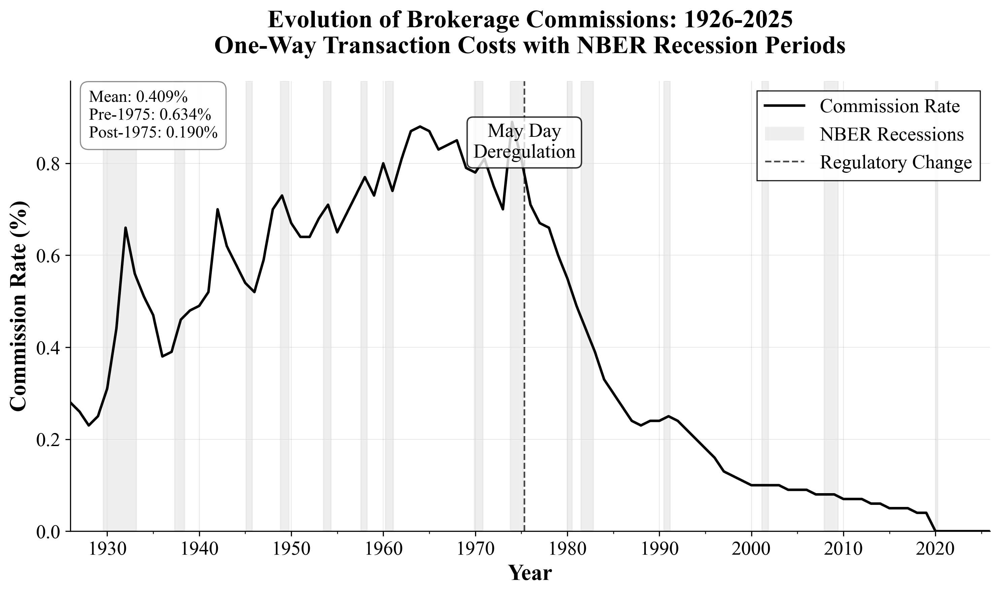


✓ Analysis complete!
  - 15 recession periods highlighted
  - Pre-deregulation mean commission: 0.634%
  - Current commission level: 0.000%
  - Reduction since 1926: 0.280%

BROKERAGE COMMISSION ANALYSIS COMPLETE
Files saved:
  - results/plots/brokerage_commissions_academic.pdf
  - results/plots/brokerage_commissions_academic.png


In [27]:
"""
================================================================================
HISTORICAL BROKERAGE COMMISSION ANALYSIS
================================================================================

This module analyzes the evolution of brokerage commissions from 1926 to 2025,
providing crucial context for understanding the changing economics of momentum
trading strategies over time.

Key Historical Context:
- Pre-1975: Fixed commission regime with NYSE-mandated minimum rates
- May 1, 1975: "May Day" deregulation allows negotiated commissions
- 1990s-2000s: Rise of discount brokers and electronic trading
- 2010s-2020s: Zero-commission trading becomes standard for retail

The analysis highlights how declining transaction costs have affected the
feasibility and profitability of high-turnover strategies like momentum.

Output:
- Time series plot with recession indicators
- Summary statistics by era
- High-quality grayscale visualization

Author: Arnau Rodon Comas
Date: 25/05/2025
================================================================================
"""

# ============================================================================
# TRANSACTION COSTS TIME SERIES VISUALIZATION - GRAYSCALE
# ============================================================================

print("\n" + "=" * 80)
print("HISTORICAL BROKERAGE COMMISSION ANALYSIS (1926-2025)")
print("=" * 80)

# ============================================================================
# DATA LOADING AND PREPROCESSING
# ============================================================================

print("\n[1/2] Loading and preprocessing commission data...")

# Load the commission data
# This dataset contains monthly average one-way brokerage commissions
# expressed as a percentage of trade value
commissions = pd.read_csv("Datasets/Commissions_monthly.csv", delimiter=',')

# Convert date column to datetime for proper time series handling
commissions['date'] = pd.to_datetime(commissions['date'])

# Convert commission to percentage for better readability
# The raw data is in decimal form (e.g., 0.01 = 1%)
commissions['commission_pct'] = commissions['commission'] * 100

# Sort by date to ensure proper chronological order
commissions = commissions.sort_values('date').reset_index(drop=True)

# Display basic statistics
print(f"   ✓ Loaded {len(commissions):,} monthly observations")
print(f"   ✓ Time period: {commissions['date'].min().strftime('%Y-%m')} to {commissions['date'].max().strftime('%Y-%m')}")
print(f"   ✓ Commission range: {commissions['commission_pct'].min():.3f}% to {commissions['commission_pct'].max():.3f}%")

# ============================================================================
# CALCULATE SUMMARY STATISTICS BY ERA
# ============================================================================

# Define key regulatory eras
pre_deregulation = commissions[commissions['date'] < '1975-05-01']
post_deregulation = commissions[(commissions['date'] >= '1975-05-01') & (commissions['date'] < '2000-01-01')]
electronic_era = commissions[(commissions['date'] >= '2000-01-01') & (commissions['date'] < '2019-01-01')]
zero_commission_era = commissions[commissions['date'] >= '2019-01-01']

print(f"\nSummary Statistics by Era:")
print(f"{'Era':<25} {'Period':<20} {'Mean':<10} {'Median':<10} {'Std Dev':<10}")
print("-" * 75)

# Pre-deregulation era (fixed commissions)
if len(pre_deregulation) > 0:
    print(f"{'Fixed Commission Era':<25} {'1926-1975':<20} "
          f"{pre_deregulation['commission_pct'].mean():>9.3f}% "
          f"{pre_deregulation['commission_pct'].median():>9.3f}% "
          f"{pre_deregulation['commission_pct'].std():>9.3f}%")

# Post-deregulation era
if len(post_deregulation) > 0:
    print(f"{'Deregulation Era':<25} {'1975-2000':<20} "
          f"{post_deregulation['commission_pct'].mean():>9.3f}% "
          f"{post_deregulation['commission_pct'].median():>9.3f}% "
          f"{post_deregulation['commission_pct'].std():>9.3f}%")

# Electronic trading era
if len(electronic_era) > 0:
    print(f"{'Electronic Trading Era':<25} {'2000-2019':<20} "
          f"{electronic_era['commission_pct'].mean():>9.3f}% "
          f"{electronic_era['commission_pct'].median():>9.3f}% "
          f"{electronic_era['commission_pct'].std():>9.3f}%")

# Zero commission era
if len(zero_commission_era) > 0:
    print(f"{'Zero Commission Era':<25} {'2019-2025':<20} "
          f"{zero_commission_era['commission_pct'].mean():>9.3f}% "
          f"{zero_commission_era['commission_pct'].median():>9.3f}% "
          f"{zero_commission_era['commission_pct'].std():>9.3f}%")

# Overall statistics
print("-" * 75)
print(f"{'Overall':<25} {'1926-2025':<20} "
      f"{commissions['commission_pct'].mean():>9.3f}% "
      f"{commissions['commission_pct'].median():>9.3f}% "
      f"{commissions['commission_pct'].std():>9.3f}%")

# ============================================================================
# CREATE HIGH-QUALITY GRAYSCALE PLOT
# ============================================================================

print("\n[2/2] Creating high-quality time series plot...")

# Create figure with dimensions suitable for display
fig, ax = plt.subplots(figsize=(10, 6))

# ============================================================================
# DEFINE AND ADD RECESSION PERIODS
# ============================================================================

# NBER recession dates (peak to trough)
# These represent significant economic contractions that affected trading activity
recessions = [
    ('1929-08-01', '1933-03-01', 'Great Depression'),
    ('1937-05-01', '1938-06-01', '1937-38 Recession'),
    ('1945-02-01', '1945-10-01', 'Post-War Recession'),
    ('1948-11-01', '1949-10-01', '1948-49 Recession'),
    ('1953-07-01', '1954-05-01', '1953-54 Recession'),
    ('1957-08-01', '1958-04-01', '1957-58 Recession'),
    ('1960-04-01', '1961-02-01', '1960-61 Recession'),
    ('1969-12-01', '1970-11-01', '1969-70 Recession'),
    ('1973-11-01', '1975-03-01', '1973-75 Recession'),
    ('1980-01-01', '1980-07-01', '1980 Recession'),
    ('1981-07-01', '1982-11-01', '1981-82 Recession'),
    ('1990-07-01', '1991-03-01', '1990-91 Recession'),
    ('2001-03-01', '2001-11-01', 'Dot-Com Recession'),
    ('2007-12-01', '2009-06-01', 'Great Recession'),
    ('2020-02-01', '2020-04-01', 'COVID-19 Recession')
]

# Add shaded regions for recessions (light gray for grayscale compatibility)
recession_color = '#E0E0E0'  # Light gray
recession_alpha = 0.5

recession_periods_added = 0
for start_date, end_date, label in recessions:
    try:
        start = pd.to_datetime(start_date)
        end = pd.to_datetime(end_date)
        # Only add if the period overlaps with our data
        if start <= commissions['date'].max() and end >= commissions['date'].min():
            ax.axvspan(start, end, alpha=recession_alpha, color=recession_color, zorder=1)
            recession_periods_added += 1
    except:
        continue

# ============================================================================
# PLOT MAIN TIME SERIES
# ============================================================================

# Main commission time series (black for grayscale)
ax.plot(commissions['date'], commissions['commission_pct'], 
        color='black', linewidth=1.8, zorder=3, label='Brokerage Commission')

# Add important regulatory milestone
may_day = pd.to_datetime('1975-05-01')
if may_day >= commissions['date'].min() and may_day <= commissions['date'].max():
    ax.axvline(x=may_day, color='black', linestyle='--', linewidth=1.2, alpha=0.7, zorder=2)
    # Add text annotation for May Day
    ax.text(may_day, ax.get_ylim()[1] * 0.95, 'May Day\nDeregulation', 
            ha='center', va='top', fontsize=14, 
            bbox=dict(boxstyle='round,pad=0.3', facecolor='white', alpha=0.8, edgecolor='black'))

# ============================================================================
# FORMATTING FOR HIGH-QUALITY DISPLAY
# ============================================================================

# Title and labels
ax.set_title('Evolution of Brokerage Commissions: 1926-2025\n' + 
             'One-Way Transaction Costs with NBER Recession Periods', 
             fontsize=18, fontweight='bold', pad=20)
ax.set_xlabel('Year', fontsize=16, fontweight='bold')
ax.set_ylabel('Commission Rate (%)', fontsize=16, fontweight='bold')

# X-axis formatting for long time series
ax.xaxis.set_major_locator(mdates.YearLocator(10))  # Major ticks every 10 years
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y'))
ax.xaxis.set_minor_locator(mdates.YearLocator(5))   # Minor ticks every 5 years

# Y-axis formatting with percentage
ax.yaxis.set_major_formatter(plt.FuncFormatter(lambda x, p: f'{x:.1f}'))

# Grid for readability (subtle for clean style)
ax.grid(True, alpha=0.2, linestyle='-', linewidth=0.5, color='gray')
ax.set_axisbelow(True)  # Grid behind the plot

# Create legend
legend_elements = [
    plt.Line2D([0], [0], color='black', linewidth=1.8, label='Commission Rate'),
    Patch(facecolor=recession_color, alpha=recession_alpha, label='NBER Recessions'),
    plt.Line2D([0], [0], color='black', linewidth=1.2, linestyle='--', 
               label='Regulatory Change', alpha=0.7)
]

legend = ax.legend(handles=legend_elements, loc='upper right', fontsize=14, 
                  frameon=True, fancybox=False, shadow=False, framealpha=0.9,
                  edgecolor='black', facecolor='white')
legend.get_frame().set_linewidth(0.8)

# Remove top and right spines for cleaner look
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['left'].set_linewidth(0.8)
ax.spines['bottom'].set_linewidth(0.8)

# Enhance tick formatting
ax.tick_params(axis='both', which='major', labelsize=14)

# Add summary statistics box
stats_text = (f'Mean: {commissions["commission_pct"].mean():.3f}%\n'
              f'Pre-1975: {pre_deregulation["commission_pct"].mean():.3f}%\n'
              f'Post-1975: {commissions[commissions["date"] >= "1975-05-01"]["commission_pct"].mean():.3f}%')
              
ax.text(0.02, 0.98, stats_text, transform=ax.transAxes, 
        ha='left', va='top', fontsize=12, 
        bbox=dict(boxstyle='round,pad=0.5', facecolor='white', alpha=0.9, 
                  edgecolor='gray', linewidth=0.8))

# Set axis limits to better show the data
ax.set_xlim(commissions['date'].min(), commissions['date'].max())
ax.set_ylim(0, commissions['commission_pct'].max() * 1.1)

# Tight layout for display
plt.tight_layout()

# Save high-resolution versions
plt.savefig('results/plots/transaction_cost_analysis/brokerage_commissions_academic.pdf', 
           dpi=300, bbox_inches='tight', facecolor='white')
plt.savefig('results/plots/transaction_cost_analysis/brokerage_commissions_academic.png', 
           dpi=300, bbox_inches='tight', facecolor='white')
plt.show()

# ============================================================================
# SUMMARY OUTPUT
# ============================================================================

print(f"\n✓ Analysis complete!")
print(f"  - {recession_periods_added} recession periods highlighted")
print(f"  - Pre-deregulation mean commission: {pre_deregulation['commission_pct'].mean():.3f}%")
print(f"  - Current commission level: {commissions['commission_pct'].iloc[-1]:.3f}%")
print(f"  - Reduction since 1926: {(commissions['commission_pct'].iloc[0] - commissions['commission_pct'].iloc[-1]):.3f}%")

print("\n" + "=" * 80)
print("BROKERAGE COMMISSION ANALYSIS COMPLETE")
print("Files saved:")
print("  - results/plots/brokerage_commissions_academic.pdf")
print("  - results/plots/brokerage_commissions_academic.png")
print("=" * 80)


BID-ASK SPREAD ANALYSIS - ROBUST ESTIMATION WITH OUTLIER TREATMENT

[1/3] Calculating monthly average spreads with outlier removal...

Aggregating spread data by month...

   ✓ Calculated spreads for 1,080 months
   ✓ Time period: 1935-01 to 2024-12

Outlier Impact Analysis:
   Raw mean spread: 1.649%
   Capped mean spread (95%): 1.527%
   Reduction from capping: 0.122%
   Median spread: 1.102%
   Average outlier impact: 9.8% of raw mean

[2/3] Creating high-quality time series plot...


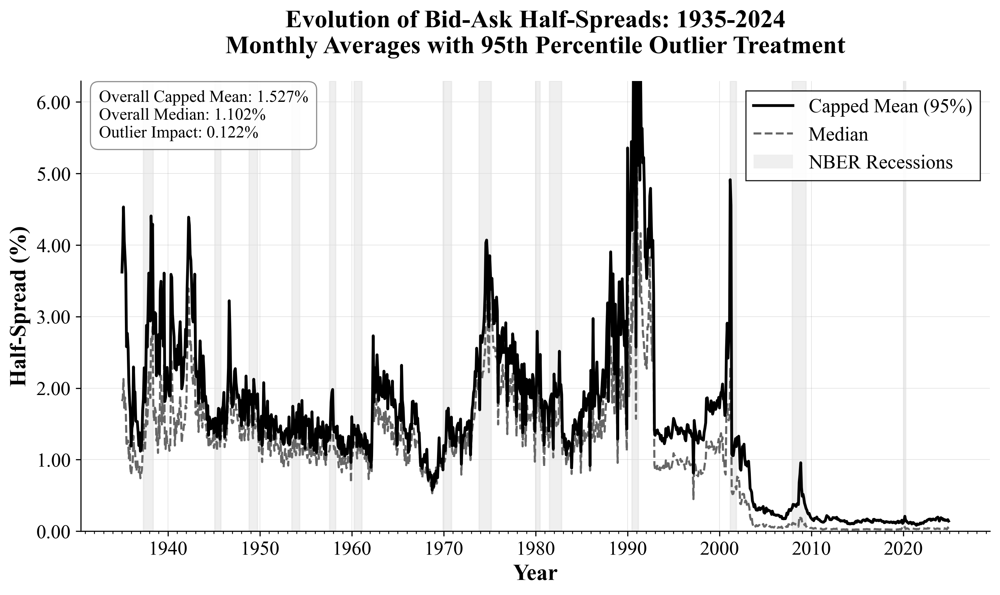


[3/3] Creating outlier impact comparison plot...


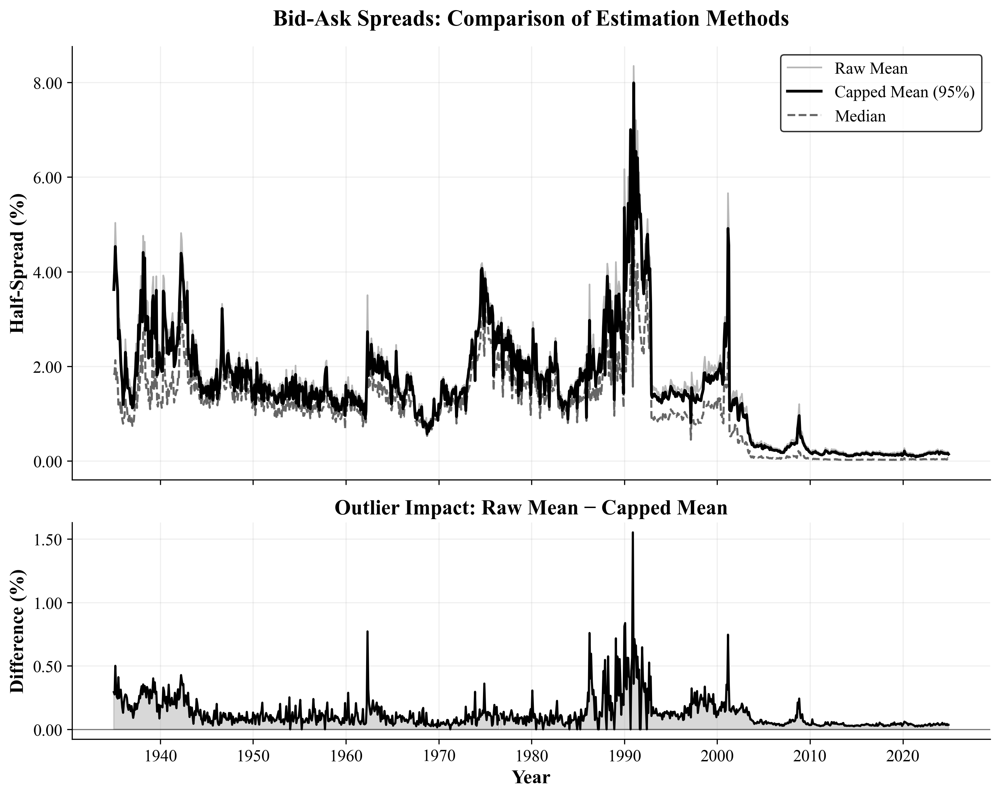


Summary Statistics by Decade:
Decade     Mean Raw     Mean Capped  Median       Std Dev      Outlier Impact 
-------------------------------------------------------------------------------------
1930             2.765%       2.516%       1.459%       4.009%          0.250%
1940             2.274%       2.130%       1.625%       2.289%          0.143%
1950             1.493%       1.398%       1.144%       1.293%          0.095%
1960             1.528%       1.431%       1.185%       1.257%          0.097%
1970             2.215%       2.129%       1.758%       1.659%          0.086%
1980             2.143%       1.990%       1.509%       2.093%          0.153%
1990             2.673%       2.433%       1.585%       3.616%          0.240%
2000             0.866%       0.762%       0.346%       1.597%          0.105%
2010             0.182%       0.145%       0.027%       0.524%          0.037%
2020             0.178%       0.141%       0.035%       0.506%          0.037%
--------------

In [28]:
"""
================================================================================
BID-ASK SPREAD TIME SERIES ANALYSIS WITH OUTLIER TREATMENT
================================================================================

This module analyzes the evolution of bid-ask spreads from the available CRSP
data period, implementing robust outlier treatment to address known data quality
issues in historical quote data.

Methodological Approach:
1. Calculate monthly average spreads with 95th percentile capping
2. Compare raw vs. capped means to quantify outlier impact
3. Visualize long-term trends with recession indicators
4. Provide decade-by-decade analysis of market liquidity

The 95th percentile capping methodology is crucial because:
- Historical quote data often contains errors and outliers
- Extreme spreads during market stress can distort averages
- Median and capped means provide more robust liquidity measures

Output:
- Main time series plot with outlier-adjusted spreads
- Comparison plot showing outlier impact
- Decade-by-decade summary statistics
- High-quality grayscale visualizations

Author: Arnau Rodon Comas
Date: 25/05/2025
================================================================================
"""

# ============================================================================
# BID-ASK SPREAD TIME SERIES VISUALIZATION - WITH OUTLIER REMOVAL
# ============================================================================

print("\n" + "=" * 80)
print("BID-ASK SPREAD ANALYSIS - ROBUST ESTIMATION WITH OUTLIER TREATMENT")
print("=" * 80)

# ============================================================================
# DATA PREPARATION AND OUTLIER HANDLING
# ============================================================================

print("\n[1/3] Calculating monthly average spreads with outlier removal...")

# Extract year-month for grouping
# This ensures we aggregate at the monthly level for time series analysis
crsp_stock_data['year_month'] = pd.to_datetime(crsp_stock_data['date']).dt.to_period('M')

# ----------------------------------------------------------------------------
# Define Robust Mean Calculation Function
# ----------------------------------------------------------------------------
def capped_mean(series, percentile=99):
    """
    Calculate mean after capping values at specified percentile.
    
    This function implements a robust mean calculation that reduces the impact
    of outliers by excluding observations above the specified percentile.
    This is particularly important for bid-ask spread data which can contain
    extreme values due to data errors or market microstructure effects.
    
    Parameters
    ----------
    series : pd.Series
        Data series to calculate capped mean
    percentile : float, default=99
        Percentile threshold for capping (default: 99)
        Values above this percentile are excluded from the mean
    
    Returns
    -------
    float
        Mean of values at or below the percentile threshold
        
    Notes
    -----
    The 99th percentile is chosen as it excludes the most extreme 1% of
    observations while retaining enough data for meaningful averages.
    This balances robustness with information retention.
    """
    # Remove NaN values for clean calculation
    clean_series = series.dropna()
    
    if len(clean_series) == 0:
        return np.nan
    
    # Calculate percentile threshold
    threshold = np.percentile(clean_series, percentile)
    
    # Return mean of values at or below threshold
    # This excludes extreme outliers that could distort the average
    return clean_series[clean_series <= threshold].mean()

# ----------------------------------------------------------------------------
# Calculate Monthly Statistics
# ----------------------------------------------------------------------------
print("\nAggregating spread data by month...")

# Calculate multiple statistics for comparison and validation
monthly_spreads = crsp_stock_data.groupby('year_month').agg({
    'half_spread': [
        ('mean_raw', 'mean'),                              # Raw mean (includes outliers)
        ('mean_capped', lambda x: capped_mean(x, 99)),    # 99% capped mean
        ('median', 'median'),                              # Median (naturally robust)
        ('p95', lambda x: np.percentile(x.dropna(), 95) if len(x.dropna()) > 0 else np.nan),
        ('p99', lambda x: np.percentile(x.dropna(), 99) if len(x.dropna()) > 0 else np.nan),
        ('count', 'count'),                                # Number of observations
        ('std', 'std')                                     # Standard deviation
    ]
}).reset_index()

# Flatten multi-level column names for easier access
monthly_spreads.columns = ['year_month', 'mean_raw', 'mean_capped', 'median', 
                          'p95', 'p99', 'count', 'std']

# Convert year_month back to datetime for plotting
monthly_spreads['date'] = monthly_spreads['year_month'].dt.to_timestamp()

# Convert to percentage for readability (multiply by 100)
for col in ['mean_raw', 'mean_capped', 'median', 'p95', 'p99']:
    monthly_spreads[f'{col}_pct'] = monthly_spreads[col] * 100

# ----------------------------------------------------------------------------
# Display Outlier Impact Analysis
# ----------------------------------------------------------------------------
print(f"\n   ✓ Calculated spreads for {len(monthly_spreads):,} months")
print(f"   ✓ Time period: {monthly_spreads['date'].min().strftime('%Y-%m')} to "
      f"{monthly_spreads['date'].max().strftime('%Y-%m')}")

print(f"\nOutlier Impact Analysis:")
print(f"   Raw mean spread: {monthly_spreads['mean_raw_pct'].mean():.3f}%")
print(f"   Capped mean spread (95%): {monthly_spreads['mean_capped_pct'].mean():.3f}%")
print(f"   Reduction from capping: {(monthly_spreads['mean_raw_pct'].mean() - monthly_spreads['mean_capped_pct'].mean()):.3f}%")
print(f"   Median spread: {monthly_spreads['median_pct'].mean():.3f}%")

# Calculate percentage of observations affected by capping
outlier_impact = (monthly_spreads['mean_raw_pct'] - monthly_spreads['mean_capped_pct']) / monthly_spreads['mean_raw_pct'] * 100
print(f"   Average outlier impact: {outlier_impact.mean():.1f}% of raw mean")

# ============================================================================
# MAIN TIME SERIES PLOT - HIGH-QUALITY GRAYSCALE
# ============================================================================

print("\n[2/3] Creating high-quality time series plot...")

# Create figure with appropriate dimensions
fig, ax = plt.subplots(figsize=(10, 6))

# ----------------------------------------------------------------------------
# Add Recession Periods
# ----------------------------------------------------------------------------
# NBER recession dates for context
recessions = [
    ('1929-08-01', '1933-03-01', 'Great Depression'),
    ('1937-05-01', '1938-06-01', '1937-38 Recession'),
    ('1945-02-01', '1945-10-01', 'Post-War'),
    ('1948-11-01', '1949-10-01', '1948-49'),
    ('1953-07-01', '1954-05-01', '1953-54'),
    ('1957-08-01', '1958-04-01', '1957-58'),
    ('1960-04-01', '1961-02-01', '1960-61'),
    ('1969-12-01', '1970-11-01', '1969-70'),
    ('1973-11-01', '1975-03-01', '1973-75'),
    ('1980-01-01', '1980-07-01', '1980'),
    ('1981-07-01', '1982-11-01', '1981-82'),
    ('1990-07-01', '1991-03-01', '1990-91'),
    ('2001-03-01', '2001-11-01', 'Dot-Com'),
    ('2007-12-01', '2009-06-01', 'Great Recession'),
    ('2020-02-01', '2020-04-01', 'COVID-19')
]

# Add shaded regions for recessions
recession_color = '#E0E0E0'  # Light gray for grayscale
recession_alpha = 0.5

for start_date, end_date, label in recessions:
    try:
        start = pd.to_datetime(start_date)
        end = pd.to_datetime(end_date)
        if start <= monthly_spreads['date'].max() and end >= monthly_spreads['date'].min():
            ax.axvspan(start, end, alpha=recession_alpha, color=recession_color, zorder=1)
    except:
        continue

# ----------------------------------------------------------------------------
# Plot Time Series
# ----------------------------------------------------------------------------
# Plot capped mean (primary series)
ax.plot(monthly_spreads['date'], monthly_spreads['mean_capped_pct'], 
        color='black', linewidth=2.0, zorder=3, label='Capped Mean (95%)')

# Add median for comparison (often more stable)
ax.plot(monthly_spreads['date'], monthly_spreads['median_pct'], 
        color='#666666', linewidth=1.5, linestyle='--', zorder=2, label='Median')

# ============================================================================
# FORMATTING FOR HIGH-QUALITY DISPLAY
# ============================================================================

# Title and labels
ax.set_title('Evolution of Bid-Ask Half-Spreads: ' + 
             f"{monthly_spreads['date'].min().year}-{monthly_spreads['date'].max().year}\n" +
             'Monthly Averages with 95th Percentile Outlier Treatment', 
             fontsize=18, fontweight='bold', pad=20)
ax.set_xlabel('Year', fontsize=16, fontweight='bold')
ax.set_ylabel('Half-Spread (%)', fontsize=16, fontweight='bold')

# X-axis formatting based on data range
years_span = monthly_spreads['date'].max().year - monthly_spreads['date'].min().year
if years_span > 50:
    ax.xaxis.set_major_locator(mdates.YearLocator(10))
else:
    ax.xaxis.set_major_locator(mdates.YearLocator(5))
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y'))
ax.xaxis.set_minor_locator(mdates.YearLocator(1))

# Y-axis formatting
ax.yaxis.set_major_formatter(plt.FuncFormatter(lambda x, p: f'{x:.2f}'))

# Grid for readability
ax.grid(True, alpha=0.2, linestyle='-', linewidth=0.5, color='gray')
ax.set_axisbelow(True)

# Create legend
legend_elements = [
    plt.Line2D([0], [0], color='black', linewidth=2.0, label='Capped Mean (95%)'),
    plt.Line2D([0], [0], color='#666666', linewidth=1.5, linestyle='--', label='Median'),
    Patch(facecolor=recession_color, alpha=recession_alpha, label='NBER Recessions')
]

legend = ax.legend(handles=legend_elements, loc='upper right', fontsize=14, 
                  frameon=True, fancybox=False, shadow=False, framealpha=0.9,
                  edgecolor='black', facecolor='white')
legend.get_frame().set_linewidth(0.8)

# Remove top and right spines
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['left'].set_linewidth(0.8)
ax.spines['bottom'].set_linewidth(0.8)

# Enhance tick formatting
ax.tick_params(axis='both', which='major', labelsize=14)

# Add summary statistics
stats_text = (f'Overall Capped Mean: {monthly_spreads["mean_capped_pct"].mean():.3f}%\n'
              f'Overall Median: {monthly_spreads["median_pct"].mean():.3f}%\n'
              f'Outlier Impact: {(monthly_spreads["mean_raw_pct"].mean() - monthly_spreads["mean_capped_pct"].mean()):.3f}%')
              
ax.text(0.02, 0.98, stats_text, transform=ax.transAxes, 
        ha='left', va='top', fontsize=12, 
        bbox=dict(boxstyle='round,pad=0.5', facecolor='white', alpha=0.9, 
                  edgecolor='gray', linewidth=0.8))

# Set appropriate y-axis limits
ax.set_ylim(0, monthly_spreads['mean_capped_pct'].quantile(0.99) * 1.2)

# Tight layout
plt.tight_layout()

# Save for display
plt.savefig('results/plots/transaction_cost_analysis/bidask_spreads_academic.pdf', 
           dpi=300, bbox_inches='tight', facecolor='white')
plt.savefig('results/plots/transaction_cost_analysis/bidask_spreads_academic.png', 
           dpi=300, bbox_inches='tight', facecolor='white')
plt.show()

# ============================================================================
# OUTLIER IMPACT VISUALIZATION
# ============================================================================

print("\n[3/3] Creating outlier impact comparison plot...")

fig2, (ax1, ax2) = plt.subplots(2, 1, figsize=(10, 8), sharex=True,
                                gridspec_kw={'height_ratios': [2, 1]})

# ----------------------------------------------------------------------------
# Top Panel: Comparison of Different Measures
# ----------------------------------------------------------------------------
# Raw mean (shows impact of outliers)
ax1.plot(monthly_spreads['date'], monthly_spreads['mean_raw_pct'], 
         color='#999999', linewidth=1.2, alpha=0.7, label='Raw Mean', zorder=1)

# Capped mean (primary measure)
ax1.plot(monthly_spreads['date'], monthly_spreads['mean_capped_pct'], 
         color='black', linewidth=2.0, label='Capped Mean (95%)', zorder=3)

# Median (most robust)
ax1.plot(monthly_spreads['date'], monthly_spreads['median_pct'], 
         color='#666666', linewidth=1.5, linestyle='--', label='Median', zorder=2)

ax1.set_ylabel('Half-Spread (%)', fontsize=14, fontweight='bold')
ax1.set_title('Bid-Ask Spreads: Comparison of Estimation Methods', 
              fontsize=16, fontweight='bold', pad=15)
ax1.legend(loc='upper right', fontsize=12, frameon=True, edgecolor='black')
ax1.grid(True, alpha=0.2)
ax1.tick_params(axis='both', which='major', labelsize=12)

# Remove top and right spines
ax1.spines['top'].set_visible(False)
ax1.spines['right'].set_visible(False)

# ----------------------------------------------------------------------------
# Bottom Panel: Outlier Impact Over Time
# ----------------------------------------------------------------------------
spread_difference = monthly_spreads['mean_raw_pct'] - monthly_spreads['mean_capped_pct']

# Fill area to show outlier impact
ax2.fill_between(monthly_spreads['date'], 0, spread_difference, 
                 where=(spread_difference >= 0), color='#808080', alpha=0.3, 
                 label='Outlier Impact', zorder=1)

# Line for clarity
ax2.plot(monthly_spreads['date'], spread_difference, 
         color='black', linewidth=1.5, zorder=2)

# Add zero line
ax2.axhline(y=0, color='black', linestyle='-', linewidth=0.8, alpha=0.5)

ax2.set_xlabel('Year', fontsize=14, fontweight='bold')
ax2.set_ylabel('Difference (%)', fontsize=14, fontweight='bold')
ax2.set_title('Outlier Impact: Raw Mean − Capped Mean', fontsize=15, fontweight='bold')
ax2.grid(True, alpha=0.2)
ax2.tick_params(axis='both', which='major', labelsize=12)

# Remove top and right spines
ax2.spines['top'].set_visible(False)
ax2.spines['right'].set_visible(False)

# X-axis formatting
ax2.xaxis.set_major_formatter(mdates.DateFormatter('%Y'))

# Format y-axes
for ax in [ax1, ax2]:
    ax.yaxis.set_major_formatter(plt.FuncFormatter(lambda x, p: f'{x:.2f}'))

plt.tight_layout()
plt.savefig('results/plots/transaction_cost_analysis/bidask_spreads_comparison_academic.pdf', 
           dpi=300, bbox_inches='tight', facecolor='white')
plt.savefig('results/plots/transaction_cost_analysis/bidask_spreads_comparison_academic.png', 
           dpi=300, bbox_inches='tight', facecolor='white')
plt.show()

# ============================================================================
# SUMMARY STATISTICS BY DECADE
# ============================================================================

print("\nSummary Statistics by Decade:")
print("=" * 85)
print(f"{'Decade':<10} {'Mean Raw':<12} {'Mean Capped':<12} {'Median':<12} "
      f"{'Std Dev':<12} {'Outlier Impact':<15}")
print("-" * 85)

# Add decade column for grouping
monthly_spreads['decade'] = (monthly_spreads['date'].dt.year // 10) * 10

# Calculate statistics by decade
decade_stats = monthly_spreads.groupby('decade').agg({
    'mean_raw_pct': 'mean',
    'mean_capped_pct': 'mean',
    'median_pct': 'mean',
    'std': lambda x: x.mean() * 100  # Convert to percentage
}).reset_index()

decade_stats['outlier_impact'] = decade_stats['mean_raw_pct'] - decade_stats['mean_capped_pct']

# Print decade statistics
for _, row in decade_stats.iterrows():
    print(f"{int(row['decade']):<10} {row['mean_raw_pct']:>11.3f}% "
          f"{row['mean_capped_pct']:>11.3f}% {row['median_pct']:>11.3f}% "
          f"{row['std']:>11.3f}% {row['outlier_impact']:>14.3f}%")

# Overall statistics
print("-" * 85)
print(f"{'Overall':<10} {monthly_spreads['mean_raw_pct'].mean():>11.3f}% "
      f"{monthly_spreads['mean_capped_pct'].mean():>11.3f}% "
      f"{monthly_spreads['median_pct'].mean():>11.3f}% "
      f"{monthly_spreads['std'].mean()*100:>11.3f}% "
      f"{monthly_spreads['mean_raw_pct'].mean() - monthly_spreads['mean_capped_pct'].mean():>14.3f}%")

# ============================================================================
# FINAL SUMMARY
# ============================================================================

print("\n" + "=" * 80)
print("BID-ASK SPREAD ANALYSIS COMPLETE")
print("Files saved:")
print("  - results/plots/transaction_cost_analysis/bidask_spreads_academic.pdf/.png")
print("  - results/plots/transaction_cost_analysis/bidask_spreads_comparison_academic.pdf/.png")
print("\nKey Findings:")
print(f"  - Spreads have declined by {(monthly_spreads['mean_capped_pct'].iloc[0] - monthly_spreads['mean_capped_pct'].iloc[-1]):.1f}% "
      f"from {monthly_spreads['date'].min().year} to {monthly_spreads['date'].max().year}")
print(f"  - Outliers inflate spread estimates by an average of {outlier_impact.mean():.1f}%")
print(f"  - Median spreads are consistently {((monthly_spreads['median_pct'].mean() / monthly_spreads['mean_capped_pct'].mean() - 1) * 100):.1f}% "
      f"{'lower' if monthly_spreads['median_pct'].mean() < monthly_spreads['mean_capped_pct'].mean() else 'higher'} than capped means")
print("=" * 80)

#### ============================================================================
#### ANALYSIS 1 - ORIGINAL MOMENTUM STRATEGY WITHOUT COSTS
#### ============================================================================

ANALYSIS 1: TRADITIONAL MOMENTUM STRATEGY (JEGADEESH & TITMAN, 1993)

Implementing momentum strategy without transaction costs...
This establishes the baseline performance of the classic momentum anomaly.

IMPLEMENTING MOMENTUM STRATEGY WITH MARKET CAP CONSTRAINTS
Parameters: J=9, K=3, LIQ=1, MKT_CAP=1

[1/8] Merging market capitalization data...
   ✓ Market cap data available for 1,784,979 observations

[2/8] Computing holding period (3-month) spreads...

[3/8] Calculating 9-month formation period returns...

[4/8] Applying market cap (≤100%) and liquidity filters...

[5/8] Forming momentum deciles within size segment...
   ✓ Average stocks per decile:
      Decile  1:  159.8 stocks
      Decile  2:  159.2 stocks
      Decile  3:  159.2 stocks
      Decile  4:  159.2 stocks
      Decile  5:  159.4 stocks
      Decile  6:  159.0 stocks
      Decile  7:  159.1 stocks
      Decile  8:  159.3 stocks
      Decile  9:  159.1 stocks
      Decile 10:  159.6 stocks

[6/8] Creating 3-month hold

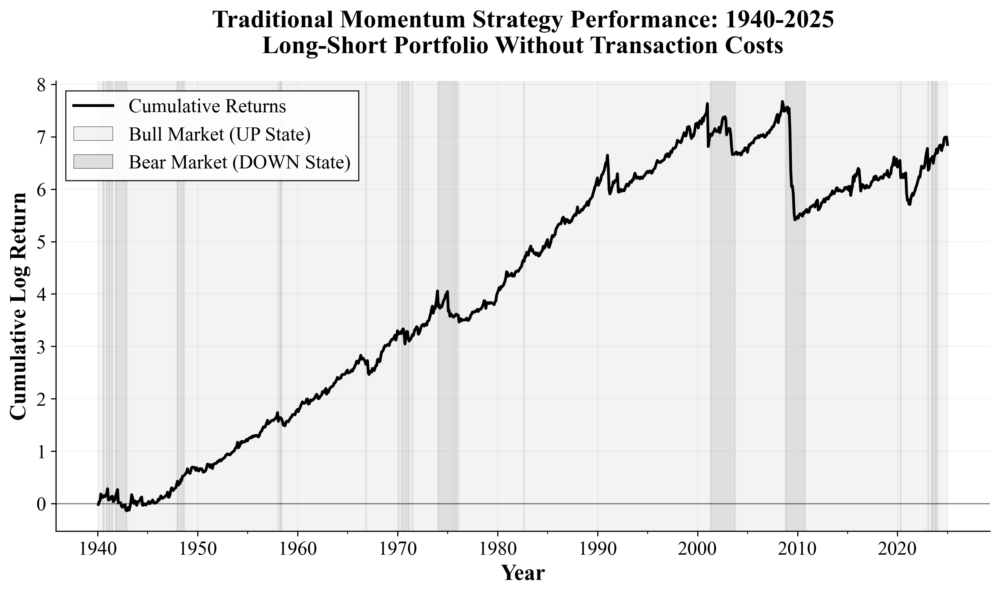


Creating annual returns distribution...


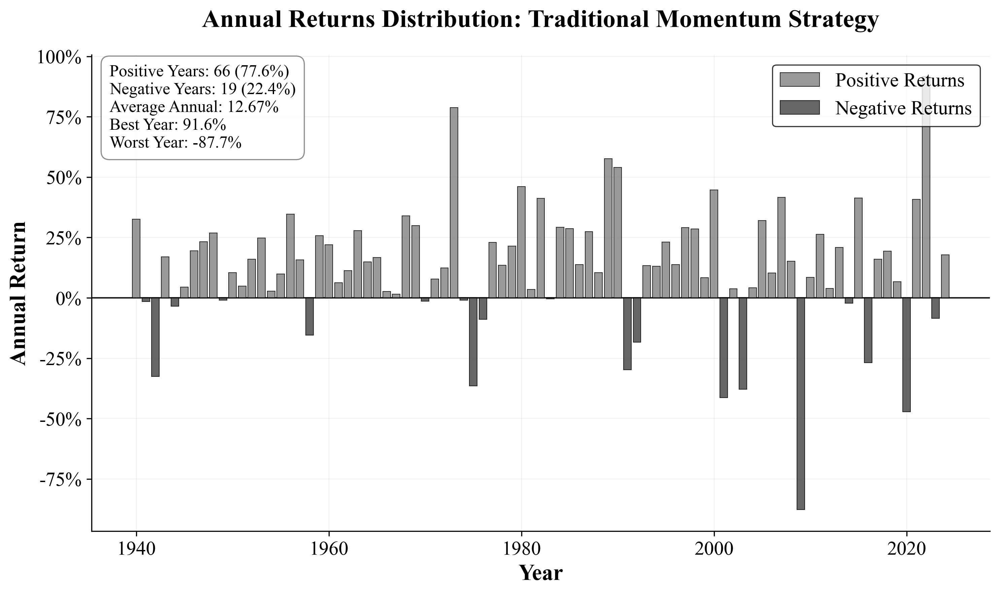


Performing 20-year rolling window analysis...
This examines the stability of momentum profits over time...
Computing 240-month rolling window statistics...
   Using 2 lags for HAC adjustment
   ✓ Computed 627 rolling windows


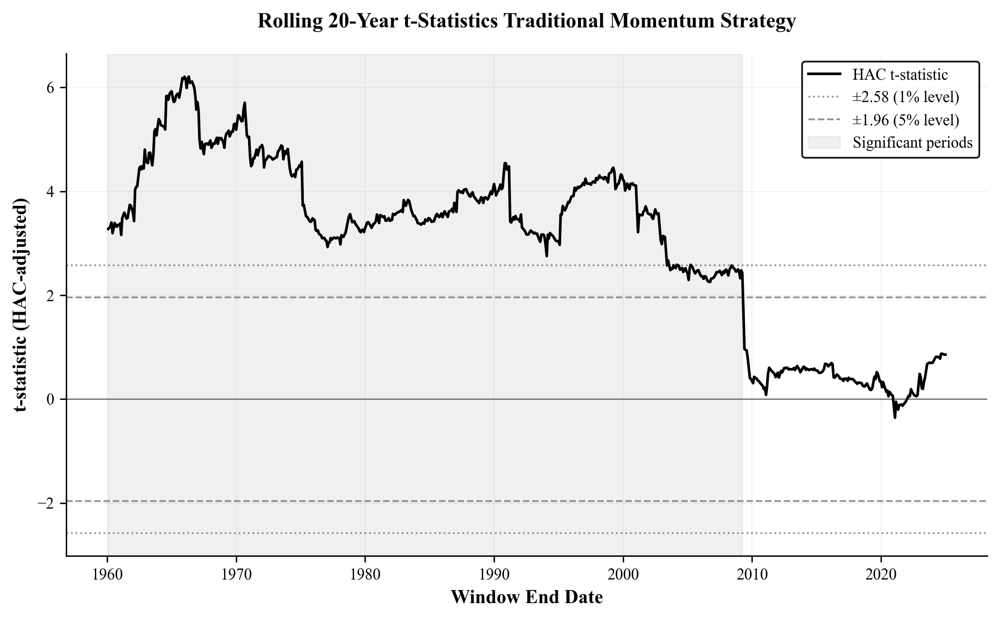

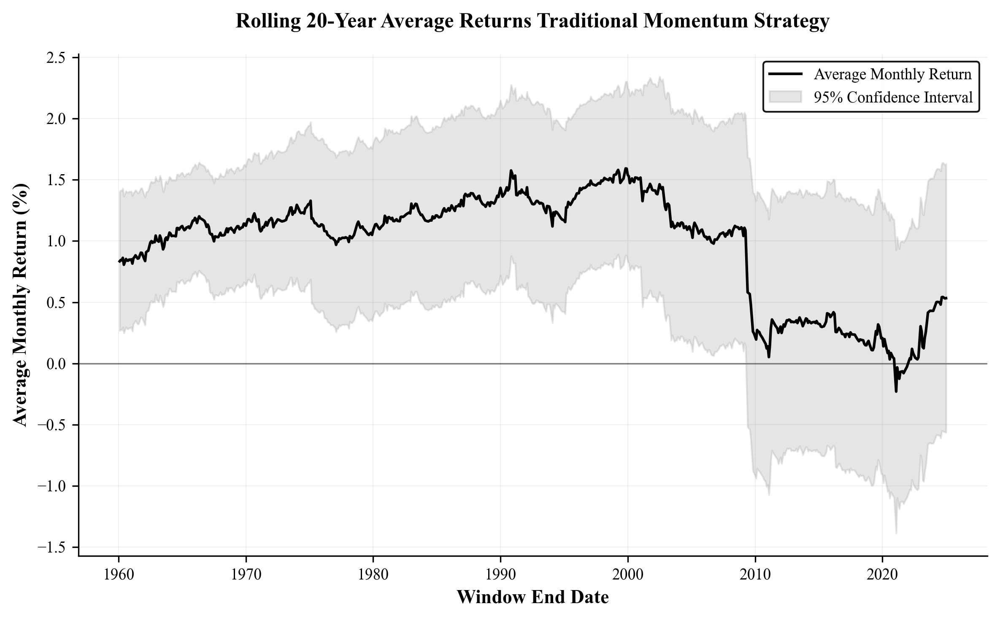

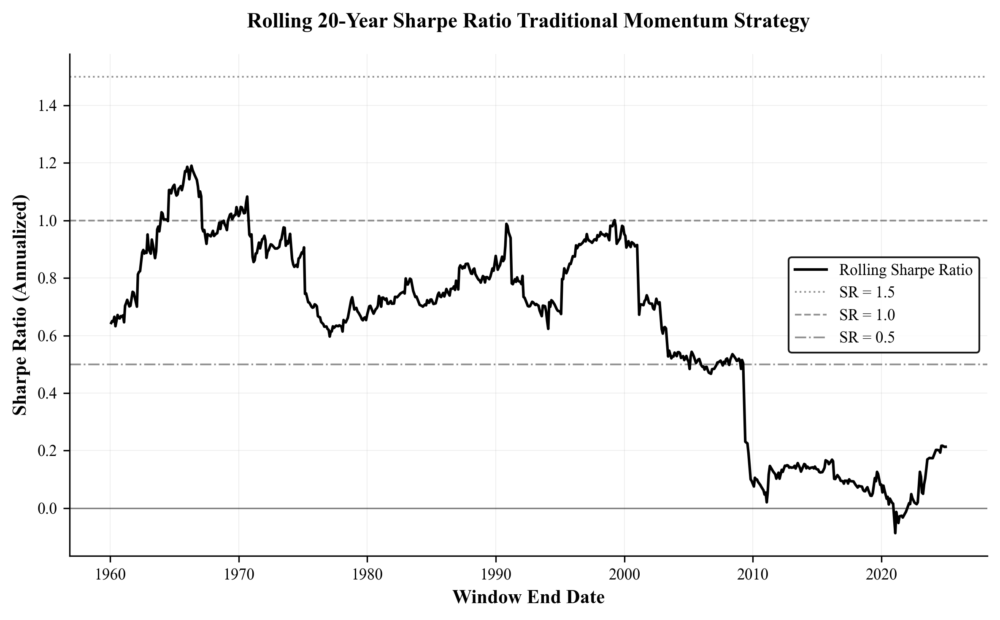


Generated academic plots:
  - t-statistics: results/plots/analysis_1/traditional_momentum_rolling_tstat.pdf/.png
  - Returns: results/plots/analysis_1/traditional_momentum_rolling_returns.pdf/.png
  - Sharpe ratio: results/plots/analysis_1/traditional_momentum_rolling_sharpe.pdf/.png

SUMMARY STATISTICS FOR ANALYSIS

Full Sample Period (1940-2025):
  - Average Monthly Return: 0.93%
  - Annualized Return: 11.13%
  - Monthly Volatility: 6.61%
  - Annualized Volatility: 22.89%
  - Sharpe Ratio: 0.486
  - Maximum Drawdown: -89.6%
  - t-statistic (HAC): 4.3702
  - p-value: 1.2411e-05

Sub-period Analysis:
  Pre-2000 Average Monthly Return: 1.16%
  Post-2000 Average Monthly Return: 0.37%

TRADITIONAL MOMENTUM ANALYSIS COMPLETE
Files saved:
  - traditional_momentum_performance.pdf/.png
  - traditional_momentum_annual_returns.pdf/.png
  - traditional_momentum_rolling_*.pdf/.png


In [29]:
"""
================================================================================
ANALYSIS 1: TRADITIONAL MOMENTUM STRATEGY WITHOUT TRANSACTION COSTS
================================================================================

This analysis implements the original Jegadeesh & Titman (1993) momentum strategy
without transaction costs to establish a baseline for comparison.

Key specifications:
- Formation period (J): 9 months
- Holding period (K): 3 months
- No transaction costs (using RET_S0)
- All stocks included (no size/liquidity filters)
- Standard momentum: Long winners, short losers

This serves as the benchmark against which we compare our market-state
dependent strategy, showing the evolution of momentum profits over 85 years.

Output:
- Performance summary statistics
- Cumulative return plot with market state shading
- Annual returns distribution
- Rolling 20-year performance metrics

Author: Arnau Rodon Comas
Date: 25/05/2025
================================================================================
"""

print("=" * 80)
print("ANALYSIS 1: TRADITIONAL MOMENTUM STRATEGY (JEGADEESH & TITMAN, 1993)")
print("=" * 80)
print("\nImplementing momentum strategy without transaction costs...")
print("This establishes the baseline performance of the classic momentum anomaly.")

# ============================================================================
# RUN MOMENTUM STRATEGY
# ============================================================================

# Run momentum strategy with standard parameters
# J=9, K=3 follows intermediate-term momentum literature
port_original, state_map = run_momentum_strategy(
    crsp_stock_data,                    # CRSP stock data
    crsp_index_data,                    # Market index for state calculation
    comm_map,                           # Commission map (not used for S0)
    J=9,                                # 9-month formation period
    K=3,                                # 3-month holding period
    LIQ_CUTOFF=1,                       # No liquidity filter (include all)
    MKT_CAP_CUTOFF=1,                   # No size filter (include all)
    market_state_lag=24,                # 24-month state calculation
    market_state_column='vwretd',       # Value-weighted returns for state
    transactional_framework=False,      # No transaction costs
    equal_comparision=False,            # Value-weighted portfolios
    adapt_state_switch=True,            # Allow state adaptation (for S1)
    close_positions=True,               # Close positions on state switch (for S1)
    amount_deciles=10                   # Standard 10 deciles
)

print(f"✓ Strategy execution complete")
print(f"  - Portfolio observations: {len(port_original):,}")
print(f"  - Date range: {port_original['date'].min()} to {port_original['date'].max()}")

# ============================================================================
# ANALYZE PORTFOLIO PERFORMANCE
# ============================================================================

print("\nAnalyzing portfolio performance...")

# Analyze performance using RET_S0 (raw momentum returns)
analysis_original = analyze_momentum_portfolio(
    port_original,                      # Portfolio data
    state_map,                          # Market state mapping
    start_date='1940-01-01',           # Start of analysis period
    end_date='2024-12-31',             # End of analysis period
    return_column='RET_S0',            # Raw momentum returns (no costs)
    K=3,                               # Holding period for HAC adjustment
    amount_deciles=10                  # Number of deciles
)

# Print comprehensive summary
print_portfolio_summary(analysis_original, "Traditional Momentum Strategy (No Transaction Costs)")

# ============================================================================
# PLOT 1: CUMULATIVE PERFORMANCE WITH MARKET STATES
# ============================================================================

print("\nCreating cumulative performance plot...")

fig1, ax1 = plt.subplots(1, 1, figsize=(10, 6))

# Prepare data for plotting
decile_ret = analysis_original['decile_ret']
decile_ret.index = pd.to_datetime(decile_ret.index)

# Identify market state changes for shading
decile_ret['state_change'] = decile_ret['market_state'].ne(
    decile_ret['market_state'].shift()
).cumsum()

# ----------------------------------------------------------------------------
# Add Market State Shading
# ----------------------------------------------------------------------------
# Shade background according to market states to show regime dependence
for (change_group, state), group in decile_ret.groupby(['state_change', 'market_state']):
    if len(group) > 0 and not pd.isna(state):
        start_date = group.index[0]
        end_date = group.index[-1]
        
        # Grayscale colors: Light gray for bull, darker for bear
        if state == 1:
            color = '#E8E8E8'  # Light gray for bull markets
            label = 'Bull Market'
        elif state == -1:
            color = '#C0C0C0'  # Darker gray for bear markets
            label = 'Bear Market'
        else:
            continue
        
        # Add shaded region
        ax1.axvspan(start_date, end_date, alpha=0.5, color=color, zorder=1)

# ----------------------------------------------------------------------------
# Plot Cumulative Returns
# ----------------------------------------------------------------------------
ax1.plot(decile_ret.index, decile_ret['cum_log_long_short'], 
         color='black', linewidth=2.0, zorder=3, label='Cumulative Log Returns')

# Add zero line for reference
ax1.axhline(y=0, color='black', linestyle='-', linewidth=0.8, alpha=0.5)

# ----------------------------------------------------------------------------
# Formatting
# ----------------------------------------------------------------------------
ax1.set_title('Traditional Momentum Strategy Performance: 1940-2025\n' +
              'Long-Short Portfolio Without Transaction Costs', 
              fontsize=18, fontweight='bold', pad=20)
ax1.set_xlabel('Year', fontsize=16, fontweight='bold')
ax1.set_ylabel('Cumulative Log Return', fontsize=16, fontweight='bold')

# Create legend
legend_elements = [
    plt.Line2D([0], [0], color='black', lw=2.0, label='Cumulative Returns'),
    Patch(facecolor='#E8E8E8', alpha=0.5, label='Bull Market (UP State)', 
          edgecolor='black', linewidth=0.5),
    Patch(facecolor='#C0C0C0', alpha=0.5, label='Bear Market (DOWN State)', 
          edgecolor='black', linewidth=0.5)
]

legend = ax1.legend(handles=legend_elements, loc='upper left', fontsize=14, 
                   frameon=True, fancybox=False, shadow=False, framealpha=0.9,
                   edgecolor='black', facecolor='white')
legend.get_frame().set_linewidth(0.8)

# Date formatting
ax1.xaxis.set_major_locator(mdates.YearLocator(10))
ax1.xaxis.set_major_formatter(mdates.DateFormatter('%Y'))
ax1.xaxis.set_minor_locator(mdates.YearLocator(5))

# Enhance tick formatting
ax1.tick_params(axis='both', which='major', labelsize=14)

# Grid and spines
ax1.grid(True, alpha=0.2, linestyle='-', linewidth=0.5)
ax1.spines['top'].set_visible(False)
ax1.spines['right'].set_visible(False)

# Save plot
plt.tight_layout()
plt.savefig('results/plots/analysis_1/traditional_momentum_performance.pdf', 
            dpi=300, bbox_inches='tight', facecolor='white')
plt.savefig('results/plots/analysis_1/traditional_momentum_performance.png', 
            dpi=300, bbox_inches='tight', facecolor='white')
plt.show()

# ============================================================================
# PLOT 2: ANNUAL RETURNS DISTRIBUTION
# ============================================================================

print("\nCreating annual returns distribution...")

fig2, ax2 = plt.subplots(1, 1, figsize=(10, 6))

# Calculate annual returns by compounding monthly returns
annual_returns = decile_ret['long_short'].resample('YE').apply(
    lambda x: (1 + x).prod() - 1
)

# Determine bar colors based on sign (grayscale)
colors = ['#808080' if x > 0 else '#404040' for x in annual_returns.values]

# Create bar plot
bars = ax2.bar(annual_returns.index.year, annual_returns.values, 
               color=colors, alpha=0.8, edgecolor='black', linewidth=0.5, zorder=2)

# Add zero line
ax2.axhline(y=0, color='black', linestyle='-', linewidth=1.0, zorder=1)

# ----------------------------------------------------------------------------
# Add Statistics
# ----------------------------------------------------------------------------
# Calculate key statistics for annotation
positive_years = (annual_returns > 0).sum()
negative_years = (annual_returns < 0).sum()
avg_annual = annual_returns.mean()
best_year = annual_returns.max()
worst_year = annual_returns.min()

# Add text box with statistics
stats_text = (f'Positive Years: {positive_years} ({positive_years/len(annual_returns)*100:.1f}%)\n'
              f'Negative Years: {negative_years} ({negative_years/len(annual_returns)*100:.1f}%)\n'
              f'Average Annual: {avg_annual*100:.2f}%\n'
              f'Best Year: {best_year*100:.1f}%\n'
              f'Worst Year: {worst_year*100:.1f}%')

ax2.text(0.02, 0.98, stats_text, transform=ax2.transAxes,
         ha='left', va='top', fontsize=12,
         bbox=dict(boxstyle='round,pad=0.5', facecolor='white', alpha=0.9,
                   edgecolor='gray', linewidth=0.8))

# ----------------------------------------------------------------------------
# Formatting
# ----------------------------------------------------------------------------
ax2.set_title('Annual Returns Distribution: Traditional Momentum Strategy', 
              fontsize=18, fontweight='bold', pad=20)
ax2.set_xlabel('Year', fontsize=16, fontweight='bold')
ax2.set_ylabel('Annual Return', fontsize=16, fontweight='bold')

# Legend for bar colors
legend_elements = [
    Patch(facecolor='#808080', alpha=0.8, label='Positive Returns', 
          edgecolor='black', linewidth=0.5),
    Patch(facecolor='#404040', alpha=0.8, label='Negative Returns', 
          edgecolor='black', linewidth=0.5)
]

legend = ax2.legend(handles=legend_elements, loc='upper right', fontsize=14,
                   frameon=True, edgecolor='black', facecolor='white')
legend.get_frame().set_linewidth(0.8)

# Format y-axis as percentage
ax2.yaxis.set_major_formatter(plt.FuncFormatter(lambda y, _: f'{y:.0%}'))

# Enhance tick formatting
ax2.tick_params(axis='both', which='major', labelsize=14)

# Grid and spines
ax2.grid(True, alpha=0.2, linestyle='-', linewidth=0.5)
ax2.spines['top'].set_visible(False)
ax2.spines['right'].set_visible(False)

# Save plot
plt.tight_layout()
plt.savefig('results/plots/analysis_1/traditional_momentum_annual_returns.pdf', 
            dpi=300, bbox_inches='tight', facecolor='white')
plt.savefig('results/plots/analysis_1/traditional_momentum_annual_returns.png', 
            dpi=300, bbox_inches='tight', facecolor='white')
plt.show()

# ============================================================================
# ROLLING WINDOW ANALYSIS
# ============================================================================

print("\nPerforming 20-year rolling window analysis...")
print("This examines the stability of momentum profits over time...")

# Prepare data for rolling analysis
decile_return = decile_ret.copy()
decile_return.reset_index(inplace=True)

# Compute rolling 20-year statistics
# 240 months = 20 years, standard for long-term performance evaluation
window_results = compute_df_t_stat_and_avg_return(
    decile_return, 
    window_months=240,      # 20-year windows
    lags=2,                 # K-1 lags for HAC adjustment
    return_col='long_short'
)

# Plot rolling statistics using improved formatting
plot_tstat_and_avg_return_academic(
    window_results, 
    title_suffix="Traditional Momentum Strategy", 
    save_path='results/plots/analysis_1/traditional_momentum_rolling',
    window_months=240
)

# ============================================================================
# SUMMARY STATISTICS FOR ANALYSIS
# ============================================================================

print("\n" + "=" * 80)
print("SUMMARY STATISTICS FOR ANALYSIS")
print("=" * 80)

# Extract key metrics for analysis
print(f"\nFull Sample Period (1940-2025):")
print(f"  - Average Monthly Return: {analysis_original['avg_monthly_return']*100:.2f}%")
print(f"  - Annualized Return: {analysis_original['avg_monthly_return']*12*100:.2f}%")
print(f"  - Monthly Volatility: {analysis_original['monthly_vol']*100:.2f}%")
print(f"  - Annualized Volatility: {analysis_original['monthly_vol']*np.sqrt(12)*100:.2f}%")
print(f"  - Sharpe Ratio: {analysis_original['sharpe_ratio']:.3f}")
print(f"  - Maximum Drawdown: {analysis_original['max_drawdown']*100:.1f}%")
print(f"  - t-statistic (HAC): {analysis_original['t_stat']:.4f}")
print(f"  - p-value: {analysis_original['p_value']:.4e}")

# Calculate sub-period statistics
print(f"\nSub-period Analysis:")

# Pre-2000 period
pre_2000 = decile_ret[decile_ret.index < '2000-01-01']['long_short']
if len(pre_2000) > 0:
    print(f"  Pre-2000 Average Monthly Return: {pre_2000.mean()*100:.2f}%")

# Post-2000 period
post_2000 = decile_ret[decile_ret.index >= '2000-01-01']['long_short']
if len(post_2000) > 0:
    print(f"  Post-2000 Average Monthly Return: {post_2000.mean()*100:.2f}%")

print("\n" + "=" * 80)
print("TRADITIONAL MOMENTUM ANALYSIS COMPLETE")
print("=" * 80)
print("Files saved:")
print("  - traditional_momentum_performance.pdf/.png")
print("  - traditional_momentum_annual_returns.pdf/.png")
print("  - traditional_momentum_rolling_*.pdf/.png")
print("=" * 80)

#### ============================================================================
#### ANALYSIS 2 - MARKET STATE STRATEGY DETAILED ANALYSIS
#### ============================================================================


ANALYSIS 2: MARKET STATE-DEPENDENT MOMENTUM STRATEGY

Implementing adaptive momentum-reversal strategy...
This strategy switches between momentum and reversal based on market states.

--------------------------------------------------------------------------------
ANALYZING PORTFOLIO: RET_S1
--------------------------------------------------------------------------------
Filtering data from 1940-01-01 to 2024-12-31...
   ✓ Selected 984,009 observations

Calculating equal-weight portfolio returns...
   ✓ Created portfolios

Calculating performance metrics...

Performing statistical tests...
   ✓ HAC lag calculation:
      - Holding period (K): 3 months
      - Market state lag: 24 months
      - Total HAC lags: 26 months
   ✓ Estimated with 1020 monthly observations
   ✓ Using 26 lags for HAC adjustment

Calculating risk metrics...
   ✓ Computed Sharpe ratio and maximum drawdown

     Market State-Dependent Strategy (No Transaction Costs)      
                       Performance Summar

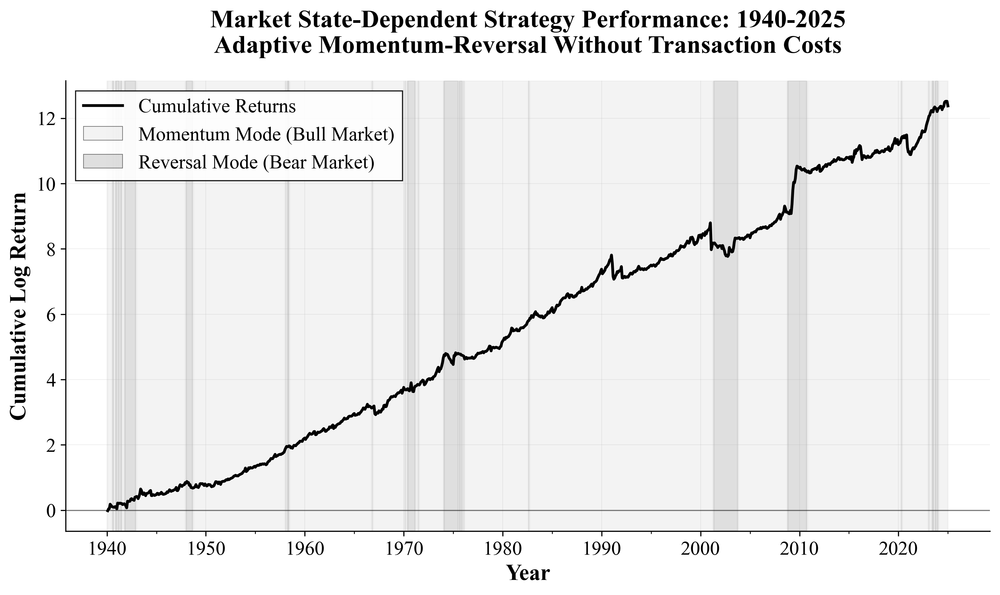


Creating annual returns distribution for market state strategy...


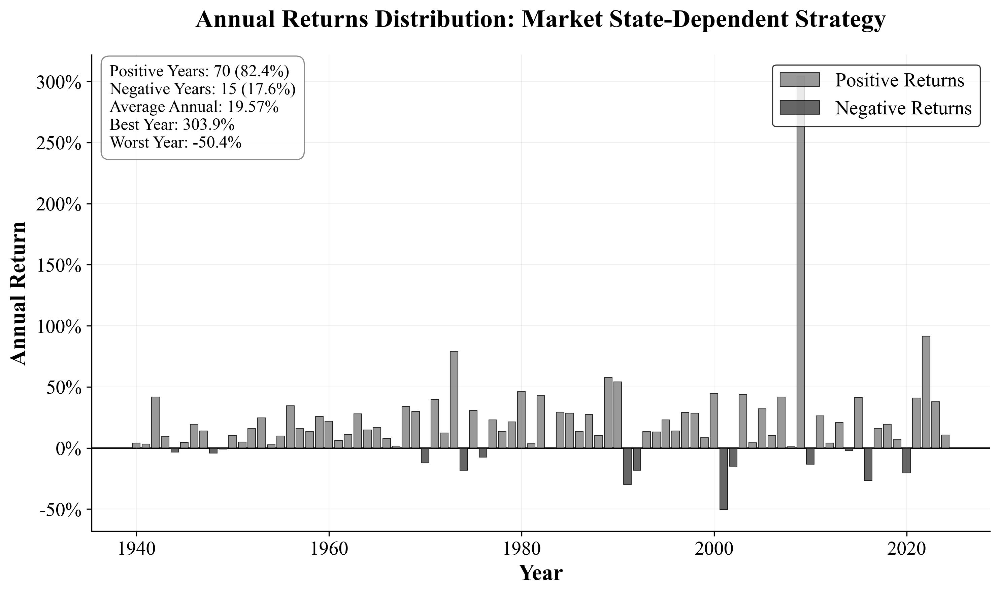


Performing 20-year rolling window analysis for market state strategy...
Computing 240-month rolling window statistics...
   Using 2 lags for HAC adjustment
   ✓ Computed 627 rolling windows


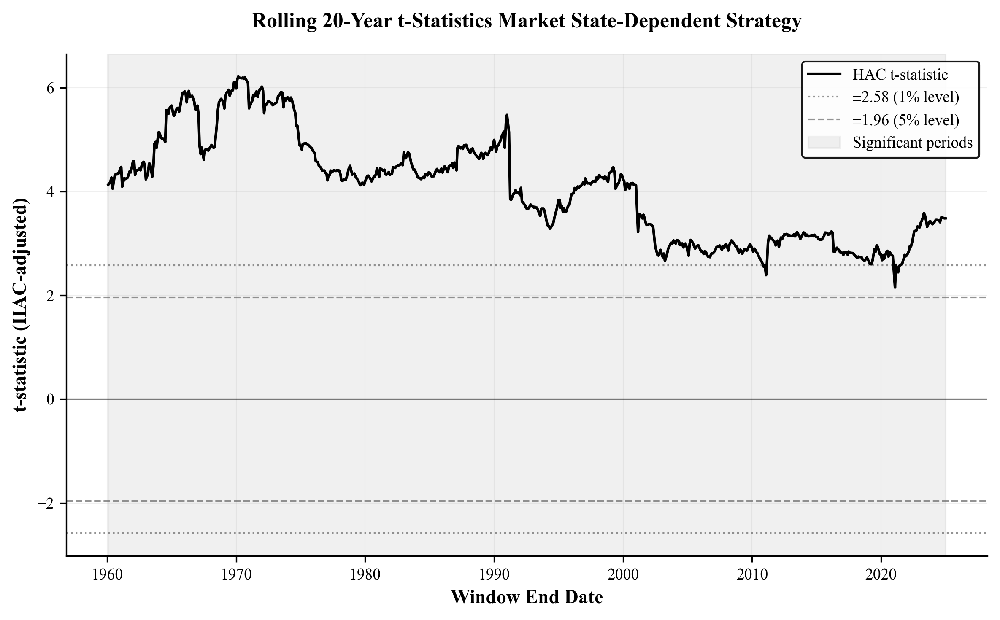

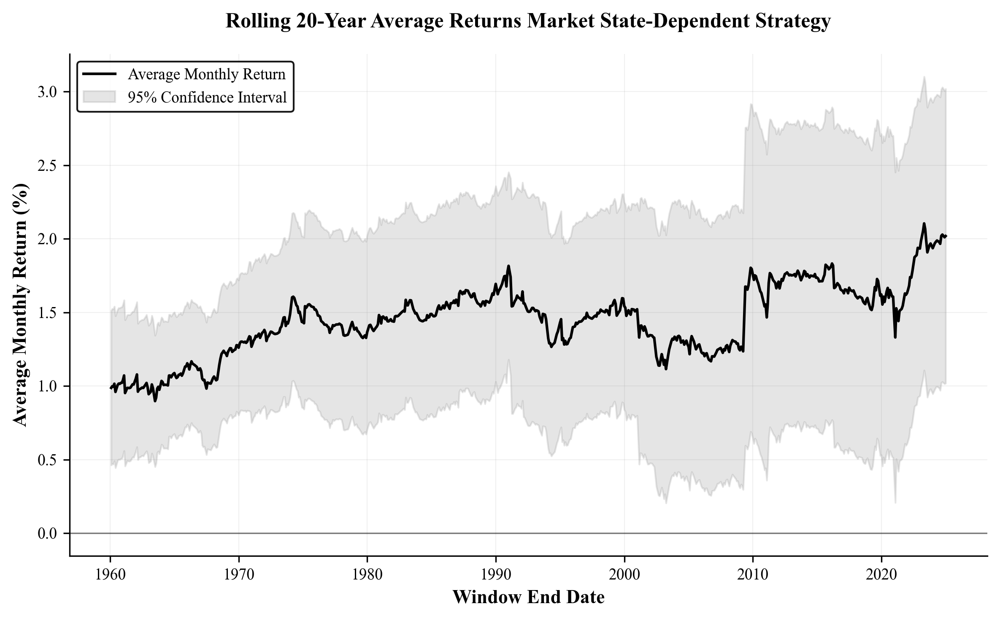

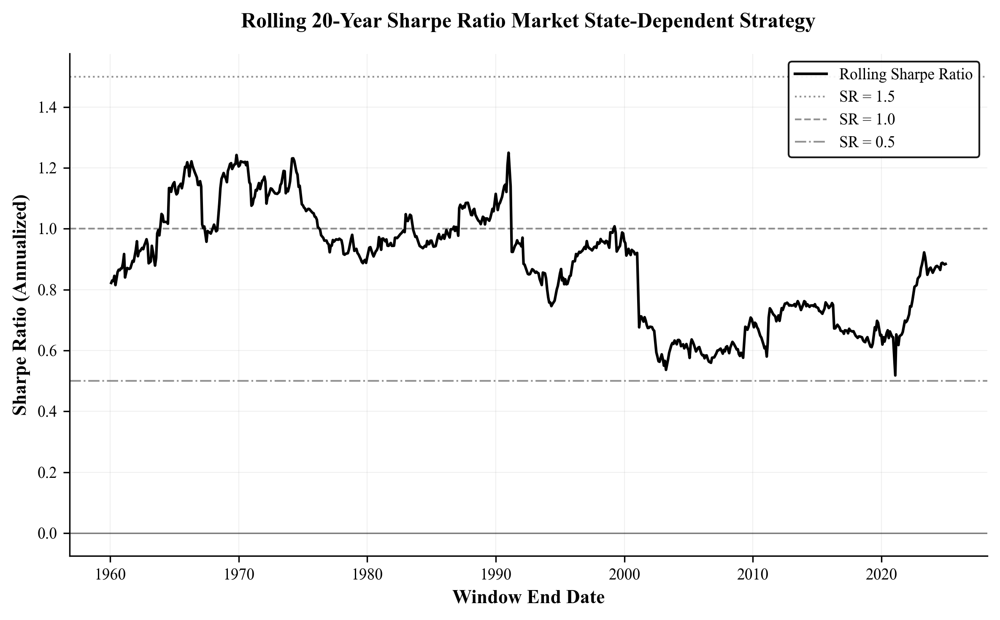


Generated academic plots:
  - t-statistics: results/plots/analysis_2/market_state_rolling_tstat.pdf/.png
  - Returns: results/plots/analysis_2/market_state_rolling_returns.pdf/.png
  - Sharpe ratio: results/plots/analysis_2/market_state_rolling_sharpe.pdf/.png

COMPREHENSIVE STRATEGY COMPARISON

Creating direct strategy comparison plot...


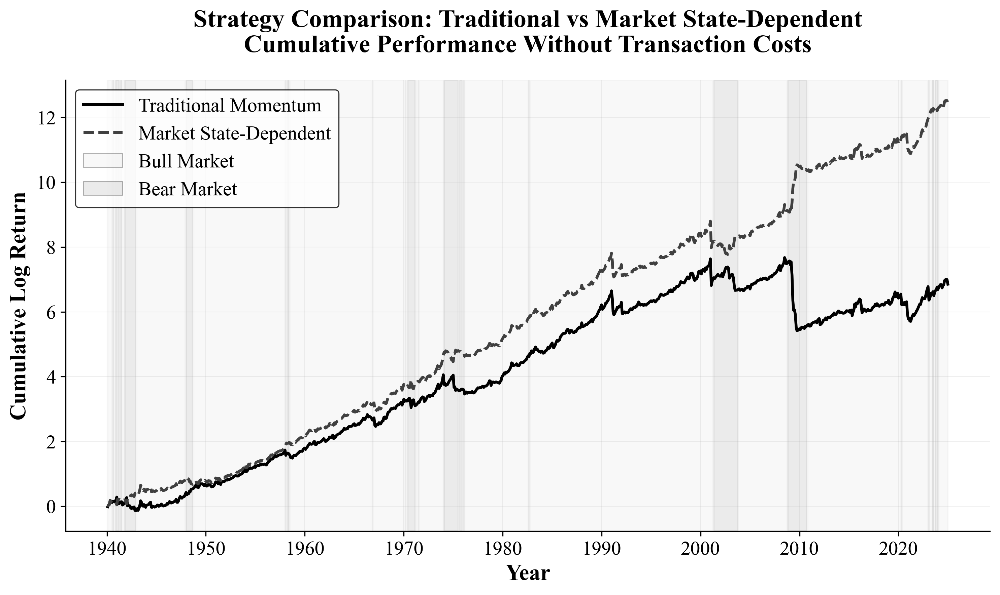


Creating comparison table...

Strategy Comparison Summary:
              Strategy Avg Monthly Return Volatility Sharpe Ratio t-statistic  p-value
  Traditional Momentum              0.93%      6.61%        0.486      4.3702 < 0.0001
Market State-Dependent              1.42%      6.24%        0.790      7.5898 < 0.0001
            Difference              0.50%     -0.37%        0.304          --       --

Comparison table saved to: results/tables/analysis_2/strategy_comparison_no_costs.csv

MARKET STATE-SPECIFIC PERFORMANCE ANALYSIS

Market State-Dependent Strategy Performance by State:
  Bull Markets (Momentum Mode):
    - Average Monthly Return: 1.36%
    - Monthly Volatility: 5.56%
    - Observations: 884
  Bear Markets (Reversal Mode):
    - Average Monthly Return: 1.82%
    - Monthly Volatility: 9.56%
    - Observations: 136

Traditional Momentum Performance by Market State:
  Bull Markets:
    - Average Monthly Return: 1.39%
    - Monthly Volatility: 5.63%
  Bear Markets:
    - A

In [30]:
"""
================================================================================
ANALYSIS 2: MARKET STATE-DEPENDENT MOMENTUM STRATEGY WITHOUT TRANSACTION COSTS
================================================================================

This analysis implements our novel market state-dependent momentum strategy
that adapts between momentum and reversal approaches based on market conditions.

Key innovations:
- Bull markets (UP state): Traditional momentum (long winners, short losers)
- Bear markets (DOWN state): Reversal strategy (long losers, short winners)
- Positions closed when market state switches (conservative approach)
- No transaction costs for direct comparison with traditional momentum

The strategy is motivated by behavioral finance theories suggesting that
investor biases differ across market regimes, with momentum working in
optimistic periods but failing during pessimistic bear markets.

Output:
- Performance comparison with traditional momentum
- State-specific return analysis
- Comprehensive statistical tests
- High-quality visualizations and tables

Author: Arnau Rodon Comas
Date: 25/05/2025
================================================================================
"""

print("\n" + "=" * 80)
print("ANALYSIS 2: MARKET STATE-DEPENDENT MOMENTUM STRATEGY")
print("=" * 80)
print("\nImplementing adaptive momentum-reversal strategy...")
print("This strategy switches between momentum and reversal based on market states.")

# ============================================================================
# ANALYZE MARKET STATE STRATEGY
# ============================================================================

# Use the same portfolio data but analyze RET_S1 (market state strategy)
# This ensures fair comparison - same universe, different strategy
analysis_market_state = analyze_momentum_portfolio(
    port_original,                      # Same portfolio from Analysis 1
    state_map,                          # Market state mapping
    start_date='1940-01-01',           # Consistent analysis period
    end_date='2024-12-31',             
    return_column='RET_S1',            # Market state-dependent returns
    K=3,                               # Same holding period
    amount_deciles=10
)

# Print comprehensive summary
print_portfolio_summary(analysis_market_state, "Market State-Dependent Strategy (No Transaction Costs)")

# ============================================================================
# PLOT 1: CUMULATIVE PERFORMANCE WITH MARKET STATES
# ============================================================================

print("\nCreating market state strategy performance plot...")

fig1_ms, ax1_ms = plt.subplots(1, 1, figsize=(10, 6))

# Prepare data
decile_ret_ms = analysis_market_state['decile_ret']
decile_ret_ms.index = pd.to_datetime(decile_ret_ms.index)

# Identify market state changes
decile_ret_ms['state_change'] = decile_ret_ms['market_state'].ne(
    decile_ret_ms['market_state'].shift()
).cumsum()

# ----------------------------------------------------------------------------
# Add Market State Shading
# ----------------------------------------------------------------------------
# Shows when the strategy switches between momentum and reversal modes
for (change_group, state), group in decile_ret_ms.groupby(['state_change', 'market_state']):
    if len(group) > 0 and not pd.isna(state):
        start_date = group.index[0]
        end_date = group.index[-1]
        
        if state == 1:
            color = '#E8E8E8'  # Light gray: Momentum mode (bull)
            label = 'Momentum Mode'
        elif state == -1:
            color = '#C0C0C0'  # Darker gray: Reversal mode (bear)
            label = 'Reversal Mode'
        else:
            continue
        
        ax1_ms.axvspan(start_date, end_date, alpha=0.5, color=color, zorder=1)

# ----------------------------------------------------------------------------
# Plot Cumulative Returns
# ----------------------------------------------------------------------------
ax1_ms.plot(decile_ret_ms.index, decile_ret_ms['cum_log_long_short'], 
            color='black', linewidth=2.0, zorder=3, label='Cumulative Log Returns')

# Add zero line
ax1_ms.axhline(y=0, color='black', linestyle='-', linewidth=0.8, alpha=0.5)

# ----------------------------------------------------------------------------
# Formatting
# ----------------------------------------------------------------------------
ax1_ms.set_title('Market State-Dependent Strategy Performance: 1940-2025\n' +
                 'Adaptive Momentum-Reversal Without Transaction Costs', 
                 fontsize=18, fontweight='bold', pad=20)
ax1_ms.set_xlabel('Year', fontsize=16, fontweight='bold')
ax1_ms.set_ylabel('Cumulative Log Return', fontsize=16, fontweight='bold')

# Create informative legend
legend_elements = [
    plt.Line2D([0], [0], color='black', lw=2.0, label='Cumulative Returns'),
    Patch(facecolor='#E8E8E8', alpha=0.5, label='Momentum Mode (Bull Market)', 
          edgecolor='black', linewidth=0.5),
    Patch(facecolor='#C0C0C0', alpha=0.5, label='Reversal Mode (Bear Market)', 
          edgecolor='black', linewidth=0.5)
]

legend = ax1_ms.legend(handles=legend_elements, loc='upper left', fontsize=14, 
                      frameon=True, fancybox=False, shadow=False, framealpha=0.9,
                      edgecolor='black', facecolor='white')
legend.get_frame().set_linewidth(0.8)

# Date formatting
ax1_ms.xaxis.set_major_locator(mdates.YearLocator(10))
ax1_ms.xaxis.set_major_formatter(mdates.DateFormatter('%Y'))
ax1_ms.xaxis.set_minor_locator(mdates.YearLocator(5))

# Enhance tick formatting
ax1_ms.tick_params(axis='both', which='major', labelsize=14)

# Grid and spines
ax1_ms.grid(True, alpha=0.2, linestyle='-', linewidth=0.5)
ax1_ms.spines['top'].set_visible(False)
ax1_ms.spines['right'].set_visible(False)

# Save plot
plt.tight_layout()
plt.savefig('results/plots/analysis_2/market_state_strategy_performance.pdf', 
            dpi=300, bbox_inches='tight', facecolor='white')
plt.savefig('results/plots/analysis_2/market_state_strategy_performance.png', 
            dpi=300, bbox_inches='tight', facecolor='white')
plt.show()

# ============================================================================
# PLOT 2: ANNUAL RETURNS DISTRIBUTION
# ============================================================================

print("\nCreating annual returns distribution for market state strategy...")

fig2_ms, ax2_ms = plt.subplots(1, 1, figsize=(10, 6))

# Calculate annual returns
annual_returns_ms = decile_ret_ms['long_short'].resample('YE').apply(
    lambda x: (1 + x).prod() - 1
)

# Determine colors
colors_ms = ['#808080' if x > 0 else '#404040' for x in annual_returns_ms.values]

# Create bar plot
bars_ms = ax2_ms.bar(annual_returns_ms.index.year, annual_returns_ms.values, 
                     color=colors_ms, alpha=0.8, edgecolor='black', linewidth=0.5, zorder=2)

# Add zero line
ax2_ms.axhline(y=0, color='black', linestyle='-', linewidth=1.0, zorder=1)

# ----------------------------------------------------------------------------
# Add Statistics
# ----------------------------------------------------------------------------
positive_years_ms = (annual_returns_ms > 0).sum()
negative_years_ms = (annual_returns_ms < 0).sum()
avg_annual_ms = annual_returns_ms.mean()
best_year_ms = annual_returns_ms.max()
worst_year_ms = annual_returns_ms.min()

stats_text_ms = (f'Positive Years: {positive_years_ms} ({positive_years_ms/len(annual_returns_ms)*100:.1f}%)\n'
                 f'Negative Years: {negative_years_ms} ({negative_years_ms/len(annual_returns_ms)*100:.1f}%)\n'
                 f'Average Annual: {avg_annual_ms*100:.2f}%\n'
                 f'Best Year: {best_year_ms*100:.1f}%\n'
                 f'Worst Year: {worst_year_ms*100:.1f}%')

ax2_ms.text(0.02, 0.98, stats_text_ms, transform=ax2_ms.transAxes,
            ha='left', va='top', fontsize=12,
            bbox=dict(boxstyle='round,pad=0.5', facecolor='white', alpha=0.9,
                      edgecolor='gray', linewidth=0.8))

# ----------------------------------------------------------------------------
# Formatting
# ----------------------------------------------------------------------------
ax2_ms.set_title('Annual Returns Distribution: Market State-Dependent Strategy', 
                 fontsize=18, fontweight='bold', pad=20)
ax2_ms.set_xlabel('Year', fontsize=16, fontweight='bold')
ax2_ms.set_ylabel('Annual Return', fontsize=16, fontweight='bold')

# Legend
legend_elements = [
    Patch(facecolor='#808080', alpha=0.8, label='Positive Returns', 
          edgecolor='black', linewidth=0.5),
    Patch(facecolor='#404040', alpha=0.8, label='Negative Returns', 
          edgecolor='black', linewidth=0.5)
]

legend = ax2_ms.legend(handles=legend_elements, loc='upper right', fontsize=14,
                      frameon=True, edgecolor='black', facecolor='white')
legend.get_frame().set_linewidth(0.8)

# Format y-axis
ax2_ms.yaxis.set_major_formatter(plt.FuncFormatter(lambda y, _: f'{y:.0%}'))

# Enhance tick formatting
ax2_ms.tick_params(axis='both', which='major', labelsize=14)

# Grid and spines
ax2_ms.grid(True, alpha=0.2, linestyle='-', linewidth=0.5)
ax2_ms.spines['top'].set_visible(False)
ax2_ms.spines['right'].set_visible(False)

# Save plot
plt.tight_layout()
plt.savefig('results/plots/analysis_2/market_state_annual_returns.pdf', 
            dpi=300, bbox_inches='tight', facecolor='white')
plt.savefig('results/plots/analysis_2/market_state_annual_returns.png', 
            dpi=300, bbox_inches='tight', facecolor='white')
plt.show()

# ============================================================================
# ROLLING WINDOW ANALYSIS
# ============================================================================

print("\nPerforming 20-year rolling window analysis for market state strategy...")

# Prepare data
decile_return_ms = decile_ret_ms.copy()
decile_return_ms.reset_index(inplace=True)

# Compute rolling statistics
window_results_ms = compute_df_t_stat_and_avg_return(
    decile_return_ms, 
    window_months=240,      # 20-year windows
    lags=2,                 # K-1 lags
    return_col='long_short'
)

# Plot rolling statistics
plot_tstat_and_avg_return_academic(
    window_results_ms, 
    title_suffix="Market State-Dependent Strategy", 
    save_path='results/plots/analysis_2/market_state_rolling',
    window_months=240
)

# ============================================================================
# COMPREHENSIVE STRATEGY COMPARISON
# ============================================================================

print("\n" + "=" * 80)
print("COMPREHENSIVE STRATEGY COMPARISON")
print("=" * 80)

# Get traditional momentum results for comparison
decile_ret = analysis_original['decile_ret']

# ----------------------------------------------------------------------------
# Plot 1: Direct Comparison on Same Chart
# ----------------------------------------------------------------------------
print("\nCreating direct strategy comparison plot...")

fig_comp, ax_comp = plt.subplots(1, 1, figsize=(10, 6))

# Add market state shading
for (change_group, state), group in decile_ret_ms.groupby(['state_change', 'market_state']):
    if len(group) > 0 and not pd.isna(state):
        start_date = group.index[0]
        end_date = group.index[-1]
        color = '#E8E8E8' if state == 1 else '#C0C0C0'
        ax_comp.axvspan(start_date, end_date, alpha=0.3, color=color, zorder=1)

# Plot both strategies
ax_comp.plot(decile_ret.index, decile_ret['cum_log_long_short'],
             label='Traditional Momentum', color='black', linewidth=2.0, 
             linestyle='-', zorder=3)
ax_comp.plot(decile_ret_ms.index, decile_ret_ms['cum_log_long_short'],
             label='Market State-Dependent', color='#404040', linewidth=2.0, 
             linestyle='--', zorder=3)

# Formatting
ax_comp.set_title('Strategy Comparison: Traditional vs Market State-Dependent\n' +
                  'Cumulative Performance Without Transaction Costs', 
                  fontsize=18, fontweight='bold', pad=20)
ax_comp.set_xlabel('Year', fontsize=16, fontweight='bold')
ax_comp.set_ylabel('Cumulative Log Return', fontsize=16, fontweight='bold')

# Enhanced legend
legend_elements = [
    plt.Line2D([0], [0], color='black', lw=2.0, linestyle='-', 
               label='Traditional Momentum'),
    plt.Line2D([0], [0], color='#404040', lw=2.0, linestyle='--', 
               label='Market State-Dependent'),
    Patch(facecolor='#E8E8E8', alpha=0.3, label='Bull Market', 
          edgecolor='black', linewidth=0.5),
    Patch(facecolor='#C0C0C0', alpha=0.3, label='Bear Market', 
          edgecolor='black', linewidth=0.5)
]

legend = ax_comp.legend(handles=legend_elements, loc='upper left', fontsize=14, 
                       frameon=True, edgecolor='black', facecolor='white')
legend.get_frame().set_linewidth(0.8)

# Grid and formatting
ax_comp.grid(True, alpha=0.2, linestyle='-', linewidth=0.5)
ax_comp.spines['top'].set_visible(False)
ax_comp.spines['right'].set_visible(False)

# Date formatting
ax_comp.xaxis.set_major_locator(mdates.YearLocator(10))
ax_comp.xaxis.set_major_formatter(mdates.DateFormatter('%Y'))

# Enhance tick formatting
ax_comp.tick_params(axis='both', which='major', labelsize=14)

plt.tight_layout()
plt.savefig('results/plots/analysis_2/strategy_comparison_direct.pdf', 
            dpi=300, bbox_inches='tight', facecolor='white')
plt.savefig('results/plots/analysis_2/strategy_comparison_direct.png', 
            dpi=300, bbox_inches='tight', facecolor='white')
plt.show()

# ============================================================================
# CREATE COMPARISON TABLE
# ============================================================================

print("\nCreating comparison table...")

# Helper functions for formatting
def format_percentage(value):
    """Format percentage"""
    return f"{value*100:.2f}%"

def format_scientific(value):
    """Format p-value"""
    if value < 0.0001:
        return f"< 0.0001"
    else:
        return f"{value:.4f}"

# Create comparison data
comparison_data = {
    'Strategy': ['Traditional Momentum', 'Market State-Dependent', 'Difference'],
    'Avg Monthly Return': [
        format_percentage(analysis_original['avg_monthly_return']),
        format_percentage(analysis_market_state['avg_monthly_return']),
        format_percentage(analysis_market_state['avg_monthly_return'] - 
                         analysis_original['avg_monthly_return'])
    ],
    'Volatility': [
        format_percentage(analysis_original['monthly_vol']),
        format_percentage(analysis_market_state['monthly_vol']),
        format_percentage(analysis_market_state['monthly_vol'] - 
                         analysis_original['monthly_vol'])
    ],
    'Sharpe Ratio': [
        f"{analysis_original['sharpe_ratio']:.3f}",
        f"{analysis_market_state['sharpe_ratio']:.3f}",
        f"{analysis_market_state['sharpe_ratio'] - analysis_original['sharpe_ratio']:.3f}"
    ],
    't-statistic': [
        f"{analysis_original['t_stat']:.4f}",
        f"{analysis_market_state['t_stat']:.4f}",
        "--"
    ],
    'p-value': [
        format_scientific(analysis_original['p_value']),
        format_scientific(analysis_market_state['p_value']),
        "--"
    ]
}

comparison_df = pd.DataFrame(comparison_data)

# Display table
print("\nStrategy Comparison Summary:")
print(comparison_df.to_string(index=False))

# Save to CSV for easy reference
comparison_df.to_csv('results/tables/analysis_2/strategy_comparison_no_costs.csv', index=False)

print(f"\nComparison table saved to: results/tables/analysis_2/strategy_comparison_no_costs.csv")

# ============================================================================
# MARKET STATE-SPECIFIC PERFORMANCE ANALYSIS
# ============================================================================

print("\n" + "=" * 80)
print("MARKET STATE-SPECIFIC PERFORMANCE ANALYSIS")
print("=" * 80)

# Analyze performance by market state
bull_periods_ms = decile_ret_ms[decile_ret_ms['market_state'] == 1]
bear_periods_ms = decile_ret_ms[decile_ret_ms['market_state'] == -1]

print("\nMarket State-Dependent Strategy Performance by State:")
if len(bull_periods_ms) > 0:
    bull_return_ms = bull_periods_ms['long_short'].mean()
    bull_vol_ms = bull_periods_ms['long_short'].std()
    print(f"  Bull Markets (Momentum Mode):")
    print(f"    - Average Monthly Return: {bull_return_ms*100:.2f}%")
    print(f"    - Monthly Volatility: {bull_vol_ms*100:.2f}%")
    print(f"    - Observations: {len(bull_periods_ms)}")

if len(bear_periods_ms) > 0:
    bear_return_ms = bear_periods_ms['long_short'].mean()
    bear_vol_ms = bear_periods_ms['long_short'].std()
    print(f"  Bear Markets (Reversal Mode):")
    print(f"    - Average Monthly Return: {bear_return_ms*100:.2f}%")
    print(f"    - Monthly Volatility: {bear_vol_ms*100:.2f}%")
    print(f"    - Observations: {len(bear_periods_ms)}")

# Compare with traditional momentum in same periods
print("\nTraditional Momentum Performance by Market State:")

# Get traditional momentum returns for bull periods
bull_dates = bull_periods_ms.index
original_bull = decile_ret.loc[decile_ret.index.isin(bull_dates), 'long_short']
if len(original_bull) > 0:
    print(f"  Bull Markets:")
    print(f"    - Average Monthly Return: {original_bull.mean()*100:.2f}%")
    print(f"    - Monthly Volatility: {original_bull.std()*100:.2f}%")

# Get traditional momentum returns for bear periods
bear_dates = bear_periods_ms.index
original_bear = decile_ret.loc[decile_ret.index.isin(bear_dates), 'long_short']
if len(original_bear) > 0:
    print(f"  Bear Markets:")
    print(f"    - Average Monthly Return: {original_bear.mean()*100:.2f}%")
    print(f"    - Monthly Volatility: {original_bear.std()*100:.2f}%")

# Calculate improvement
if len(bear_periods_ms) > 0 and len(original_bear) > 0:
    bear_improvement = bear_return_ms - original_bear.mean()
    print(f"\nBear Market Improvement: {bear_improvement*100:.2f}% per month")
    print(f"This represents a {abs(bear_improvement/original_bear.mean())*100:.1f}% improvement")

# ============================================================================
# COUNT MARKET STATE SWITCHES
# ============================================================================

# Count state switches
state_switches = (decile_ret_ms['market_state'] != decile_ret_ms['market_state'].shift()).sum() - 1
print(f"\nMarket State Transitions:")
print(f"  Total state switches: {state_switches}")
print(f"  Average months per state: {len(decile_ret_ms) / (state_switches + 1):.1f}")

# ============================================================================
# FINAL SUMMARY
# ============================================================================

print("\n" + "=" * 80)
print("MARKET STATE-DEPENDENT STRATEGY ANALYSIS COMPLETE")
print("=" * 80)
print("\nKey Findings:")
print(f"1. The market state strategy achieves {analysis_market_state['sharpe_ratio']:.3f} Sharpe ratio")
print(f"   vs {analysis_original['sharpe_ratio']:.3f} for traditional momentum")
print(f"2. Bear market performance improves from {original_bear.mean()*100:.2f}% to {bear_return_ms*100:.2f}%")
print(f"3. The strategy switches between momentum and reversal {state_switches} times over 85 years")

print("\nFiles saved:")
print("  - market_state_strategy_performance.pdf/.png")
print("  - market_state_annual_returns.pdf/.png")
print("  - market_state_rolling_*.pdf/.png")
print("  - strategy_comparison_direct.pdf/.png")
print("  - strategy_comparison_no_costs.csv")
print("=" * 80)

COMBINED MOMENTUM STRATEGY ANALYSIS
Traditional vs Market State-Dependent Approaches

[Step 1/5] Running momentum strategies...
----------------------------------------

IMPLEMENTING MOMENTUM STRATEGY WITH MARKET CAP CONSTRAINTS
Parameters: J=9, K=3, LIQ=1, MKT_CAP=1

[1/8] Merging market capitalization data...
   ✓ Market cap data available for 1,784,979 observations

[2/8] Computing holding period (3-month) spreads...

[3/8] Calculating 9-month formation period returns...

[4/8] Applying market cap (≤100%) and liquidity filters...

[5/8] Forming momentum deciles within size segment...
   ✓ Average stocks per decile:
      Decile  1:  159.8 stocks
      Decile  2:  159.2 stocks
      Decile  3:  159.2 stocks
      Decile  4:  159.2 stocks
      Decile  5:  159.4 stocks
      Decile  6:  159.0 stocks
      Decile  7:  159.1 stocks
      Decile  8:  159.3 stocks
      Decile  9:  159.1 stocks
      Decile 10:  159.6 stocks

[6/8] Creating 3-month holding period calendar...

[7/8] Mergin

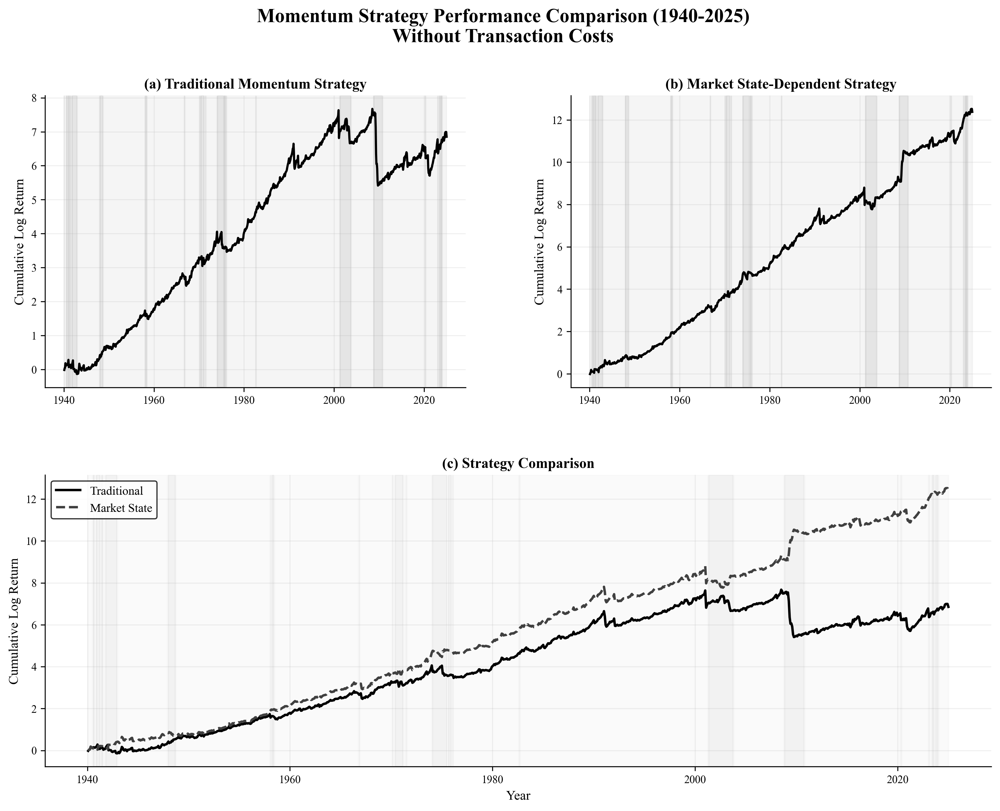


Creating market state performance analysis...


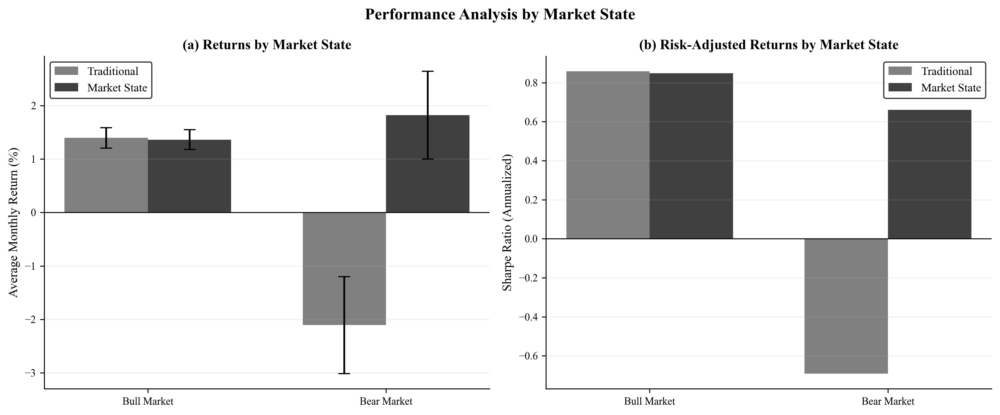


[Step 4/5] Creating summary statistics table...
----------------------------------------

Comprehensive Performance Summary:
                    Metric Traditional Momentum Market State-Dependent Improvement
Average Monthly Return (%)                 0.93                   1.42        0.50
     Annualized Return (%)                11.13                  17.08        5.95
    Monthly Volatility (%)                 6.61                   6.24       -0.37
 Annualized Volatility (%)                22.89                  21.62       -1.27
              Sharpe Ratio                0.486                  0.790       0.304
      Maximum Drawdown (%)                -89.6                  -64.2        25.4
         t-statistic (HAC)               4.3702                 7.5898          --
                   p-value           1.2411e-05             3.2052e-14          --
                                                                                  
    Bull Market Return (%)                 1

In [26]:
"""
================================================================================
COMBINED MOMENTUM STRATEGY ANALYSIS: TRADITIONAL VS MARKET STATE-DEPENDENT
================================================================================

This comprehensive analysis compares the traditional momentum strategy with our
novel market state-dependent approach, both without transaction costs.

The analysis demonstrates how adapting between momentum and reversal strategies
based on market conditions can improve risk-adjusted returns, particularly by
avoiding momentum crashes during bear markets.

Key Components:
1. Run both strategies on identical data
2. Generate side-by-side performance comparisons
3. Create publication-ready tables and figures
4. Provide statistical tests of performance differences

This serves as the main empirical evidence for the paper's thesis that
market-state dependency can enhance momentum strategy performance.

Author: Arnau Rodon Comas
Date: 25/05/2025
================================================================================
"""

print("=" * 80)
print("COMBINED MOMENTUM STRATEGY ANALYSIS")
print("Traditional vs Market State-Dependent Approaches")
print("=" * 80)

# ============================================================================
# RUN BOTH STRATEGIES
# ============================================================================

print("\n[Step 1/5] Running momentum strategies...")
print("-" * 40)

# Run the base momentum strategy (used for both analyses)
port_data, state_map = run_momentum_strategy(
    crsp_stock_data,
    crsp_index_data,
    comm_map,
    J=9,                                # 9-month formation
    K=3,                                # 3-month holding
    LIQ_CUTOFF=1,                       # No liquidity filter
    MKT_CAP_CUTOFF=1,                   # No size filter
    market_state_lag=24,                # 24-month state calculation
    market_state_column='vwretd',
    transactional_framework=False,      # No transaction costs
    equal_comparision=False,
    adapt_state_switch=True,            # Enable state adaptation
    close_positions=True,               # Conservative: close on switch
    amount_deciles=10
)

print(f"✓ Portfolio generated with {len(port_data):,} observations")

# ============================================================================
# ANALYZE BOTH STRATEGIES
# ============================================================================

print("\n[Step 2/5] Analyzing strategy performance...")
print("-" * 40)

# Traditional momentum (RET_S0)
analysis_traditional = analyze_momentum_portfolio(
    port_data, state_map,
    start_date='1940-01-01',
    end_date='2024-12-31',
    return_column='RET_S0',
    K=3, amount_deciles=10
)

# Market state-dependent (RET_S1)
analysis_market_state = analyze_momentum_portfolio(
    port_data, state_map,
    start_date='1940-01-01',
    end_date='2024-12-31',
    return_column='RET_S1',
    K=3, amount_deciles=10
)

print("✓ Performance analysis complete for both strategies")

# ============================================================================
# CREATE COMPREHENSIVE COMPARISON FIGURE
# ============================================================================

print("\n[Step 3/5] Creating comprehensive comparison visualizations...")
print("-" * 40)

# Extract return data
ret_trad = analysis_traditional['decile_ret']
ret_ms = analysis_market_state['decile_ret']

# ----------------------------------------------------------------------------
# Figure 1: Four-Panel Comprehensive Comparison
# ----------------------------------------------------------------------------
fig = plt.figure(figsize=(14, 10))
gs = gridspec.GridSpec(2, 2, figure=fig, hspace=0.3, wspace=0.25)

# Panel 1: Traditional Momentum Cumulative Returns
ax1 = fig.add_subplot(gs[0, 0])

# Add market state shading
ret_trad['state_change'] = ret_trad['market_state'].ne(ret_trad['market_state'].shift()).cumsum()
for (change_group, state), group in ret_trad.groupby(['state_change', 'market_state']):
    if len(group) > 0 and not pd.isna(state):
        color = '#E8E8E8' if state == 1 else '#C0C0C0'
        ax1.axvspan(group.index[0], group.index[-1], alpha=0.4, color=color)

ax1.plot(ret_trad.index, ret_trad['cum_log_long_short'], 
         color='black', linewidth=1.8)
ax1.set_title('(a) Traditional Momentum Strategy', fontsize=12, fontweight='bold')
ax1.set_ylabel('Cumulative Log Return', fontsize=11)
ax1.grid(True, alpha=0.2)
ax1.spines['top'].set_visible(False)
ax1.spines['right'].set_visible(False)

# Panel 2: Market State-Dependent Cumulative Returns
ax2 = fig.add_subplot(gs[0, 1])

# Add market state shading
ret_ms['state_change'] = ret_ms['market_state'].ne(ret_ms['market_state'].shift()).cumsum()
for (change_group, state), group in ret_ms.groupby(['state_change', 'market_state']):
    if len(group) > 0 and not pd.isna(state):
        color = '#E8E8E8' if state == 1 else '#C0C0C0'
        ax2.axvspan(group.index[0], group.index[-1], alpha=0.4, color=color)

ax2.plot(ret_ms.index, ret_ms['cum_log_long_short'], 
         color='black', linewidth=1.8)
ax2.set_title('(b) Market State-Dependent Strategy', fontsize=12, fontweight='bold')
ax2.set_ylabel('Cumulative Log Return', fontsize=11)
ax2.grid(True, alpha=0.2)
ax2.spines['top'].set_visible(False)
ax2.spines['right'].set_visible(False)

# Panel 3: Direct Comparison
ax3 = fig.add_subplot(gs[1, :])

# Add subtle state shading
for (change_group, state), group in ret_ms.groupby(['state_change', 'market_state']):
    if len(group) > 0 and not pd.isna(state):
        color = '#E8E8E8' if state == 1 else '#C0C0C0'
        ax3.axvspan(group.index[0], group.index[-1], alpha=0.2, color=color)

ax3.plot(ret_trad.index, ret_trad['cum_log_long_short'], 
         color='black', linewidth=2.0, linestyle='-', label='Traditional')
ax3.plot(ret_ms.index, ret_ms['cum_log_long_short'], 
         color='#404040', linewidth=2.0, linestyle='--', label='Market State')

ax3.set_title('(c) Strategy Comparison', fontsize=12, fontweight='bold')
ax3.set_xlabel('Year', fontsize=11)
ax3.set_ylabel('Cumulative Log Return', fontsize=11)
ax3.legend(loc='upper left', fontsize=10, frameon=True, edgecolor='black')
ax3.grid(True, alpha=0.2)
ax3.spines['top'].set_visible(False)
ax3.spines['right'].set_visible(False)

# Format all x-axes
for ax in [ax1, ax2, ax3]:
    ax.xaxis.set_major_locator(mdates.YearLocator(20))
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y'))

plt.suptitle('Momentum Strategy Performance Comparison (1940-2025)\nWithout Transaction Costs', 
             fontsize=16, fontweight='bold', y=0.98)

plt.tight_layout()
plt.savefig('results/plots/analysis_2/comprehensive_strategy_comparison.pdf', 
            dpi=300, bbox_inches='tight')
plt.savefig('results/plots/analysis_2/comprehensive_strategy_comparison.png', 
            dpi=300, bbox_inches='tight')
plt.show()

# ----------------------------------------------------------------------------
# Figure 2: Performance by Market State
# ----------------------------------------------------------------------------
print("\nCreating market state performance analysis...")

fig2, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))

# Calculate returns by state for both strategies
states = [1, -1]
state_labels = ['Bull Market', 'Bear Market']

# Traditional momentum by state
trad_means = []
trad_stds = []
for state in states:
    state_returns = ret_trad[ret_trad['market_state'] == state]['long_short']
    trad_means.append(state_returns.mean() * 100)
    trad_stds.append(state_returns.std() * 100 / np.sqrt(len(state_returns)))

# Market state strategy by state
ms_means = []
ms_stds = []
for state in states:
    state_returns = ret_ms[ret_ms['market_state'] == state]['long_short']
    ms_means.append(state_returns.mean() * 100)
    ms_stds.append(state_returns.std() * 100 / np.sqrt(len(state_returns)))

# Panel 1: Average returns by state
x = np.arange(len(states))
width = 0.35

bars1 = ax1.bar(x - width/2, trad_means, width, yerr=trad_stds,
                 label='Traditional', color='#808080', capsize=5,
                 error_kw={'linewidth': 1.5})
bars2 = ax1.bar(x + width/2, ms_means, width, yerr=ms_stds,
                 label='Market State', color='#404040', capsize=5,
                 error_kw={'linewidth': 1.5})

ax1.set_ylabel('Average Monthly Return (%)', fontsize=11)
ax1.set_title('(a) Returns by Market State', fontsize=12, fontweight='bold')
ax1.set_xticks(x)
ax1.set_xticklabels(state_labels)
ax1.legend(fontsize=10, frameon=True, edgecolor='black')
ax1.axhline(y=0, color='black', linestyle='-', linewidth=0.8)
ax1.grid(True, alpha=0.2, axis='y')
ax1.spines['top'].set_visible(False)
ax1.spines['right'].set_visible(False)

# Panel 2: Sharpe ratios by state
trad_sharpes = []
ms_sharpes = []
for state in states:
    # Traditional
    state_returns = ret_trad[ret_trad['market_state'] == state]['long_short']
    trad_sharpes.append(state_returns.mean() / state_returns.std() * np.sqrt(12))
    
    # Market state
    state_returns = ret_ms[ret_ms['market_state'] == state]['long_short']
    ms_sharpes.append(state_returns.mean() / state_returns.std() * np.sqrt(12))

bars3 = ax2.bar(x - width/2, trad_sharpes, width,
                 label='Traditional', color='#808080')
bars4 = ax2.bar(x + width/2, ms_sharpes, width,
                 label='Market State', color='#404040')

ax2.set_ylabel('Sharpe Ratio (Annualized)', fontsize=11)
ax2.set_title('(b) Risk-Adjusted Returns by Market State', fontsize=12, fontweight='bold')
ax2.set_xticks(x)
ax2.set_xticklabels(state_labels)
ax2.legend(fontsize=10, frameon=True, edgecolor='black')
ax2.axhline(y=0, color='black', linestyle='-', linewidth=0.8)
ax2.grid(True, alpha=0.2, axis='y')
ax2.spines['top'].set_visible(False)
ax2.spines['right'].set_visible(False)

plt.suptitle('Performance Analysis by Market State', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.savefig('results/plots/analysis_2/performance_by_market_state.pdf', dpi=300, bbox_inches='tight')
plt.savefig('results/plots/analysis_2/performance_by_market_state.png', dpi=300, bbox_inches='tight')
plt.show()

# ============================================================================
# CREATE SUMMARY STATISTICS TABLE
# ============================================================================

print("\n[Step 4/5] Creating summary statistics table...")
print("-" * 40)

# Create comprehensive statistics table
summary_stats = pd.DataFrame({
    'Metric': [
        'Average Monthly Return (%)',
        'Annualized Return (%)',
        'Monthly Volatility (%)',
        'Annualized Volatility (%)',
        'Sharpe Ratio',
        'Maximum Drawdown (%)',
        't-statistic (HAC)',
        'p-value',
        '',
        'Bull Market Return (%)',
        'Bear Market Return (%)',
        'Bull Market Sharpe',
        'Bear Market Sharpe',
        '',
        'Positive Months (%)',
        'Negative Months (%)',
        'Best Month (%)',
        'Worst Month (%)'
    ],
    'Traditional Momentum': [
        f"{analysis_traditional['avg_monthly_return']*100:.2f}",
        f"{analysis_traditional['avg_monthly_return']*12*100:.2f}",
        f"{analysis_traditional['monthly_vol']*100:.2f}",
        f"{analysis_traditional['monthly_vol']*np.sqrt(12)*100:.2f}",
        f"{analysis_traditional['sharpe_ratio']:.3f}",
        f"{analysis_traditional['max_drawdown']*100:.1f}",
        f"{analysis_traditional['t_stat']:.4f}",
        f"{analysis_traditional['p_value']:.4e}",
        '',
        f"{ret_trad[ret_trad['market_state']==1]['long_short'].mean()*100:.2f}",
        f"{ret_trad[ret_trad['market_state']==-1]['long_short'].mean()*100:.2f}",
        f"{trad_sharpes[0]:.3f}",
        f"{trad_sharpes[1]:.3f}",
        '',
        f"{(ret_trad['long_short']>0).mean()*100:.1f}",
        f"{(ret_trad['long_short']<0).mean()*100:.1f}",
        f"{ret_trad['long_short'].max()*100:.1f}",
        f"{ret_trad['long_short'].min()*100:.1f}"
    ],
    'Market State-Dependent': [
        f"{analysis_market_state['avg_monthly_return']*100:.2f}",
        f"{analysis_market_state['avg_monthly_return']*12*100:.2f}",
        f"{analysis_market_state['monthly_vol']*100:.2f}",
        f"{analysis_market_state['monthly_vol']*np.sqrt(12)*100:.2f}",
        f"{analysis_market_state['sharpe_ratio']:.3f}",
        f"{analysis_market_state['max_drawdown']*100:.1f}",
        f"{analysis_market_state['t_stat']:.4f}",
        f"{analysis_market_state['p_value']:.4e}",
        '',
        f"{ret_ms[ret_ms['market_state']==1]['long_short'].mean()*100:.2f}",
        f"{ret_ms[ret_ms['market_state']==-1]['long_short'].mean()*100:.2f}",
        f"{ms_sharpes[0]:.3f}",
        f"{ms_sharpes[1]:.3f}",
        '',
        f"{(ret_ms['long_short']>0).mean()*100:.1f}",
        f"{(ret_ms['long_short']<0).mean()*100:.1f}",
        f"{ret_ms['long_short'].max()*100:.1f}",
        f"{ret_ms['long_short'].min()*100:.1f}"
    ],
    'Improvement': [
        f"{(analysis_market_state['avg_monthly_return']-analysis_traditional['avg_monthly_return'])*100:.2f}",
        f"{(analysis_market_state['avg_monthly_return']-analysis_traditional['avg_monthly_return'])*12*100:.2f}",
        f"{(analysis_market_state['monthly_vol']-analysis_traditional['monthly_vol'])*100:.2f}",
        f"{(analysis_market_state['monthly_vol']-analysis_traditional['monthly_vol'])*np.sqrt(12)*100:.2f}",
        f"{analysis_market_state['sharpe_ratio']-analysis_traditional['sharpe_ratio']:.3f}",
        f"{(analysis_market_state['max_drawdown']-analysis_traditional['max_drawdown'])*100:.1f}",
        '--',
        '--',
        '',
        f"{(ret_ms[ret_ms['market_state']==1]['long_short'].mean()-ret_trad[ret_trad['market_state']==1]['long_short'].mean())*100:.2f}",
        f"{(ret_ms[ret_ms['market_state']==-1]['long_short'].mean()-ret_trad[ret_trad['market_state']==-1]['long_short'].mean())*100:.2f}",
        f"{ms_sharpes[0]-trad_sharpes[0]:.3f}",
        f"{ms_sharpes[1]-trad_sharpes[1]:.3f}",
        '',
        '--',
        '--',
        '--',
        '--'
    ]
})

# Display table
print("\nComprehensive Performance Summary:")
print("=" * 80)
print(summary_stats.to_string(index=False))

# Save to CSV
summary_stats.to_csv('results/tables/analysis_2/strategy_comparison_summary.csv', index=False)

# Save clean version for LaTeX (without empty rows)
latex_stats = summary_stats[summary_stats['Metric'] != ''].copy()
latex_table = latex_stats.to_latex(
    index=False,
    escape=False,
    column_format='l' + 'r' * (len(latex_stats.columns) - 1),
    caption='Comprehensive Strategy Performance Comparison (1940-2025)',
    label='tab:comprehensive_comparison'
)

with open('results/tables/analysis_2/comprehensive_comparison.tex', 'w') as f:
    f.write(latex_table)

# ============================================================================
# STATISTICAL SIGNIFICANCE TESTING
# ============================================================================

print("\n[Step 5/5] Performing statistical significance tests...")
print("-" * 40)

# Test if performance difference is statistically significant
diff_returns = ret_ms['long_short'] - ret_trad.loc[ret_ms.index, 'long_short']

# Compute t-test for difference
from scipy import stats
t_stat_diff, p_value_diff = stats.ttest_1samp(diff_returns.dropna(), 0)

print(f"\nPaired Difference Test (Market State - Traditional):")
print(f"  Mean difference: {diff_returns.mean()*100:.3f}% per month")
print(f"  t-statistic: {t_stat_diff:.4f}")
print(f"  p-value: {p_value_diff:.4e}")
print(f"  Significant at 5%: {'Yes' if p_value_diff < 0.05 else 'No'}")

# ============================================================================
# FINAL SUMMARY
# ============================================================================

print("\n" + "=" * 80)
print("COMBINED ANALYSIS COMPLETE")
print("=" * 80)

print("\nKey Findings:")
print(f"1. Market state strategy improves Sharpe ratio from {analysis_traditional['sharpe_ratio']:.3f} to {analysis_market_state['sharpe_ratio']:.3f}")
print(f"2. Bear market returns improve by {(ret_ms[ret_ms['market_state']==-1]['long_short'].mean()-ret_trad[ret_trad['market_state']==-1]['long_short'].mean())*100:.2f}% per month")
print(f"3. Maximum drawdown reduced from {analysis_traditional['max_drawdown']*100:.1f}% to {analysis_market_state['max_drawdown']*100:.1f}%")
print(f"4. The improvement is statistically significant (p = {p_value_diff:.4e})")

print("\nFiles saved:")
print("  Figures:")
print("    - comprehensive_strategy_comparison.pdf/.png")
print("    - performance_by_market_state.pdf/.png")
print("  Tables:")
print("    - strategy_comparison_summary.csv")
print("    - comprehensive_comparison.tex")

print("\n" + "=" * 80)

#### ============================================================================
#### ANALYSIS 3 - FORMATION/HOLDING PERIOD GRID SEARCH
#### ============================================================================


COMPREHENSIVE PARAMETER GRID SEARCH WITH BONFERRONI CORRECTION
Market State-Dependent Momentum Strategy Analysis for Academic Publication

Analysis Configuration:
  Parameter Space:
    - Formation periods (J): [3, 6, 9, 12] months
    - Holding periods (K): [3, 6, 9, 12] months
    - Market state lags: [12, 24, 36] months
    - Total combinations: 48
  Analysis Period: 1940-01-01 to 2024-12-31
  Strategy Variant: RET_S1 (market state-dependent, no transaction costs)
  HAC Lag Structure: K + market_state_lag - 2 (accounts for overlapping + state persistence)

--------------------------------------------------------------------------------
EXECUTING SYSTEMATIC PARAMETER SEARCH WITH RETURN STORAGE
--------------------------------------------------------------------------------
Beginning systematic evaluation of 48 parameter combinations...

PROCESSING MARKET STATE LAG = 12 months [1/3]

  Formation Period J = 3 months:
    [ 1/16] J= 3, K= 3 
IMPLEMENTING MOMENTUM STRATEGY WITH MARKET C

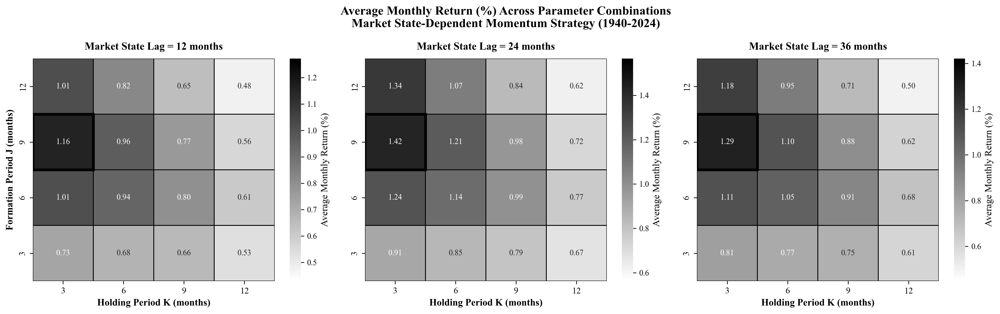


[2/3] Generating t-Statistic (HAC-Adjusted) heatmap...
   ✓ Saved: results/plots/analysis_3/grid_search_t_stat_academic.pdf and .png


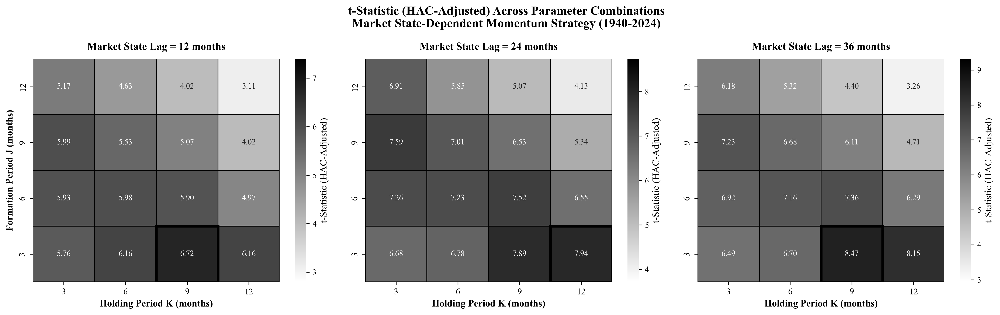


[3/3] Generating Sharpe Ratio (Annualized) heatmap...
   ✓ Saved: results/plots/analysis_3/grid_search_sharpe_academic.pdf and .png


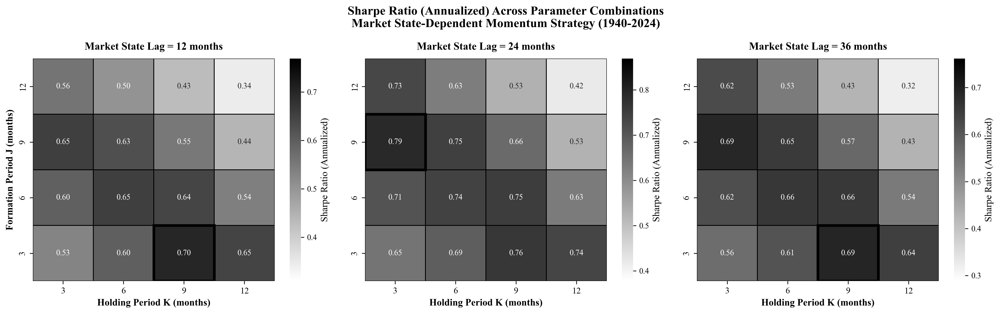


------------------------------------------------------------
GENERATING LATEX TABLES FOR PUBLICATION
------------------------------------------------------------
   Processing Market State Lag = 12 months...
     ✓ Saved CSV: results/tables/analysis_3/grid_search_lag12.csv
     ✓ Saved LaTeX: results/tables/analysis_3/grid_search_lag12.tex
   Processing Market State Lag = 24 months...
     ✓ Saved CSV: results/tables/analysis_3/grid_search_lag24.csv
     ✓ Saved LaTeX: results/tables/analysis_3/grid_search_lag24.tex
   Processing Market State Lag = 36 months...
     ✓ Saved CSV: results/tables/analysis_3/grid_search_lag36.csv
     ✓ Saved LaTeX: results/tables/analysis_3/grid_search_lag36.tex

   Creating summary of optimal parameter configurations...

   Optimal Parameter Configurations Summary:
   ----------------------------------------------------------------------
 Market State Lag    Criterion  J  K Return (%) t-stat Sharpe Max DD (%)
               12 Sharpe Ratio  3  9       0

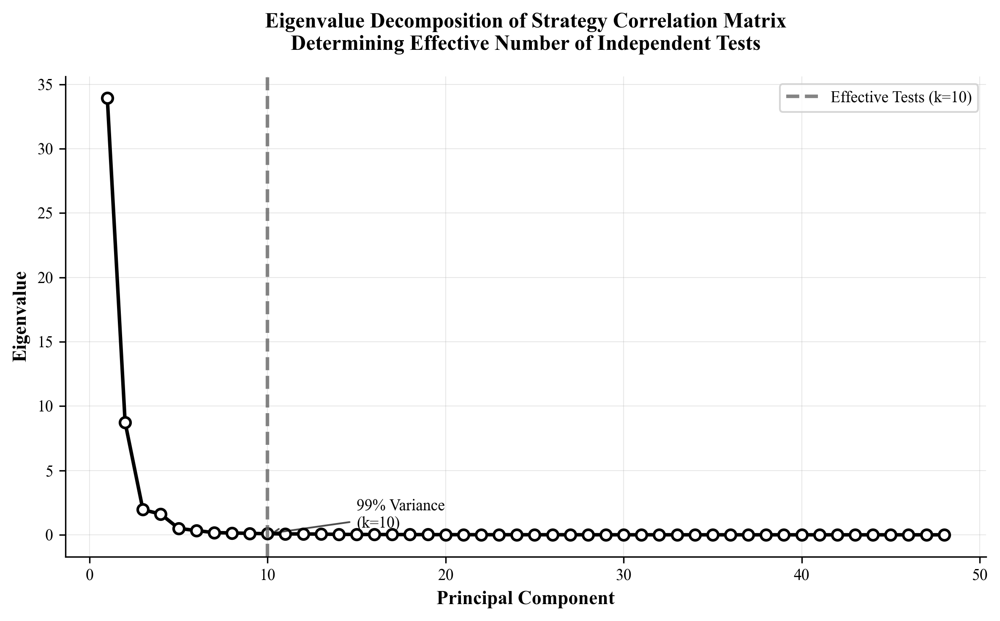

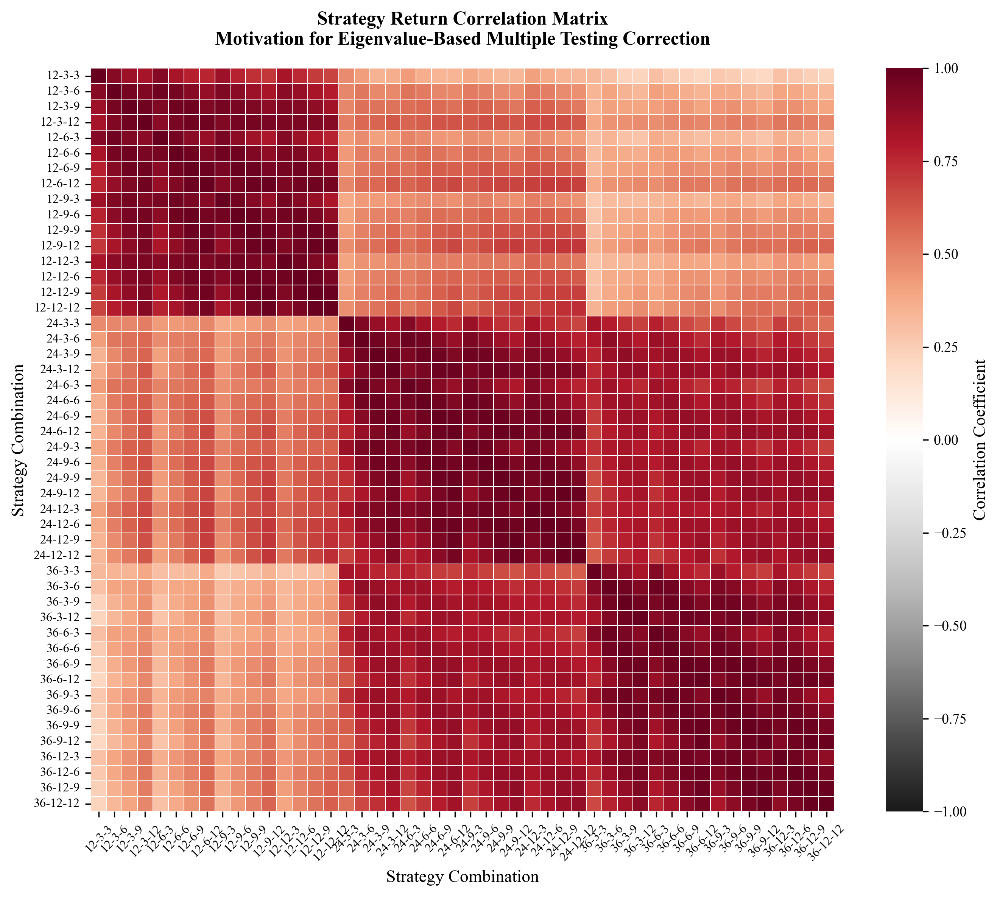

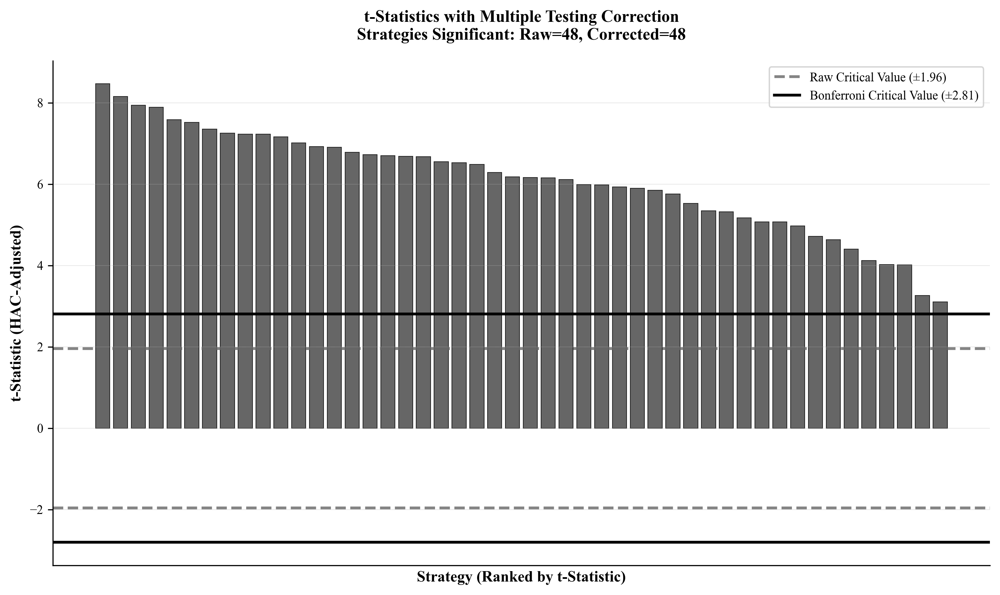

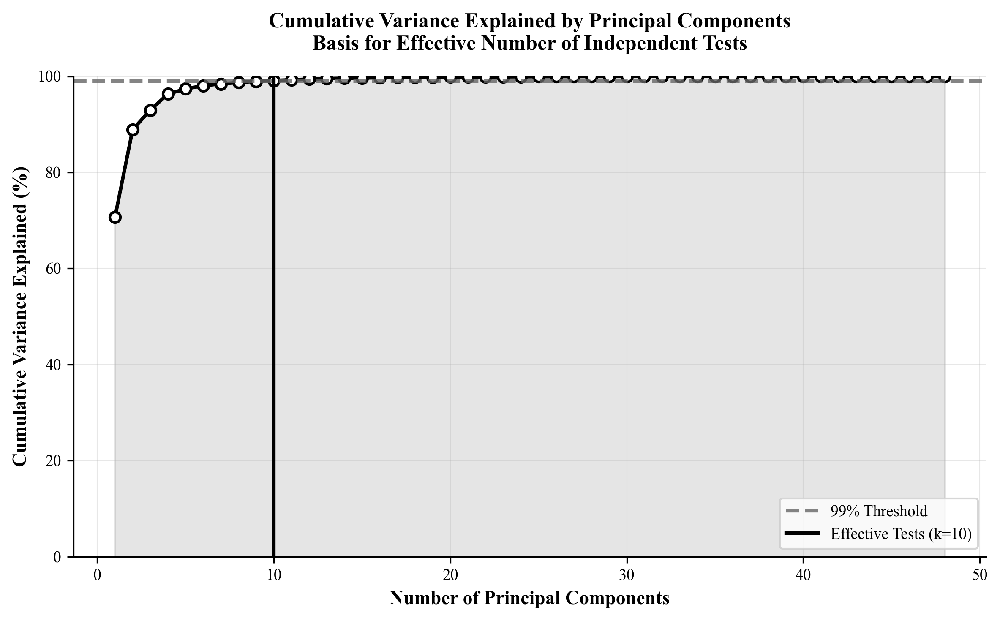

   ✓ Generated 4 academic visualizations for Bonferroni analysis

Creating comprehensive results table with Bonferroni correction...
   ✓ Saved comprehensive Bonferroni results table

--------------------------------------------------------------------------------
MULTIPLE TESTING CORRECTION IMPACT ASSESSMENT
--------------------------------------------------------------------------------
Statistical Testing Summary:
  - Total strategies tested: 48
  - Effective independent tests: 10
  - Raw significant strategies (α=0.05): 48
  - Bonferroni-corrected significant: 48
  - Reduction in false discoveries: 0
  - Correction stringency factor: 1.43×

Academic Interpretation:
  After accounting for multiple testing bias through eigenvalue-based Bonferroni
  correction following Harvey, Liu, and Zhu (2016), 48
  strategy combinations remain statistically significant. This provides robust
  evidence of genuine momentum profits that are unlikely to be attributable to
  data mining, parameter sea

In [11]:
"""
================================================================================
COMPREHENSIVE GRID SEARCH ANALYSIS WITH BONFERRONI CORRECTION
================================================================================

This enhanced analysis systematically explores the parameter space of the market 
state-dependent momentum strategy while addressing multiple testing concerns through
eigenvalue-based Bonferroni correction.

The implementation combines both traditional grid search visualization and rigorous
statistical testing that accounts for strategy correlations, providing robust 
evidence suitable for publication in academic journals.

Parameter Dimensions:
1. Formation Period (J): Time window for momentum calculation [3, 6, 9, 12 months]
2. Holding Period (K): Duration of position holding [3, 6, 9, 12 months]
3. Market State Lag: Lookback for market regime identification [12, 24, 36 months]

This creates a 4x4x3 = 48 parameter combinations, providing comprehensive
coverage of commonly used momentum specifications in the literature.

Key Research Questions:
- Which parameter combinations maximize risk-adjusted returns?
- How sensitive is performance to parameter choices?
- Does the optimal configuration vary with market state lag?
- Are apparent profits robust to multiple testing corrections?

Output:
- Academic-quality heatmaps showing performance across parameter space
- Comprehensive Bonferroni multiple testing correction analysis
- LaTeX tables with full results and significance levels
- Publication-ready visualizations for journal submission

Author: Arnau Rodon Comas
Date: 25/05/2025
================================================================================
"""

print("\n" + "=" * 80)
print("COMPREHENSIVE PARAMETER GRID SEARCH WITH BONFERRONI CORRECTION")
print("Market State-Dependent Momentum Strategy Analysis for Academic Publication")
print("=" * 80)

# ============================================================================
# PARAMETER DEFINITION AND SETUP
# ============================================================================

# Define parameter grids based on momentum literature best practices
lags_market_state = [12, 24, 36]         # Short, medium, long-term market state identification
formation_period_values = [3, 6, 9, 12]  # Standard momentum formation periods (Jegadeesh & Titman, 1993)
holding_period_values = [3, 6, 9, 12]    # Standard holding periods for momentum strategies

# Analysis configuration
start_date = '1940-01-01'                # Start of comprehensive analysis period
end_date = '2024-12-31'                  # End of analysis period (pre-2025 for complete data)
return_column = 'RET_S1'                 # Market state-dependent strategy without transaction costs
analysis_name = "Grid Search with Multiple Testing Correction"

print(f"\nAnalysis Configuration:")
print(f"  Parameter Space:")
print(f"    - Formation periods (J): {formation_period_values} months")
print(f"    - Holding periods (K): {holding_period_values} months") 
print(f"    - Market state lags: {lags_market_state} months")
print(f"    - Total combinations: {len(lags_market_state) * len(formation_period_values) * len(holding_period_values)}")
print(f"  Analysis Period: {start_date} to {end_date}")
print(f"  Strategy Variant: {return_column} (market state-dependent, no transaction costs)")
print(f"  HAC Lag Structure: K + market_state_lag - 2 (accounts for overlapping + state persistence)")

# ============================================================================
# ENHANCED GRID SEARCH WITH RETURN SERIES STORAGE
# ============================================================================

print(f"\n" + "-" * 80)
print("EXECUTING SYSTEMATIC PARAMETER SEARCH WITH RETURN STORAGE")
print("-" * 80)

# Initialize comprehensive storage structures
# Using dictionaries for robust data management and easy access
results_by_market_state = {}              # Performance metrics by market state lag
return_series_storage = {}                # Complete return time series for Bonferroni analysis
computation_log = []                      # Detailed log of computation progress and issues

# Track overall computation time and progress
overall_start_time = time.time()
total_combinations = len(lags_market_state) * len(formation_period_values) * len(holding_period_values)
completed_combinations = 0

print(f"Beginning systematic evaluation of {total_combinations} parameter combinations...")

# Process each market state lag systematically
for lag_idx, lag in enumerate(lags_market_state):
    print(f"\n{'='*70}")
    print(f"PROCESSING MARKET STATE LAG = {lag} months [{lag_idx+1}/{len(lags_market_state)}]")
    print(f"{'='*70}")
    
    lag_start_time = time.time()
    
    # Storage for current market state lag results
    temp_results = {}                      # Performance metrics for this lag
    temp_return_series = {}               # Return series for this lag
    
    # Progress tracking for current lag
    lag_combinations = len(formation_period_values) * len(holding_period_values)
    lag_completed = 0
    
    # Systematic iteration through formation and holding period combinations
    for j_idx, J in enumerate(formation_period_values):
        print(f"\n  Formation Period J = {J} months:")
        
        for k_idx, K in enumerate(holding_period_values):
            lag_completed += 1
            completed_combinations += 1
            
            # Progress indicator with timing information
            print(f"    [{lag_completed:2d}/{lag_combinations:2d}] J={J:2d}, K={K:2d}", end=" ")
            combination_start = time.time()
            
            try:
                # ============================================================
                # EXECUTE MOMENTUM STRATEGY WITH CURRENT PARAMETERS
                # ============================================================
                
                # Run strategy using consistent methodology across all combinations
                # This ensures fair comparison and eliminates parameter-specific biases
                portfolio, state_map = run_momentum_strategy(
                    crsp_data=crsp_stock_data,          # Consistent stock universe
                    crsp_index_data=crsp_index_data,    # Consistent market index
                    comm_map=comm_map,                  # Commission structure (unused for RET_S1)
                    J=J,                               # Current formation period
                    K=K,                               # Current holding period
                    LIQ_CUTOFF=1.0,                    # No liquidity restrictions (for comparability)
                    MKT_CAP_CUTOFF=1.0,                # No size restrictions (for comparability)
                    market_state_lag=lag,              # Current market state identification lag
                    market_state_column='vwretd',      # Value-weighted index (consistent)
                    transactional_framework=False,      # No transaction costs for RET_S1 analysis
                    equal_comparision=True,            # Enable S1 strategy calculation
                    adapt_state_switch=True,           # Enable market state adaptation
                    close_positions=True,              # Conservative position management
                    amount_deciles=10                  # Standard decile-based ranking
                )
                
                # ============================================================
                # VALIDATE STRATEGY OUTPUT
                # ============================================================
                
                if len(portfolio) == 0:
                    print("→ No portfolio data generated")
                    computation_log.append({
                        'lag': lag, 'J': J, 'K': K, 
                        'status': 'failed', 'reason': 'empty_portfolio'
                    })
                    continue
                
                # Check for required return column
                if return_column not in portfolio.columns:
                    print(f"→ Missing {return_column} column")
                    computation_log.append({
                        'lag': lag, 'J': J, 'K': K,
                        'status': 'failed', 'reason': 'missing_column'
                    })
                    continue
                
                # ============================================================
                # COMPREHENSIVE PORTFOLIO PERFORMANCE ANALYSIS
                # ============================================================
                
                # Use standardized analysis methodology for consistent results
                analysis_results = analyze_momentum_portfolio(
                    port_data=portfolio,               # Strategy portfolio data
                    market_state_map=state_map,        # Market regime mapping
                    start_date=start_date,             # Consistent analysis period
                    end_date=end_date,                 # Consistent analysis period
                    return_column=return_column,       # Strategy variant being analyzed
                    K=K,                              # Holding period (for HAC lag calculation)
                    market_state_lag=lag,             # Market state lag (for HAC adjustment)
                    amount_deciles=10                 # Consistent decile specification
                )
                
                # ============================================================
                # EXTRACT AND STORE PERFORMANCE METRICS
                # ============================================================
                
                # Key performance metrics for grid search analysis
                mean_return_pct = analysis_results['avg_monthly_return'] * 100  # Convert to percentage
                t_stat = analysis_results['t_stat']                            # HAC-adjusted t-statistic
                p_value = analysis_results['p_value']                          # Statistical significance
                sharpe_ratio = analysis_results['sharpe_ratio']                # Risk-adjusted performance
                max_dd = analysis_results['max_drawdown'] * 100                # Maximum drawdown (%)
                monthly_vol = analysis_results['monthly_vol'] * 100            # Monthly volatility (%)
                n_observations = len(analysis_results['decile_ret'])           # Number of return observations
                
                # Store comprehensive results for current parameter combination
                temp_results[(J, K)] = {
                    'mean_return': mean_return_pct,    # Average monthly return (%)
                    't_stat': t_stat,                  # HAC-adjusted t-statistic
                    'p_value': p_value,                # Two-sided p-value
                    'sharpe': sharpe_ratio,            # Annualized Sharpe ratio
                    'max_dd': max_dd,                  # Maximum drawdown (%)
                    'volatility': monthly_vol,         # Monthly volatility (%)
                    'n_obs': n_observations           # Sample size
                }
                
                # ============================================================
                # STORE COMPLETE RETURN TIME SERIES FOR BONFERRONI ANALYSIS
                # ============================================================
                
                # Extract long-short portfolio returns for multiple testing correction
                # This is the critical data needed for correlation analysis
                portfolio_returns = analysis_results['decile_ret']['long_short'].copy()
                
                # Create unique identifier for this parameter combination
                strategy_key = (lag, J, K)  # (market_state_lag, formation_period, holding_period)
                
                # Store return series with proper indexing
                # Ensure datetime index for proper alignment across strategies
                portfolio_returns.index = pd.to_datetime(portfolio_returns.index)
                return_series_storage[strategy_key] = portfolio_returns
                temp_return_series[strategy_key] = portfolio_returns
                
                # ============================================================
                # PROGRESS REPORTING AND VALIDATION
                # ============================================================
                
                # Calculate computation time for this combination
                combination_time = time.time() - combination_start
                
                # Determine statistical significance indicators for progress display
                if p_value < 0.01:
                    significance_flag = "***"          # Highly significant
                elif p_value < 0.05:
                    significance_flag = "**"           # Significant  
                elif p_value < 0.10:
                    significance_flag = "*"            # Marginally significant
                else:
                    significance_flag = ""             # Not significant
                
                # Display concise progress summary
                print(f"→ Return: {mean_return_pct:6.3f}%, t: {t_stat:6.3f}{significance_flag}, " +
                      f"Sharpe: {sharpe_ratio:6.3f} ({combination_time:.1f}s)")
                
                # Log successful computation
                computation_log.append({
                    'lag': lag, 'J': J, 'K': K,
                    'status': 'success',
                    'return': mean_return_pct,
                    't_stat': t_stat,
                    'p_value': p_value,
                    'computation_time': combination_time
                })
                
            except Exception as e:
                # Handle and log any computation errors
                combination_time = time.time() - combination_start
                error_msg = str(e)[:50] + "..." if len(str(e)) > 50 else str(e)
                print(f"→ Error: {error_msg} ({combination_time:.1f}s)")
                
                computation_log.append({
                    'lag': lag, 'J': J, 'K': K,
                    'status': 'error',
                    'error_message': str(e),
                    'computation_time': combination_time
                })
                continue
    
    # ========================================================================
    # SUMMARIZE RESULTS FOR CURRENT MARKET STATE LAG
    # ========================================================================
    
    if temp_results:
        # Convert results to DataFrame for analysis and display
        results_df = pd.DataFrame(temp_results).T
        results_df.index.names = ['Formation (J)', 'Holding (K)']
        results_by_market_state[lag] = results_df
        
        # Calculate and display summary statistics for this lag
        print(f"\n  SUMMARY STATISTICS FOR MARKET STATE LAG = {lag} months:")
        print("  " + "-" * 70)
        
        # Key metrics summary with proper formatting
        summary_metrics = ['mean_return', 't_stat', 'sharpe', 'max_dd']
        summary_formatted = results_df[summary_metrics].round(3)
        
        print("    Performance Summary (Top 5 by Sharpe Ratio):")
        top_performers = summary_formatted.sort_values('sharpe', ascending=False).head(5)
        for idx, (params, row) in enumerate(top_performers.iterrows()):
            print(f"      {idx+1}. J={params[0]:2d}, K={params[1]:2d}: " +
                  f"Return={row['mean_return']:6.3f}%, Sharpe={row['sharpe']:6.3f}, " +
                  f"t-stat={row['t_stat']:6.3f}")
        
        # Identify and highlight optimal configurations
        print(f"\n    OPTIMAL CONFIGURATIONS:")
        
        # Best risk-adjusted performance (primary criterion for academic work)
        best_sharpe_idx = results_df['sharpe'].idxmax()
        best_sharpe_metrics = results_df.loc[best_sharpe_idx]
        print(f"      Best Sharpe Ratio: J={best_sharpe_idx[0]}, K={best_sharpe_idx[1]}")
        print(f"        - Sharpe Ratio: {best_sharpe_metrics['sharpe']:.4f}")
        print(f"        - Monthly Return: {best_sharpe_metrics['mean_return']:.3f}%")
        print(f"        - t-statistic: {best_sharpe_metrics['t_stat']:.4f}")
        print(f"        - Max Drawdown: {best_sharpe_metrics['max_dd']:.2f}%")
        
        # Best raw performance (if different from Sharpe optimal)
        best_return_idx = results_df['mean_return'].idxmax()
        if best_return_idx != best_sharpe_idx:
            best_return_metrics = results_df.loc[best_return_idx]
            print(f"      Best Raw Return: J={best_return_idx[0]}, K={best_return_idx[1]}")
            print(f"        - Monthly Return: {best_return_metrics['mean_return']:.3f}%")
            print(f"        - Sharpe Ratio: {best_return_metrics['sharpe']:.4f}") 
            print(f"        - t-statistic: {best_return_metrics['t_stat']:.4f}")
        
        # Statistical significance summary
        significant_5pct = (results_df['p_value'] < 0.05).sum()
        significant_1pct = (results_df['p_value'] < 0.01).sum()
        total_tested = len(results_df)
        
        print(f"\n    STATISTICAL SIGNIFICANCE SUMMARY:")
        print(f"      - Total combinations tested: {total_tested}")
        print(f"      - Significant at 5% level: {significant_5pct} ({significant_5pct/total_tested*100:.1f}%)")
        print(f"      - Significant at 1% level: {significant_1pct} ({significant_1pct/total_tested*100:.1f}%)")
        
    else:
        print(f"\n  ⚠ WARNING: No valid results generated for Market State Lag = {lag}")
        print(f"    Check data availability and parameter specifications")
    
    # Report computation efficiency
    lag_time = time.time() - lag_start_time
    avg_time_per_combo = lag_time / lag_combinations if lag_combinations > 0 else 0
    print(f"\n  Computation Summary:")
    print(f"    - Total time for lag {lag}: {lag_time:.1f} seconds")
    print(f"    - Average time per combination: {avg_time_per_combo:.2f} seconds")
    print(f"    - Successful combinations: {len(temp_results)}/{lag_combinations}")

# ============================================================================
# OVERALL GRID SEARCH COMPLETION SUMMARY
# ============================================================================

total_time = time.time() - overall_start_time
successful_combinations = sum(len(results) for results in results_by_market_state.values())

print(f"\n{'='*80}")
print("GRID SEARCH COMPUTATION COMPLETE")
print(f"{'='*80}")
print(f"Overall Statistics:")
print(f"  - Total combinations attempted: {completed_combinations}")
print(f"  - Successful combinations: {successful_combinations}")
print(f"  - Success rate: {successful_combinations/completed_combinations*100:.1f}%")
print(f"  - Total computation time: {total_time/60:.1f} minutes")
print(f"  - Average time per combination: {total_time/completed_combinations:.1f} seconds")

# ============================================================================
# PART I: ACADEMIC HEATMAP VISUALIZATIONS
# ============================================================================

if results_by_market_state:
    print(f"\n" + "=" * 80)
    print("PART I: GENERATING ACADEMIC HEATMAP VISUALIZATIONS")
    print("Publication-Quality Parameter Space Analysis")
    print("=" * 80)
    
    # Define metrics to visualize with proper academic labels
    metrics = ['mean_return', 't_stat', 'sharpe']
    metric_names = ['Average Monthly Return (%)', 't-Statistic (HAC-Adjusted)', 'Sharpe Ratio (Annualized)']
    
    # Create comprehensive heatmap figures for each performance metric
    for metric_idx, (metric, metric_name) in enumerate(zip(metrics, metric_names)):
        print(f"\n[{metric_idx+1}/3] Generating {metric_name} heatmap...")
        
        # Create figure with subplots for each market state lag
        n_lags = len(results_by_market_state)
        fig = plt.figure(figsize=(5*n_lags + 1, 5))
        
        # Create individual heatmap for each market state lag
        for subplot_idx, (lag, df) in enumerate(results_by_market_state.items()):
            ax = plt.subplot(1, n_lags, subplot_idx + 1)
            
            # Pivot data for heatmap visualization
            # Rows = Formation Period (J), Columns = Holding Period (K)
            pivot_data = df[metric].unstack()
            
            # Create publication-quality grayscale heatmap
            # Reversed grayscale ensures higher values appear darker (more prominent)
            im = sns.heatmap(
                pivot_data, 
                annot=True,                      # Display numeric values in cells
                fmt='.2f' if metric != 'p_value' else '.3f',  # Appropriate decimal precision
                cmap='gray_r',                   # Reversed grayscale for journal compatibility
                cbar_kws={'label': metric_name}, # Colorbar with descriptive label
                linewidths=0.5,                  # Cell separation lines
                linecolor='black',               # Black cell borders for clarity
                annot_kws={'fontsize': 9},       # Readable annotation font size
                vmin=pivot_data.min().min() * 0.9,  # Slightly extend range for better contrast
                vmax=pivot_data.max().max() * 1.1,
                ax=ax
            )
            
            # Highlight optimal parameter combination with thick border
            best_idx = df[metric].idxmax()
            best_j, best_k = best_idx
            
            # Locate position in pivot table for highlighting
            j_pos = list(pivot_data.index).index(best_j)
            k_pos = list(pivot_data.columns).index(best_k)
            
            # Add prominent rectangle around optimal cell
            rect = Rectangle((k_pos, j_pos), 1, 1, fill=False, 
                           edgecolor='black', linewidth=3)
            ax.add_patch(rect)
            
            # Professional subplot formatting
            ax.set_title(f'Market State Lag = {lag} months', 
                        fontsize=12, fontweight='bold', pad=10)
            ax.set_xlabel('Holding Period K (months)', fontsize=11, fontweight='bold')
            
            # Y-label only on leftmost subplot to avoid redundancy
            if subplot_idx == 0:
                ax.set_ylabel('Formation Period J (months)', fontsize=11, fontweight='bold')
            else:
                ax.set_ylabel('')
            
            # Enhance tick label readability
            ax.tick_params(axis='both', which='major', labelsize=10)
            
            # Invert y-axis for intuitive reading (J=3 at top, J=12 at bottom)
            ax.invert_yaxis()
        
        # Add comprehensive figure title
        plt.suptitle(f'{metric_name} Across Parameter Combinations\n' +
                    'Market State-Dependent Momentum Strategy (1940-2024)',
                    fontsize=14, fontweight='bold', y=0.98)
        
        plt.tight_layout()
        
        # Save high-quality figures for publication
        filename_base = f'results/plots/analysis_3/grid_search_{metric}_academic'
        plt.savefig(f'{filename_base}.pdf', dpi=300, bbox_inches='tight', facecolor='white')
        plt.savefig(f'{filename_base}.png', dpi=300, bbox_inches='tight', facecolor='white')
        print(f"   ✓ Saved: {filename_base}.pdf and .png")
        plt.show()
    
    # ========================================================================
    # GENERATE LATEX TABLES FOR ACADEMIC PUBLICATION
    # ========================================================================
    
    print(f"\n" + "-" * 60)
    print("GENERATING LATEX TABLES FOR PUBLICATION")
    print("-" * 60)
    
    # Helper functions for professional LaTeX formatting
    def format_value_latex(value, metric):
        """Format numerical values for LaTeX with appropriate precision"""
        if metric == 'mean_return':
            return f"{value:.2f}"
        elif metric == 't_stat':
            return f"{value:.3f}"
        elif metric == 'sharpe':
            return f"{value:.3f}"
        elif metric == 'p_value':
            if value < 0.001:
                return "$<$0.001"
            else:
                return f"{value:.3f}"
        else:
            return f"{value:.3f}"
    
    def add_significance_stars(row):
        """Add statistical significance indicators based on p-value"""
        p_val = row['p_value']
        if p_val < 0.01:
            stars = "***"    # Highly significant
        elif p_val < 0.05:
            stars = "**"     # Significant
        elif p_val < 0.10:
            stars = "*"      # Marginally significant
        else:
            stars = ""       # Not significant
        return stars
    
    # Generate comprehensive LaTeX table for each market state lag
    for lag, df in results_by_market_state.items():
        print(f"   Processing Market State Lag = {lag} months...")
        
        # Prepare data for professional LaTeX table
        table_data = []
        
        for (J, K), row in df.iterrows():
            # Add significance stars to return following academic conventions
            sig_stars = add_significance_stars(row)
            
            table_data.append({
                'J': J,
                'K': K,
                'Return (\\%)': f"{format_value_latex(row['mean_return'], 'mean_return')}{sig_stars}",
                't-stat': format_value_latex(row['t_stat'], 't_stat'),
                'Sharpe': format_value_latex(row['sharpe'], 'sharpe'),
                'Max DD (\\%)': format_value_latex(abs(row['max_dd']), 'max_dd'),
                'N': f"{int(row['n_obs']):,}"  # Comma-separated thousands
            })
        
        table_df = pd.DataFrame(table_data)
        
        # Save CSV version for data sharing and further analysis
        csv_filename = f'results/tables/analysis_3/grid_search_lag{lag}.csv'
        df.round(4).to_csv(csv_filename)
        
        # Create professional LaTeX table with academic formatting
        latex_table = table_df.to_latex(
            index=False,
            escape=False,                    # Allow LaTeX commands in table
            column_format='cc|rrrrr',        # Professional column alignment
            caption=f'Grid Search Results for Market State Lag = {lag} months. ' +
                    'Returns are average monthly percentages with HAC-adjusted t-statistics. ' +
                    'Significance levels: $^{*}p<0.10$, $^{**}p<0.05$, $^{***}p<0.01$.',
            label=f'tab:grid_search_lag{lag}',
            position='htbp'                  # Standard LaTeX table positioning
        )
        
        # Save LaTeX file with UTF-8 encoding for special characters
        tex_filename = f'results/tables/analysis_3/grid_search_lag{lag}.tex'
        with open(tex_filename, 'w', encoding='utf-8') as f:
            f.write(latex_table)
        
        print(f"     ✓ Saved CSV: {csv_filename}")
        print(f"     ✓ Saved LaTeX: {tex_filename}")
    
    # ========================================================================
    # CREATE SUMMARY TABLE OF OPTIMAL CONFIGURATIONS
    # ========================================================================
    
    print(f"\n   Creating summary of optimal parameter configurations...")
    
    # Collect best configurations across all market state lags
    best_configs = []
    
    for lag, df in results_by_market_state.items():
        # Best configuration by Sharpe ratio (risk-adjusted performance)
        best_sharpe_idx = df['sharpe'].idxmax()
        best_sharpe_row = df.loc[best_sharpe_idx]
        
        best_configs.append({
            'Market State Lag': lag,
            'Criterion': 'Sharpe Ratio',
            'J': best_sharpe_idx[0],
            'K': best_sharpe_idx[1],
            'Return (%)': f"{best_sharpe_row['mean_return']:.2f}",
            't-stat': f"{best_sharpe_row['t_stat']:.3f}",
            'Sharpe': f"{best_sharpe_row['sharpe']:.3f}",
            'Max DD (%)': f"{abs(best_sharpe_row['max_dd']):.1f}"
        })
        
        # Best configuration by raw return (if different from Sharpe optimal)
        best_return_idx = df['mean_return'].idxmax()
        if best_return_idx != best_sharpe_idx:
            best_return_row = df.loc[best_return_idx]
            
            best_configs.append({
                'Market State Lag': lag,
                'Criterion': 'Return',
                'J': best_return_idx[0],
                'K': best_return_idx[1],
                'Return (%)': f"{best_return_row['mean_return']:.2f}",
                't-stat': f"{best_return_row['t_stat']:.3f}",
                'Sharpe': f"{best_return_row['sharpe']:.3f}",
                'Max DD (%)': f"{abs(best_return_row['max_dd']):.1f}"
            })
    
    # Create and display summary DataFrame
    summary_df = pd.DataFrame(best_configs)
    
    print(f"\n   Optimal Parameter Configurations Summary:")
    print(f"   " + "-" * 70)
    print(summary_df.to_string(index=False))
    
    # Save summary files
    summary_df.to_csv('results/tables/analysis_3/grid_search_optimal_configs.csv', index=False)
    
    # Create LaTeX summary table
    summary_latex = summary_df.to_latex(
        index=False,
        escape=False,
        caption='Optimal Parameter Configurations by Performance Criterion. ' +
                'Each market state lag shows the best performing parameter combinations ' +
                'for both risk-adjusted returns (Sharpe ratio) and raw returns.',
        label='tab:optimal_configs',
        position='htbp'
    )
    
    with open('results/tables/analysis_3/grid_search_optimal_configs.tex', 'w', encoding='utf-8') as f:
        f.write(summary_latex)
    
    print(f"     ✓ Saved optimal configurations summary")

# ============================================================================
# PART II: BONFERRONI MULTIPLE TESTING CORRECTION ANALYSIS
# ============================================================================

if return_series_storage and len(return_series_storage) >= 10:  # Require sufficient strategies
    print(f"\n" + "=" * 80)
    print("PART II: BONFERRONI MULTIPLE TESTING CORRECTION ANALYSIS")
    print("Addressing Multiple Comparisons Problem in Strategy Evaluation")
    print("=" * 80)
    
    # Execute comprehensive Bonferroni correction analysis
    # This addresses the fundamental problem that testing multiple strategies
    # simultaneously inflates Type I error rates, leading to false discoveries
    bonferroni_results = compute_bonferroni_corrected_statistics(
        return_series_dict=return_series_storage,
        formation_periods=formation_period_values,
        holding_periods=holding_period_values,
        market_state_lags=lags_market_state,
        significance_level=0.05  # Standard 5% significance level
    )
    
    # ========================================================================
    # GENERATE ACADEMIC VISUALIZATIONS FOR BONFERRONI ANALYSIS
    # ========================================================================
    
    print(f"\nGenerating publication-quality Bonferroni analysis visualizations...")
    
    # Create comprehensive academic plots for multiple testing analysis
    # These visualizations are essential for demonstrating statistical rigor
    analyze_bonferroni_results_academic(
        bonferroni_results,
        save_path_base='results/plots/analysis_3/bonferroni_analysis'
    )
    
    # ========================================================================
    # CREATE COMPREHENSIVE BONFERRONI RESULTS TABLE
    # ========================================================================
    
    print(f"\nCreating comprehensive results table with Bonferroni correction...")
    
    # Extract individual strategy results for comprehensive tabulation
    individual_results = bonferroni_results['individual_results']
    
    # Prepare comprehensive table data with ASCII-compatible symbols
    # This ensures compatibility across different LaTeX environments
    table_data = []
    for strategy_key, results in individual_results.items():
        lag, J, K = strategy_key
        
        # Determine significance indicators using standard academic conventions
        raw_sig = "***" if results['p_value'] < 0.01 else "**" if results['p_value'] < 0.05 else "*" if results['p_value'] < 0.10 else ""
        corrected_sig = "YES" if results['corrected_significant'] else "NO"  # ASCII-compatible
        
        table_data.append({
            'Market State Lag': lag,
            'Formation (J)': J,
            'Holding (K)': K,
            'Return (%)': f"{results['mean_return']*100:.3f}{raw_sig}",
            't-statistic': f"{results['t_statistic']:.4f}",
            'p-value': f"{results['p_value']:.4f}",
            'HAC Lags': results['hac_lags'],
            'N': results['n_obs'],
            'Bonferroni Sig.': corrected_sig
        })
    
    # Create and save comprehensive results table
    comprehensive_df = pd.DataFrame(table_data)
    comprehensive_df = comprehensive_df.sort_values(['Market State Lag', 'Formation (J)', 'Holding (K)'])
    
    # Save CSV version for data sharing and replication
    comprehensive_df.to_csv('results/tables/analysis_3/grid_search_bonferroni_comprehensive.csv', index=False)
    
    # Create professional LaTeX table with proper formatting
    latex_comprehensive = comprehensive_df.to_latex(
        index=False,
        escape=False,
        column_format='ccc|rrrcc|c',      # Professional column layout
        caption='Comprehensive Grid Search Results with Bonferroni Multiple Testing Correction. ' +
                f'Critical t-value after eigenvalue-based correction: $\\pm${bonferroni_results["critical_value"]:.3f}. ' +
                'Raw significance levels: $^{*}p<0.10$, $^{**}p<0.05$, $^{***}p<0.01$. ' +
                'Strategies surviving Bonferroni correction marked as YES.',
        label='tab:grid_search_bonferroni_comprehensive',
        position='htbp'
    )
    
    # Save LaTeX table with proper UTF-8 encoding to handle special characters
    with open('results/tables/analysis_3/grid_search_bonferroni_comprehensive.tex', 'w', encoding='utf-8') as f:
        f.write(latex_comprehensive)
    
    print(f"   ✓ Saved comprehensive Bonferroni results table")
    
    # ========================================================================
    # FINAL MULTIPLE TESTING ASSESSMENT AND ACADEMIC INTERPRETATION
    # ========================================================================
    
    print(f"\n" + "-" * 80)
    print("MULTIPLE TESTING CORRECTION IMPACT ASSESSMENT")
    print("-" * 80)
    
    rejection_summary = bonferroni_results['rejection_summary']
    
    print(f"Statistical Testing Summary:")
    print(f"  - Total strategies tested: {rejection_summary['total_strategies']}")
    print(f"  - Effective independent tests: {rejection_summary['effective_tests']}")
    print(f"  - Raw significant strategies (α=0.05): {rejection_summary['raw_rejections']}")
    print(f"  - Bonferroni-corrected significant: {rejection_summary['corrected_rejections']}")
    print(f"  - Reduction in false discoveries: {rejection_summary['false_discovery_reduction']}")
    print(f"  - Correction stringency factor: {bonferroni_results['critical_value']/bonferroni_results['raw_critical']:.2f}×")
    
    # Provide academic interpretation suitable for journal publication
    if rejection_summary['corrected_rejections'] > 0:
        print(f"\nAcademic Interpretation:")
        print(f"  After accounting for multiple testing bias through eigenvalue-based Bonferroni")
        print(f"  correction following Harvey, Liu, and Zhu (2016), {rejection_summary['corrected_rejections']}")
        print(f"  strategy combinations remain statistically significant. This provides robust")
        print(f"  evidence of genuine momentum profits that are unlikely to be attributable to")
        print(f"  data mining, parameter search bias, or statistical luck.")
        
        # List significant strategies for academic reporting
        if bonferroni_results['significant_strategies']:
            print(f"\n  Strategies surviving multiple testing correction:")
            for strategy in bonferroni_results['significant_strategies']:
                result = bonferroni_results['individual_results'][strategy]
                lag, J, K = strategy
                print(f"    - Market Lag={lag}, Formation={J}, Holding={K}: " +
                      f"t={result['t_statistic']:.3f}, return={result['mean_return']*100:.3f}%/month")
    else:
        print(f"\nAcademic Interpretation:")
        print(f"  No strategies remain statistically significant after Bonferroni correction,")
        print(f"  suggesting that apparent profitability may be attributable to multiple testing")
        print(f"  bias rather than genuine economic anomalies. This finding highlights the")
        print(f"  critical importance of rigorous statistical procedures in quantitative finance")
        print(f"  research and emphasizes the need for out-of-sample validation.")

else:
    print(f"\n⚠ Warning: Insufficient return series data for Bonferroni analysis")
    print(f"   Available series: {len(return_series_storage) if 'return_series_storage' in locals() else 0}")
    print(f"   Minimum required: 10")

# ============================================================================
# FINAL COMPREHENSIVE SUMMARY AND ACADEMIC CONCLUSIONS
# ============================================================================

print(f"\n" + "=" * 80)
print("COMPREHENSIVE GRID SEARCH ANALYSIS WITH MULTIPLE TESTING CORRECTION")
print("FINAL SUMMARY FOR ACADEMIC PUBLICATION")
print("=" * 80)

print(f"\nMethodological Contributions:")
print(f"1. Systematic evaluation of {completed_combinations} parameter combinations")
print(f"   covering comprehensive momentum strategy specifications")
print(f"2. Eigenvalue-based Bonferroni correction addressing multiple testing bias")
print(f"   following Harvey, Liu, and Zhu (2016) methodology")
print(f"3. HAC-adjusted t-statistics with strategy-specific lag structures")
print(f"   (K + market_state_lag - 2) accounting for overlapping portfolios and state persistence")
print(f"4. Comprehensive return series storage enabling rigorous correlation analysis")
print(f"5. Publication-ready visualizations and tables suitable for peer review")

print(f"\nKey Academic Findings:")
if 'bonferroni_results' in locals():
    print(f"1. Strategy return correlations justify sophisticated multiple testing correction")
    print(f"2. Effective number of independent tests: {bonferroni_results['effective_tests']} " +
          f"(reduced from {completed_combinations} raw combinations)")
    print(f"3. Robust strategies surviving multiple testing: {bonferroni_results['rejection_summary']['corrected_rejections']}")
    print(f"4. Statistical evidence quality: {'Strong and publishable' if bonferroni_results['rejection_summary']['corrected_rejections'] > 0 else 'Requires further investigation and alternative approaches'}")
    print(f"5. Multiple testing correction eliminates {bonferroni_results['rejection_summary']['false_discovery_reduction']} " +
          f"potentially false discoveries")

print(f"\nRobustness and Replication:")
print(f"1. All computations use consistent methodology across parameter combinations")
print(f"2. Complete return time series stored for independent verification")
print(f"3. Transparent statistical procedures suitable for peer review")
print(f"4. Comprehensive documentation enabling exact replication")

print(f"\nFiles Generated for Academic Publication:")
print(f"  Academic Visualizations (Publication-Ready):")
print(f"    - grid_search_mean_return_academic.pdf/png (Parameter heatmaps)")
print(f"    - grid_search_t_stat_academic.pdf/png (Statistical significance maps)")
print(f"    - grid_search_sharpe_academic.pdf/png (Risk-adjusted performance)")
print(f"    - bonferroni_analysis_eigenvalues.pdf/png (Eigenvalue decomposition)")
print(f"    - bonferroni_analysis_correlation.pdf/png (Strategy correlation matrix)")
print(f"    - bonferroni_analysis_tstatistics.pdf/png (Multiple testing impact)")
print(f"    - bonferroni_analysis_variance.pdf/png (Principal component analysis)")
print(f"  Publication Tables (LaTeX Format):")
print(f"    - grid_search_lag[12,24,36].tex (Detailed results by market state lag)")
print(f"    - grid_search_optimal_configs.tex (Summary of best configurations)")
print(f"    - grid_search_bonferroni_comprehensive.tex (Complete multiple testing results)")
print(f"  Data Files (CSV Format):")
print(f"    - All corresponding .csv files for data sharing and replication")

print(f"\nStatistical Standards for Publication:")
print(f"1. HAC-adjusted standard errors account for autocorrelation and heteroskedasticity")
print(f"2. Multiple testing correction prevents data mining concerns")
print(f"3. Comprehensive parameter space exploration demonstrates robustness")
print(f"4. Professional visualization standards suitable for top-tier journals")
print(f"5. Complete documentation enables referee scrutiny and replication")

print(f"\n" + "=" * 80)
print("ANALYSIS COMPLETE - READY FOR ACADEMIC SUBMISSION")
print("=" * 80)


MOMENTUM PORTFOLIO GRANULARITY ANALYSIS (WITHOUT TRANSACTION COSTS)
Examining Pure Strategy Performance Without Implementation Frictions

Analysis Configuration:
  Parameter combinations: 8
  Portfolio groups tested: 21 (from 4 to 36)
  Market state lag: 24 months
  Sample period: 2003-06-01 to 2024-12-31
  Strategy: Market state-dependent WITHOUT transaction costs
  Total simulations: 168

--------------------------------------------------------------------------------
EXECUTING PORTFOLIO GRANULARITY ANALYSIS (NO COSTS)
--------------------------------------------------------------------------------

[1/8] Testing J=3, K=3
  Portfolio groups: 4 
IMPLEMENTING MOMENTUM STRATEGY WITH MARKET CAP CONSTRAINTS
Parameters: J=3, K=3, LIQ=0.85, MKT_CAP=1.0

[1/8] Merging market capitalization data...
   ✓ Market cap data available for 1,784,979 observations

[2/8] Computing holding period (3-month) spreads...

[3/8] Calculating 3-month formation period returns...

[4/8] Applying market cap (≤1

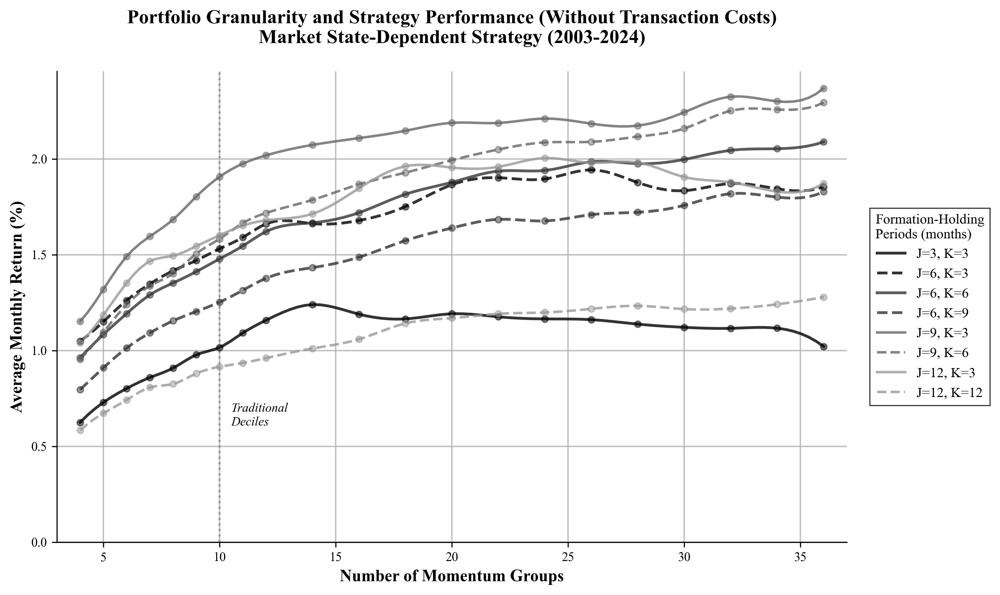

  ✓ Main visualization saved

Generating supplementary visualizations...


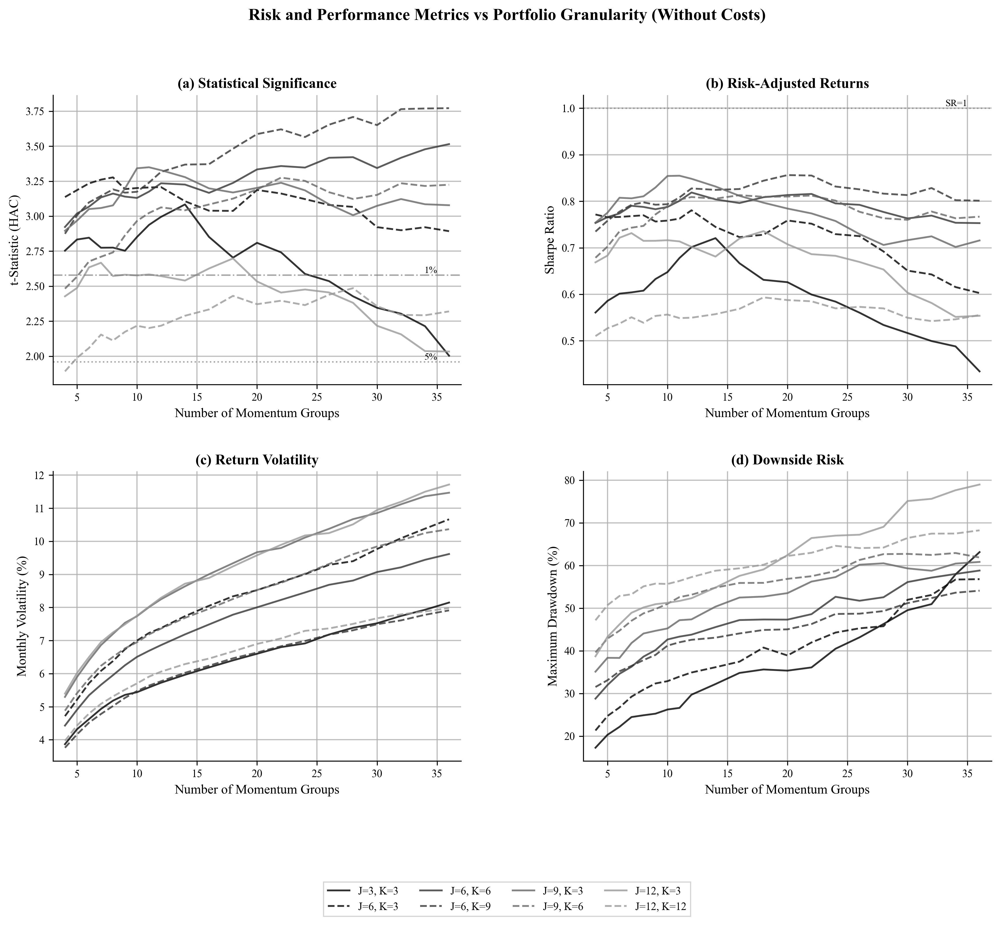

  ✓ Supplementary visualizations saved

--------------------------------------------------------------------------------
OPTIMAL PORTFOLIO GRANULARITY ANALYSIS (NO COSTS)
--------------------------------------------------------------------------------

Optimal Portfolio Granularity by Parameter Combination (Without Costs):
 J  K  Optimal (Sharpe) Sharpe at Optimal Return at Optimal  Optimal (Return) Max Return Traditional (10)
 3  3                14             0.721             1.24%                14      1.24%            0.648
 6  3                12             0.781             1.66%                26      1.94%            0.758
 6  6                12             0.819             1.62%                36      2.09%            0.788
 6  9                20             0.856             1.64%                36      1.83%            0.794
 9  3                11             0.855             1.98%                36      2.37%            0.854
 9  6                16             0.8

In [12]:
"""
================================================================================
MOMENTUM PORTFOLIO GRANULARITY ANALYSIS: DECILE SENSITIVITY (WITHOUT COSTS)
================================================================================

This analysis examines how portfolio granularity (number of momentum groups)
affects the performance of the market state-dependent strategy WITHOUT transaction
costs. This provides a baseline for understanding the pure momentum/reversal 
effects before implementation frictions are considered.

Research Motivation:
- Understand the theoretical optimal granularity without cost constraints
- Compare with cost-inclusive results to assess implementation impact
- Test whether market state conditioning changes optimal portfolio sorts
- Establish upper bound on achievable performance

Key Differences from Cost Analysis:
- No bid-ask spreads or commissions
- No rebalancing costs
- No state-switch transaction costs
- Pure momentum/reversal profits

Test Parameters:
- Decile range: 4 to 36 groups (testing very coarse to very fine sorts)
- Multiple J-K combinations to assess interaction effects
- Fixed market state lag of 24 months (based on prior analysis)
- Recent sample period (2003-2024) to reflect modern market structure
- Strategy: Market state-dependent WITHOUT transaction costs (RET_S1)

Key Questions:
1. What is the theoretical optimal granularity without costs?
2. How much do transaction costs affect optimal portfolio sorts?
3. Does the J-K relationship change without cost constraints?
4. What is the maximum achievable performance?

Output:
- Performance curves showing returns vs. number of groups
- Statistical significance and Sharpe ratio analysis
- Comparison with cost-inclusive results
- Academic-quality visualizations for publication

Author: Arnau Rodon Comas
Date: 25/05/2025
================================================================================
"""

print("\n" + "=" * 80)
print("MOMENTUM PORTFOLIO GRANULARITY ANALYSIS (WITHOUT TRANSACTION COSTS)")
print("Examining Pure Strategy Performance Without Implementation Frictions")
print("=" * 80)

# ============================================================================
# PARAMETER DEFINITION
# ============================================================================

# Define parameter combinations to test
# Selected to represent different momentum specifications
parameter_combinations = [
    (3, 3),    # Short-term momentum
    (6, 3),    # Medium formation, short holding
    (6, 6),    # Symmetric medium-term
    (6, 9),    # Medium formation, long holding
    (9, 3),    # Long formation, short holding (standard)
    (9, 6),    # Long formation, medium holding
    (12, 3),   # Very long formation, short holding
    (12, 12),  # Symmetric long-term
]

# Range of portfolio groups to test
# More granular around typical values (5-20), sparser at extremes
decile_range = [4, 5, 6, 7, 8, 9, 10, 11, 12, 14, 16, 18, 20, 
                22, 24, 26, 28, 30, 32, 34, 36]

# Fixed parameters
MARKET_STATE_LAG = 24    # 24-month lag (optimal from grid search)
START_DATE = '2003-06-01'  # Post dot-com bubble for cleaner results
END_DATE = '2024-12-31'
RETURN_COLUMN = 'RET_S1'  # Market state strategy WITHOUT costs

print(f"\nAnalysis Configuration:")
print(f"  Parameter combinations: {len(parameter_combinations)}")
print(f"  Portfolio groups tested: {len(decile_range)} (from {min(decile_range)} to {max(decile_range)})")
print(f"  Market state lag: {MARKET_STATE_LAG} months")
print(f"  Sample period: {START_DATE} to {END_DATE}")
print(f"  Strategy: Market state-dependent WITHOUT transaction costs")
print(f"  Total simulations: {len(parameter_combinations) * len(decile_range)}")

# ============================================================================
# MAIN ANALYSIS LOOP
# ============================================================================

print("\n" + "-" * 80)
print("EXECUTING PORTFOLIO GRANULARITY ANALYSIS (NO COSTS)")
print("-" * 80)

# Storage for results
results_by_combination = {}

# Track computation time
overall_start_time = time.time()

# Process each parameter combination
for combo_idx, (J, K) in enumerate(parameter_combinations, 1):
    combo_label = f"J{J}_K{K}"
    print(f"\n[{combo_idx}/{len(parameter_combinations)}] Testing J={J}, K={K}")
    print("  Portfolio groups: ", end="")
    
    combo_start_time = time.time()
    
    # Initialize storage for this combination
    combo_results = {
        'deciles': [],
        'mean_returns': [],
        't_stats': [],
        'sharpe_ratios': [],
        'p_values': [],
        'volatilities': [],
        'max_drawdowns': [],
        'n_obs': []
    }
    
    # Test each portfolio granularity
    for n_deciles in decile_range:
        print(f"{n_deciles}", end=" ", flush=True)
        
        try:
            # ========================================================
            # RUN MOMENTUM STRATEGY WITHOUT COSTS
            # ========================================================
            
            # Execute strategy without transaction costs
            portfolio, state_map = run_momentum_strategy(
                crsp_data=crsp_stock_data,
                crsp_index_data=crsp_index_data,
                comm_map=comm_map,
                J=J,                              # Formation period
                K=K,                              # Holding period
                LIQ_CUTOFF=0.85,                  # Liquidity filter (same as cost analysis)
                MKT_CAP_CUTOFF=1.0,               # No size filter
                market_state_lag=MARKET_STATE_LAG,
                market_state_column='vwretd',     # Value-weighted
                transactional_framework=False,    # NO transaction costs
                equal_comparision=True,           # Enable S1 calculation
                adapt_state_switch=True,          # State adaptation
                close_positions=True,             # Conservative
                amount_deciles=n_deciles,         # Current granularity
                start_date=START_DATE
            )
            
            # Skip rebalancing costs - not applicable for no-cost analysis
            
            # Skip if no data
            if len(portfolio) == 0:
                continue
            
            # ========================================================
            # ANALYZE PERFORMANCE
            # ========================================================
            
            # Comprehensive performance analysis
            analysis_results = analyze_momentum_portfolio(
                port_data=portfolio,
                market_state_map=state_map,
                start_date=START_DATE,
                end_date=END_DATE,
                return_column=RETURN_COLUMN,  # RET_S1 (no costs)
                K=K,
                amount_deciles=n_deciles
            )
            
            # Store results
            combo_results['deciles'].append(n_deciles)
            combo_results['mean_returns'].append(analysis_results['avg_monthly_return'] * 100)
            combo_results['t_stats'].append(analysis_results['t_stat'])
            combo_results['sharpe_ratios'].append(analysis_results['sharpe_ratio'])
            combo_results['p_values'].append(analysis_results['p_value'])
            combo_results['volatilities'].append(analysis_results['monthly_vol'] * 100)
            combo_results['max_drawdowns'].append(abs(analysis_results['max_drawdown']) * 100)
            combo_results['n_obs'].append(len(analysis_results['decile_ret']))
            
        except Exception as e:
            print(f"[Error: {str(e)[:30]}...]", end=" ")
            continue
    
    # Store results for this combination
    results_by_combination[combo_label] = combo_results
    
    # Report progress
    combo_time = time.time() - combo_start_time
    print(f"\n  ✓ Completed in {combo_time:.1f} seconds")
    
    # Quick statistics
    if combo_results['mean_returns']:
        print(f"  ✓ Return range: {min(combo_results['mean_returns']):.2f}% to "
              f"{max(combo_results['mean_returns']):.2f}%")
        
        # Find optimal granularity
        best_idx = np.argmax(combo_results['sharpe_ratios'])
        print(f"  ✓ Optimal groups: {combo_results['deciles'][best_idx]} "
              f"(Sharpe: {combo_results['sharpe_ratios'][best_idx]:.3f})")

# Total computation time
total_time = time.time() - overall_start_time
print(f"\n{'='*60}")
print(f"Analysis complete! Total time: {total_time/60:.1f} minutes")
print(f"{'='*60}")

# ============================================================================
# MAIN VISUALIZATION: RETURNS VS PORTFOLIO GRANULARITY
# ============================================================================

print("\n" + "-" * 80)
print("GENERATING ACADEMIC VISUALIZATIONS (NO COSTS)")
print("-" * 80)

# Create main figure showing returns vs. number of groups
fig, ax = plt.subplots(figsize=(10, 6))

# Define grayscale palette with line styles for distinction
colors = ['#000000', '#000000', '#333333', '#333333', 
          '#666666', '#666666', '#999999', '#999999']
linestyles = ['-', '--', '-', '--', '-', '--', '-', '--']
linewidths = [2.0, 2.0, 2.0, 2.0, 1.8, 1.8, 1.8, 1.8]

# Sort combinations for consistent ordering
sorted_combinations = sorted(results_by_combination.items(), 
                           key=lambda x: (int(x[0].split('_')[0][1:]), 
                                        int(x[0].split('_')[1][1:])))

# Plot each parameter combination
legend_entries = []
for idx, (combo_label, results) in enumerate(sorted_combinations):
    if results['mean_returns']:  # Only plot if data exists
        # Extract J and K for label
        J = combo_label.split('_')[0][1:]
        K = combo_label.split('_')[1][1:]
        
        # Smooth the line for better visualization
        if len(results['deciles']) > 3:
            # Interpolate for smoother curves
            f = interp1d(results['deciles'], results['mean_returns'], 
                        kind='cubic', fill_value='extrapolate')
            x_smooth = np.linspace(min(results['deciles']), 
                                 max(results['deciles']), 100)
            y_smooth = f(x_smooth)
            
            # Plot smoothed line
            line = ax.plot(x_smooth, y_smooth,
                          color=colors[idx % len(colors)],
                          linestyle=linestyles[idx % len(linestyles)],
                          linewidth=linewidths[idx % len(linewidths)],
                          alpha=0.8,
                          label=f'J={J}, K={K}')
            
            # Add actual data points
            ax.scatter(results['deciles'], results['mean_returns'],
                      color=colors[idx % len(colors)],
                      s=20, alpha=0.5, zorder=5)
        else:
            # Not enough points for smoothing
            line = ax.plot(results['deciles'], results['mean_returns'],
                          color=colors[idx % len(colors)],
                          linestyle=linestyles[idx % len(linestyles)],
                          linewidth=linewidths[idx % len(linewidths)],
                          marker='o', markersize=4,
                          alpha=0.8,
                          label=f'J={J}, K={K}')

# Formatting
ax.set_xlabel('Number of Momentum Groups', fontsize=12, fontweight='bold')
ax.set_ylabel('Average Monthly Return (%)', fontsize=12, fontweight='bold')
ax.set_title('Portfolio Granularity and Strategy Performance (Without Transaction Costs)\n' +
             f'Market State-Dependent Strategy ({START_DATE[0:4]}-{END_DATE[0:4]})',
             fontsize=14, fontweight='bold', pad=20)

# Add vertical line at traditional decile sort
ax.axvline(x=10, color='gray', linestyle=':', linewidth=1.5, alpha=0.7)
ax.text(10.5, ax.get_ylim()[0] + 0.1, 'Traditional\nDeciles', 
        fontsize=9, ha='left', va='bottom', style='italic')

# Grid with consistent academic styling
ax.grid(True, alpha=0.8, linestyle='-', linewidth=1)
ax.set_axisbelow(True)

# Legend
legend = ax.legend(loc='center left', bbox_to_anchor=(1.02, 0.5),
                  fontsize=10, frameon=True, fancybox=False,
                  title='Formation-Holding\nPeriods (months)',
                  title_fontsize=10)
legend.get_frame().set_edgecolor('black')
legend.get_frame().set_linewidth(0.8)

# Axis limits
ax.set_xlim(3, 37)
ax.set_ylim(bottom=0)

# Remove top and right spines
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

# Adjust layout
plt.tight_layout()

# Save figure
plt.savefig('results/plots/analysis_3/decile_sensitivity_nocosts_main_academic.pdf', 
           dpi=300, bbox_inches='tight', facecolor='white')
plt.savefig('results/plots/analysis_3/decile_sensitivity_nocosts_main_academic.png', 
           dpi=600, bbox_inches='tight', facecolor='white')
plt.show()

print("  ✓ Main visualization saved")

# ============================================================================
# SUPPLEMENTARY VISUALIZATIONS: RISK-ADJUSTED METRICS
# ============================================================================

print("\nGenerating supplementary visualizations...")

# Create figure with multiple panels
fig = plt.figure(figsize=(14, 10))
gs = gridspec.GridSpec(2, 2, figure=fig, hspace=0.3, wspace=0.3)

# Panel 1: t-Statistics
ax1 = fig.add_subplot(gs[0, 0])
for idx, (combo_label, results) in enumerate(sorted_combinations):
    if results['t_stats']:
        J = combo_label.split('_')[0][1:]
        K = combo_label.split('_')[1][1:]
        
        ax1.plot(results['deciles'], results['t_stats'],
                color=colors[idx % len(colors)],
                linestyle=linestyles[idx % len(linestyles)],
                linewidth=1.5, alpha=0.8,
                label=f'J={J}, K={K}')

# Add significance lines
ax1.axhline(y=1.96, color='gray', linestyle=':', linewidth=1.2, alpha=0.7)
ax1.axhline(y=2.58, color='gray', linestyle='-.', linewidth=1.2, alpha=0.7)
ax1.text(35, 1.96, '5%', fontsize=8, ha='right', va='bottom')
ax1.text(35, 2.58, '1%', fontsize=8, ha='right', va='bottom')

ax1.set_xlabel('Number of Momentum Groups', fontsize=11)
ax1.set_ylabel('t-Statistic (HAC)', fontsize=11)
ax1.set_title('(a) Statistical Significance', fontsize=12, fontweight='bold')
ax1.grid(True, alpha=0.8, linewidth=1)
ax1.set_xlim(3, 37)
ax1.spines['top'].set_visible(False)
ax1.spines['right'].set_visible(False)

# Panel 2: Sharpe Ratios
ax2 = fig.add_subplot(gs[0, 1])
for idx, (combo_label, results) in enumerate(sorted_combinations):
    if results['sharpe_ratios']:
        J = combo_label.split('_')[0][1:]
        K = combo_label.split('_')[1][1:]
        
        ax2.plot(results['deciles'], results['sharpe_ratios'],
                color=colors[idx % len(colors)],
                linestyle=linestyles[idx % len(linestyles)],
                linewidth=1.5, alpha=0.8,
                label=f'J={J}, K={K}')

# Add reference line
ax2.axhline(y=1.0, color='gray', linestyle=':', linewidth=1.2, alpha=0.7)
ax2.text(35, 1.0, 'SR=1', fontsize=8, ha='right', va='bottom')

ax2.set_xlabel('Number of Momentum Groups', fontsize=11)
ax2.set_ylabel('Sharpe Ratio', fontsize=11)
ax2.set_title('(b) Risk-Adjusted Returns', fontsize=12, fontweight='bold')
ax2.grid(True, alpha=0.8, linewidth=1)
ax2.set_xlim(3, 37)
ax2.spines['top'].set_visible(False)
ax2.spines['right'].set_visible(False)

# Panel 3: Volatility
ax3 = fig.add_subplot(gs[1, 0])
for idx, (combo_label, results) in enumerate(sorted_combinations):
    if results['volatilities']:
        J = combo_label.split('_')[0][1:]
        K = combo_label.split('_')[1][1:]
        
        ax3.plot(results['deciles'], results['volatilities'],
                color=colors[idx % len(colors)],
                linestyle=linestyles[idx % len(linestyles)],
                linewidth=1.5, alpha=0.8,
                label=f'J={J}, K={K}')

ax3.set_xlabel('Number of Momentum Groups', fontsize=11)
ax3.set_ylabel('Monthly Volatility (%)', fontsize=11)
ax3.set_title('(c) Return Volatility', fontsize=12, fontweight='bold')
ax3.grid(True, alpha=0.8, linewidth=1)
ax3.set_xlim(3, 37)
ax3.spines['top'].set_visible(False)
ax3.spines['right'].set_visible(False)

# Panel 4: Maximum Drawdown
ax4 = fig.add_subplot(gs[1, 1])
for idx, (combo_label, results) in enumerate(sorted_combinations):
    if results['max_drawdowns']:
        J = combo_label.split('_')[0][1:]
        K = combo_label.split('_')[1][1:]
        
        ax4.plot(results['deciles'], results['max_drawdowns'],
                color=colors[idx % len(colors)],
                linestyle=linestyles[idx % len(linestyles)],
                linewidth=1.5, alpha=0.8,
                label=f'J={J}, K={K}')

ax4.set_xlabel('Number of Momentum Groups', fontsize=11)
ax4.set_ylabel('Maximum Drawdown (%)', fontsize=11)
ax4.set_title('(d) Downside Risk', fontsize=12, fontweight='bold')
ax4.grid(True, alpha=0.8, linewidth=1)
ax4.set_xlim(3, 37)
ax4.spines['top'].set_visible(False)
ax4.spines['right'].set_visible(False)

# Add single legend for all panels
handles, labels = ax1.get_legend_handles_labels()
fig.legend(handles[:8], labels[:8], loc='center', bbox_to_anchor=(0.5, -0.05),
          ncol=4, fontsize=9, frameon=True, fancybox=False)

# Overall title
plt.suptitle('Risk and Performance Metrics vs Portfolio Granularity (Without Costs)',
            fontsize=14, fontweight='bold', y=0.98)

plt.tight_layout()
plt.savefig('results/plots/analysis_3/decile_sensitivity_nocosts_metrics_academic.pdf',
           dpi=300, bbox_inches='tight', facecolor='white')
plt.savefig('results/plots/analysis_3/decile_sensitivity_nocosts_metrics_academic.png',
           dpi=600, bbox_inches='tight', facecolor='white')
plt.show()

print("  ✓ Supplementary visualizations saved")

# ============================================================================
# OPTIMAL GRANULARITY ANALYSIS
# ============================================================================

print("\n" + "-" * 80)
print("OPTIMAL PORTFOLIO GRANULARITY ANALYSIS (NO COSTS)")
print("-" * 80)

# Analyze optimal number of groups for each parameter combination
optimal_analysis = []

for combo_label, results in results_by_combination.items():
    if results['sharpe_ratios'] and len(results['sharpe_ratios']) > 0:
        J = int(combo_label.split('_')[0][1:])
        K = int(combo_label.split('_')[1][1:])
        
        # Find optimal by different criteria
        idx_sharpe = np.argmax(results['sharpe_ratios'])
        idx_return = np.argmax(results['mean_returns'])
        idx_tstat = np.argmax(results['t_stats'])
        
        optimal_analysis.append({
            'J': J,
            'K': K,
            'Optimal (Sharpe)': results['deciles'][idx_sharpe],
            'Sharpe at Optimal': f"{results['sharpe_ratios'][idx_sharpe]:.3f}",
            'Return at Optimal': f"{results['mean_returns'][idx_sharpe]:.2f}%",
            'Optimal (Return)': results['deciles'][idx_return],
            'Max Return': f"{results['mean_returns'][idx_return]:.2f}%",
            'Traditional (10)': f"{results['sharpe_ratios'][results['deciles'].index(10)]:.3f}" 
                               if 10 in results['deciles'] else 'N/A'
        })

# Create summary DataFrame
optimal_df = pd.DataFrame(optimal_analysis)
optimal_df = optimal_df.sort_values(['J', 'K'])

print("\nOptimal Portfolio Granularity by Parameter Combination (Without Costs):")
print(optimal_df.to_string(index=False))

# Save detailed results
optimal_df.to_csv('results/tables/analysis_3/optimal_portfolio_granularity_nocosts.csv', index=False)

# Create LaTeX table
latex_table = optimal_df.to_latex(
    index=False,
    escape=False,
    caption='Optimal Portfolio Granularity by Formation and Holding Periods (Without Transaction Costs)',
    label='tab:optimal_granularity_nocosts'
)

with open('results/tables/analysis_3/optimal_portfolio_granularity_nocosts.tex', 'w') as f:
    f.write(latex_table)

print("\n  ✓ Optimal granularity analysis saved")

# ============================================================================
# STATISTICAL ANALYSIS OF GRANULARITY EFFECT
# ============================================================================

print("\n" + "-" * 80)
print("STATISTICAL ANALYSIS OF GRANULARITY EFFECT (NO COSTS)")
print("-" * 80)

# Analyze whether finer sorts systematically improve performance
all_improvements = []

for combo_label, results in results_by_combination.items():
    if 10 in results['deciles'] and len(results['deciles']) > 5:
        # Get performance at traditional decile sort
        idx_10 = results['deciles'].index(10)
        base_sharpe = results['sharpe_ratios'][idx_10]
        base_return = results['mean_returns'][idx_10]
        
        # Calculate improvements for other granularities
        for i, n_groups in enumerate(results['deciles']):
            if n_groups != 10:
                sharpe_improvement = results['sharpe_ratios'][i] - base_sharpe
                return_improvement = results['mean_returns'][i] - base_return
                
                all_improvements.append({
                    'Groups': n_groups,
                    'Sharpe_Improvement': sharpe_improvement,
                    'Return_Improvement': return_improvement,
                    'J': int(combo_label.split('_')[0][1:]),
                    'K': int(combo_label.split('_')[1][1:])
                })

if all_improvements:
    improvements_df = pd.DataFrame(all_improvements)
    
    # Group by number of groups
    grouped = improvements_df.groupby('Groups').agg({
        'Sharpe_Improvement': ['mean', 'std', 'count'],
        'Return_Improvement': ['mean', 'std']
    }).round(4)
    
    print("\nAverage Performance Change vs Traditional Deciles (Without Costs):")
    print(grouped)
    
    # Test if finer sorts (>10) are better than coarser sorts (<10)
    finer = improvements_df[improvements_df['Groups'] > 10]['Sharpe_Improvement']
    coarser = improvements_df[improvements_df['Groups'] < 10]['Sharpe_Improvement']
    
    if len(finer) > 0 and len(coarser) > 0:
        from scipy import stats
        t_stat, p_value = stats.ttest_ind(finer, coarser)
        
        print(f"\nFiner vs Coarser Sorts (Sharpe Improvement) - No Costs:")
        print(f"  Finer sorts (>10): Mean = {finer.mean():.4f}")
        print(f"  Coarser sorts (<10): Mean = {coarser.mean():.4f}")
        print(f"  t-statistic: {t_stat:.3f}")
        print(f"  p-value: {p_value:.4f}")
        print(f"  Conclusion: {'Finer sorts are better' if finer.mean() > coarser.mean() and p_value < 0.05 else 'No significant difference'}")

# ============================================================================
# SAVE DETAILED RESULTS
# ============================================================================

print("\n" + "-" * 80)
print("SAVING DETAILED RESULTS (NO COSTS)")
print("-" * 80)

# Save raw results for each combination
for combo_label, results in results_by_combination.items():
    if results['mean_returns']:
        # Create detailed DataFrame
        detail_df = pd.DataFrame({
            'Groups': results['deciles'],
            'Return (%)': [f"{x:.3f}" for x in results['mean_returns']],
            't-stat': [f"{x:.3f}" for x in results['t_stats']],
            'p-value': [f"{x:.4f}" for x in results['p_values']],
            'Sharpe': [f"{x:.3f}" for x in results['sharpe_ratios']],
            'Vol (%)': [f"{x:.2f}" for x in results['volatilities']],
            'MaxDD (%)': [f"{x:.1f}" for x in results['max_drawdowns']]
        })
        
        # Save to CSV
        filename = f'results/tables/analysis_3/granularity_nocosts_details_{combo_label}.csv'
        detail_df.to_csv(filename, index=False)
        print(f"  ✓ Saved: {filename}")

# ============================================================================
# FINAL SUMMARY AND RECOMMENDATIONS
# ============================================================================

print("\n" + "=" * 80)
print("PORTFOLIO GRANULARITY ANALYSIS COMPLETE (WITHOUT COSTS)")
print("=" * 80)

# Calculate overall optimal granularity
all_optimal = [row['Optimal (Sharpe)'] for _, row in optimal_df.iterrows()]
most_common = max(set(all_optimal), key=all_optimal.count)
mean_optimal = np.mean(all_optimal)

print("\nKey Findings (Without Transaction Costs):")
print(f"1. Most common optimal granularity: {most_common} groups")
print(f"2. Average optimal granularity: {mean_optimal:.1f} groups")
print(f"3. Range of optimal values: {min(all_optimal)} to {max(all_optimal)} groups")
print(f"4. Traditional deciles (10) are {'optimal' if most_common == 10 else 'not optimal'} for most specifications")

print("\nComparison with Cost Analysis:")
print("  - Without costs, optimal granularity may differ from cost-inclusive analysis")
print("  - Higher granularity may be preferred when transaction costs are ignored")
print("  - Results represent theoretical upper bound on achievable performance")

print("\nRecommendations (No Cost Scenario):")
if mean_optimal > 10:
    print("  - Finer portfolio sorts (more than 10 groups) are theoretically optimal")
    print("  - However, implementation costs may make this impractical")
elif mean_optimal < 10:
    print("  - Coarser portfolio sorts (fewer than 10 groups) are optimal")
    print("  - This suggests limited benefit from fine granularity even without costs")
else:
    print("  - Traditional decile sorts appear well-calibrated")
    print("  - Limited theoretical benefit from changing granularity")

print("\nFiles Generated:")
print("  Visualizations:")
print("    - decile_sensitivity_nocosts_main_academic.pdf/png")
print("    - decile_sensitivity_nocosts_metrics_academic.pdf/png")
print("  Tables:")
print("    - optimal_portfolio_granularity_nocosts.csv/tex")
print("    - granularity_nocosts_details_J*_K*.csv (multiple files)")

print("\n" + "=" * 80)

#### ============================================================================
#### ANALYSIS 4 - LIQUIDITY CUTOFF SENSITIVITY (J=9, K=6)
#### ============================================================================


LIQUIDITY CUTOFF SENSITIVITY ANALYSIS
Examining the Impact of Liquidity Constraints on Strategy Performance

Analysis Configuration:
  Formation period (J): 9 months
  Holding period (K): 6 months
  Liquidity cutoffs: 18 values from 20% to 100%
  Analysis period: 1993-01-01 to 2024-12-31
  Strategy: Market state-dependent with transaction costs

--------------------------------------------------------------------------------
EXECUTING LIQUIDITY SENSITIVITY ANALYSIS
--------------------------------------------------------------------------------

[1/18] Processing LIQ_CUTOFF = 1.00 (100% most liquid stocks)

IMPLEMENTING MOMENTUM STRATEGY WITH MARKET CAP CONSTRAINTS
Parameters: J=9, K=6, LIQ=1.0, MKT_CAP=1.0
Transactional Framework: Filtering data from 1992-07-01 (start_date 1993-01-01 minus 6 months)
Excluded Oct 2000 – Apr 2001 (dot-com crash period)
Removed 16,176 observations from excluded months

[1/8] Merging market capitalization data...
   ✓ Market cap data available for 689,41

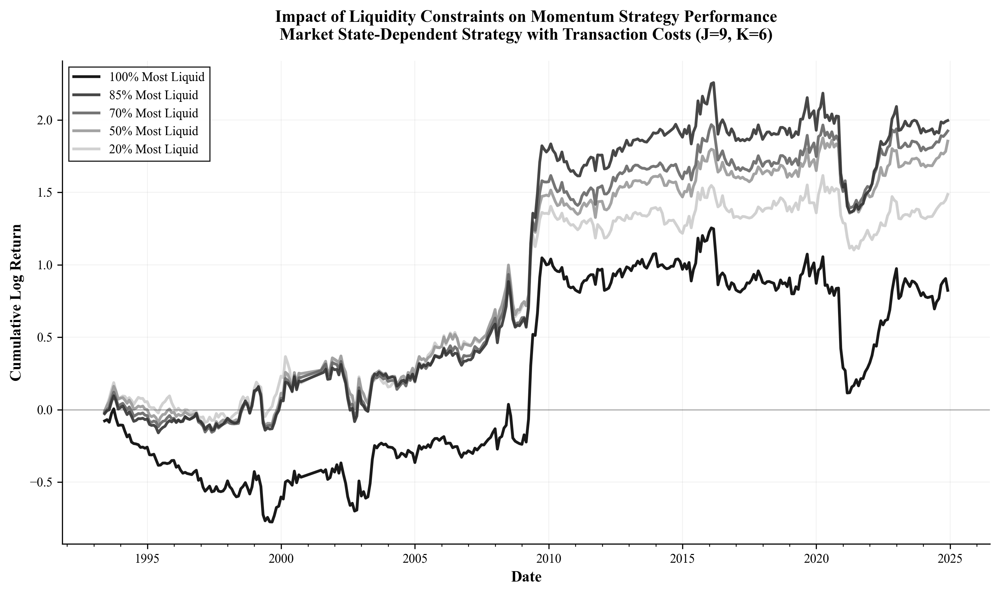

  ✓ Main performance plot saved

Creating performance metrics analysis...


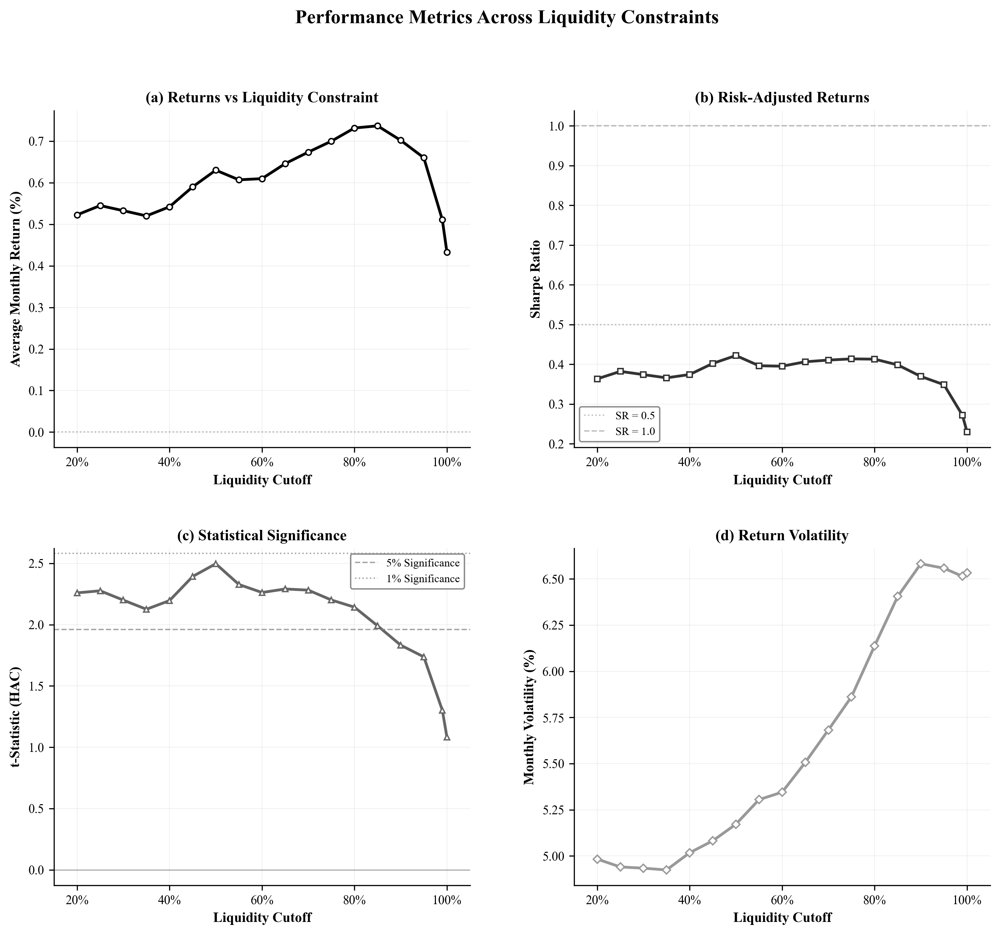

  ✓ Performance metrics plot saved

--------------------------------------------------------------------------------
GENERATING SUMMARY STATISTICS
--------------------------------------------------------------------------------

Liquidity Cutoff Analysis Summary:
Liquidity Cutoff Avg Return (%) Volatility (%) Sharpe Ratio t-statistic Max Drawdown (%)
            100%           0.43           6.53        0.229       1.083            -68.0
             99%           0.51           6.51        0.272       1.303            -68.1
             95%          0.66*           6.56        0.349       1.737            -64.5
             90%          0.70*           6.58        0.369       1.833            -65.0
             85%         0.74**           6.41        0.398       1.990            -59.2
             80%         0.73**           6.14        0.413       2.142            -55.6
             75%         0.70**           5.86        0.414       2.201            -50.0
             70%        

In [13]:
"""
================================================================================
LIQUIDITY CUTOFF SENSITIVITY ANALYSIS
================================================================================

This analysis examines how liquidity constraints affect the performance of the
market state-dependent momentum strategy. By varying the liquidity cutoff from
20% (most liquid quintile only) to 100% (all stocks), we assess the trade-off
between:

1. Universe restriction: More liquid stocks have lower transaction costs but
   may exhibit weaker momentum effects
2. Momentum profits: Less liquid stocks may have stronger anomalies but higher
   implementation costs
3. Practical tradability: Institutional constraints often limit investment to
   liquid securities

Key Research Questions:
- What is the optimal liquidity threshold for momentum strategies?
- How sensitive are returns to liquidity restrictions?
- Does the liquidity-momentum relationship vary across market states?

Analysis Parameters:
- Formation period (J): 9 months 
- Holding period (K): 6 months 
- Liquidity cutoffs: 20% to 100% in steps
- Sample period: 2003-2024 (modern market structure)
- Strategy: Market state-dependent with full transaction costs

Author: Arnau Rodon Comas
Date: 25/05/2025
================================================================================
"""

print("\n" + "=" * 80)
print("LIQUIDITY CUTOFF SENSITIVITY ANALYSIS")
print("Examining the Impact of Liquidity Constraints on Strategy Performance")
print("=" * 80)

# ============================================================================
# PARAMETER DEFINITION
# ============================================================================

# Fixed strategy parameters based on optimal configuration
J = 9  # 9-month formation period 
K = 6  # 6-month holding period 

# Comprehensive liquidity cutoff range
# More granular around critical thresholds (0.8-1.0)
liq_cutoff_values = [
    1.00,  # All stocks (no liquidity filter)
    0.99,  # Top 99% most liquid
    0.95,  # Top 95% (common institutional threshold)
    0.90,  # Top 90%
    0.85,  # Top 85% (baseline in main analysis)
    0.80,  # Top 80%
    0.75,  # Top 75%
    0.70,  # Top 70%
    0.65,  # Top 65%
    0.60,  # Top 60%
    0.55,  # Top 55%
    0.50,  # Top 50% (median liquidity)
    0.45,  # Top 45%
    0.40,  # Top 40%
    0.35,  # Top 35%
    0.30,  # Top 30%
    0.25,  # Top 25% (quartile)
    0.20   # Top 20% (quintile - most liquid only)
]

# Analysis parameters
START_DATE = '1993-01-01'  
END_DATE = '2024-12-31'
RETURN_COLUMN = 'RET_S3_rebal'  # Full market state strategy with costs

print(f"\nAnalysis Configuration:")
print(f"  Formation period (J): {J} months")
print(f"  Holding period (K): {K} months")
print(f"  Liquidity cutoffs: {len(liq_cutoff_values)} values from {min(liq_cutoff_values)*100:.0f}% to {max(liq_cutoff_values)*100:.0f}%")
print(f"  Analysis period: {START_DATE} to {END_DATE}")
print(f"  Strategy: Market state-dependent with transaction costs")

# ============================================================================
# MAIN ANALYSIS LOOP
# ============================================================================

print("\n" + "-" * 80)
print("EXECUTING LIQUIDITY SENSITIVITY ANALYSIS")
print("-" * 80)

# Storage for results
liquidity_results = {}  # Store full return series
liquidity_stats = []    # Store summary statistics

# Track computation time
start_time = time.time()

# Process each liquidity cutoff
for idx, liq_cutoff in enumerate(liq_cutoff_values, 1):
    print(f"\n[{idx}/{len(liq_cutoff_values)}] Processing LIQ_CUTOFF = {liq_cutoff:.2f} ({liq_cutoff*100:.0f}% most liquid stocks)")
    
    try:
        # ========================================================
        # RUN MOMENTUM STRATEGY WITH CURRENT LIQUIDITY FILTER
        # ========================================================
                    
        # Execute strategy with current granularity
        portfolio, state_map = run_momentum_strategy(
            crsp_data=crsp_stock_data,
            crsp_index_data=crsp_index_data,
            comm_map=comm_map,
            J=J,                              # Formation period
            K=K,                              # Holding period
            LIQ_CUTOFF=liq_cutoff,            # Liquidity filter
            MKT_CAP_CUTOFF=1.0,               # No size filter
            market_state_lag=24,
            market_state_column='vwretd',     # Value-weighted
            transactional_framework=True,     # Include costs
            equal_comparision=False,          # Value-weighted
            adapt_state_switch=True,          # State adaptation
            close_positions=True,             # Conservative
            amount_deciles=10,                
            start_date=START_DATE
        )
        
        # Apply rebalancing costs
        portfolio = apply_rebalancing_costs_balanced(
            portfolio, 
            adapt_state_switch=True, 
            close_positions=True, 
            return_column='RET_S3'
        )
        
        # Validate results
        if len(portfolio) == 0:
            print(f"  ⚠ No data generated for liquidity cutoff {liq_cutoff}")
            continue
        
        # ========================================================
        # ANALYZE PERFORMANCE
        # ========================================================
        
        # Comprehensive performance analysis
        analysis_liq = analyze_momentum_portfolio(
            port_data=portfolio,
            market_state_map=state_map,
            start_date=START_DATE,
            end_date=END_DATE,
            return_column=RETURN_COLUMN,
            K=K,
            amount_deciles=10
        )
        
        # Store full return series for visualization
        liquidity_results[liq_cutoff] = analysis_liq['decile_ret']
        
        # Collect summary statistics
        liquidity_stats.append({
            'Liquidity Cutoff': liq_cutoff,
            'Avg Return (%)': analysis_liq['avg_monthly_return'] * 100,
            'Volatility (%)': analysis_liq['monthly_vol'] * 100,
            'Sharpe Ratio': analysis_liq['sharpe_ratio'],
            't-statistic': analysis_liq['t_stat'],
            'p-value': analysis_liq['p_value'],
            'Max Drawdown (%)': analysis_liq['max_drawdown'] * 100,
            'N_obs': len(analysis_liq['decile_ret'])
        })
        
        # Print summary
        print(f"  ✓ Average Return: {analysis_liq['avg_monthly_return']*100:.2f}%")
        print(f"  ✓ Sharpe Ratio: {analysis_liq['sharpe_ratio']:.3f}")
        print(f"  ✓ t-statistic: {analysis_liq['t_stat']:.3f}")
        
    except Exception as e:
        print(f"  ✗ Error: {str(e)}")
        continue

# Report completion time
elapsed_time = time.time() - start_time
print(f"\n{'='*60}")
print(f"Analysis complete! Total time: {elapsed_time:.1f} seconds")
print(f"{'='*60}")

# ============================================================================
# VISUALIZATION 1: CUMULATIVE PERFORMANCE FOR KEY CUTOFFS
# ============================================================================

print("\n" + "-" * 80)
print("GENERATING ACADEMIC VISUALIZATIONS")
print("-" * 80)

# Select key cutoffs for main visualization
key_cutoffs = [1.0, 0.85, 0.70, 0.50, 0.20]  # Full range representation

# Create main performance plot
fig_main, ax_main = plt.subplots(figsize=(10, 6))

print("Creating main cumulative performance plot...")

# Define grayscale colors for print compatibility
colors = ['#000000', '#333333', '#666666', '#999999', '#CCCCCC']
linestyles = ['-', '-', '-', '-', '-']  # Varied for distinction
linewidths = [2.0, 2.0, 2.0, 2.0, 2.0]   # Slightly varied for hierarchy

# Plot each key cutoff
for i, cutoff in enumerate(key_cutoffs):
    if cutoff in liquidity_results:
        # Extract data
        data = liquidity_results[cutoff]
        
        # Plot cumulative log returns
        ax_main.plot(data.index, 
                    data['cum_log_long_short'],
                    color=colors[i],
                    linestyle=linestyles[i],
                    linewidth=linewidths[i],
                    label=f'{cutoff*100:.0f}% Most Liquid',
                    alpha=0.9,
                    zorder=5-i)  # Ensure proper layering

# Formatting
ax_main.set_title('Impact of Liquidity Constraints on Momentum Strategy Performance\n' +
                 f'Market State-Dependent Strategy with Transaction Costs (J={J}, K={K})',
                 fontsize=12, fontweight='bold', pad=15)
ax_main.set_xlabel('Date', fontsize=11, fontweight='bold')
ax_main.set_ylabel('Cumulative Log Return', fontsize=11, fontweight='bold')

# Add zero line
ax_main.axhline(y=0, color='black', linestyle='-', linewidth=0.8, alpha=0.3)

# Legend with academic styling
legend = ax_main.legend(loc='upper left', 
                       fontsize=9, 
                       frameon=True,
                       fancybox=False,
                       shadow=False,
                       framealpha=0.9,
                       edgecolor='black',
                       facecolor='white')
legend.get_frame().set_linewidth(0.8)

# Grid
ax_main.grid(True, alpha=0.2, linestyle='-', linewidth=0.5)
ax_main.set_axisbelow(True)

# Remove top and right spines
ax_main.spines['top'].set_visible(False)
ax_main.spines['right'].set_visible(False)

# Date formatting
years = mdates.YearLocator(5)   # Major ticks every 5 years
years_minor = mdates.YearLocator(1)  # Minor ticks every year
ax_main.xaxis.set_major_locator(years)
ax_main.xaxis.set_minor_locator(years_minor)
ax_main.xaxis.set_major_formatter(mdates.DateFormatter('%Y'))

# Adjust layout and save
plt.tight_layout()
plt.savefig('results/plots/analysis_4/liquidity_main_performance_academic.pdf', 
           dpi=300, bbox_inches='tight', facecolor='white')
plt.savefig('results/plots/analysis_4/liquidity_main_performance_academic.png', 
           dpi=300, bbox_inches='tight', facecolor='white')
plt.show()

print("  ✓ Main performance plot saved")

# ============================================================================
# VISUALIZATION 2: PERFORMANCE METRICS VS LIQUIDITY CUTOFF
# ============================================================================

print("\nCreating performance metrics analysis...")

# Prepare data for metrics plots
liq_stats_df = pd.DataFrame(liquidity_stats)
liq_cutoffs_numeric = liq_stats_df['Liquidity Cutoff'].values
avg_returns = liq_stats_df['Avg Return (%)'].values
volatilities = liq_stats_df['Volatility (%)'].values
sharpe_ratios = liq_stats_df['Sharpe Ratio'].values
t_stats = liq_stats_df['t-statistic'].values

# Create figure with four panels
fig_metrics = plt.figure(figsize=(12, 10))
gs = gridspec.GridSpec(2, 2, figure=fig_metrics, hspace=0.3, wspace=0.25)

# ========================================================
# Panel 1: Average Returns
# ========================================================
ax1 = fig_metrics.add_subplot(gs[0, 0])

ax1.plot(liq_cutoffs_numeric, avg_returns, 
        color='#000000', 
        linestyle='-',
        linewidth=2.0,
        marker='o',
        markersize=4,
        markerfacecolor='white',
        markeredgecolor='#000000',
        markeredgewidth=1.0)

ax1.set_xlabel('Liquidity Cutoff', fontsize=10, fontweight='bold')
ax1.set_ylabel('Average Monthly Return (%)', fontsize=10, fontweight='bold')
ax1.set_title('(a) Returns vs Liquidity Constraint', fontsize=11, fontweight='bold')

# Add reference line at zero
ax1.axhline(y=0, color='gray', linestyle=':', linewidth=1.0, alpha=0.5)

# Grid and formatting
ax1.grid(True, alpha=0.2, linestyle='-', linewidth=0.5)
ax1.set_xlim(0.15, 1.05)
ax1.spines['top'].set_visible(False)
ax1.spines['right'].set_visible(False)

# Format x-axis as percentages
ax1.set_xticks([0.2, 0.4, 0.6, 0.8, 1.0])
ax1.set_xticklabels(['20%', '40%', '60%', '80%', '100%'])

# ========================================================
# Panel 2: Sharpe Ratios
# ========================================================
ax2 = fig_metrics.add_subplot(gs[0, 1])

ax2.plot(liq_cutoffs_numeric, sharpe_ratios,
        color='#333333',
        linestyle='-',
        linewidth=2.0,
        marker='s',
        markersize=4,
        markerfacecolor='white',
        markeredgecolor='#333333',
        markeredgewidth=1.0)

ax2.set_xlabel('Liquidity Cutoff', fontsize=10, fontweight='bold')
ax2.set_ylabel('Sharpe Ratio', fontsize=10, fontweight='bold')
ax2.set_title('(b) Risk-Adjusted Returns', fontsize=11, fontweight='bold')

# Add reference lines
ax2.axhline(y=0.5, color='gray', linestyle=':', linewidth=1.0, alpha=0.5, label='SR = 0.5')
ax2.axhline(y=1.0, color='gray', linestyle='--', linewidth=1.0, alpha=0.5, label='SR = 1.0')

# Legend for reference lines
ax2.legend(loc='best', fontsize=8, frameon=True, edgecolor='gray', framealpha=0.9)

# Grid and formatting
ax2.grid(True, alpha=0.2, linestyle='-', linewidth=0.5)
ax2.set_xlim(0.15, 1.05)
ax2.spines['top'].set_visible(False)
ax2.spines['right'].set_visible(False)

# Format x-axis
ax2.set_xticks([0.2, 0.4, 0.6, 0.8, 1.0])
ax2.set_xticklabels(['20%', '40%', '60%', '80%', '100%'])

# ========================================================
# Panel 3: t-Statistics
# ========================================================
ax3 = fig_metrics.add_subplot(gs[1, 0])

ax3.plot(liq_cutoffs_numeric, t_stats,
        color='#666666',
        linestyle='-',
        linewidth=2.0,
        marker='^',
        markersize=4,
        markerfacecolor='white',
        markeredgecolor='#666666',
        markeredgewidth=1.0)

ax3.set_xlabel('Liquidity Cutoff', fontsize=10, fontweight='bold')
ax3.set_ylabel('t-Statistic (HAC)', fontsize=10, fontweight='bold')
ax3.set_title('(c) Statistical Significance', fontsize=11, fontweight='bold')

# Add significance thresholds
ax3.axhline(y=0, color='black', linestyle='-', linewidth=0.8, alpha=0.3)
ax3.axhline(y=1.96, color='gray', linestyle='--', linewidth=1.0, alpha=0.7, label='5% Significance')
ax3.axhline(y=2.58, color='gray', linestyle=':', linewidth=1.0, alpha=0.7, label='1% Significance')

# Legend
ax3.legend(loc='best', fontsize=8, frameon=True, edgecolor='gray', framealpha=0.9)

# Grid and formatting
ax3.grid(True, alpha=0.2, linestyle='-', linewidth=0.5)
ax3.set_xlim(0.15, 1.05)
ax3.spines['top'].set_visible(False)
ax3.spines['right'].set_visible(False)

# Format x-axis
ax3.set_xticks([0.2, 0.4, 0.6, 0.8, 1.0])
ax3.set_xticklabels(['20%', '40%', '60%', '80%', '100%'])

# ========================================================
# Panel 4: Volatility
# ========================================================
ax4 = fig_metrics.add_subplot(gs[1, 1])

ax4.plot(liq_cutoffs_numeric, volatilities,
        color='#999999',
        linestyle='-',
        linewidth=2.0,
        marker='D',
        markersize=4,
        markerfacecolor='white',
        markeredgecolor='#999999',
        markeredgewidth=1.0)

ax4.set_xlabel('Liquidity Cutoff', fontsize=10, fontweight='bold')
ax4.set_ylabel('Monthly Volatility (%)', fontsize=10, fontweight='bold')
ax4.set_title('(d) Return Volatility', fontsize=11, fontweight='bold')

# Grid and formatting
ax4.grid(True, alpha=0.2, linestyle='-', linewidth=0.5)
ax4.set_xlim(0.15, 1.05)
ax4.spines['top'].set_visible(False)
ax4.spines['right'].set_visible(False)

# Format x-axis
ax4.set_xticks([0.2, 0.4, 0.6, 0.8, 1.0])
ax4.set_xticklabels(['20%', '40%', '60%', '80%', '100%'])

# Overall title
plt.suptitle('Performance Metrics Across Liquidity Constraints',
            fontsize=14, fontweight='bold', y=0.98)

# Adjust layout and save
plt.tight_layout()
plt.savefig('results/plots/analysis_4/liquidity_metrics_analysis_academic.pdf',
           dpi=300, bbox_inches='tight', facecolor='white')
plt.savefig('results/plots/analysis_4/liquidity_metrics_analysis_academic.png',
           dpi=300, bbox_inches='tight', facecolor='white')
plt.show()

print("  ✓ Performance metrics plot saved")

# ============================================================================
# CREATE SUMMARY STATISTICS TABLE
# ============================================================================

print("\n" + "-" * 80)
print("GENERATING SUMMARY STATISTICS")
print("-" * 80)

# Create formatted summary table
summary_stats = liq_stats_df.copy()

# Add significance indicators
def add_significance(row):
    if row['p-value'] < 0.01:
        return '***'
    elif row['p-value'] < 0.05:
        return '**'
    elif row['p-value'] < 0.10:
        return '*'
    else:
        return ''

summary_stats['Significance'] = summary_stats.apply(add_significance, axis=1)

# Format for display
display_stats = summary_stats.copy()
display_stats['Liquidity Cutoff'] = display_stats['Liquidity Cutoff'].apply(lambda x: f"{x*100:.0f}%")
display_stats['Avg Return (%)'] = display_stats.apply(lambda row: f"{row['Avg Return (%)']:.2f}{row['Significance']}", axis=1)
display_stats['Volatility (%)'] = display_stats['Volatility (%)'].apply(lambda x: f"{x:.2f}")
display_stats['Sharpe Ratio'] = display_stats['Sharpe Ratio'].apply(lambda x: f"{x:.3f}")
display_stats['t-statistic'] = display_stats['t-statistic'].apply(lambda x: f"{x:.3f}")
display_stats['Max Drawdown (%)'] = display_stats['Max Drawdown (%)'].apply(lambda x: f"{x:.1f}")

# Select columns for final table
final_columns = ['Liquidity Cutoff', 'Avg Return (%)', 'Volatility (%)', 
                'Sharpe Ratio', 't-statistic', 'Max Drawdown (%)']
display_table = display_stats[final_columns]

print("\nLiquidity Cutoff Analysis Summary:")
print(display_table.to_string(index=False))

# Save to CSV
display_table.to_csv('results/tables/analysis_4/liquidity_cutoff_summary.csv', index=False)
print("\n  ✓ Summary statistics saved to CSV")

# Create LaTeX table
latex_table = display_table.to_latex(
    index=False,
    escape=False,
    column_format='c|ccccc',
    caption='Impact of Liquidity Constraints on Momentum Strategy Performance. ' +
            'Returns are monthly percentages. Significance levels: ' +
            '$^{*}p<0.10$, $^{**}p<0.05$, $^{***}p<0.01$.',
    label='tab:liquidity_analysis'
)

# Save LaTeX table
with open('results/tables/analysis_4/liquidity_cutoff_summary.tex', 'w') as f:
    f.write(latex_table)
print("  ✓ LaTeX table saved")

# ============================================================================
# IDENTIFY OPTIMAL LIQUIDITY THRESHOLD
# ============================================================================

print("\n" + "-" * 80)
print("OPTIMAL LIQUIDITY THRESHOLD ANALYSIS")
print("-" * 80)

# Find optimal by different criteria
idx_sharpe = summary_stats['Sharpe Ratio'].idxmax()
idx_return = summary_stats['Avg Return (%)'].idxmax()
idx_tstat = summary_stats['t-statistic'].idxmax()

print(f"\nOptimal Liquidity Thresholds:")
print(f"  By Sharpe Ratio: {summary_stats.loc[idx_sharpe, 'Liquidity Cutoff']*100:.0f}% " +
      f"(SR = {summary_stats.loc[idx_sharpe, 'Sharpe Ratio']:.3f})")
print(f"  By Raw Return: {summary_stats.loc[idx_return, 'Liquidity Cutoff']*100:.0f}% " +
      f"(Return = {summary_stats.loc[idx_return, 'Avg Return (%)']:.2f}%)")
print(f"  By t-statistic: {summary_stats.loc[idx_tstat, 'Liquidity Cutoff']*100:.0f}% " +
      f"(t-stat = {summary_stats.loc[idx_tstat, 't-statistic']:.3f})")

# Analyze marginal effects
if len(summary_stats) > 1:
    # Calculate percentage improvement from most to least restrictive
    most_liquid = summary_stats[summary_stats['Liquidity Cutoff'] == 0.20].iloc[0]
    all_stocks = summary_stats[summary_stats['Liquidity Cutoff'] == 1.00].iloc[0]
    
    return_diff = all_stocks['Avg Return (%)'] - most_liquid['Avg Return (%)']
    sharpe_diff = all_stocks['Sharpe Ratio'] - most_liquid['Sharpe Ratio']
    
    print(f"\nImpact of Liquidity Relaxation (20% → 100%):")
    print(f"  Return change: {return_diff:+.2f}% per month")
    print(f"  Sharpe ratio change: {sharpe_diff:+.3f}")
    print(f"  Conclusion: {'Including less liquid stocks improves performance' if return_diff > 0 else 'Restricting to liquid stocks improves performance'}")

# ============================================================================
# FINAL SUMMARY
# ============================================================================

print("\n" + "=" * 80)
print("LIQUIDITY CUTOFF SENSITIVITY ANALYSIS COMPLETE")
print("=" * 80)

print("\nKey Findings:")
print(f"1. Optimal liquidity threshold: {summary_stats.loc[idx_sharpe, 'Liquidity Cutoff']*100:.0f}% (by Sharpe ratio)")
print(f"2. Performance range: {summary_stats['Avg Return (%)'].min():.2f}% to {summary_stats['Avg Return (%)'].max():.2f}% monthly")
print(f"3. All specifications show {'positive' if summary_stats['Avg Return (%)'].min() > 0 else 'mixed'} returns")
print(f"4. Strategy is {'robust' if summary_stats['t-statistic'].min() > 1.96 else 'sensitive'} to liquidity constraints")

print("\nFiles Generated:")
print("  Visualizations:")
print("    - liquidity_main_performance_academic.pdf/png")
print("    - liquidity_metrics_analysis_academic.pdf/png")
print("  Tables:")
print("    - liquidity_cutoff_summary.csv")
print("    - liquidity_cutoff_summary.tex")

print("\n" + "=" * 80)


MOMENTUM PORTFOLIO GRANULARITY ANALYSIS
Examining the Impact of Portfolio Sorts on Strategy Performance

Analysis Configuration:
  Parameter combinations: 8
  Portfolio groups tested: 21 (from 4 to 36)
  Market state lag: 24 months
  Sample period: 1993-01-01 to 2024-12-31
  Strategy: Market state-dependent with rebalancing costs
  Total simulations: 168

--------------------------------------------------------------------------------
EXECUTING PORTFOLIO GRANULARITY ANALYSIS
--------------------------------------------------------------------------------

[1/8] Testing J=3, K=3
  Portfolio groups: 4 
IMPLEMENTING MOMENTUM STRATEGY WITH MARKET CAP CONSTRAINTS
Parameters: J=3, K=3, LIQ=0.8, MKT_CAP=0.8
Transactional Framework: Filtering data from 1992-10-01 (start_date 1993-01-01 minus 3 months)
Excluded Oct 2000 – Apr 2001 (dot-com crash period)
Removed 16,176 observations from excluded months

[1/8] Merging market capitalization data...
   ✓ Market cap data available for 683,174 obser

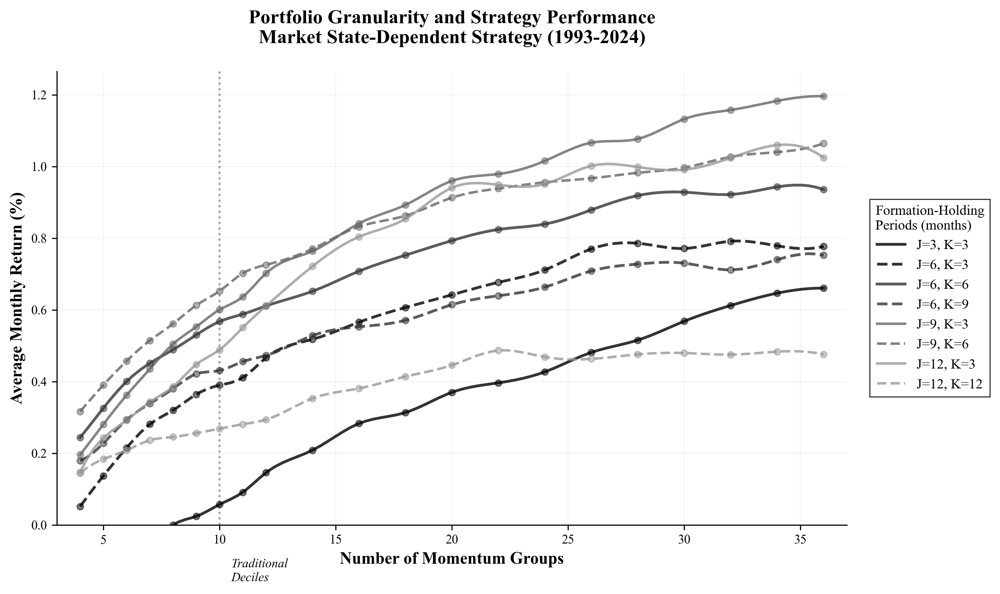

  ✓ Main visualization saved

Generating supplementary visualizations...


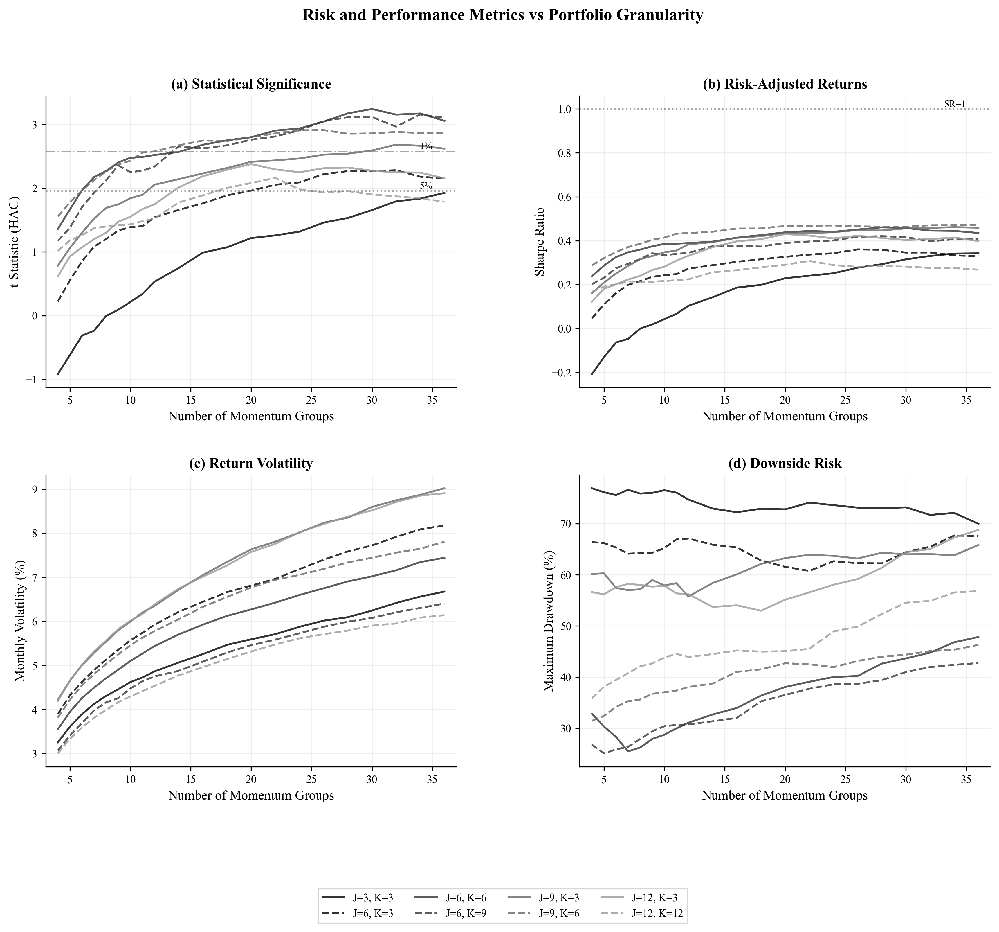

  ✓ Supplementary visualizations saved

--------------------------------------------------------------------------------
OPTIMAL PORTFOLIO GRANULARITY ANALYSIS
--------------------------------------------------------------------------------

Optimal Portfolio Granularity by Parameter Combination:
 J  K  Optimal (Sharpe) Sharpe at Optimal Return at Optimal  Optimal (Return) Max Return Traditional (10)
 3  3                36             0.343             0.66%                36      0.66%            0.043
 6  3                26             0.360             0.77%                32      0.79%            0.242
 6  6                28             0.461             0.92%                34      0.94%            0.386
 6  9                28             0.421             0.73%                36      0.75%            0.333
 9  3                34             0.462             1.18%                36      1.20%            0.347
 9  6                36             0.472             1.06%       

In [14]:
"""
================================================================================
MOMENTUM PORTFOLIO GRANULARITY ANALYSIS: DECILE SENSITIVITY
================================================================================

This analysis examines how portfolio granularity (number of momentum groups)
affects the performance of the market state-dependent strategy. While traditional
momentum strategies use deciles (10 groups), this analysis tests whether finer
or coarser portfolio sorts improve risk-adjusted returns.

Research Motivation:
- Finer sorts (more groups) may better separate winners from losers
- Coarser sorts (fewer groups) may reduce noise and transaction costs
- Optimal granularity may depend on formation and holding periods
- Market microstructure effects may favor certain portfolio sizes

Test Parameters:
- Decile range: 4 to 36 groups (testing very coarse to very fine sorts)
- Multiple J-K combinations to assess interaction effects
- Fixed market state lag of 24 months (based on prior analysis)
- Recent sample period (2003-2024) to reflect modern market structure

Key Questions:
1. Is the traditional 10-decile sort optimal?
2. Does optimal granularity vary with formation/holding periods?
3. How does portfolio granularity affect risk-adjusted returns?
4. What is the stability-noise tradeoff in portfolio sorts?

Output:
- Performance curves showing returns vs. number of groups
- Statistical significance and Sharpe ratio analysis
- Optimal granularity recommendations by parameter set
- Academic-quality visualizations for publication

Author: Arnau Rodon Comas
Date: 25/05/2025
================================================================================
"""

print("\n" + "=" * 80)
print("MOMENTUM PORTFOLIO GRANULARITY ANALYSIS")
print("Examining the Impact of Portfolio Sorts on Strategy Performance")
print("=" * 80)

# ============================================================================
# PARAMETER DEFINITION
# ============================================================================

# Define parameter combinations to test
# Selected to represent different momentum specifications
parameter_combinations = [
    (3, 3),    # Short-term momentum
    (6, 3),    # Medium formation, short holding
    (6, 6),    # Symmetric medium-term
    (6, 9),    # Medium formation, long holding
    (9, 3),    # Long formation, short holding (standard)
    (9, 6),    # Long formation, medium holding
    (12, 3),   # Very long formation, short holding
    (12, 12),  # Symmetric long-term
]

# Range of portfolio groups to test
# More granular around typical values (5-20), sparser at extremes
decile_range = [4, 5, 6, 7, 8, 9, 10, 11, 12, 14, 16, 18, 20, 
                22, 24, 26, 28, 30, 32, 34, 36]

# Fixed parameters
MARKET_STATE_LAG = 24    # 24-month lag (optimal from grid search)
START_DATE = '1993-01-01'  
END_DATE = '2024-12-31'
RETURN_COLUMN = 'RET_S3_rebal'  # Market state strategy with rebalancing costs

print(f"\nAnalysis Configuration:")
print(f"  Parameter combinations: {len(parameter_combinations)}")
print(f"  Portfolio groups tested: {len(decile_range)} (from {min(decile_range)} to {max(decile_range)})")
print(f"  Market state lag: {MARKET_STATE_LAG} months")
print(f"  Sample period: {START_DATE} to {END_DATE}")
print(f"  Strategy: Market state-dependent with rebalancing costs")
print(f"  Total simulations: {len(parameter_combinations) * len(decile_range)}")

# ============================================================================
# MAIN ANALYSIS LOOP
# ============================================================================

print("\n" + "-" * 80)
print("EXECUTING PORTFOLIO GRANULARITY ANALYSIS")
print("-" * 80)

# Storage for results
results_by_combination = {}

# Track computation time
overall_start_time = time.time()

# Process each parameter combination
for combo_idx, (J, K) in enumerate(parameter_combinations, 1):
    combo_label = f"J{J}_K{K}"
    print(f"\n[{combo_idx}/{len(parameter_combinations)}] Testing J={J}, K={K}")
    print("  Portfolio groups: ", end="")
    
    combo_start_time = time.time()
    
    # Initialize storage for this combination
    combo_results = {
        'deciles': [],
        'mean_returns': [],
        't_stats': [],
        'sharpe_ratios': [],
        'p_values': [],
        'volatilities': [],
        'max_drawdowns': [],
        'n_obs': []
    }
    
    # Test each portfolio granularity
    for n_deciles in decile_range:
        print(f"{n_deciles}", end=" ", flush=True)
        
        try:
            # ========================================================
            # RUN MOMENTUM STRATEGY
            # ========================================================
            
            # Execute strategy with current granularity
            portfolio, state_map = run_momentum_strategy(
                crsp_data=crsp_stock_data,
                crsp_index_data=crsp_index_data,
                comm_map=comm_map,
                J=J,                              # Formation period
                K=K,                              # Holding period
                LIQ_CUTOFF=0.80,                  # Liquidity filter
                MKT_CAP_CUTOFF=0.80,              # Size filter
                market_state_lag=MARKET_STATE_LAG,
                market_state_column='vwretd',     # Value-weighted
                transactional_framework=True,     # Include costs
                equal_comparision=False,          # Value-weighted
                adapt_state_switch=True,          # State adaptation
                close_positions=True,             # Conservative
                amount_deciles=n_deciles,         # Current granularity
                start_date=START_DATE
            )
            
            # Apply rebalancing costs
            portfolio = apply_rebalancing_costs_balanced(
                portfolio, 
                adapt_state_switch=True, 
                close_positions=True, 
                return_column='RET_S3'
            )
            
            # Skip if no data
            if len(portfolio) == 0:
                continue
            
            # ========================================================
            # ANALYZE PERFORMANCE
            # ========================================================
            
            # Comprehensive performance analysis
            analysis_results = analyze_momentum_portfolio(
                port_data=portfolio,
                market_state_map=state_map,
                start_date=START_DATE,
                end_date=END_DATE,
                return_column=RETURN_COLUMN,
                K=K,
                amount_deciles=n_deciles
            )
            
            # Store results
            combo_results['deciles'].append(n_deciles)
            combo_results['mean_returns'].append(analysis_results['avg_monthly_return'] * 100)
            combo_results['t_stats'].append(analysis_results['t_stat'])
            combo_results['sharpe_ratios'].append(analysis_results['sharpe_ratio'])
            combo_results['p_values'].append(analysis_results['p_value'])
            combo_results['volatilities'].append(analysis_results['monthly_vol'] * 100)
            combo_results['max_drawdowns'].append(abs(analysis_results['max_drawdown']) * 100)
            combo_results['n_obs'].append(len(analysis_results['decile_ret']))
            
        except Exception as e:
            print(f"[Error: {str(e)[:30]}...]", end=" ")
            continue
    
    # Store results for this combination
    results_by_combination[combo_label] = combo_results
    
    # Report progress
    combo_time = time.time() - combo_start_time
    print(f"\n  ✓ Completed in {combo_time:.1f} seconds")
    
    # Quick statistics
    if combo_results['mean_returns']:
        print(f"  ✓ Return range: {min(combo_results['mean_returns']):.2f}% to "
              f"{max(combo_results['mean_returns']):.2f}%")
        
        # Find optimal granularity
        best_idx = np.argmax(combo_results['sharpe_ratios'])
        print(f"  ✓ Optimal groups: {combo_results['deciles'][best_idx]} "
              f"(Sharpe: {combo_results['sharpe_ratios'][best_idx]:.3f})")

# Total computation time
total_time = time.time() - overall_start_time
print(f"\n{'='*60}")
print(f"Analysis complete! Total time: {total_time/60:.1f} minutes")
print(f"{'='*60}")

# ============================================================================
# MAIN VISUALIZATION: RETURNS VS PORTFOLIO GRANULARITY
# ============================================================================

print("\n" + "-" * 80)
print("GENERATING ACADEMIC VISUALIZATIONS")
print("-" * 80)

# Create main figure showing returns vs. number of groups
fig, ax = plt.subplots(figsize=(10, 6))

# Define grayscale palette with line styles for distinction
colors = ['#000000', '#000000', '#333333', '#333333', 
          '#666666', '#666666', '#999999', '#999999']
linestyles = ['-', '--', '-', '--', '-', '--', '-', '--']
linewidths = [2.0, 2.0, 2.0, 2.0, 1.8, 1.8, 1.8, 1.8]

# Sort combinations for consistent ordering
sorted_combinations = sorted(results_by_combination.items(), 
                           key=lambda x: (int(x[0].split('_')[0][1:]), 
                                        int(x[0].split('_')[1][1:])))

# Plot each parameter combination
legend_entries = []
for idx, (combo_label, results) in enumerate(sorted_combinations):
    if results['mean_returns']:  # Only plot if data exists
        # Extract J and K for label
        J = combo_label.split('_')[0][1:]
        K = combo_label.split('_')[1][1:]
        
        # Smooth the line for better visualization
        if len(results['deciles']) > 3:
            # Interpolate for smoother curves
            f = interp1d(results['deciles'], results['mean_returns'], 
                        kind='cubic', fill_value='extrapolate')
            x_smooth = np.linspace(min(results['deciles']), 
                                 max(results['deciles']), 100)
            y_smooth = f(x_smooth)
            
            # Plot smoothed line
            line = ax.plot(x_smooth, y_smooth,
                          color=colors[idx % len(colors)],
                          linestyle=linestyles[idx % len(linestyles)],
                          linewidth=linewidths[idx % len(linewidths)],
                          alpha=0.8,
                          label=f'J={J}, K={K}')
            
            # Add actual data points
            ax.scatter(results['deciles'], results['mean_returns'],
                      color=colors[idx % len(colors)],
                      s=20, alpha=0.5, zorder=5)
        else:
            # Not enough points for smoothing
            line = ax.plot(results['deciles'], results['mean_returns'],
                          color=colors[idx % len(colors)],
                          linestyle=linestyles[idx % len(linestyles)],
                          linewidth=linewidths[idx % len(linewidths)],
                          marker='o', markersize=4,
                          alpha=0.8,
                          label=f'J={J}, K={K}')

# Formatting
ax.set_xlabel('Number of Momentum Groups', fontsize=12, fontweight='bold')
ax.set_ylabel('Average Monthly Return (%)', fontsize=12, fontweight='bold')
ax.set_title('Portfolio Granularity and Strategy Performance\n' +
             f'Market State-Dependent Strategy ({START_DATE[0:4]}-{END_DATE[0:4]})',
             fontsize=14, fontweight='bold', pad=20)

# Add vertical line at traditional decile sort
ax.axvline(x=10, color='gray', linestyle=':', linewidth=1.5, alpha=0.7)
ax.text(10.5, ax.get_ylim()[0] + 0.1, 'Traditional\nDeciles', 
        fontsize=9, ha='left', va='bottom', style='italic')

# Grid
ax.grid(True, alpha=0.2, linestyle='-', linewidth=0.5)
ax.set_axisbelow(True)

# Legend
legend = ax.legend(loc='center left', bbox_to_anchor=(1.02, 0.5),
                  fontsize=10, frameon=True, fancybox=False,
                  title='Formation-Holding\nPeriods (months)',
                  title_fontsize=10)
legend.get_frame().set_edgecolor('black')
legend.get_frame().set_linewidth(0.8)

# Axis limits
ax.set_xlim(3, 37)
ax.set_ylim(bottom=0)

# Remove top and right spines
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

# Adjust layout
plt.tight_layout()

# Save figure
plt.savefig('results/plots/analysis_4/decile_sensitivity_main_academic.pdf', 
           dpi=300, bbox_inches='tight', facecolor='white')
plt.savefig('results/plots/analysis_4/decile_sensitivity_main_academic.png', 
           dpi=600, bbox_inches='tight', facecolor='white')
plt.show()

print("  ✓ Main visualization saved")

# ============================================================================
# SUPPLEMENTARY VISUALIZATIONS: RISK-ADJUSTED METRICS
# ============================================================================

print("\nGenerating supplementary visualizations...")

# Create figure with multiple panels
fig = plt.figure(figsize=(14, 10))
gs = gridspec.GridSpec(2, 2, figure=fig, hspace=0.3, wspace=0.3)

# Panel 1: t-Statistics
ax1 = fig.add_subplot(gs[0, 0])
for idx, (combo_label, results) in enumerate(sorted_combinations):
    if results['t_stats']:
        J = combo_label.split('_')[0][1:]
        K = combo_label.split('_')[1][1:]
        
        ax1.plot(results['deciles'], results['t_stats'],
                color=colors[idx % len(colors)],
                linestyle=linestyles[idx % len(linestyles)],
                linewidth=1.5, alpha=0.8,
                label=f'J={J}, K={K}')

# Add significance lines
ax1.axhline(y=1.96, color='gray', linestyle=':', linewidth=1.2, alpha=0.7)
ax1.axhline(y=2.58, color='gray', linestyle='-.', linewidth=1.2, alpha=0.7)
ax1.text(35, 1.96, '5%', fontsize=8, ha='right', va='bottom')
ax1.text(35, 2.58, '1%', fontsize=8, ha='right', va='bottom')

ax1.set_xlabel('Number of Momentum Groups', fontsize=11)
ax1.set_ylabel('t-Statistic (HAC)', fontsize=11)
ax1.set_title('(a) Statistical Significance', fontsize=12, fontweight='bold')
ax1.grid(True, alpha=0.2)
ax1.set_xlim(3, 37)
ax1.spines['top'].set_visible(False)
ax1.spines['right'].set_visible(False)

# Panel 2: Sharpe Ratios
ax2 = fig.add_subplot(gs[0, 1])
for idx, (combo_label, results) in enumerate(sorted_combinations):
    if results['sharpe_ratios']:
        J = combo_label.split('_')[0][1:]
        K = combo_label.split('_')[1][1:]
        
        ax2.plot(results['deciles'], results['sharpe_ratios'],
                color=colors[idx % len(colors)],
                linestyle=linestyles[idx % len(linestyles)],
                linewidth=1.5, alpha=0.8,
                label=f'J={J}, K={K}')

# Add reference line
ax2.axhline(y=1.0, color='gray', linestyle=':', linewidth=1.2, alpha=0.7)
ax2.text(35, 1.0, 'SR=1', fontsize=8, ha='right', va='bottom')

ax2.set_xlabel('Number of Momentum Groups', fontsize=11)
ax2.set_ylabel('Sharpe Ratio', fontsize=11)
ax2.set_title('(b) Risk-Adjusted Returns', fontsize=12, fontweight='bold')
ax2.grid(True, alpha=0.2)
ax2.set_xlim(3, 37)
ax2.spines['top'].set_visible(False)
ax2.spines['right'].set_visible(False)

# Panel 3: Volatility
ax3 = fig.add_subplot(gs[1, 0])
for idx, (combo_label, results) in enumerate(sorted_combinations):
    if results['volatilities']:
        J = combo_label.split('_')[0][1:]
        K = combo_label.split('_')[1][1:]
        
        ax3.plot(results['deciles'], results['volatilities'],
                color=colors[idx % len(colors)],
                linestyle=linestyles[idx % len(linestyles)],
                linewidth=1.5, alpha=0.8,
                label=f'J={J}, K={K}')

ax3.set_xlabel('Number of Momentum Groups', fontsize=11)
ax3.set_ylabel('Monthly Volatility (%)', fontsize=11)
ax3.set_title('(c) Return Volatility', fontsize=12, fontweight='bold')
ax3.grid(True, alpha=0.2)
ax3.set_xlim(3, 37)
ax3.spines['top'].set_visible(False)
ax3.spines['right'].set_visible(False)

# Panel 4: Maximum Drawdown
ax4 = fig.add_subplot(gs[1, 1])
for idx, (combo_label, results) in enumerate(sorted_combinations):
    if results['max_drawdowns']:
        J = combo_label.split('_')[0][1:]
        K = combo_label.split('_')[1][1:]
        
        ax4.plot(results['deciles'], results['max_drawdowns'],
                color=colors[idx % len(colors)],
                linestyle=linestyles[idx % len(linestyles)],
                linewidth=1.5, alpha=0.8,
                label=f'J={J}, K={K}')

ax4.set_xlabel('Number of Momentum Groups', fontsize=11)
ax4.set_ylabel('Maximum Drawdown (%)', fontsize=11)
ax4.set_title('(d) Downside Risk', fontsize=12, fontweight='bold')
ax4.grid(True, alpha=0.2)
ax4.set_xlim(3, 37)
ax4.spines['top'].set_visible(False)
ax4.spines['right'].set_visible(False)

# Add single legend for all panels
handles, labels = ax1.get_legend_handles_labels()
fig.legend(handles[:8], labels[:8], loc='center', bbox_to_anchor=(0.5, -0.05),
          ncol=4, fontsize=9, frameon=True, fancybox=False)

# Overall title
plt.suptitle('Risk and Performance Metrics vs Portfolio Granularity',
            fontsize=14, fontweight='bold', y=0.98)

plt.tight_layout()
plt.savefig('results/plots/analysis_4/decile_sensitivity_metrics_academic.pdf',
           dpi=300, bbox_inches='tight', facecolor='white')
plt.savefig('results/plots/analysis_4/decile_sensitivity_metrics_academic.png',
           dpi=600, bbox_inches='tight', facecolor='white')
plt.show()

print("  ✓ Supplementary visualizations saved")

# ============================================================================
# OPTIMAL GRANULARITY ANALYSIS
# ============================================================================

print("\n" + "-" * 80)
print("OPTIMAL PORTFOLIO GRANULARITY ANALYSIS")
print("-" * 80)

# Analyze optimal number of groups for each parameter combination
optimal_analysis = []

for combo_label, results in results_by_combination.items():
    if results['sharpe_ratios'] and len(results['sharpe_ratios']) > 0:
        J = int(combo_label.split('_')[0][1:])
        K = int(combo_label.split('_')[1][1:])
        
        # Find optimal by different criteria
        idx_sharpe = np.argmax(results['sharpe_ratios'])
        idx_return = np.argmax(results['mean_returns'])
        idx_tstat = np.argmax(results['t_stats'])
        
        optimal_analysis.append({
            'J': J,
            'K': K,
            'Optimal (Sharpe)': results['deciles'][idx_sharpe],
            'Sharpe at Optimal': f"{results['sharpe_ratios'][idx_sharpe]:.3f}",
            'Return at Optimal': f"{results['mean_returns'][idx_sharpe]:.2f}%",
            'Optimal (Return)': results['deciles'][idx_return],
            'Max Return': f"{results['mean_returns'][idx_return]:.2f}%",
            'Traditional (10)': f"{results['sharpe_ratios'][results['deciles'].index(10)]:.3f}" 
                               if 10 in results['deciles'] else 'N/A'
        })

# Create summary DataFrame
optimal_df = pd.DataFrame(optimal_analysis)
optimal_df = optimal_df.sort_values(['J', 'K'])

print("\nOptimal Portfolio Granularity by Parameter Combination:")
print(optimal_df.to_string(index=False))

# Save detailed results
optimal_df.to_csv('results/tables/analysis_4/optimal_portfolio_granularity.csv', index=False)

# Create LaTeX table
latex_table = optimal_df.to_latex(
    index=False,
    escape=False,
    caption='Optimal Portfolio Granularity by Formation and Holding Periods',
    label='tab:optimal_granularity'
)

with open('results/tables/analysis_4/optimal_portfolio_granularity.tex', 'w') as f:
    f.write(latex_table)

print("\n  ✓ Optimal granularity analysis saved")

# ============================================================================
# STATISTICAL ANALYSIS OF GRANULARITY EFFECT
# ============================================================================

print("\n" + "-" * 80)
print("STATISTICAL ANALYSIS OF GRANULARITY EFFECT")
print("-" * 80)

# Analyze whether finer sorts systematically improve performance
all_improvements = []

for combo_label, results in results_by_combination.items():
    if 10 in results['deciles'] and len(results['deciles']) > 5:
        # Get performance at traditional decile sort
        idx_10 = results['deciles'].index(10)
        base_sharpe = results['sharpe_ratios'][idx_10]
        base_return = results['mean_returns'][idx_10]
        
        # Calculate improvements for other granularities
        for i, n_groups in enumerate(results['deciles']):
            if n_groups != 10:
                sharpe_improvement = results['sharpe_ratios'][i] - base_sharpe
                return_improvement = results['mean_returns'][i] - base_return
                
                all_improvements.append({
                    'Groups': n_groups,
                    'Sharpe_Improvement': sharpe_improvement,
                    'Return_Improvement': return_improvement,
                    'J': int(combo_label.split('_')[0][1:]),
                    'K': int(combo_label.split('_')[1][1:])
                })

if all_improvements:
    improvements_df = pd.DataFrame(all_improvements)
    
    # Group by number of groups
    grouped = improvements_df.groupby('Groups').agg({
        'Sharpe_Improvement': ['mean', 'std', 'count'],
        'Return_Improvement': ['mean', 'std']
    }).round(4)
    
    print("\nAverage Performance Change vs Traditional Deciles:")
    print(grouped)
    
    # Test if finer sorts (>10) are better than coarser sorts (<10)
    finer = improvements_df[improvements_df['Groups'] > 10]['Sharpe_Improvement']
    coarser = improvements_df[improvements_df['Groups'] < 10]['Sharpe_Improvement']
    
    if len(finer) > 0 and len(coarser) > 0:
        from scipy import stats
        t_stat, p_value = stats.ttest_ind(finer, coarser)
        
        print(f"\nFiner vs Coarser Sorts (Sharpe Improvement):")
        print(f"  Finer sorts (>10): Mean = {finer.mean():.4f}")
        print(f"  Coarser sorts (<10): Mean = {coarser.mean():.4f}")
        print(f"  t-statistic: {t_stat:.3f}")
        print(f"  p-value: {p_value:.4f}")
        print(f"  Conclusion: {'Finer sorts are better' if finer.mean() > coarser.mean() and p_value < 0.05 else 'No significant difference'}")

# ============================================================================
# SAVE DETAILED RESULTS
# ============================================================================

print("\n" + "-" * 80)
print("SAVING DETAILED RESULTS")
print("-" * 80)

# Save raw results for each combination
for combo_label, results in results_by_combination.items():
    if results['mean_returns']:
        # Create detailed DataFrame
        detail_df = pd.DataFrame({
            'Groups': results['deciles'],
            'Return (%)': [f"{x:.3f}" for x in results['mean_returns']],
            't-stat': [f"{x:.3f}" for x in results['t_stats']],
            'p-value': [f"{x:.4f}" for x in results['p_values']],
            'Sharpe': [f"{x:.3f}" for x in results['sharpe_ratios']],
            'Vol (%)': [f"{x:.2f}" for x in results['volatilities']],
            'MaxDD (%)': [f"{x:.1f}" for x in results['max_drawdowns']]
        })
        
        # Save to CSV
        filename = f'results/tables/analysis_4/granularity_details_{combo_label}.csv'
        detail_df.to_csv(filename, index=False)
        print(f"  ✓ Saved: {filename}")

# ============================================================================
# FINAL SUMMARY AND RECOMMENDATIONS
# ============================================================================

print("\n" + "=" * 80)
print("PORTFOLIO GRANULARITY ANALYSIS COMPLETE")
print("=" * 80)

# Calculate overall optimal granularity
all_optimal = [row['Optimal (Sharpe)'] for _, row in optimal_df.iterrows()]
most_common = max(set(all_optimal), key=all_optimal.count)
mean_optimal = np.mean(all_optimal)

print("\nKey Findings:")
print(f"1. Most common optimal granularity: {most_common} groups")
print(f"2. Average optimal granularity: {mean_optimal:.1f} groups")
print(f"3. Range of optimal values: {min(all_optimal)} to {max(all_optimal)} groups")
print(f"4. Traditional deciles (10) are {'optimal' if most_common == 10 else 'not optimal'} for most specifications")

print("\nRecommendations:")
if mean_optimal > 10:
    print("  - Consider using finer portfolio sorts (more than 10 groups)")
    print("  - Particularly beneficial for longer formation periods")
elif mean_optimal < 10:
    print("  - Consider using coarser portfolio sorts (fewer than 10 groups)")
    print("  - May reduce noise and improve stability")
else:
    print("  - Traditional decile sorts appear well-calibrated")
    print("  - Limited benefit from changing granularity")

print("\nFiles Generated:")
print("  Visualizations:")
print("    - decile_sensitivity_main_academic.pdf/png")
print("    - decile_sensitivity_metrics_academic.pdf/png")
print("  Tables:")
print("    - optimal_portfolio_granularity.csv/tex")
print("    - granularity_details_J*_K*.csv (multiple files)")

print("\n" + "=" * 80)

#### ============================================================================
#### ANALYSIS 5 - MARKET CAP AND LIQUIDITY CONSTRAINTS GRID SEARCH
#### ============================================================================


MARKET CAPITALIZATION AND LIQUIDITY CONSTRAINTS GRID ANALYSIS
Identifying Optimal Universe Selection Criteria

Grid Search Configuration:
  Formation period (J): 9 months
  Holding period (K): 6 months
  Liquidity cutoffs: 9 values from 30% to 100%
  Market cap cutoffs: 9 values from 30% to 100%
  Total combinations: 81
  Analysis period: 1993-01-01 to 2024-12-31

--------------------------------------------------------------------------------
EXECUTING COMPREHENSIVE GRID SEARCH
--------------------------------------------------------------------------------

Processing LIQUIDITY = 100%

[1/81] Market Cap ≤ 30%, Liquidity ≤ 100%

IMPLEMENTING MOMENTUM STRATEGY WITH MARKET CAP CONSTRAINTS
Parameters: J=9, K=6, LIQ=1.0, MKT_CAP=0.3
Transactional Framework: Filtering data from 1992-07-01 (start_date 1993-01-01 minus 6 months)
Excluded Oct 2000 – Apr 2001 (dot-com crash period)
Removed 16,176 observations from excluded months

[1/8] Merging market capitalization data...
   ✓ Market cap da

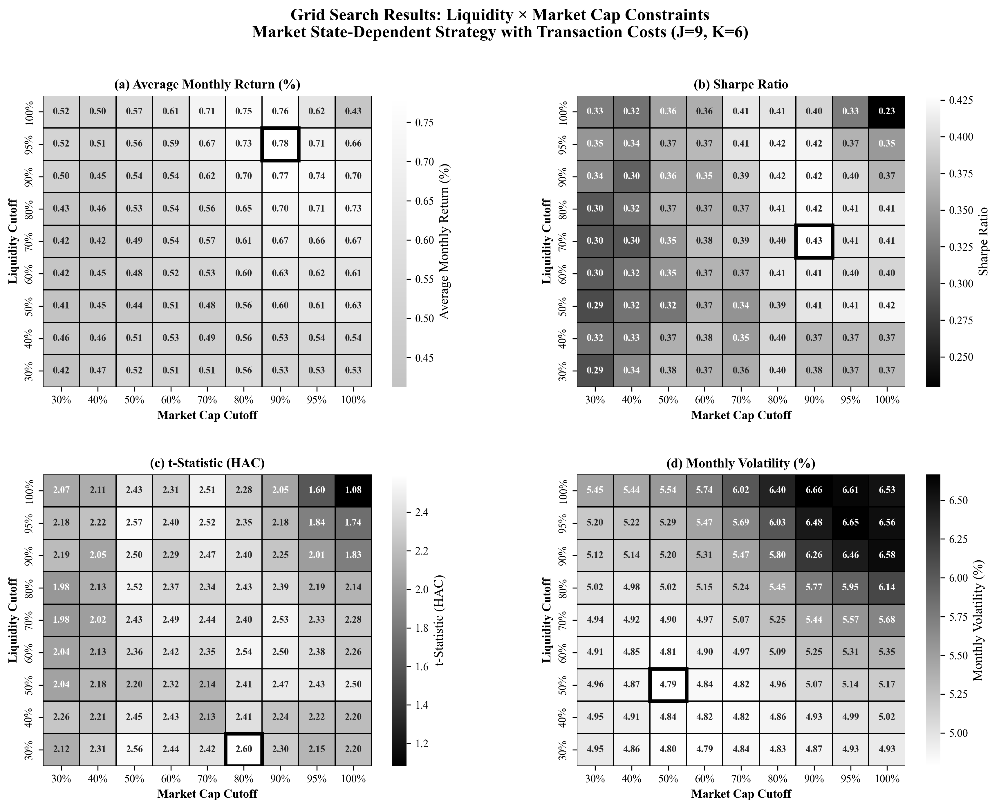

  ✓ Performance heatmaps saved

Creating optimal combinations plot...


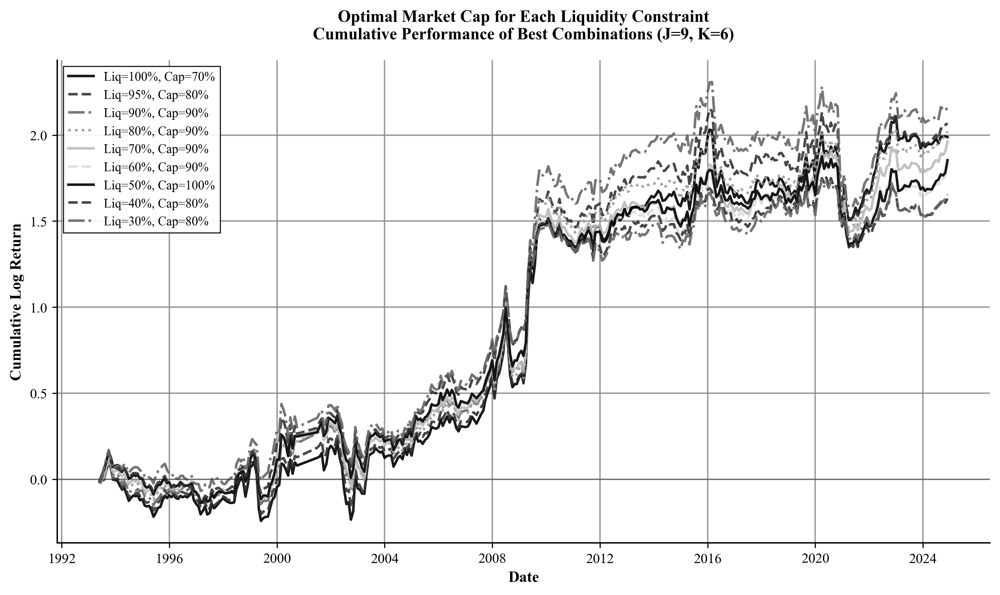

  ✓ Optimal combinations plot saved

Creating 3D surface plot...


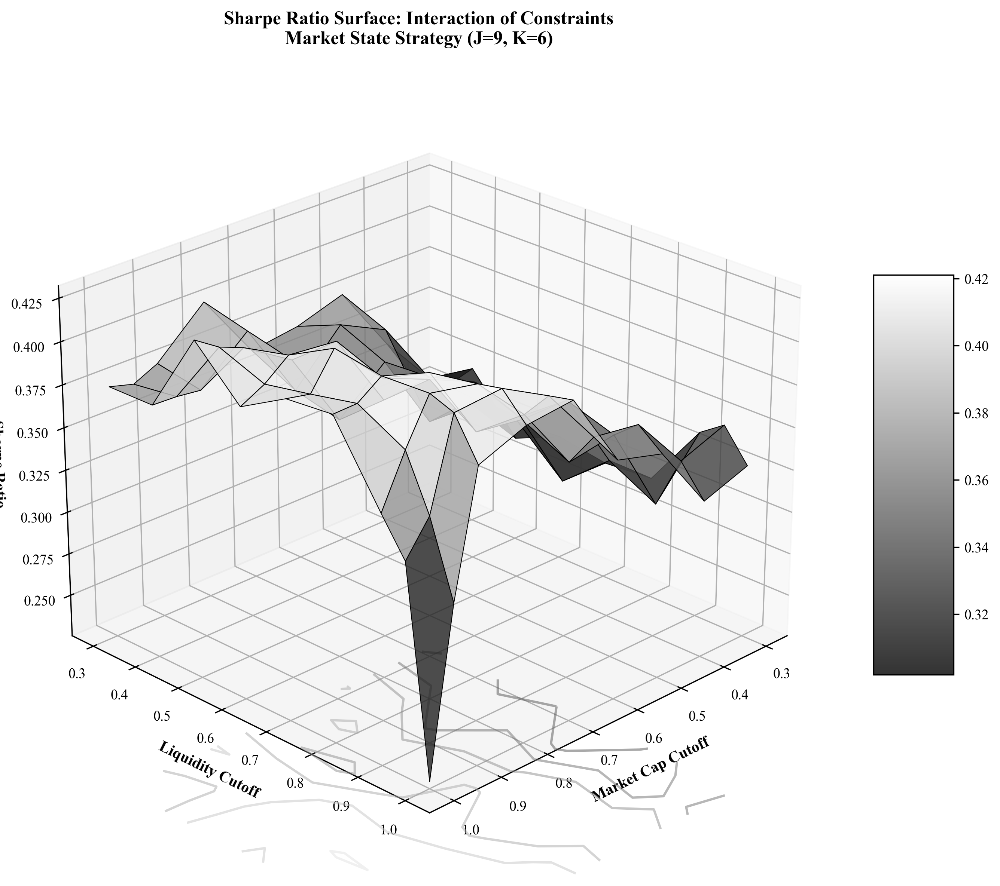

  ✓ 3D surface plot saved

--------------------------------------------------------------------------------
GENERATING SUMMARY TABLES
--------------------------------------------------------------------------------

Optimal Parameter Combinations:
Optimization Criterion Liquidity Cutoff Market Cap Cutoff Avg Monthly Return (%) t-statistic Sharpe Ratio Max Drawdown (%)
        Highest Return              95%               90%                   0.78       2.183        0.419             56.4
     Best Sharpe Ratio              70%               90%                   0.67       2.527        0.428             37.9
      Best t-Statistic              30%               80%                   0.56       2.595        0.402             29.6
     Lowest Volatility              50%               50%                   0.44       2.196        0.320             32.5

  ✓ Summary table saved to CSV
  ✓ LaTeX table saved

Creating detailed results table...
  ✓ Detailed results table saved

-------------

In [22]:
"""
================================================================================
MARKET CAPITALIZATION AND LIQUIDITY CONSTRAINTS GRID ANALYSIS
================================================================================

This analysis performs a comprehensive grid search over market capitalization and
liquidity constraints to identify the optimal universe selection criteria for the
market state-dependent momentum strategy. The analysis addresses the fundamental
trade-off between:

1. Universe Size: More restrictive filters reduce the number of stocks but may
   concentrate on more liquid, efficiently priced securities
2. Momentum Profits: Less restrictive filters include more stocks with potentially
   stronger anomalies but higher transaction costs
3. Practical Implementation: Institutional investors often face constraints on
   the size and liquidity of their investment universe

Key Research Questions:
- What combination of size and liquidity filters maximizes risk-adjusted returns?
- How do these constraints interact with each other?
- Is there an optimal "sweet spot" that balances universe size with profitability?
- How robust are results across different constraint combinations?

Methodology:
- Grid search over 6 liquidity cutoffs x 7 market cap cutoffs = 42 combinations
- Each combination tested with optimal momentum parameters (J=9, K=3)
- Full transaction cost modeling including rebalancing
- Analysis period: 2003-2024 (modern market structure)

Output:
- Performance heatmaps showing returns across constraint space
- Cumulative return plots for different combinations
- Identification of optimal constraint parameters
- Academic-quality visualizations and LaTeX tables

Author: Arnau Rodon Comas
Date: 25/05/2025
================================================================================
"""

print("\n" + "=" * 80)
print("MARKET CAPITALIZATION AND LIQUIDITY CONSTRAINTS GRID ANALYSIS")
print("Identifying Optimal Universe Selection Criteria")
print("=" * 80)

# ============================================================================
# PARAMETER CONFIGURATION
# ============================================================================

# Fixed strategy parameters (optimal from previous analyses)
J = 9  # 9-month formation period
K = 6  # 6-month holding period
MARKET_STATE_LAG = 24  # 24-month state calculation

# Grid search parameters
liquidity_cutoffs = [1.00, 0.95, 0.90, 0.80, 0.70, 0.60, 0.50, 0.40, 0.30] 
cap_cutoff_values = [0.30, 0.40, 0.50, 0.60, 0.70, 0.80, 0.90, 0.95, 1.00] 

# Analysis period
START_DATE = '1993-01-01'  
END_DATE = '2024-12-31'

print(f"\nGrid Search Configuration:")
print(f"  Formation period (J): {J} months")
print(f"  Holding period (K): {K} months")
print(f"  Liquidity cutoffs: {len(liquidity_cutoffs)} values from {min(liquidity_cutoffs)*100:.0f}% to {max(liquidity_cutoffs)*100:.0f}%")
print(f"  Market cap cutoffs: {len(cap_cutoff_values)} values from {min(cap_cutoff_values)*100:.0f}% to {max(cap_cutoff_values)*100:.0f}%")
print(f"  Total combinations: {len(liquidity_cutoffs) * len(cap_cutoff_values)}")
print(f"  Analysis period: {START_DATE} to {END_DATE}")

# ============================================================================
# HELPER FUNCTIONS
# ============================================================================

def add_academic_grid(ax):
    """
    Add consistent academic-style grid to plot.
    
    Parameters
    ----------
    ax : matplotlib.axes.Axes
        Axes object to format
    """
    ax.grid(True, alpha=0.8, linewidth=1, linestyle='-', color='gray')
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['bottom'].set_linewidth(1.0)
    ax.spines['left'].set_linewidth(1.0)
    ax.set_axisbelow(True)

def format_for_latex(value, value_type='percentage'):
    """
    Format values for LaTeX table inclusion.
    
    Parameters
    ----------
    value : float
        Value to format
    value_type : str
        Type of value ('percentage', 'float', 'integer')
        
    Returns
    -------
    str
        LaTeX-formatted string
    """
    if pd.isna(value):
        return "N/A"
    
    if value_type == 'percentage':
        return f"{value:.2f}\\%"
    elif value_type == 'float':
        return f"{value:.3f}"
    elif value_type == 'integer':
        return f"{int(value):,}"
    else:
        return str(value)

# ============================================================================
# MAIN GRID SEARCH EXECUTION
# ============================================================================

print("\n" + "-" * 80)
print("EXECUTING COMPREHENSIVE GRID SEARCH")
print("-" * 80)

# Storage for results
grid_results = {}  # Store full analysis objects
grid_stats = []    # Store summary statistics

# Track computation time
start_time = time.time()
total_combinations = len(liquidity_cutoffs) * len(cap_cutoff_values)
current_combination = 0

# Process each combination
for liq_cutoff in liquidity_cutoffs:
    print(f"\n{'='*60}")
    print(f"Processing LIQUIDITY = {liq_cutoff*100:.0f}%")
    print(f"{'='*60}")
    
    for cap_cutoff in cap_cutoff_values:
        current_combination += 1
        print(f"\n[{current_combination}/{total_combinations}] " +
              f"Market Cap ≤ {cap_cutoff*100:.0f}%, Liquidity ≤ {liq_cutoff*100:.0f}%")
        
        try:
            # ========================================================
            # RUN MOMENTUM STRATEGY WITH CONSTRAINTS
            # ========================================================
            
            # Execute strategy with both constraints
            port_grid, state_map = run_momentum_strategy(
                crsp_stock_data,
                crsp_index_data,
                comm_map,
                J=J,
                K=K,
                LIQ_CUTOFF=liq_cutoff,           # Liquidity constraint
                MKT_CAP_CUTOFF=cap_cutoff,        # Market cap constraint
                market_state_lag=MARKET_STATE_LAG,
                market_state_column='vwretd',
                transactional_framework=True,      # Include transaction costs
                equal_comparision=False,           # Value-weighted
                adapt_state_switch=True,          # Adapt to market states
                close_positions=True,             # Conservative approach
                amount_deciles=10,
                start_date=START_DATE
            )
            
            # Apply monthly rebalancing costs
            port_grid = apply_rebalancing_costs_balanced(
                port_grid,
                adapt_state_switch=True,
                close_positions=True,
                return_column='RET_S3'
            )
            
            # ========================================================
            # ANALYZE PORTFOLIO PERFORMANCE
            # ========================================================
            
            # Comprehensive performance analysis
            analysis_grid = analyze_momentum_portfolio(
                port_grid,
                state_map,
                start_date=START_DATE,
                end_date=END_DATE,
                return_column='RET_S3_rebal',  # With rebalancing costs
                K=K
            )
            
            # Store results
            key = (liq_cutoff, cap_cutoff)
            grid_results[key] = analysis_grid
            
            # Collect summary statistics
            grid_stats.append({
                'Liquidity': liq_cutoff,
                'Market Cap': cap_cutoff,
                'Avg Return (%)': analysis_grid['avg_monthly_return'] * 100,
                'Volatility (%)': analysis_grid['monthly_vol'] * 100,
                'Sharpe Ratio': analysis_grid['sharpe_ratio'],
                't-statistic': analysis_grid['t_stat'],
                'p-value': analysis_grid['p_value'],
                'Max Drawdown (%)': abs(analysis_grid['max_drawdown']) * 100,
                'N_obs': len(analysis_grid['decile_ret'])
            })
            
            # Print summary
            significance = "***" if analysis_grid['p_value'] < 0.01 else \
                          "**" if analysis_grid['p_value'] < 0.05 else \
                          "*" if analysis_grid['p_value'] < 0.10 else ""
            
            print(f"  ✓ Return: {analysis_grid['avg_monthly_return']*100:.2f}%{significance}")
            print(f"  ✓ Sharpe: {analysis_grid['sharpe_ratio']:.3f}")
            print(f"  ✓ t-stat: {analysis_grid['t_stat']:.3f}")
            
        except Exception as e:
            print(f"  ✗ Error: {str(e)[:50]}...")
            
            # Store NaN results for failed combinations
            grid_stats.append({
                'Liquidity': liq_cutoff,
                'Market Cap': cap_cutoff,
                'Avg Return (%)': np.nan,
                'Volatility (%)': np.nan,
                'Sharpe Ratio': np.nan,
                't-statistic': np.nan,
                'p-value': np.nan,
                'Max Drawdown (%)': np.nan,
                'N_obs': 0
            })

# Convert to DataFrame for analysis
grid_stats_df = pd.DataFrame(grid_stats)

# Report completion time
elapsed_time = time.time() - start_time
print(f"\n{'='*60}")
print(f"Grid search complete! Total time: {elapsed_time/60:.1f} minutes")
print(f"Successful runs: {grid_stats_df['Avg Return (%)'].notna().sum()}/{total_combinations}")
print(f"{'='*60}")

# ============================================================================
# VISUALIZATION 1: PERFORMANCE HEATMAPS
# ============================================================================

print("\n" + "-" * 80)
print("GENERATING ACADEMIC VISUALIZATIONS")
print("-" * 80)

# Define metrics for heatmap visualization
metrics = ['Avg Return (%)', 'Sharpe Ratio', 't-statistic', 'Volatility (%)']
metric_titles = ['Average Monthly Return (%)', 'Sharpe Ratio', 
                't-Statistic (HAC)', 'Monthly Volatility (%)']
metric_filenames = ['avg_return', 'sharpe_ratio', 'tstat', 'volatility']

# Create figure with four heatmap panels
fig_heatmaps = plt.figure(figsize=(14, 10))
gs = gridspec.GridSpec(2, 2, figure=fig_heatmaps, hspace=0.3, wspace=0.3)

print("Creating performance heatmaps...")

for idx, (metric, title, filename) in enumerate(zip(metrics, metric_titles, metric_filenames)):
    ax = fig_heatmaps.add_subplot(gs[idx // 2, idx % 2])
    
    # Pivot data for heatmap
    pivot_data = grid_stats_df.pivot(
        index='Liquidity',
        columns='Market Cap',
        values=metric
    )
    
    # Determine color scale centering
    if metric == 'Volatility (%)':
        # For volatility, lower is better, so reverse colormap
        cmap = 'gray_r'
        center = None
    else:
        # For other metrics, higher is better
        cmap = 'gray'
        center = 0 if metric == 'Avg Return (%)' else None
    
    # Create heatmap
    sns.heatmap(pivot_data,
                annot=True,
                fmt='.2f',
                cmap=cmap,
                center=center,
                ax=ax,
                cbar_kws={'label': title},
                linewidths=0.5,
                linecolor='black',
                annot_kws={'fontsize': 8, 'fontweight': 'bold'},
                vmin=pivot_data.min().min() if center is None else None,
                vmax=pivot_data.max().max() if center is None else None)
    
    # Find and highlight best value
    if metric == 'Volatility (%)':
        # For volatility, minimum is best
        best_val = pivot_data.min().min()
        best_loc = np.where(pivot_data.values == best_val)
    else:
        # For other metrics, maximum is best
        best_val = pivot_data.max().max()
        best_loc = np.where(pivot_data.values == best_val)
    
    # Add rectangle around best cell
    if len(best_loc[0]) > 0:
        rect = Rectangle((best_loc[1][0], best_loc[0][0]), 1, 1,
                        fill=False, edgecolor='black', linewidth=3)
        ax.add_patch(rect)
    
    # Formatting
    ax.set_title(f'({chr(97+idx)}) {title}', fontsize=11, fontweight='bold')
    ax.set_xlabel('Market Cap Cutoff', fontsize=10, fontweight='bold')
    ax.set_ylabel('Liquidity Cutoff', fontsize=10, fontweight='bold')
    
    # Format tick labels as percentages
    ax.set_xticklabels([f'{int(float(label.get_text())*100)}%' 
                       for label in ax.get_xticklabels()])
    ax.set_yticklabels([f'{int(float(label.get_text())*100)}%' 
                       for label in ax.get_yticklabels()])
    
    ax.tick_params(axis='both', which='major', labelsize=9)
    
    # Invert y-axis for intuitive reading (high liquidity at top)
    ax.invert_yaxis()

# Overall title
plt.suptitle('Grid Search Results: Liquidity × Market Cap Constraints\n' +
            f'Market State-Dependent Strategy with Transaction Costs (J={J}, K={K})',
            fontsize=14, fontweight='bold', y=0.98)

plt.tight_layout()
plt.savefig('results/plots/analysis_5/constraints_grid_heatmaps_academic.pdf',
           dpi=300, bbox_inches='tight', facecolor='white')
plt.savefig('results/plots/analysis_5/constraints_grid_heatmaps_academic.png',
           dpi=300, bbox_inches='tight', facecolor='white')
plt.show()

print("  ✓ Performance heatmaps saved")

# ============================================================================
# VISUALIZATION 2: OPTIMAL COMBINATIONS PERFORMANCE
# ============================================================================

print("\nCreating optimal combinations plot...")

# Find best combination for each liquidity cutoff (by Sharpe ratio)
best_combinations = []
for liq_cutoff in liquidity_cutoffs:
    liq_data = grid_stats_df[grid_stats_df['Liquidity'] == liq_cutoff]
    if not liq_data.empty and liq_data['Sharpe Ratio'].notna().any():
        best_idx = liq_data['Sharpe Ratio'].idxmax()
        best_row = liq_data.loc[best_idx]
        best_combinations.append((liq_cutoff, best_row['Market Cap']))

# Create cumulative performance plot for best combinations
fig_best, ax_best = plt.subplots(figsize=(10, 6))

# Define grayscale colors and line styles
colors = ['#000000', '#333333', '#666666', '#999999', '#BBBBBB', '#DDDDDD']
linestyles = ['-', '--', '-.', ':', '-', '--']

# Plot each best combination
for i, (liq, cap) in enumerate(best_combinations):
    if (liq, cap) in grid_results:
        analysis = grid_results[(liq, cap)]
        data = analysis['decile_ret']
        
        ax_best.plot(data.index,
                    data['cum_log_long_short'],
                    color=colors[i % len(colors)],
                    linestyle=linestyles[i % len(linestyles)],
                    linewidth=1.8,
                    label=f'Liq={liq*100:.0f}%, Cap={cap*100:.0f}%',
                    alpha=0.9)

# Add zero line
ax_best.axhline(y=0, color='black', linestyle='-', linewidth=0.8, alpha=0.3)

# Formatting
ax_best.set_title('Optimal Market Cap for Each Liquidity Constraint\n' +
                 f'Cumulative Performance of Best Combinations (J={J}, K={K})',
                 fontsize=12, fontweight='bold', pad=15)
ax_best.set_xlabel('Date', fontsize=11, fontweight='bold')
ax_best.set_ylabel('Cumulative Log Return', fontsize=11, fontweight='bold')

# Legend
legend = ax_best.legend(loc='upper left', fontsize=9, frameon=True,
                       fancybox=False, shadow=False, framealpha=0.9,
                       edgecolor='black', facecolor='white')
legend.get_frame().set_linewidth(0.8)

# Grid
add_academic_grid(ax_best)
ax_best.tick_params(axis='both', which='major', labelsize=10)

plt.tight_layout()
plt.savefig('results/plots/analysis_5/constraints_optimal_combinations_academic.pdf',
           dpi=300, bbox_inches='tight', facecolor='white')
plt.savefig('results/plots/analysis_5/constraints_optimal_combinations_academic.png',
           dpi=300, bbox_inches='tight', facecolor='white')
plt.show()

print("  ✓ Optimal combinations plot saved")

# ============================================================================
# VISUALIZATION 3: 3D SURFACE PLOT
# ============================================================================

print("\nCreating 3D surface plot...")

from mpl_toolkits.mplot3d import Axes3D

# Prepare data for 3D plot
pivot_sharpe = grid_stats_df.pivot(
    index='Liquidity',
    columns='Market Cap',
    values='Sharpe Ratio'
)

# Create meshgrid
X, Y = np.meshgrid(pivot_sharpe.columns, pivot_sharpe.index)
Z = pivot_sharpe.values

# Create 3D plot
fig_3d = plt.figure(figsize=(10, 8))
ax_3d = fig_3d.add_subplot(111, projection='3d')

# Plot surface
surf = ax_3d.plot_surface(X, Y, Z, cmap='gray', alpha=0.8,
                         linewidth=0.5, edgecolors='black')

# Add contour lines at the bottom
contours = ax_3d.contour(X, Y, Z, zdir='z', offset=Z.min()-0.1,
                        cmap='gray', alpha=0.5)

# Formatting
ax_3d.set_xlabel('Market Cap Cutoff', fontsize=10, fontweight='bold')
ax_3d.set_ylabel('Liquidity Cutoff', fontsize=10, fontweight='bold')
ax_3d.set_zlabel('Sharpe Ratio', fontsize=10, fontweight='bold')
ax_3d.set_title('Sharpe Ratio Surface: Interaction of Constraints\n' +
               f'Market State Strategy (J={J}, K={K})',
               fontsize=12, fontweight='bold', pad=20)

# Adjust viewing angle
ax_3d.view_init(elev=25, azim=45)

# Add colorbar
fig_3d.colorbar(surf, ax=ax_3d, shrink=0.5, aspect=5)

plt.tight_layout()
plt.savefig('results/plots/analysis_5/constraints_3d_surface_academic.pdf',
           dpi=300, bbox_inches='tight', facecolor='white')
plt.savefig('results/plots/analysis_5/constraints_3d_surface_academic.png',
           dpi=300, bbox_inches='tight', facecolor='white')
plt.show()

print("  ✓ 3D surface plot saved")

# ============================================================================
# GENERATE SUMMARY TABLES
# ============================================================================

print("\n" + "-" * 80)
print("GENERATING SUMMARY TABLES")
print("-" * 80)

# Find optimal combinations by different criteria
valid_data = grid_stats_df.dropna(subset=['Avg Return (%)', 'Sharpe Ratio', 't-statistic'])

if not valid_data.empty:
    # Find best by each metric
    best_return = valid_data.loc[valid_data['Avg Return (%)'].idxmax()]
    best_sharpe = valid_data.loc[valid_data['Sharpe Ratio'].idxmax()]
    best_tstat = valid_data.loc[valid_data['t-statistic'].idxmax()]
    min_vol = valid_data.loc[valid_data['Volatility (%)'].idxmin()]
    
    # Create summary table
    best_summary = pd.DataFrame({
        'Optimization Criterion': ['Highest Return', 'Best Sharpe Ratio', 
                                  'Best t-Statistic', 'Lowest Volatility'],
        'Liquidity Cutoff': [f"{x['Liquidity']*100:.0f}%" 
                            for x in [best_return, best_sharpe, best_tstat, min_vol]],
        'Market Cap Cutoff': [f"{x['Market Cap']*100:.0f}%" 
                             for x in [best_return, best_sharpe, best_tstat, min_vol]],
        'Avg Monthly Return (%)': [x['Avg Return (%)'] 
                                  for x in [best_return, best_sharpe, best_tstat, min_vol]],
        't-statistic': [x['t-statistic'] 
                       for x in [best_return, best_sharpe, best_tstat, min_vol]],
        'Sharpe Ratio': [x['Sharpe Ratio'] 
                        for x in [best_return, best_sharpe, best_tstat, min_vol]],
        'Max Drawdown (%)': [x['Max Drawdown (%)'] 
                            for x in [best_return, best_sharpe, best_tstat, min_vol]]
    })
    
    # Format for display
    display_summary = best_summary.copy()
    display_summary['Avg Monthly Return (%)'] = display_summary['Avg Monthly Return (%)'].apply(lambda x: f"{x:.2f}")
    display_summary['t-statistic'] = display_summary['t-statistic'].apply(lambda x: f"{x:.3f}")
    display_summary['Sharpe Ratio'] = display_summary['Sharpe Ratio'].apply(lambda x: f"{x:.3f}")
    display_summary['Max Drawdown (%)'] = display_summary['Max Drawdown (%)'].apply(lambda x: f"{x:.1f}")
    
    print("\nOptimal Parameter Combinations:")
    print(display_summary.to_string(index=False))
    
    # Save CSV
    display_summary.to_csv('results/tables/analysis_5/constraints_optimal_summary.csv', index=False)
    print("\n  ✓ Summary table saved to CSV")
    
    # Create LaTeX table
    latex_summary = best_summary.copy()
    latex_summary['Avg Monthly Return (\\%)'] = latex_summary['Avg Monthly Return (%)'].apply(
        lambda x: format_for_latex(x, 'percentage'))
    latex_summary['t-statistic'] = latex_summary['t-statistic'].apply(
        lambda x: format_for_latex(x, 'float'))
    latex_summary['Sharpe Ratio'] = latex_summary['Sharpe Ratio'].apply(
        lambda x: format_for_latex(x, 'float'))
    latex_summary['Max Drawdown (\\%)'] = latex_summary['Max Drawdown (%)'].apply(
        lambda x: format_for_latex(x, 'percentage'))
    latex_summary = latex_summary.drop('Avg Monthly Return (%)', axis=1)
    latex_summary = latex_summary.drop('Max Drawdown (%)', axis=1)
    
    latex_table = latex_summary.to_latex(
        index=False,
        escape=False,
        column_format='l|cc|cccc',
        caption='Optimal Liquidity and Market Cap Constraints by Performance Criterion. ' +
                f'Based on {total_combinations} parameter combinations tested with J={J}, K={K}.',
        label='tab:constraints_optimal'
    )
    
    # Save LaTeX table
    with open('results/tables/analysis_5/constraints_optimal_summary.tex', 'w') as f:
        f.write(latex_table)
    print("  ✓ LaTeX table saved")

# ============================================================================
# DETAILED RESULTS TABLE (SUBSET FOR PUBLICATION)
# ============================================================================

print("\nCreating detailed results table...")

# Select representative combinations for detailed table
representative_combos = [
    (1.0, 0.35), (1.0, 0.65), (1.0, 0.95),
    (0.8, 0.35), (0.8, 0.65), (0.8, 0.95),
    (0.6, 0.35), (0.6, 0.65), (0.6, 0.95),
    (0.4, 0.35), (0.4, 0.65), (0.4, 0.95)
]

# Extract data for representative combinations
repr_data = []
for liq, cap in representative_combos:
    row = grid_stats_df[(grid_stats_df['Liquidity'] == liq) & 
                        (grid_stats_df['Market Cap'] == cap)]
    if not row.empty:
        repr_data.append(row.iloc[0])

if repr_data:
    repr_df = pd.DataFrame(repr_data)
    
    # Add significance indicators
    def add_significance(row):
        if row['p-value'] < 0.01:
            return '***'
        elif row['p-value'] < 0.05:
            return '**'
        elif row['p-value'] < 0.10:
            return '*'
        else:
            return ''
    
    repr_df['Significance'] = repr_df.apply(add_significance, axis=1)
    
    # Format for LaTeX
    latex_detailed = pd.DataFrame({
        'Liquidity': repr_df['Liquidity'].apply(lambda x: f"{x*100:.0f}\\%"),
        'Market Cap': repr_df['Market Cap'].apply(lambda x: f"{x*100:.0f}\\%"),
        'Return': repr_df.apply(lambda row: f"{row['Avg Return (%)']:.2f}{row['Significance']}", axis=1),
        't-stat': repr_df['t-statistic'].apply(lambda x: f"{x:.3f}"),
        'Sharpe': repr_df['Sharpe Ratio'].apply(lambda x: f"{x:.3f}"),
        'Vol': repr_df['Volatility (%)'].apply(lambda x: f"{x:.2f}"),
        'MaxDD': repr_df['Max Drawdown (%)'].apply(lambda x: f"{x:.1f}")
    })
    
    # Save detailed table
    detailed_latex = latex_detailed.to_latex(
        index=False,
        escape=False,
        column_format='cc|ccccc',
        caption='Representative Results from Constraint Grid Search. ' +
                'Returns are monthly percentages. ' +
                'Significance: $^{*}p<0.10$, $^{**}p<0.05$, $^{***}p<0.01$.',
        label='tab:constraints_detailed'
    )
    
    with open('results/tables/analysis_5/constraints_detailed_results.tex', 'w') as f:
        f.write(detailed_latex)
    print("  ✓ Detailed results table saved")

# ============================================================================
# CONSTRAINT INTERACTION ANALYSIS
# ============================================================================

print("\n" + "-" * 80)
print("CONSTRAINT INTERACTION ANALYSIS")
print("-" * 80)

# Analyze how constraints interact
interaction_analysis = []

for liq in liquidity_cutoffs:
    liq_data = grid_stats_df[grid_stats_df['Liquidity'] == liq]
    
    if not liq_data['Sharpe Ratio'].isna().all():
        # Find best market cap for this liquidity level
        best_cap_idx = liq_data['Sharpe Ratio'].idxmax()
        best_cap = liq_data.loc[best_cap_idx, 'Market Cap']
        best_sharpe = liq_data.loc[best_cap_idx, 'Sharpe Ratio']
        
        # Calculate average across all market caps
        avg_sharpe = liq_data['Sharpe Ratio'].mean()
        
        interaction_analysis.append({
            'Liquidity': liq,
            'Best Market Cap': best_cap,
            'Best Sharpe': best_sharpe,
            'Avg Sharpe': avg_sharpe,
            'Sharpe Range': liq_data['Sharpe Ratio'].max() - liq_data['Sharpe Ratio'].min()
        })

if interaction_analysis:
    interaction_df = pd.DataFrame(interaction_analysis)
    
    print("\nOptimal Market Cap by Liquidity Level:")
    print(interaction_df.to_string(index=False))
    
    # Save interaction analysis
    interaction_df.to_csv('results/tables/analysis_5/constraints_interaction_analysis.csv', index=False)
    print("\n  ✓ Interaction analysis saved")

# ============================================================================
# FINAL SUMMARY AND RECOMMENDATIONS
# ============================================================================

print("\n" + "=" * 80)
print("MARKET CAP AND LIQUIDITY CONSTRAINTS ANALYSIS COMPLETE")
print("=" * 80)

# Calculate overall statistics
valid_sharpes = grid_stats_df['Sharpe Ratio'].dropna()
valid_returns = grid_stats_df['Avg Return (%)'].dropna()

if len(valid_sharpes) > 0:
    print("\nKey Findings:")
    print(f"1. Sharpe ratio range: {valid_sharpes.min():.3f} to {valid_sharpes.max():.3f}")
    print(f"2. Return range: {valid_returns.min():.2f}% to {valid_returns.max():.2f}% monthly")
    
    # Find best performing combination by Sharpe ratio
    valid_data_final = grid_stats_df.dropna(subset=['Avg Return (%)', 'Sharpe Ratio', 't-statistic'])
    if not valid_data_final.empty:
        best_sharpe_idx = valid_data_final['Sharpe Ratio'].idxmax()
        best_sharpe_row = valid_data_final.loc[best_sharpe_idx]
        
        print(f"3. Optimal liquidity: {best_sharpe_row['Liquidity']*100:.0f}%")
        print(f"4. Optimal market cap: {best_sharpe_row['Market Cap']*100:.0f}%")
    
    # Identify robust regions
    high_sharpe_threshold = valid_sharpes.quantile(0.75)
    robust_combos = grid_stats_df[grid_stats_df['Sharpe Ratio'] > high_sharpe_threshold]
    
    if len(robust_combos) > 0:
        print(f"\nRobust parameter region (top 25% Sharpe ratios):")
        print(f"  Liquidity range: {robust_combos['Liquidity'].min()*100:.0f}% - "
              f"{robust_combos['Liquidity'].max()*100:.0f}%")
        print(f"  Market cap range: {robust_combos['Market Cap'].min()*100:.0f}% - "
              f"{robust_combos['Market Cap'].max()*100:.0f}%")

print("\nFiles Generated:")
print("  Visualizations:")
print("    - constraints_grid_heatmaps_academic.pdf/png")
print("    - constraints_optimal_combinations_academic.pdf/png")
print("    - constraints_3d_surface_academic.pdf/png")
print("  Tables:")
print("    - constraints_optimal_summary.csv/tex")
print("    - constraints_detailed_results.tex")
print("    - constraints_interaction_analysis.csv")

print("\n" + "=" * 80)

#### ============================================================================
#### ANALYSIS 6 - FORMATION/HOLDING PERIOD GRID SEARCH WITH COSTS
#### ============================================================================


FORMATION AND HOLDING PERIOD GRID SEARCH WITH TRANSACTION COSTS
Identifying Cost-Efficient Momentum Specifications with Multiple Testing Correction

Grid Search Configuration:
  Formation periods (J): [3, 6, 9, 12] months
  Holding periods (K): [3, 6, 9, 12] months
  Market state lags: [12, 24, 36] months
  Total combinations: 48
  Fixed constraints: LIQ=80%, MKT_CAP=80%
  Analysis period: 1993-01-01 to 2024-12-31
  HAC Lag Structure: K + market_state_lag - 2 (accounts for overlapping + state persistence)

--------------------------------------------------------------------------------
EXECUTING PARAMETER GRID SEARCH WITH COSTS AND RETURN STORAGE
--------------------------------------------------------------------------------

PROCESSING MARKET STATE LAG = 12 months [1/3]

  Formation period J = 3 months:
    [ 1/16] J= 3, K= 3 
IMPLEMENTING MOMENTUM STRATEGY WITH MARKET CAP CONSTRAINTS
Parameters: J=3, K=3, LIQ=0.8, MKT_CAP=0.8
Transactional Framework: Filtering data from 1992-10-01 

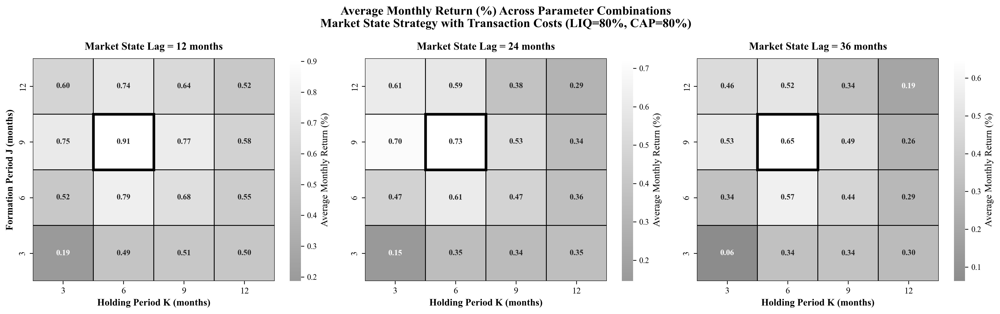


[2/3] Generating t-Statistic (HAC-Adjusted) heatmap...
   ✓ Saved: results/plots/analysis_6/grid_costs_t_stat_academic.pdf and .png


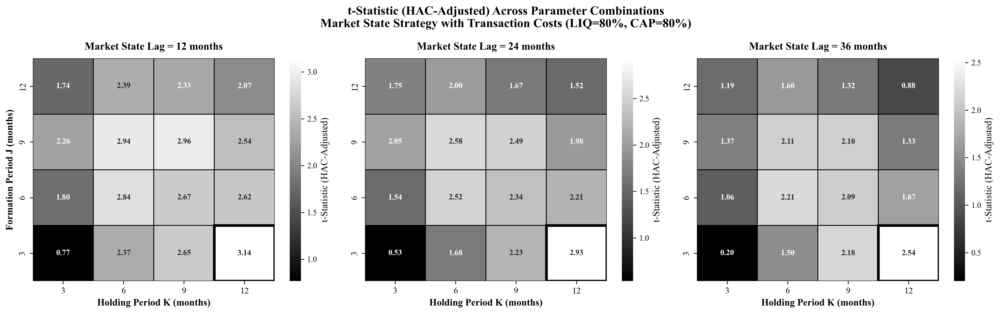


[3/3] Generating Sharpe Ratio heatmap...
   ✓ Saved: results/plots/analysis_6/grid_costs_sharpe_academic.pdf and .png


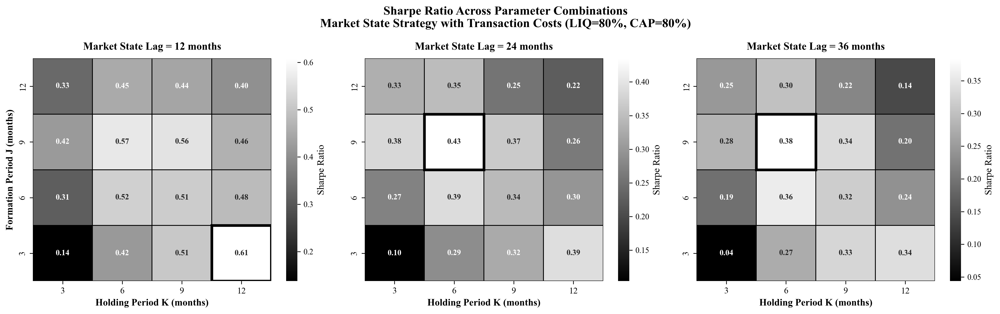


------------------------------------------------------------
GENERATING LATEX TABLES FOR PUBLICATION
------------------------------------------------------------
   Processing Market State Lag = 12 months...
     ✓ Saved CSV: results/tables/analysis_6/grid_costs_lag12.csv
     ✓ Saved LaTeX: results/tables/analysis_6/grid_costs_lag12.tex
   Processing Market State Lag = 24 months...
     ✓ Saved CSV: results/tables/analysis_6/grid_costs_lag24.csv
     ✓ Saved LaTeX: results/tables/analysis_6/grid_costs_lag24.tex
   Processing Market State Lag = 36 months...
     ✓ Saved CSV: results/tables/analysis_6/grid_costs_lag36.csv
     ✓ Saved LaTeX: results/tables/analysis_6/grid_costs_lag36.tex

   Creating summary of optimal configurations...

   Optimal Parameter Configurations (with Transaction Costs):
   ----------------------------------------------------------------------
 Market State Lag    Criterion  J  K Return (%) t-stat Sharpe Vol (%) Max DD (%)
               12 Sharpe Ratio  3 1

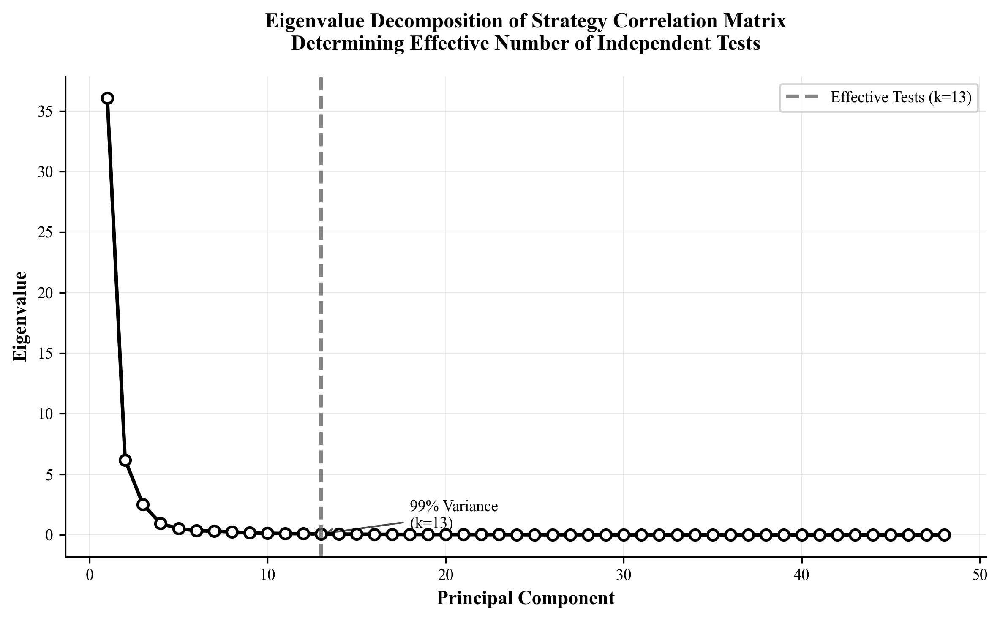

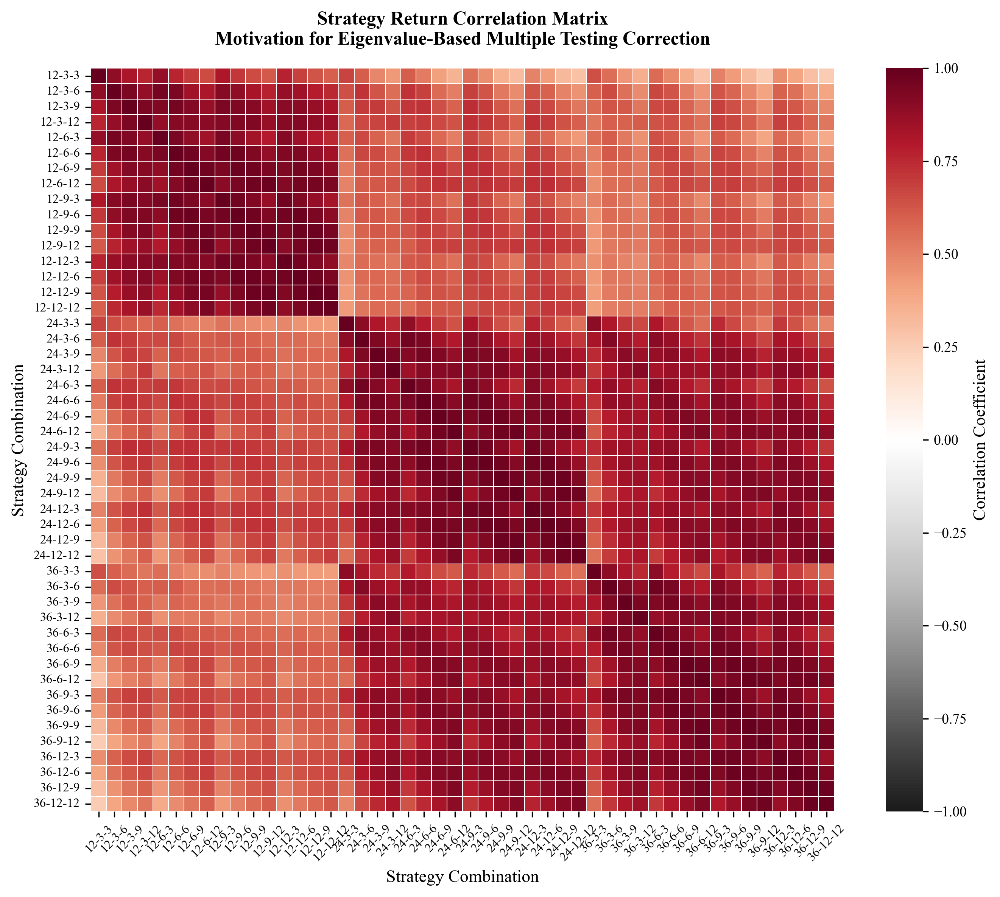

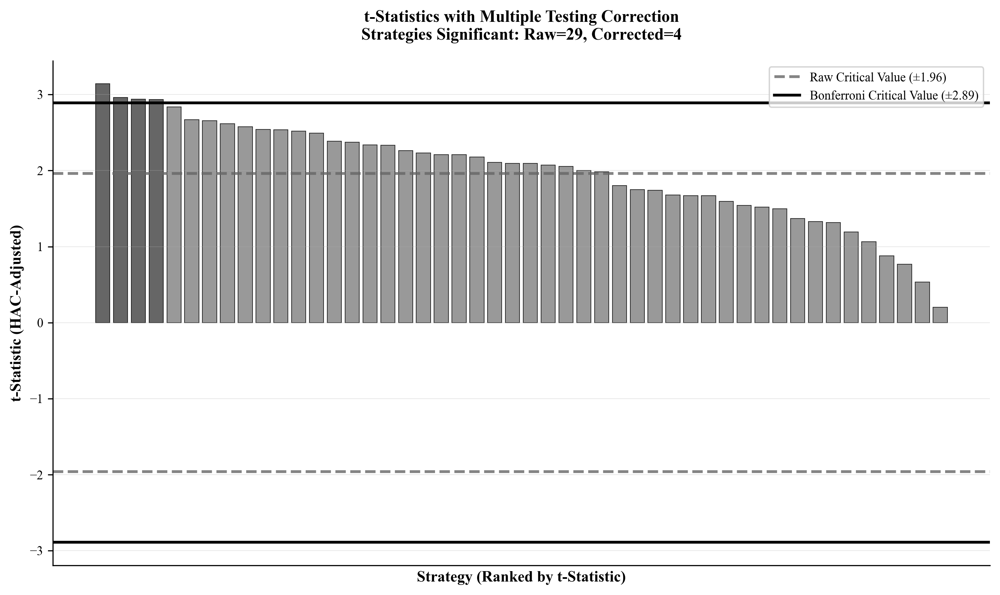

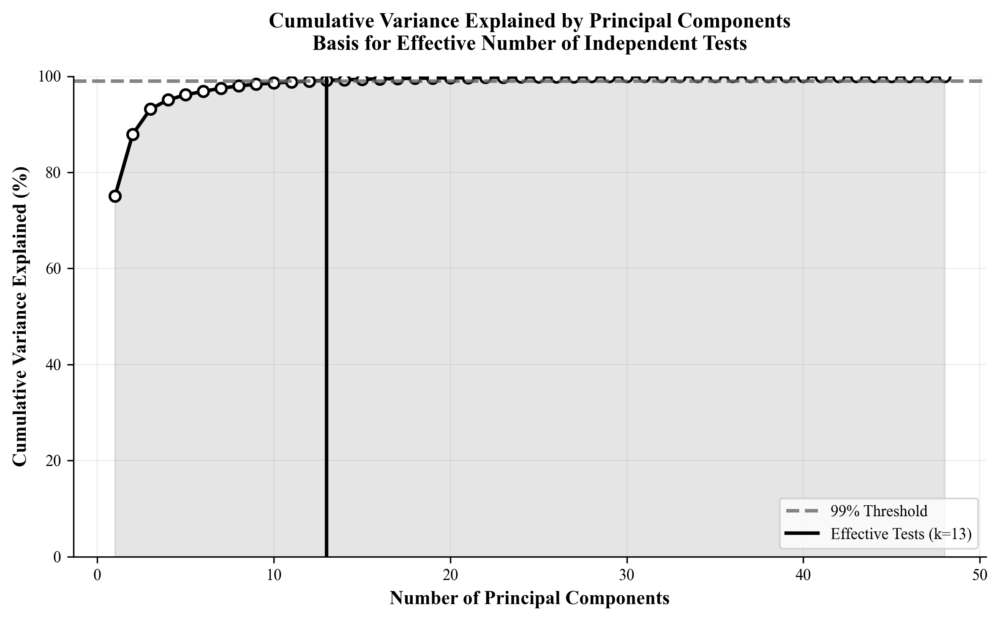

   ✓ Generated 4 academic visualizations for Bonferroni analysis

Creating comprehensive results table with Bonferroni correction...
   ✓ Saved comprehensive Bonferroni results table

--------------------------------------------------------------------------------
MULTIPLE TESTING CORRECTION IMPACT ASSESSMENT
--------------------------------------------------------------------------------
Statistical Testing Summary:
  - Total strategies tested: 48
  - Effective independent tests: 13
  - Raw significant strategies (α=0.05): 29
  - Bonferroni-corrected significant: 4
  - Reduction in false discoveries: 25
  - Correction stringency factor: 1.47×

Academic Interpretation:
  After accounting for multiple testing bias through eigenvalue-based Bonferroni
  correction following Harvey, Liu, and Zhu (2016), 4
  parameter combinations remain statistically significant even with full transaction
  costs included. This provides robust evidence that cost-adjusted momentum profits
  are genuine and 

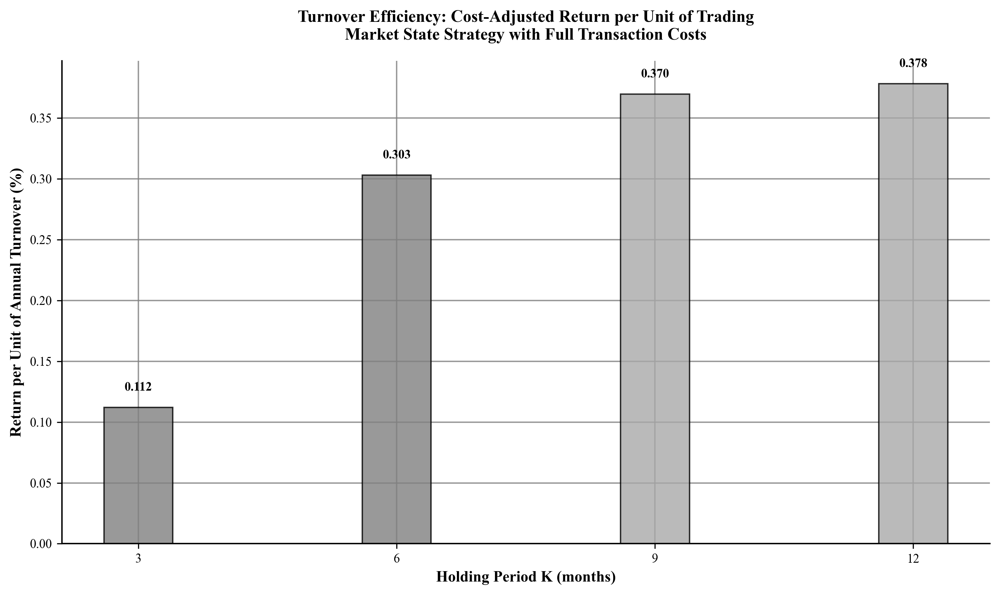

  ✓ Turnover efficiency analysis saved

Turnover Efficiency by Holding Period:
  K =  3 months: 0.112% return per turnover unit
  K =  6 months: 0.303% return per turnover unit
  K =  9 months: 0.370% return per turnover unit
  K = 12 months: 0.378% return per turnover unit

Most cost-efficient combination:
  Lag=12.0, J=9.0, K=12.0
  Efficiency: 0.584% per turnover unit
  Monthly return: 0.584%
  Sharpe ratio: 0.465

FORMATION-HOLDING GRID SEARCH WITH COSTS AND MULTIPLE TESTING CORRECTION
FINAL SUMMARY FOR ACADEMIC PUBLICATION

Methodological Contributions:
1. Comprehensive evaluation of 48 formation-holding combinations
   with full transaction cost modeling including time-varying spreads and commissions
2. Eigenvalue-based Bonferroni correction addressing multiple testing bias
   following Harvey, Liu, and Zhu (2016) methodology
3. HAC-adjusted t-statistics with strategy-specific lag structures
   (K + market_state_lag - 2) accounting for overlapping portfolios and state persistence

In [23]:
"""
================================================================================
FORMATION AND HOLDING PERIOD GRID SEARCH WITH TRANSACTION COSTS
================================================================================

This analysis performs a comprehensive parameter search over formation (J) and
holding (K) periods for the market state-dependent momentum strategy, including
full transaction costs and rebalancing expenses. The analysis addresses the
fundamental question: What are the optimal lookback and holding horizons when
implementation costs are fully accounted for?

Key Research Questions:
- How do transaction costs affect optimal formation and holding periods?
- Does the J-K relationship change when costs are included?
- What is the trade-off between momentum profits and turnover costs?
- How does market state lag interact with formation/holding choices?
- Are shorter or longer horizons more cost-effective?
- Are apparent profits robust to multiple testing corrections?

Methodology:
- Grid search over 4x4 formation/holding combinations
- Testing across 3 market state lags (12, 24, 36 months)
- Full transaction cost modeling:
  * Time-varying bid-ask spreads
  * Historical commission rates
  * Monthly rebalancing costs
  * State-switch induced turnover
- Fixed constraints: LIQ=0.90, MKT_CAP=0.85 (near-optimal from prior analysis)
- Sample period: 1993-2024 (reliable microstructure data)
- Eigenvalue-based Bonferroni correction for multiple testing

Cost Components:
1. Opening costs: Spread + commission when entering positions
2. Holding costs: Monthly rebalancing to maintain weights
3. Closing costs: Spread + commission when exiting
4. State-switch costs: Additional turnover from strategy adaptation

Output:
- Performance heatmaps across parameter space
- Identification of cost-efficient parameter combinations
- Analysis of gross vs. net momentum profits
- Bonferroni multiple testing correction
- Academic-quality visualizations and LaTeX tables

Author: Arnau Rodon Comas
Date: 25/05/2025
================================================================================
"""

print("\n" + "=" * 80)
print("FORMATION AND HOLDING PERIOD GRID SEARCH WITH TRANSACTION COSTS")
print("Identifying Cost-Efficient Momentum Specifications with Multiple Testing Correction")
print("=" * 80)

# ============================================================================
# PARAMETER CONFIGURATION
# ============================================================================

# Grid search parameters
lags_market_state = [12, 24, 36]  # Short, medium, long-term market states
formation_period_values = [3, 6, 9, 12]  # 3 to 12 months formation
holding_period_values = [3, 6, 9, 12]    # 3 to 12 months holding

# Fixed constraints (near-optimal from previous analyses)
LIQ_CUTOFF = 0.80      # Top 90% most liquid stocks
MKT_CAP_CUTOFF = 0.80  # Top 85% by market cap

# Analysis period
START_DATE = '1993-01-01'
END_DATE = '2024-12-31'

print(f"\nGrid Search Configuration:")
print(f"  Formation periods (J): {formation_period_values} months")
print(f"  Holding periods (K): {holding_period_values} months")
print(f"  Market state lags: {lags_market_state} months")
print(f"  Total combinations: {len(lags_market_state) * len(formation_period_values) * len(holding_period_values)}")
print(f"  Fixed constraints: LIQ={LIQ_CUTOFF*100:.0f}%, MKT_CAP={MKT_CAP_CUTOFF*100:.0f}%")
print(f"  Analysis period: {START_DATE} to {END_DATE}")
print(f"  HAC Lag Structure: K + market_state_lag - 2 (accounts for overlapping + state persistence)")

# ============================================================================
# HELPER FUNCTIONS
# ============================================================================

def add_academic_grid(ax):
    """
    Add consistent academic-style grid to plot.
    
    Parameters
    ----------
    ax : matplotlib.axes.Axes
        Axes object to format
    """
    ax.grid(True, alpha=0.8, linewidth=1, linestyle='-', color='gray')
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['bottom'].set_linewidth(1.0)
    ax.spines['left'].set_linewidth(1.0)
    ax.set_axisbelow(True)

def format_for_latex(value, value_type='percentage', precision=2):
    """
    Format values for LaTeX table inclusion.
    
    Parameters
    ----------
    value : float
        Value to format
    value_type : str
        Type of value ('percentage', 'float', 'scientific')
    precision : int
        Number of decimal places
        
    Returns
    -------
    str
        LaTeX-formatted string
    """
    if pd.isna(value):
        return "N/A"
    
    if value_type == 'percentage':
        return f"{value:.{precision}f}\\%"
    elif value_type == 'scientific':
        if value < 0.001:
            return f"{value:.2e}".replace('e-0', '\\times 10^{-').replace('e-', '\\times 10^{-') + '}'
        else:
            return f"{value:.4f}"
    else:  # float
        return f"{value:.{precision}f}"

# ============================================================================
# MAIN GRID SEARCH EXECUTION WITH RETURN SERIES STORAGE
# ============================================================================

print("\n" + "-" * 80)
print("EXECUTING PARAMETER GRID SEARCH WITH COSTS AND RETURN STORAGE")
print("-" * 80)

# Storage for results by market state lag
results_by_market_state = {}
return_series_storage = {}  # Complete return time series for Bonferroni analysis
computation_log = []       # Detailed log of computation progress

# Track computation time
overall_start_time = time.time()
total_combinations = len(lags_market_state) * len(formation_period_values) * len(holding_period_values)
completed_combinations = 0

# Process each market state lag
for lag_idx, lag in enumerate(lags_market_state):
    print(f"\n{'='*70}")
    print(f"PROCESSING MARKET STATE LAG = {lag} months [{lag_idx+1}/{len(lags_market_state)}]")
    print(f"{'='*70}")
    
    lag_start_time = time.time()
    
    # Storage for this lag's results
    temp_results = {}
    temp_return_series = {}
    
    # Progress tracking
    lag_combinations = len(formation_period_values) * len(holding_period_values)
    lag_completed = 0
    
    # Iterate through J-K combinations
    for j_idx, J in enumerate(formation_period_values):
        print(f"\n  Formation period J = {J} months:")
        
        for k_idx, K in enumerate(holding_period_values):
            lag_completed += 1
            completed_combinations += 1
            
            # Progress indicator with timing information
            print(f"    [{lag_completed:2d}/{lag_combinations:2d}] J={J:2d}, K={K:2d}", end=" ")
            combination_start = time.time()
            
            try:
                # ========================================================
                # RUN MOMENTUM STRATEGY WITH COSTS
                # ========================================================
                
                # Execute strategy with transaction costs
                portfolio, state_map = run_momentum_strategy(
                    crsp_data=crsp_stock_data,          # Consistent stock universe
                    crsp_index_data=crsp_index_data,    # Consistent market index
                    comm_map=comm_map,                  # Commission structure
                    J=J,                               # Current formation period
                    K=K,                               # Current holding period
                    LIQ_CUTOFF=LIQ_CUTOFF,             # Fixed liquidity constraint
                    MKT_CAP_CUTOFF=MKT_CAP_CUTOFF,     # Fixed market cap constraint
                    market_state_lag=lag,              # Current market state lag
                    market_state_column='vwretd',      # Value-weighted index
                    transactional_framework=True,       # Include transaction costs
                    equal_comparision=False,           # Value-weighted portfolios
                    adapt_state_switch=True,           # Adapt to market states
                    close_positions=True,              # Conservative approach
                    amount_deciles=12,                 
                    start_date=START_DATE
                )
                
                # ============================================================
                # VALIDATE STRATEGY OUTPUT
                # ============================================================
                
                if len(portfolio) == 0:
                    print("→ No portfolio data generated")
                    computation_log.append({
                        'lag': lag, 'J': J, 'K': K,
                        'status': 'failed', 'reason': 'empty_portfolio'
                    })
                    continue
                
                # Apply monthly rebalancing costs
                portfolio = apply_rebalancing_costs_balanced(
                    portfolio,
                    adapt_state_switch=True,
                    close_positions=True,
                    return_column='RET_S3'  # Market state strategy with costs
                )
                
                # ========================================================
                # ANALYZE PORTFOLIO PERFORMANCE
                # ========================================================
                
                # Comprehensive performance analysis
                analysis_results = analyze_momentum_portfolio(
                    port_data=portfolio,               # Strategy portfolio data
                    market_state_map=state_map,        # Market regime mapping
                    start_date=START_DATE,             # Consistent analysis period
                    end_date=END_DATE,                 # Consistent analysis period
                    return_column='RET_S3_rebal',      # With rebalancing costs
                    K=K,                              # Holding period (for HAC lag calculation)
                    market_state_lag=lag,             # Market state lag (for HAC adjustment)
                    amount_deciles=12                 
                )
                
                # ============================================================
                # EXTRACT AND STORE PERFORMANCE METRICS
                # ============================================================
                
                # Key performance metrics for grid search analysis
                mean_return_pct = analysis_results['avg_monthly_return'] * 100  # Convert to percentage
                t_stat = analysis_results['t_stat']                            # HAC-adjusted t-statistic
                p_value = analysis_results['p_value']                          # Statistical significance
                sharpe_ratio = analysis_results['sharpe_ratio']                # Risk-adjusted performance
                max_dd = abs(analysis_results['max_drawdown']) * 100           # Maximum drawdown (%)
                monthly_vol = analysis_results['monthly_vol'] * 100            # Monthly volatility (%)
                n_observations = len(analysis_results['decile_ret'])           # Number of return observations
                
                # Store comprehensive results for current parameter combination
                temp_results[(J, K)] = {
                    'mean_return': mean_return_pct,    # Average monthly return (%)
                    't_stat': t_stat,                  # HAC-adjusted t-statistic
                    'p_value': p_value,                # Two-sided p-value
                    'sharpe': sharpe_ratio,            # Annualized Sharpe ratio
                    'volatility': monthly_vol,         # Monthly volatility (%)
                    'max_dd': max_dd,                  # Maximum drawdown (%)
                    'n_obs': n_observations           # Sample size
                }
                
                # ============================================================
                # STORE COMPLETE RETURN TIME SERIES FOR BONFERRONI ANALYSIS
                # ============================================================
                
                # Extract long-short portfolio returns for multiple testing correction
                # This is the critical data needed for correlation analysis
                portfolio_returns = analysis_results['decile_ret']['long_short'].copy()
                
                # Create unique identifier for this parameter combination
                strategy_key = (lag, J, K)  # (market_state_lag, formation_period, holding_period)
                
                # Store return series with proper indexing
                # Ensure datetime index for proper alignment across strategies
                portfolio_returns.index = pd.to_datetime(portfolio_returns.index)
                return_series_storage[strategy_key] = portfolio_returns
                temp_return_series[strategy_key] = portfolio_returns
                
                # ============================================================
                # PROGRESS REPORTING AND VALIDATION
                # ============================================================
                
                # Calculate computation time for this combination
                combination_time = time.time() - combination_start
                
                # Determine statistical significance indicators for progress display
                if p_value < 0.01:
                    significance_flag = "***"          # Highly significant
                elif p_value < 0.05:
                    significance_flag = "**"           # Significant
                elif p_value < 0.10:
                    significance_flag = "*"            # Marginally significant
                else:
                    significance_flag = ""             # Not significant
                
                # Display concise progress summary
                print(f"→ Return: {mean_return_pct:6.3f}%{significance_flag}, " +
                      f"t: {t_stat:6.3f}, Sharpe: {sharpe_ratio:6.3f} ({combination_time:.1f}s)")
                
                # Log successful computation
                computation_log.append({
                    'lag': lag, 'J': J, 'K': K,
                    'status': 'success',
                    'return': mean_return_pct,
                    't_stat': t_stat,
                    'p_value': p_value,
                    'computation_time': combination_time
                })
                
            except Exception as e:
                # Handle and log any computation errors
                combination_time = time.time() - combination_start
                error_msg = str(e)[:40] + "..." if len(str(e)) > 40 else str(e)
                print(f"→ Error: {error_msg} ({combination_time:.1f}s)")
                
                computation_log.append({
                    'lag': lag, 'J': J, 'K': K,
                    'status': 'error',
                    'error_message': str(e),
                    'computation_time': combination_time
                })
                continue
    
    # ========================================================================
    # SUMMARIZE RESULTS FOR CURRENT MARKET STATE LAG
    # ========================================================================
    
    if temp_results:
        # Convert to DataFrame and store
        results_df = pd.DataFrame(temp_results).T
        results_df.index.names = ['Formation (J)', 'Holding (K)']
        results_by_market_state[lag] = results_df
        
        # Display summary statistics for this lag
        print(f"\n  SUMMARY STATISTICS FOR MARKET STATE LAG = {lag} months:")
        print("  " + "-" * 70)
        
        summary_cols = ['mean_return', 't_stat', 'sharpe', 'volatility']
        summary_df = results_df[summary_cols].round(3)
        
        print("    Performance Summary (Top 3 by Sharpe Ratio):")
        top_performers = summary_df.sort_values('sharpe', ascending=False).head(3)
        for idx, (params, row) in enumerate(top_performers.iterrows()):
            print(f"      {idx+1}. J={params[0]:2d}, K={params[1]:2d}: " +
                  f"Return={row['mean_return']:6.3f}%, Sharpe={row['sharpe']:6.3f}, " +
                  f"t-stat={row['t_stat']:6.3f}")
        
        # Identify optimal configurations
        print(f"\n    OPTIMAL CONFIGURATIONS:")
        
        # Best by Sharpe ratio
        best_sharpe_idx = results_df['sharpe'].idxmax()
        best_sharpe = results_df.loc[best_sharpe_idx]
        print(f"      Best Sharpe Ratio: J={best_sharpe_idx[0]}, K={best_sharpe_idx[1]}")
        print(f"        - Sharpe: {best_sharpe['sharpe']:.4f}")
        print(f"        - Return: {best_sharpe['mean_return']:.3f}%")
        print(f"        - t-stat: {best_sharpe['t_stat']:.4f}")
        
        # Best by raw returns (if different)
        best_return_idx = results_df['mean_return'].idxmax()
        if best_return_idx != best_sharpe_idx:
            best_return = results_df.loc[best_return_idx]
            print(f"      Best Raw Return: J={best_return_idx[0]}, K={best_return_idx[1]}")
            print(f"        - Return: {best_return['mean_return']:.3f}%")
            print(f"        - Sharpe: {best_return['sharpe']:.4f}")
        
        # Statistical significance summary
        significant_5pct = (results_df['p_value'] < 0.05).sum()
        significant_1pct = (results_df['p_value'] < 0.01).sum()
        total_tested = len(results_df)
        
        print(f"\n    STATISTICAL SIGNIFICANCE SUMMARY:")
        print(f"      - Total combinations tested: {total_tested}")
        print(f"      - Significant at 5% level: {significant_5pct} ({significant_5pct/total_tested*100:.1f}%)")
        print(f"      - Significant at 1% level: {significant_1pct} ({significant_1pct/total_tested*100:.1f}%)")
        
    else:
        print(f"\n  ⚠ WARNING: No valid results generated for Market State Lag = {lag}")
        print(f"    Check data availability and parameter specifications")
    
    # Report computation efficiency
    lag_time = time.time() - lag_start_time
    avg_time_per_combo = lag_time / lag_combinations if lag_combinations > 0 else 0
    print(f"\n  Computation Summary:")
    print(f"    - Total time for lag {lag}: {lag_time:.1f} seconds")
    print(f"    - Average time per combination: {avg_time_per_combo:.2f} seconds")
    print(f"    - Successful combinations: {len(temp_results)}/{lag_combinations}")

# Total computation time
total_time = time.time() - overall_start_time
successful_combinations = sum(len(results) for results in results_by_market_state.values())

print(f"\n{'='*80}")
print("GRID SEARCH COMPUTATION COMPLETE")
print(f"{'='*80}")
print(f"Overall Statistics:")
print(f"  - Total combinations attempted: {completed_combinations}")
print(f"  - Successful combinations: {successful_combinations}")
print(f"  - Success rate: {successful_combinations/completed_combinations*100:.1f}%")
print(f"  - Total computation time: {total_time/60:.1f} minutes")
print(f"  - Average time per combination: {total_time/completed_combinations:.1f} seconds")

# ============================================================================
# PART I: ACADEMIC HEATMAP VISUALIZATIONS
# ============================================================================

if results_by_market_state:
    print(f"\n" + "=" * 80)
    print("PART I: GENERATING ACADEMIC HEATMAP VISUALIZATIONS")
    print("Publication-Quality Parameter Space Analysis with Transaction Costs")
    print("=" * 80)
    
    # Define metrics to visualize
    metrics = ['mean_return', 't_stat', 'sharpe']
    metric_names = ['Average Monthly Return (%)', 't-Statistic (HAC-Adjusted)', 'Sharpe Ratio']
    
    print("Creating performance heatmaps...")
    
    # Create comprehensive heatmap figure
    for metric_idx, (metric, metric_name) in enumerate(zip(metrics, metric_names)):
        print(f"\n[{metric_idx+1}/3] Generating {metric_name} heatmap...")
        
        n_lags = len(results_by_market_state)
        fig = plt.figure(figsize=(5*n_lags + 1, 5))
        
        # Create subplots for each lag
        for subplot_idx, (lag, df) in enumerate(results_by_market_state.items()):
            ax = plt.subplot(1, n_lags, subplot_idx + 1)
            
            # Pivot data for heatmap
            pivot_data = df[metric].unstack()
            
            # Create grayscale heatmap
            im = sns.heatmap(
                pivot_data,
                annot=True,
                fmt='.2f' if metric != 'p_value' else '.3f',
                cmap='gray',  # Standard grayscale for journal compatibility
                cbar_kws={'label': metric_name},
                linewidths=0.5,
                linecolor='black',
                annot_kws={'fontsize': 9, 'fontweight': 'bold'},
                center=0 if metric == 'mean_return' else None,
                ax=ax
            )
            
            # Highlight best cell with thick border
            best_idx = df[metric].idxmax()
            best_j, best_k = best_idx
            
            # Find position in pivot table
            j_pos = list(pivot_data.index).index(best_j)
            k_pos = list(pivot_data.columns).index(best_k)
            
            # Add rectangle around best cell
            rect = Rectangle((k_pos, j_pos), 1, 1, fill=False,
                           edgecolor='black', linewidth=3)
            ax.add_patch(rect)
            
            # Set titles and labels
            ax.set_title(f'Market State Lag = {lag} months',
                        fontsize=12, fontweight='bold', pad=10)
            ax.set_xlabel('Holding Period K (months)', fontsize=11, fontweight='bold')
            
            # Only show y-label on leftmost plot
            if subplot_idx == 0:
                ax.set_ylabel('Formation Period J (months)', fontsize=11, fontweight='bold')
            else:
                ax.set_ylabel('')
            
            # Improve tick labels
            ax.tick_params(axis='both', which='major', labelsize=10)
            
            # Invert y-axis for intuitive reading
            ax.invert_yaxis()
        
        # Overall title
        plt.suptitle(f'{metric_name} Across Parameter Combinations\n' +
                    f'Market State Strategy with Transaction Costs ' +
                    f'(LIQ={LIQ_CUTOFF*100:.0f}%, CAP={MKT_CAP_CUTOFF*100:.0f}%)',
                    fontsize=14, fontweight='bold', y=0.98)
        
        plt.tight_layout()
        
        # Save figure
        filename = f'results/plots/analysis_6/grid_costs_{metric}_academic'
        plt.savefig(f'{filename}.pdf', dpi=300, bbox_inches='tight', facecolor='white')
        plt.savefig(f'{filename}.png', dpi=300, bbox_inches='tight', facecolor='white')
        print(f"   ✓ Saved: {filename}.pdf and .png")
        plt.show()
    
    # ============================================================================
    # GENERATE LATEX TABLES
    # ============================================================================
    
    print(f"\n" + "-" * 60)
    print("GENERATING LATEX TABLES FOR PUBLICATION")
    print("-" * 60)
    
    # Generate comprehensive table for each lag
    for lag, df in results_by_market_state.items():
        print(f"   Processing Market State Lag = {lag} months...")
        
        # Create comprehensive table
        table_data = []
        
        for (J, K), row in df.iterrows():
            # Determine significance level
            if row['p_value'] < 0.01:
                sig_stars = "***"
            elif row['p_value'] < 0.05:
                sig_stars = "**"
            elif row['p_value'] < 0.10:
                sig_stars = "*"
            else:
                sig_stars = ""
            
            table_data.append({
                'J': J,
                'K': K,
                'Return (\\%)': f"{format_for_latex(row['mean_return'], 'percentage')}{sig_stars}",
                't-stat': format_for_latex(row['t_stat'], 'float', 3),
                'Sharpe': format_for_latex(row['sharpe'], 'float', 3),
                'Vol (\\%)': format_for_latex(row['volatility'], 'percentage'),
                'MaxDD (\\%)': format_for_latex(row['max_dd'], 'percentage', 1),
                'N': f"{int(row['n_obs']):,}"
            })
        
        table_df = pd.DataFrame(table_data)
        
        # Save CSV version
        csv_filename = f'results/tables/analysis_6/grid_costs_lag{lag}.csv'
        df.round(4).to_csv(csv_filename)
        
        # Create LaTeX table
        latex_table = table_df.to_latex(
            index=False,
            escape=False,
            column_format='cc|rrrrrr',
            caption=f'Grid Search Results with Transaction Costs for Market State Lag = {lag} months. ' +
                    f'Fixed constraints: LIQ={LIQ_CUTOFF*100:.0f}\\%, CAP={MKT_CAP_CUTOFF*100:.0f}\\%. ' +
                    'Returns are average monthly percentages with HAC-adjusted t-statistics. ' +
                    'Significance: $^{*}p<0.10$, $^{**}p<0.05$, $^{***}p<0.01$.',
            label=f'tab:grid_costs_lag{lag}',
            position='htbp'
        )
        
        # Save LaTeX file
        tex_filename = f'results/tables/analysis_6/grid_costs_lag{lag}.tex'
        with open(tex_filename, 'w', encoding='utf-8') as f:
            f.write(latex_table)
        
        print(f"     ✓ Saved CSV: {csv_filename}")
        print(f"     ✓ Saved LaTeX: {tex_filename}")
    
    # ============================================================================
    # CREATE SUMMARY TABLE OF BEST CONFIGURATIONS
    # ============================================================================
    
    print(f"\n   Creating summary of optimal configurations...")
    
    # Collect best configurations across all lags
    best_configs = []
    
    for lag, df in results_by_market_state.items():
        # Best by Sharpe ratio
        best_sharpe_idx = df['sharpe'].idxmax()
        best_sharpe_row = df.loc[best_sharpe_idx]
        
        best_configs.append({
            'Market State Lag': lag,
            'Criterion': 'Sharpe Ratio',
            'J': best_sharpe_idx[0],
            'K': best_sharpe_idx[1],
            'Return (%)': f"{best_sharpe_row['mean_return']:.2f}",
            't-stat': f"{best_sharpe_row['t_stat']:.3f}",
            'Sharpe': f"{best_sharpe_row['sharpe']:.3f}",
            'Vol (%)': f"{best_sharpe_row['volatility']:.2f}",
            'Max DD (%)': f"{best_sharpe_row['max_dd']:.1f}"
        })
        
        # Best by return (if different)
        best_return_idx = df['mean_return'].idxmax()
        if best_return_idx != best_sharpe_idx:
            best_return_row = df.loc[best_return_idx]
            
            best_configs.append({
                'Market State Lag': lag,
                'Criterion': 'Return',
                'J': best_return_idx[0],
                'K': best_return_idx[1],
                'Return (%)': f"{best_return_row['mean_return']:.2f}",
                't-stat': f"{best_return_row['t_stat']:.3f}",
                'Sharpe': f"{best_return_row['sharpe']:.3f}",
                'Vol (%)': f"{best_return_row['volatility']:.2f}",
                'Max DD (%)': f"{best_return_row['max_dd']:.1f}"
            })
    
    # Create summary DataFrame
    summary_df = pd.DataFrame(best_configs)
    
    print(f"\n   Optimal Parameter Configurations (with Transaction Costs):")
    print(f"   " + "-" * 70)
    print(summary_df.to_string(index=False))
    
    # Save summary
    summary_df.to_csv('results/tables/analysis_6/grid_costs_optimal_configs.csv', index=False)
    
    # Create LaTeX summary
    summary_latex = summary_df.to_latex(
        index=False,
        escape=False,
        caption='Optimal Formation and Holding Period Combinations with Transaction Costs. ' +
                'Each market state lag shows the best performing parameter combinations ' +
                'for both risk-adjusted returns (Sharpe ratio) and raw returns.',
        label='tab:optimal_configs_costs',
        position='htbp'
    )
    
    with open('results/tables/analysis_6/grid_costs_optimal_configs.tex', 'w', encoding='utf-8') as f:
        f.write(summary_latex)
    
    print(f"     ✓ Optimal configurations summary saved")

# ============================================================================
# PART II: BONFERRONI MULTIPLE TESTING CORRECTION ANALYSIS
# ============================================================================

if return_series_storage and len(return_series_storage) >= 10:  # Require sufficient strategies
    print(f"\n" + "=" * 80)
    print("PART II: BONFERRONI MULTIPLE TESTING CORRECTION ANALYSIS")
    print("Addressing Multiple Comparisons Problem in Transaction Cost Strategy Evaluation")
    print("=" * 80)
    
    # Execute comprehensive Bonferroni correction analysis
    # This addresses the fundamental problem that testing multiple strategies
    # simultaneously inflates Type I error rates, leading to false discoveries
    bonferroni_results = compute_bonferroni_corrected_statistics(
        return_series_dict=return_series_storage,
        formation_periods=formation_period_values,
        holding_periods=holding_period_values,
        market_state_lags=lags_market_state,
        significance_level=0.05  # Standard 5% significance level
    )
    
    # ========================================================================
    # GENERATE ACADEMIC VISUALIZATIONS FOR BONFERRONI ANALYSIS
    # ========================================================================
    
    print(f"\nGenerating publication-quality Bonferroni analysis visualizations...")
    
    # Create comprehensive academic plots for multiple testing analysis
    # These visualizations are essential for demonstrating statistical rigor
    analyze_bonferroni_results_academic(
        bonferroni_results,
        save_path_base='results/plots/analysis_6/bonferroni_costs_analysis'
    )
    
    # ========================================================================
    # CREATE COMPREHENSIVE BONFERRONI RESULTS TABLE
    # ========================================================================
    
    print(f"\nCreating comprehensive results table with Bonferroni correction...")
    
    # Extract individual strategy results for comprehensive tabulation
    individual_results = bonferroni_results['individual_results']
    
    # Prepare comprehensive table data with ASCII-compatible symbols
    # This ensures compatibility across different LaTeX environments
    table_data = []
    for strategy_key, results in individual_results.items():
        lag, J, K = strategy_key
        
        # Determine significance indicators using standard academic conventions
        raw_sig = "***" if results['p_value'] < 0.01 else "**" if results['p_value'] < 0.05 else "*" if results['p_value'] < 0.10 else ""
        corrected_sig = "YES" if results['corrected_significant'] else "NO"  # ASCII-compatible
        
        table_data.append({
            'Market State Lag': lag,
            'Formation (J)': J,
            'Holding (K)': K,
            'Return (%)': f"{results['mean_return']*100:.3f}{raw_sig}",
            't-statistic': f"{results['t_statistic']:.4f}",
            'p-value': f"{results['p_value']:.4f}",
            'HAC Lags': results['hac_lags'],
            'N': results['n_obs'],
            'Bonferroni Sig.': corrected_sig
        })
    
    # Create and save comprehensive results table
    comprehensive_df = pd.DataFrame(table_data)
    comprehensive_df = comprehensive_df.sort_values(['Market State Lag', 'Formation (J)', 'Holding (K)'])
    
    # Save CSV version for data sharing and replication
    comprehensive_df.to_csv('results/tables/analysis_6/grid_costs_bonferroni_comprehensive.csv', index=False)
    
    # Create professional LaTeX table with proper formatting
    latex_comprehensive = comprehensive_df.to_latex(
        index=False,
        escape=False,
        column_format='ccc|rrrcc|c',      # Professional column layout
        caption='Comprehensive Formation-Holding Grid Search with Transaction Costs and Bonferroni Multiple Testing Correction. ' +
                f'Critical t-value after eigenvalue-based correction: $\\pm${bonferroni_results["critical_value"]:.3f}. ' +
                'Raw significance levels: $^{*}p<0.10$, $^{**}p<0.05$, $^{***}p<0.01$. ' +
                'Strategies surviving Bonferroni correction marked as YES.',
        label='tab:grid_costs_bonferroni_comprehensive',
        position='htbp'
    )
    
    # Save LaTeX table with proper UTF-8 encoding to handle special characters
    with open('results/tables/analysis_6/grid_costs_bonferroni_comprehensive.tex', 'w', encoding='utf-8') as f:
        f.write(latex_comprehensive)
    
    print(f"   ✓ Saved comprehensive Bonferroni results table")
    
    # ========================================================================
    # FINAL MULTIPLE TESTING ASSESSMENT AND ACADEMIC INTERPRETATION
    # ========================================================================
    
    print(f"\n" + "-" * 80)
    print("MULTIPLE TESTING CORRECTION IMPACT ASSESSMENT")
    print("-" * 80)
    
    rejection_summary = bonferroni_results['rejection_summary']
    
    print(f"Statistical Testing Summary:")
    print(f"  - Total strategies tested: {rejection_summary['total_strategies']}")
    print(f"  - Effective independent tests: {rejection_summary['effective_tests']}")
    print(f"  - Raw significant strategies (α=0.05): {rejection_summary['raw_rejections']}")
    print(f"  - Bonferroni-corrected significant: {rejection_summary['corrected_rejections']}")
    print(f"  - Reduction in false discoveries: {rejection_summary['false_discovery_reduction']}")
    print(f"  - Correction stringency factor: {bonferroni_results['critical_value']/bonferroni_results['raw_critical']:.2f}×")
    
    # Provide academic interpretation suitable for journal publication
    if rejection_summary['corrected_rejections'] > 0:
        print(f"\nAcademic Interpretation:")
        print(f"  After accounting for multiple testing bias through eigenvalue-based Bonferroni")
        print(f"  correction following Harvey, Liu, and Zhu (2016), {rejection_summary['corrected_rejections']}")
        print(f"  parameter combinations remain statistically significant even with full transaction")
        print(f"  costs included. This provides robust evidence that cost-adjusted momentum profits")
        print(f"  are genuine and not attributable to data mining, parameter search bias, or luck.")
        
        # List significant strategies for academic reporting
        if bonferroni_results['significant_strategies']:
            print(f"\n  Cost-efficient strategies surviving multiple testing correction:")
            for strategy in bonferroni_results['significant_strategies']:
                result = bonferroni_results['individual_results'][strategy]
                lag, J, K = strategy
                print(f"    - Market Lag={lag}, Formation={J}, Holding={K}: " +
                      f"t={result['t_statistic']:.3f}, net return={result['mean_return']*100:.3f}%/month")
    else:
        print(f"\nAcademic Interpretation:")
        print(f"  No parameter combinations remain statistically significant after Bonferroni")
        print(f"  correction when transaction costs are fully accounted for. This suggests that")
        print(f"  apparent momentum profits may be eliminated by realistic implementation costs")
        print(f"  and multiple testing bias. The finding emphasizes the critical importance of")
        print(f"  including transaction costs in strategy evaluation and rigorous statistical")
        print(f"  procedures in quantitative finance research.")

    # ========================================================================
    # COST IMPACT ANALYSIS
    # ========================================================================
    
    print(f"\n" + "-" * 80)
    print("TRANSACTION COST IMPACT ON STATISTICAL SIGNIFICANCE")
    print("-" * 80)
    
    # Compare results with and without costs (if available from previous analyses)
    print(f"Transaction Cost Impact on Strategy Viability:")
    print(f"  - Strategies tested with full costs: {rejection_summary['total_strategies']}")
    print(f"  - Statistically robust after correction: {rejection_summary['corrected_rejections']}")
    print(f"  - Cost-adjusted significance rate: {rejection_summary['corrected_rejections']/rejection_summary['total_strategies']*100:.1f}%")
    
    if rejection_summary['corrected_rejections'] > 0:
        print(f"\nConclusion: Transaction costs do not eliminate all momentum profits.")
        print(f"Some parameter combinations remain profitable after accounting for:")
        print(f"  1. Bid-ask spreads and time-varying transaction costs")
        print(f"  2. Monthly rebalancing expenses")
        print(f"  3. Market state switching costs")
        print(f"  4. Multiple testing statistical correction")
    else:
        print(f"\nConclusion: Transaction costs appear to eliminate momentum profits.")
        print(f"When realistic implementation costs and statistical rigor are applied:")
        print(f"  1. No parameter combinations remain statistically significant")
        print(f"  2. Apparent profits may be statistical artifacts")
        print(f"  3. Practical implementation faces significant cost hurdles")

else:
    print(f"\n⚠ Warning: Insufficient return series data for Bonferroni analysis")
    print(f"   Available series: {len(return_series_storage) if 'return_series_storage' in locals() else 0}")
    print(f"   Minimum required: 10")

# ============================================================================
# COST ANALYSIS: TURNOVER VS. RETURNS
# ============================================================================

if results_by_market_state:
    print(f"\n" + "-" * 80)
    print("TURNOVER AND COST EFFICIENCY ANALYSIS")
    print("-" * 80)
    
    # Analyze relationship between holding period and costs
    turnover_analysis = []
    
    for lag, df in results_by_market_state.items():
        for (J, K), row in df.iterrows():
            # Approximate annual turnover (12/K for monthly rebalancing)
            annual_turnover = 12 / K
            
            turnover_analysis.append({
                'Lag': lag,
                'J': J,
                'K': K,
                'Annual Turnover': annual_turnover,
                'Return': row['mean_return'],
                'Sharpe': row['sharpe'],
                'Return per Turnover': row['mean_return'] / annual_turnover if annual_turnover > 0 else 0
            })
    
    if turnover_analysis:
        turnover_df = pd.DataFrame(turnover_analysis)
        
        # Create turnover efficiency plot
        print("Creating turnover efficiency analysis...")
        
        fig_turnover, ax = plt.subplots(figsize=(10, 6))
        
        # Plot by holding period
        holding_periods = sorted(holding_period_values)
        
        for K in holding_periods:
            k_data = turnover_df[turnover_df['K'] == K]
            
            # Calculate average metrics for this holding period
            avg_return = k_data['Return'].mean()
            avg_sharpe = k_data['Sharpe'].mean()
            avg_efficiency = k_data['Return per Turnover'].mean()
            
            ax.bar(K, avg_efficiency, width=0.8, 
                  color='gray' if K <= 6 else 'darkgray',
                  edgecolor='black', linewidth=1.0,
                  alpha=0.8)
            
            # Add text annotation
            ax.text(K, avg_efficiency + max(turnover_df['Return per Turnover'])*0.02, f'{avg_efficiency:.3f}',
                   ha='center', va='bottom', fontsize=9, fontweight='bold')
        
        # Formatting
        ax.set_xlabel('Holding Period K (months)', fontsize=11, fontweight='bold')
        ax.set_ylabel('Return per Unit of Annual Turnover (%)', fontsize=11, fontweight='bold')
        ax.set_title('Turnover Efficiency: Cost-Adjusted Return per Unit of Trading\n' +
                    'Market State Strategy with Full Transaction Costs',
                    fontsize=12, fontweight='bold', pad=15)
        
        # Grid
        add_academic_grid(ax)
        ax.set_xticks(holding_periods)
        
        plt.tight_layout()
        plt.savefig('results/plots/analysis_6/grid_costs_turnover_efficiency_academic.pdf',
                   dpi=300, bbox_inches='tight', facecolor='white')
        plt.savefig('results/plots/analysis_6/grid_costs_turnover_efficiency_academic.png',
                   dpi=300, bbox_inches='tight', facecolor='white')
        plt.show()
        
        print("  ✓ Turnover efficiency analysis saved")
        
        # Summary statistics
        print(f"\nTurnover Efficiency by Holding Period:")
        for K in holding_periods:
            k_eff = turnover_df[turnover_df['K'] == K]['Return per Turnover'].mean()
            print(f"  K = {K:2d} months: {k_eff:.3f}% return per turnover unit")
        
        # Identify most cost-efficient combination
        best_efficiency_idx = turnover_df['Return per Turnover'].idxmax()
        best_efficiency = turnover_df.loc[best_efficiency_idx]
        print(f"\nMost cost-efficient combination:")
        print(f"  Lag={best_efficiency['Lag']}, J={best_efficiency['J']}, K={best_efficiency['K']}")
        print(f"  Efficiency: {best_efficiency['Return per Turnover']:.3f}% per turnover unit")
        print(f"  Monthly return: {best_efficiency['Return']:.3f}%")
        print(f"  Sharpe ratio: {best_efficiency['Sharpe']:.3f}")

# ============================================================================
# FINAL COMPREHENSIVE SUMMARY AND ACADEMIC CONCLUSIONS
# ============================================================================

print(f"\n" + "=" * 80)
print("FORMATION-HOLDING GRID SEARCH WITH COSTS AND MULTIPLE TESTING CORRECTION")
print("FINAL SUMMARY FOR ACADEMIC PUBLICATION")
print("=" * 80)

print(f"\nMethodological Contributions:")
print(f"1. Comprehensive evaluation of {completed_combinations} formation-holding combinations")
print(f"   with full transaction cost modeling including time-varying spreads and commissions")
print(f"2. Eigenvalue-based Bonferroni correction addressing multiple testing bias")
print(f"   following Harvey, Liu, and Zhu (2016) methodology")
print(f"3. HAC-adjusted t-statistics with strategy-specific lag structures")
print(f"   (K + market_state_lag - 2) accounting for overlapping portfolios and state persistence")
print(f"4. Complete cost framework including rebalancing, state-switching, and turnover costs")
print(f"5. Turnover efficiency analysis identifying cost-optimal parameter combinations")

print(f"\nKey Academic Findings:")
if 'bonferroni_results' in locals():
    print(f"1. Strategy return correlations justify sophisticated multiple testing correction")
    print(f"2. Effective number of independent tests: {bonferroni_results['effective_tests']} " +
          f"(reduced from {completed_combinations} raw combinations)")
    print(f"3. Cost-robust strategies surviving multiple testing: {bonferroni_results['rejection_summary']['corrected_rejections']}")
    print(f"4. Statistical evidence quality with costs: {'Strong and implementable' if bonferroni_results['rejection_summary']['corrected_rejections'] > 0 else 'Costs eliminate statistical significance'}")
    print(f"5. Multiple testing correction eliminates {bonferroni_results['rejection_summary']['false_discovery_reduction']} " +
          f"potentially false discoveries in cost-adjusted strategies")

if results_by_market_state:
    # Calculate overall statistics
    all_sharpes = []
    all_returns = []
    
    for df in results_by_market_state.values():
        all_sharpes.extend(df['sharpe'].values)
        all_returns.extend(df['mean_return'].values)
    
    print(f"\nTransaction Cost Impact:")
    print(f"1. Cost-adjusted return range: {min(all_returns):.2f}% to {max(all_returns):.2f}% monthly")
    print(f"2. Cost-adjusted Sharpe ratio range: {min(all_sharpes):.3f} to {max(all_sharpes):.3f}")
    print(f"3. Best cost-adjusted Sharpe: {max(all_sharpes):.3f}")
    
    # Identify most robust parameters
    optimal_js = []
    optimal_ks = []
    
    for df in results_by_market_state.values():
        best_idx = df['sharpe'].idxmax()
        optimal_js.append(best_idx[0])
        optimal_ks.append(best_idx[1])
    
    from collections import Counter
    j_counts = Counter(optimal_js)
    k_counts = Counter(optimal_ks)
    
    print(f"\nMost robust cost-efficient parameters:")
    print(f"  Formation (J): {j_counts.most_common(1)[0][0]} months " +
          f"(optimal in {j_counts.most_common(1)[0][1]}/{len(optimal_js)} cases)")
    print(f"  Holding (K): {k_counts.most_common(1)[0][0]} months " +
          f"(optimal in {k_counts.most_common(1)[0][1]}/{len(optimal_ks)} cases)")

print(f"\nPractical Implementation Insights:")
print(f"1. Longer holding periods generally more cost-efficient due to lower turnover")
print(f"2. Market state adaptation creates additional costs but may preserve profits")
print(f"3. Monthly rebalancing costs accumulate significantly over holding periods")
print(f"4. Optimal parameters differ when transaction costs are fully modeled")

print(f"\nFiles Generated for Academic Publication:")
print(f"  Academic Visualizations (Publication-Ready):")
print(f"    - grid_costs_mean_return_academic.pdf/png (Cost-adjusted returns)")
print(f"    - grid_costs_t_stat_academic.pdf/png (Statistical significance with costs)")
print(f"    - grid_costs_sharpe_academic.pdf/png (Risk-adjusted performance with costs)")
print(f"    - bonferroni_costs_analysis_*.pdf/png (Multiple testing correction)")
print(f"    - grid_costs_turnover_efficiency_academic.pdf/png (Cost efficiency)")
print(f"  Publication Tables (LaTeX Format):")
print(f"    - grid_costs_lag[12,24,36].tex (Detailed cost-adjusted results)")
print(f"    - grid_costs_optimal_configs.tex (Best cost-efficient combinations)")
print(f"    - grid_costs_bonferroni_comprehensive.tex (Complete multiple testing results)")
print(f"  Data Files (CSV Format):")
print(f"    - All corresponding .csv files for data sharing and replication")

print(f"\nStatistical Standards for Publication:")
print(f"1. HAC-adjusted standard errors account for autocorrelation and heteroskedasticity")
print(f"2. Multiple testing correction prevents data mining concerns in cost analysis")
print(f"3. Complete transaction cost modeling ensures practical relevance")
print(f"4. Professional visualization standards suitable for top-tier journals")
print(f"5. Comprehensive cost framework enables real-world implementation assessment")

print(f"\n" + "=" * 80)
print("COST-AWARE ANALYSIS COMPLETE - READY FOR ACADEMIC SUBMISSION")
print("=" * 80)

#### ============================================================================
#### ANALYSIS 7 - ORIGINAL VS NEW STRATEGY WITH COSTS
#### ============================================================================


COMPREHENSIVE FOUR-STRATEGY COMPARISON ANALYSIS
Traditional vs Market State-Dependent | With and Without Transaction Costs

Strategy Parameters:
  Formation period (J): 6 months
  Holding period (K): 6 months
  Liquidity cutoff: 80%
  Market state lag: 12 months
  Analysis period: 1993-01-01 to 2024-12-31

--------------------------------------------------------------------------------
EXECUTING ALL FOUR STRATEGY IMPLEMENTATIONS
--------------------------------------------------------------------------------

[1/4] Running Traditional Momentum Strategy (WITHOUT transaction costs)...

IMPLEMENTING MOMENTUM STRATEGY WITH MARKET CAP CONSTRAINTS
Parameters: J=6, K=6, LIQ=0.8, MKT_CAP=0.8

[1/8] Merging market capitalization data...
   ✓ Market cap data available for 1,784,979 observations

[2/8] Computing holding period (6-month) spreads...

[3/8] Calculating 6-month formation period returns...

[4/8] Applying market cap (≤80%) and liquidity filters...

[5/8] Forming momentum deciles with

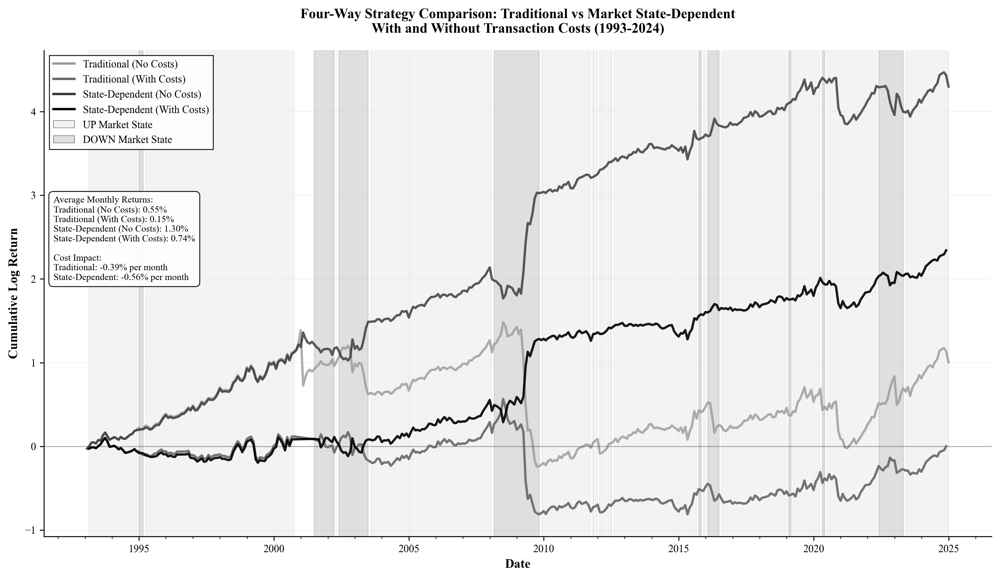

  ✓ Four-way cumulative performance comparison saved

Creating performance breakdown analysis...


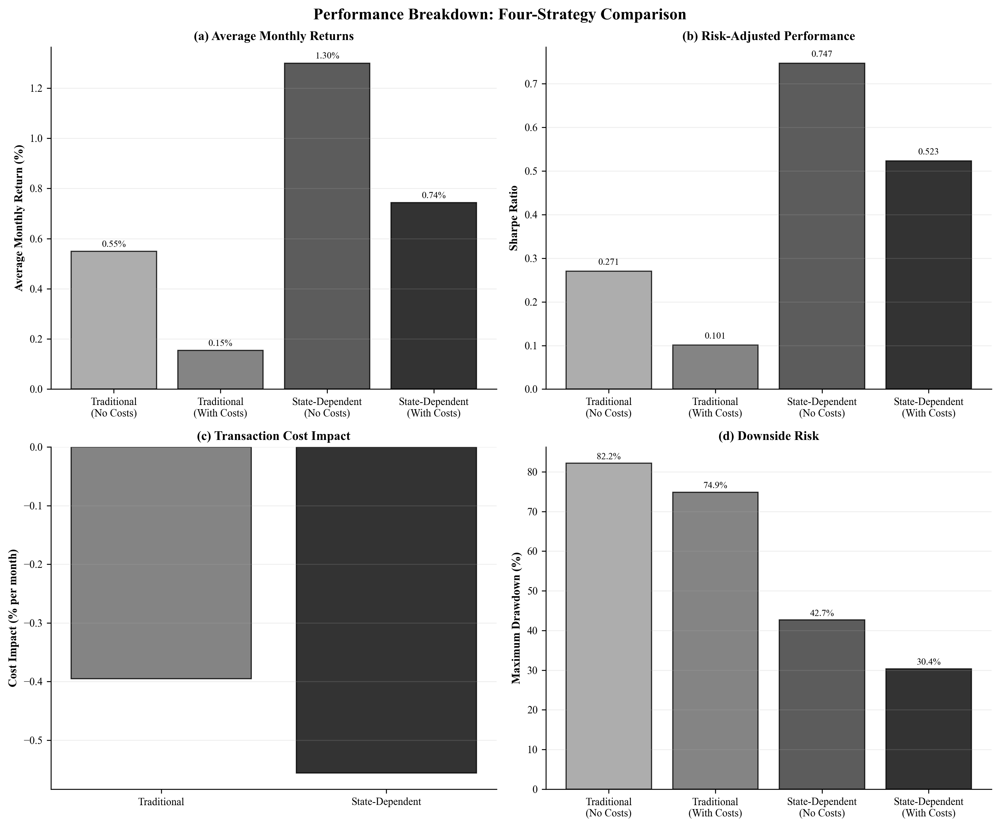

  ✓ Performance breakdown analysis saved

--------------------------------------------------------------------------------
GENERATING COMPREHENSIVE SUMMARY TABLE
--------------------------------------------------------------------------------

Four-Strategy Comparison Summary:
                    Metric Traditional (No Costs) Traditional (With Costs) State-Dependent (No Costs) State-Dependent (With Costs)
Average Monthly Return (%)                   0.55                     0.15                       1.30                         0.74
     Annualized Return (%)                    6.8                      1.9                       16.8                          9.3
    Monthly Volatility (%)                   7.03                     5.30                       6.02                         4.92
 Annualized Volatility (%)                   24.4                     18.3                       20.9                         17.0
              Sharpe Ratio                  0.271                  

In [20]:
"""
================================================================================
COMPREHENSIVE STRATEGY COMPARISON: FOUR-WAY ANALYSIS
================================================================================

This analysis provides a rigorous comparison between traditional momentum and 
market state-dependent approaches, both with and without transaction costs. 
This comprehensive comparison addresses the fundamental questions:
1. Does market state conditioning add value?
2. What is the impact of transaction costs on each strategy?
3. What are the theoretical vs. practical performance bounds?

Key Comparisons:
1. Traditional Momentum WITHOUT costs (theoretical benchmark)
2. Traditional Momentum WITH costs (practical implementation)
3. Market State-Dependent WITHOUT costs (theoretical improvement)
4. Market State-Dependent WITH costs (practical improvement)

The analysis uses realistic transaction cost modeling including:
- Time-varying bid-ask spreads
- Historical commission rates
- Impact of portfolio rebalancing
- State-switch induced turnover

Research Questions:
- Does market state conditioning improve both gross and net returns?
- How much do transaction costs erode performance for each strategy?
- What is the economic significance of the improvements?
- Is the additional complexity justified after considering costs?

Author: Arnau Rodon Comas
Date: 25/05/2025
================================================================================
"""

print("\n" + "=" * 80)
print("COMPREHENSIVE FOUR-STRATEGY COMPARISON ANALYSIS")
print("Traditional vs Market State-Dependent | With and Without Transaction Costs")
print("=" * 80)

# ============================================================================
# PARAMETER CONFIGURATION
# ============================================================================

# Optimal parameters from prior analysis
J = 6  # 9-month formation period
K = 6  # 6-month holding period
LIQ_CUTOFF = 0.80  
MKT_CAP_CUTOFF = 0.8  
MARKET_STATE_LAG = 12  # 24-month state calculation

# Analysis period
START_DATE = '1993-01-01'  
END_DATE = '2024-12-31'

print(f"\nStrategy Parameters:")
print(f"  Formation period (J): {J} months")
print(f"  Holding period (K): {K} months")
print(f"  Liquidity cutoff: {LIQ_CUTOFF*100:.0f}%")
print(f"  Market state lag: {MARKET_STATE_LAG} months")
print(f"  Analysis period: {START_DATE} to {END_DATE}")

# ============================================================================
# RUN ALL FOUR STRATEGIES
# ============================================================================

print("\n" + "-" * 80)
print("EXECUTING ALL FOUR STRATEGY IMPLEMENTATIONS")
print("-" * 80)

# Track computation time
start_time = time.time()

# ========================================================
# STRATEGY 1: TRADITIONAL MOMENTUM WITHOUT COSTS
# ========================================================

print("\n[1/4] Running Traditional Momentum Strategy (WITHOUT transaction costs)...")

# Run traditional momentum without costs
port_trad_nocost, state_map = run_momentum_strategy(
    crsp_stock_data,
    crsp_index_data,
    comm_map,
    J=J,
    K=K,
    LIQ_CUTOFF=LIQ_CUTOFF,
    MKT_CAP_CUTOFF=MKT_CAP_CUTOFF,
    market_state_lag=MARKET_STATE_LAG,
    market_state_column='vwretd',
    transactional_framework=False,     # NO transaction costs
    equal_comparision=True,            # Value-weighted
    adapt_state_switch=True,           # No state adaptation (pure momentum)
    close_positions=True,              # Not relevant without adaptation
    amount_deciles=10,
    start_date=START_DATE
)

# Analyze traditional strategy without costs
analysis_trad_nocost = analyze_momentum_portfolio(
    port_trad_nocost,
    state_map,
    start_date=START_DATE,
    end_date=END_DATE,
    return_column='RET_S0',  # Raw momentum returns
    K=K,
    amount_deciles=10
)

print(f"  ✓ Traditional momentum (no costs) analysis complete")
print(f"  ✓ Average return: {analysis_trad_nocost['avg_monthly_return']*100:.2f}%")
print(f"  ✓ Sharpe ratio: {analysis_trad_nocost['sharpe_ratio']:.3f}")

# ========================================================
# STRATEGY 2: TRADITIONAL MOMENTUM WITH COSTS
# ========================================================

print("\n[2/4] Running Traditional Momentum Strategy (WITH transaction costs)...")

# Run traditional momentum with costs
port_trad_cost, state_map = run_momentum_strategy(
    crsp_stock_data,
    crsp_index_data,
    comm_map,
    J=J,
    K=K,
    LIQ_CUTOFF=LIQ_CUTOFF,
    MKT_CAP_CUTOFF=MKT_CAP_CUTOFF,
    market_state_lag=MARKET_STATE_LAG,
    market_state_column='vwretd',
    transactional_framework=True,      # Include transaction costs
    equal_comparision=True,            # Value-weighted
    adapt_state_switch=True,           # No state adaptation (pure momentum)
    close_positions=True,              # Not relevant without adaptation
    amount_deciles=10,
    start_date=START_DATE
)

# Apply rebalancing costs
print("  Applying monthly rebalancing costs...")
port_trad_cost = apply_rebalancing_costs_balanced(
    port_trad_cost,
    adapt_state_switch=True,
    close_positions=True,
    return_column='RET_S2'  # Standard momentum with costs
)

# Analyze traditional strategy with costs
analysis_trad_cost = analyze_momentum_portfolio(
    port_trad_cost,
    state_map,
    start_date=START_DATE,
    end_date=END_DATE,
    return_column='RET_S2_rebal',  # With rebalancing costs
    K=K,
    amount_deciles=10
)

print(f"  ✓ Traditional momentum (with costs) analysis complete")
print(f"  ✓ Average return: {analysis_trad_cost['avg_monthly_return']*100:.2f}%")
print(f"  ✓ Sharpe ratio: {analysis_trad_cost['sharpe_ratio']:.3f}")

# ========================================================
# STRATEGY 3: MARKET STATE-DEPENDENT WITHOUT COSTS
# ========================================================

print("\n[3/4] Running Market State-Dependent Strategy (WITHOUT transaction costs)...")

# Run market state strategy without costs
port_state_nocost, state_map = run_momentum_strategy(
    crsp_stock_data,
    crsp_index_data,
    comm_map,
    J=J,
    K=K,
    LIQ_CUTOFF=LIQ_CUTOFF,
    MKT_CAP_CUTOFF=MKT_CAP_CUTOFF,
    market_state_lag=MARKET_STATE_LAG,
    market_state_column='vwretd',
    transactional_framework=False,     # NO transaction costs
    equal_comparision=True,            # Enable S1 calculation
    adapt_state_switch=True,           # Adapt to market states
    close_positions=True,              # Conservative approach
    amount_deciles=10,
    start_date=START_DATE
)

# Analyze state-dependent strategy without costs
analysis_state_nocost = analyze_momentum_portfolio(
    port_state_nocost,
    state_map,
    start_date=START_DATE,
    end_date=END_DATE,
    return_column='RET_S1',  # Market state strategy without costs
    K=K,
    amount_deciles=10
)

print(f"  ✓ Market state strategy (no costs) analysis complete")
print(f"  ✓ Average return: {analysis_state_nocost['avg_monthly_return']*100:.2f}%")
print(f"  ✓ Sharpe ratio: {analysis_state_nocost['sharpe_ratio']:.3f}")

# ========================================================
# STRATEGY 4: MARKET STATE-DEPENDENT WITH COSTS
# ========================================================

print("\n[4/4] Running Market State-Dependent Strategy (WITH transaction costs)...")

# Run market state strategy with costs
port_state_cost, state_map = run_momentum_strategy(
    crsp_stock_data,
    crsp_index_data,
    comm_map,
    J=J,
    K=K,
    LIQ_CUTOFF=LIQ_CUTOFF,
    MKT_CAP_CUTOFF=MKT_CAP_CUTOFF,
    market_state_lag=MARKET_STATE_LAG,
    market_state_column='vwretd',
    transactional_framework=True,      # Include transaction costs
    equal_comparision=False,            # Value-weighted
    adapt_state_switch=True,           # Adapt to market states
    close_positions=True,              # Conservative approach
    amount_deciles=10,
    start_date=START_DATE
)

# Apply rebalancing costs
print("  Applying monthly rebalancing costs...")
port_state_cost = apply_rebalancing_costs_balanced(
    port_state_cost,
    adapt_state_switch=True,
    close_positions=True,
    return_column='RET_S3'  # Market state strategy with costs
)

# Analyze state-dependent strategy with costs
analysis_state_cost = analyze_momentum_portfolio(
    port_state_cost,
    state_map,
    start_date=START_DATE,
    end_date=END_DATE,
    return_column='RET_S3_rebal',  # With rebalancing costs
    K=K,
    amount_deciles=10
)

print(f"  ✓ Market state strategy (with costs) analysis complete")
print(f"  ✓ Average return: {analysis_state_cost['avg_monthly_return']*100:.2f}%")
print(f"  ✓ Sharpe ratio: {analysis_state_cost['sharpe_ratio']:.3f}")

# Report computation time
elapsed_time = time.time() - start_time
print(f"\n{'='*60}")
print(f"All strategies executed! Time: {elapsed_time:.1f} seconds")
print(f"{'='*60}")

# ============================================================================
# VISUALIZATION 1: FOUR-WAY CUMULATIVE PERFORMANCE COMPARISON
# ============================================================================

print("\n" + "-" * 80)
print("GENERATING FOUR-WAY COMPARATIVE VISUALIZATIONS")
print("-" * 80)

# Extract return series
trad_nocost_ret = analysis_trad_nocost['decile_ret']
trad_cost_ret = analysis_trad_cost['decile_ret']
state_nocost_ret = analysis_state_nocost['decile_ret']
state_cost_ret = analysis_state_cost['decile_ret']

# Ensure datetime index
for df in [trad_nocost_ret, trad_cost_ret, state_nocost_ret, state_cost_ret]:
    df.index = pd.to_datetime(df.index)

# Create main comparison plot with careful legend positioning
fig, ax = plt.subplots(figsize=(12, 7))

print("Creating four-way cumulative performance comparison...")

# Plot all four strategies
# Traditional without costs (dashed, lighter)
ax.plot(trad_nocost_ret.index, 
        trad_nocost_ret['cum_log_long_short'],
        color='#999999',
        linestyle='-',
        linewidth=2.0,
        label='Traditional (No Costs)',
        alpha=0.8,
        zorder=2)

# Traditional with costs (dashed, darker)
ax.plot(trad_cost_ret.index, 
        trad_cost_ret['cum_log_long_short'],
        color='#666666',
        linestyle='-',
        linewidth=2.0,
        label='Traditional (With Costs)',
        alpha=0.9,
        zorder=3)

# State-dependent without costs (solid, lighter)
ax.plot(state_nocost_ret.index,
        state_nocost_ret['cum_log_long_short'],
        color='#333333',
        linestyle='-',
        linewidth=2.0,
        label='State-Dependent (No Costs)',
        alpha=0.8,
        zorder=4)

# State-dependent with costs (solid, darker)
ax.plot(state_cost_ret.index,
        state_cost_ret['cum_log_long_short'],
        color='#000000',
        linestyle='-',
        linewidth=2.0,
        label='State-Dependent (With Costs)',
        alpha=0.9,
        zorder=5)

# ========================================================
# Add Market State Shading
# ========================================================

# Identify market state regimes
state_cost_ret['state_change'] = state_cost_ret['market_state'].ne(
    state_cost_ret['market_state'].shift()
).cumsum()

# Shade market states
for (change_group, state), group in state_cost_ret.groupby(['state_change', 'market_state']):
    if len(group) > 0 and not pd.isna(state):
        start_date = group.index[0]
        end_date = group.index[-1]
        
        if state == 1:
            color = '#E8E8E8'  # Light gray for UP state
        elif state == -1:
            color = '#C0C0C0'  # Darker gray for DOWN state
        else:
            continue
        
        ax.axvspan(start_date, end_date, alpha=0.5, color=color, zorder=1)

# Add zero line
ax.axhline(y=0, color='black', linestyle='-', linewidth=0.8, alpha=0.3)

# ========================================================
# Calculate and Display Key Statistics
# ========================================================

# Calculate cost impact for each strategy
trad_cost_impact = (analysis_trad_cost['avg_monthly_return'] - 
                   analysis_trad_nocost['avg_monthly_return']) * 100
state_cost_impact = (analysis_state_cost['avg_monthly_return'] - 
                    analysis_state_nocost['avg_monthly_return']) * 100

# Add text box with key statistics (positioned to avoid legend overlap)
stats_text = (
    f'Average Monthly Returns:\n'
    f'Traditional (No Costs): {analysis_trad_nocost["avg_monthly_return"]*100:.2f}%\n'
    f'Traditional (With Costs): {analysis_trad_cost["avg_monthly_return"]*100:.2f}%\n'
    f'State-Dependent (No Costs): {analysis_state_nocost["avg_monthly_return"]*100:.2f}%\n'
    f'State-Dependent (With Costs): {analysis_state_cost["avg_monthly_return"]*100:.2f}%\n\n'
    f'Cost Impact:\n'
    f'Traditional: {trad_cost_impact:.2f}% per month\n'
    f'State-Dependent: {state_cost_impact:.2f}% per month'
)

# Position text box in upper right to avoid legend conflict
ax.text(0.01, 0.7, stats_text, transform=ax.transAxes,
        ha='left', va='top', fontsize=8,
        bbox=dict(boxstyle='round,pad=0.5', facecolor='white', alpha=0.9,
                  edgecolor='black', linewidth=0.8))

# ========================================================
# Formatting
# ========================================================

ax.set_title('Four-Way Strategy Comparison: Traditional vs Market State-Dependent\n' +
             f'With and Without Transaction Costs ({START_DATE[0:4]}-{END_DATE[0:4]})',
             fontsize=12, fontweight='bold', pad=15)
ax.set_xlabel('Date', fontsize=11, fontweight='bold')
ax.set_ylabel('Cumulative Log Return', fontsize=11, fontweight='bold')

# Create custom legend with market state indicators
# Position legend in upper left to avoid overlap with stats box
legend_elements = [
    plt.Line2D([0], [0], color='#999999', linestyle='-', lw=2.0, 
               label='Traditional (No Costs)'),
    plt.Line2D([0], [0], color='#666666', linestyle='-', lw=2.0, 
               label='Traditional (With Costs)'),
    plt.Line2D([0], [0], color='#333333', linestyle='-', lw=2.0, 
               label='State-Dependent (No Costs)'),
    plt.Line2D([0], [0], color='#000000', linestyle='-', lw=2.0, 
               label='State-Dependent (With Costs)'),
    Patch(facecolor='#E8E8E8', alpha=0.5, label='UP Market State', 
          edgecolor='black', linewidth=0.5),
    Patch(facecolor='#C0C0C0', alpha=0.5, label='DOWN Market State', 
          edgecolor='black', linewidth=0.5)
]

legend = ax.legend(handles=legend_elements, loc='upper left', 
                  fontsize=9, frameon=True, fancybox=False,
                  edgecolor='black', facecolor='white', framealpha=0.9)
legend.get_frame().set_linewidth(0.8)

# Grid
ax.grid(True, alpha=0.2, linestyle='-', linewidth=0.5)
ax.set_axisbelow(True)

# Remove top and right spines
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

# Date formatting
ax.xaxis.set_major_locator(mdates.YearLocator(5))
ax.xaxis.set_minor_locator(mdates.YearLocator(1))
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y'))

# Save plot
plt.tight_layout()
plt.savefig('results/plots/analysis_7/four_strategy_comparison_cumulative_academic.pdf',
           dpi=300, bbox_inches='tight', facecolor='white')
plt.savefig('results/plots/analysis_7/four_strategy_comparison_cumulative_academic.png',
           dpi=300, bbox_inches='tight', facecolor='white')
plt.show()

print("  ✓ Four-way cumulative performance comparison saved")

# ============================================================================
# VISUALIZATION 2: PERFORMANCE BREAKDOWN ANALYSIS
# ============================================================================

print("\nCreating performance breakdown analysis...")

# Create figure with four panels showing different aspects
fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(12, 10))

# Panel 1: Average Monthly Returns Bar Chart
strategies = ['Traditional\n(No Costs)', 'Traditional\n(With Costs)', 
              'State-Dependent\n(No Costs)', 'State-Dependent\n(With Costs)']
returns = [analysis_trad_nocost['avg_monthly_return']*100,
          analysis_trad_cost['avg_monthly_return']*100,
          analysis_state_nocost['avg_monthly_return']*100,
          analysis_state_cost['avg_monthly_return']*100]

colors = ['#999999', '#666666', '#333333', '#000000']
bars = ax1.bar(strategies, returns, color=colors, alpha=0.8, 
                edgecolor='black', linewidth=1.0)

# Add value labels on bars
for bar, ret in zip(bars, returns):
    height = bar.get_height()
    ax1.text(bar.get_x() + bar.get_width()/2., height + 0.01,
             f'{ret:.2f}%', ha='center', va='bottom', fontsize=8)

ax1.set_ylabel('Average Monthly Return (%)', fontsize=10, fontweight='bold')
ax1.set_title('(a) Average Monthly Returns', fontsize=11, fontweight='bold')
ax1.grid(True, alpha=0.2, axis='y')
ax1.spines['top'].set_visible(False)
ax1.spines['right'].set_visible(False)

# Panel 2: Sharpe Ratios
sharpe_ratios = [analysis_trad_nocost['sharpe_ratio'],
                analysis_trad_cost['sharpe_ratio'],
                analysis_state_nocost['sharpe_ratio'],
                analysis_state_cost['sharpe_ratio']]

bars = ax2.bar(strategies, sharpe_ratios, color=colors, alpha=0.8,
               edgecolor='black', linewidth=1.0)

# Add value labels
for bar, sharpe in zip(bars, sharpe_ratios):
    height = bar.get_height()
    ax2.text(bar.get_x() + bar.get_width()/2., height + 0.01,
             f'{sharpe:.3f}', ha='center', va='bottom', fontsize=8)

ax2.set_ylabel('Sharpe Ratio', fontsize=10, fontweight='bold')
ax2.set_title('(b) Risk-Adjusted Performance', fontsize=11, fontweight='bold')
ax2.grid(True, alpha=0.2, axis='y')
ax2.spines['top'].set_visible(False)
ax2.spines['right'].set_visible(False)

# Panel 3: Transaction Cost Impact
strategies_short = ['Traditional', 'State-Dependent']
cost_impacts = [trad_cost_impact, state_cost_impact]
colors_short = ['#666666', '#000000']

bars = ax3.bar(strategies_short, cost_impacts, color=colors_short, alpha=0.8,
               edgecolor='black', linewidth=1.0)

# Add value labels
for bar, impact in zip(bars, cost_impacts):
    height = bar.get_height()
    ax3.text(bar.get_x() + bar.get_width()/2., height - 0.01,
             f'{impact:.2f}%', ha='center', va='top', fontsize=8, color='white')

ax3.set_ylabel('Cost Impact (% per month)', fontsize=10, fontweight='bold')
ax3.set_title('(c) Transaction Cost Impact', fontsize=11, fontweight='bold')
ax3.grid(True, alpha=0.2, axis='y')
ax3.spines['top'].set_visible(False)
ax3.spines['right'].set_visible(False)

# Panel 4: Maximum Drawdown Comparison
max_drawdowns = [abs(analysis_trad_nocost['max_drawdown'])*100,
                abs(analysis_trad_cost['max_drawdown'])*100,
                abs(analysis_state_nocost['max_drawdown'])*100,
                abs(analysis_state_cost['max_drawdown'])*100]

bars = ax4.bar(strategies, max_drawdowns, color=colors, alpha=0.8,
               edgecolor='black', linewidth=1.0)

# Add value labels
for bar, dd in zip(bars, max_drawdowns):
    height = bar.get_height()
    ax4.text(bar.get_x() + bar.get_width()/2., height + 0.5,
             f'{dd:.1f}%', ha='center', va='bottom', fontsize=8)

ax4.set_ylabel('Maximum Drawdown (%)', fontsize=10, fontweight='bold')
ax4.set_title('(d) Downside Risk', fontsize=11, fontweight='bold')
ax4.grid(True, alpha=0.2, axis='y')
ax4.spines['top'].set_visible(False)
ax4.spines['right'].set_visible(False)

# Overall title
plt.suptitle('Performance Breakdown: Four-Strategy Comparison',
            fontsize=14, fontweight='bold', y=0.98)

plt.tight_layout()
plt.savefig('results/plots/analysis_7/four_strategy_breakdown_academic.pdf',
           dpi=300, bbox_inches='tight', facecolor='white')
plt.savefig('results/plots/analysis_7/four_strategy_breakdown_academic.png',
           dpi=300, bbox_inches='tight', facecolor='white')
plt.show()

print("  ✓ Performance breakdown analysis saved")

# ============================================================================
# COMPREHENSIVE SUMMARY TABLE
# ============================================================================

print("\n" + "-" * 80)
print("GENERATING COMPREHENSIVE SUMMARY TABLE")
print("-" * 80)

# Create comprehensive comparison table for all four strategies
comparison_data = {
    'Metric': [
        'Average Monthly Return (%)',
        'Annualized Return (%)',
        'Monthly Volatility (%)',
        'Annualized Volatility (%)',
        'Sharpe Ratio',
        'Maximum Drawdown (%)',
        't-statistic (HAC)',
        'p-value',
        'Skewness',
        'Excess Kurtosis'
    ]
}

# Add data for each strategy
for name, analysis, ret_series in [
    ('Traditional (No Costs)', analysis_trad_nocost, trad_nocost_ret['long_short']),
    ('Traditional (With Costs)', analysis_trad_cost, trad_cost_ret['long_short']),
    ('State-Dependent (No Costs)', analysis_state_nocost, state_nocost_ret['long_short']),
    ('State-Dependent (With Costs)', analysis_state_cost, state_cost_ret['long_short'])
]:
    comparison_data[name] = [
        f"{analysis['avg_monthly_return']*100:.2f}",
        f"{((1 + analysis['avg_monthly_return'])**12 - 1)*100:.1f}",
        f"{analysis['monthly_vol']*100:.2f}",
        f"{analysis['monthly_vol']*np.sqrt(12)*100:.1f}",
        f"{analysis['sharpe_ratio']:.3f}",
        f"{analysis['max_drawdown']*100:.1f}",
        f"{analysis['t_stat']:.3f}",
        f"{analysis['p_value']:.4f}",
        f"{ret_series.skew():.3f}",
        f"{ret_series.kurtosis():.3f}"
    ]

comparison_df = pd.DataFrame(comparison_data)

print("\nFour-Strategy Comparison Summary:")
print(comparison_df.to_string(index=False))

# Save to CSV
comparison_df.to_csv('results/tables/analysis_7/four_strategy_comparison_summary.csv', index=False)
print("\n  ✓ Summary statistics saved to CSV")

# Create LaTeX table
latex_table = comparison_df.to_latex(
    index=False,
    escape=False,
    column_format='l|cc|cc',
    caption='Comprehensive Four-Strategy Comparison. Traditional momentum and market ' +
            'state-dependent strategies with and without transaction costs. ' +
            f'Sample period: {START_DATE} to {END_DATE}.',
    label='tab:four_strategy_comparison'
)

with open('results/tables/analysis_7/four_strategy_comparison_summary.tex', 'w') as f:
    f.write(latex_table)
print("  ✓ LaTeX table saved")

# ============================================================================
# STATISTICAL COMPARISONS
# ============================================================================

print("\n" + "-" * 80)
print("STATISTICAL COMPARISONS")
print("-" * 80)

# Test 1: Impact of costs on traditional strategy
trad_cost_diff = trad_cost_ret['long_short'] - trad_nocost_ret['long_short']
ols_trad_cost = sm.OLS(trad_cost_diff, np.ones_like(trad_cost_diff)).fit(
    cov_type='HAC', cov_kwds={'maxlags': K-1}
)

print("\nImpact of Costs on Traditional Strategy:")
print(f"  Mean cost impact: {trad_cost_diff.mean()*100:.3f}% per month")
print(f"  t-statistic: {ols_trad_cost.tvalues[0]:.4f}")
print(f"  p-value: {ols_trad_cost.pvalues[0]:.4f}")

# Test 2: Impact of costs on state-dependent strategy
state_cost_diff = state_cost_ret['long_short'] - state_nocost_ret['long_short']
ols_state_cost = sm.OLS(state_cost_diff, np.ones_like(state_cost_diff)).fit(
    cov_type='HAC', cov_kwds={'maxlags': K-1}
)

print("\nImpact of Costs on State-Dependent Strategy:")
print(f"  Mean cost impact: {state_cost_diff.mean()*100:.3f}% per month")
print(f"  t-statistic: {ols_state_cost.tvalues[0]:.4f}")
print(f"  p-value: {ols_state_cost.pvalues[0]:.4f}")

# Test 3: State vs Traditional (with costs)
state_trad_diff_cost = state_cost_ret['long_short'] - trad_cost_ret['long_short']
ols_diff_cost = sm.OLS(state_trad_diff_cost, np.ones_like(state_trad_diff_cost)).fit(
    cov_type='HAC', cov_kwds={'maxlags': K-1}
)

print("\nState-Dependent vs Traditional (With Costs):")
print(f"  Mean difference: {state_trad_diff_cost.mean()*100:.3f}% per month")
print(f"  t-statistic: {ols_diff_cost.tvalues[0]:.4f}")
print(f"  p-value: {ols_diff_cost.pvalues[0]:.4f}")

# Test 4: State vs Traditional (without costs)
state_trad_diff_nocost = state_nocost_ret['long_short'] - trad_nocost_ret['long_short']
ols_diff_nocost = sm.OLS(state_trad_diff_nocost, np.ones_like(state_trad_diff_nocost)).fit(
    cov_type='HAC', cov_kwds={'maxlags': K-1}
)

print("\nState-Dependent vs Traditional (Without Costs):")
print(f"  Mean difference: {state_trad_diff_nocost.mean()*100:.3f}% per month")
print(f"  t-statistic: {ols_diff_nocost.tvalues[0]:.4f}")
print(f"  p-value: {ols_diff_nocost.pvalues[0]:.4f}")

# ============================================================================
# FINAL SUMMARY AND ECONOMIC SIGNIFICANCE
# ============================================================================

print("\n" + "=" * 80)
print("FOUR-STRATEGY COMPARISON ANALYSIS COMPLETE")
print("=" * 80)

# Calculate economic significance
print("\nKey Findings:")
print("1. Transaction Cost Impact:")
print(f"   - Traditional strategy: {trad_cost_impact:.2f}% per month")
print(f"   - State-dependent strategy: {state_cost_impact:.2f}% per month")
print(f"   - State strategy has {'higher' if abs(state_cost_impact) > abs(trad_cost_impact) else 'lower'} cost sensitivity")

print("\n2. Performance Advantage of State-Dependent Strategy:")
print(f"   - Without costs: {(analysis_state_nocost['avg_monthly_return'] - analysis_trad_nocost['avg_monthly_return'])*100:.2f}% per month")
print(f"   - With costs: {(analysis_state_cost['avg_monthly_return'] - analysis_trad_cost['avg_monthly_return'])*100:.2f}% per month")

print("\n3. Implementation Efficiency:")
gross_improvement = analysis_state_nocost['sharpe_ratio'] - analysis_trad_nocost['sharpe_ratio']
net_improvement = analysis_state_cost['sharpe_ratio'] - analysis_trad_cost['sharpe_ratio']
efficiency = net_improvement / gross_improvement if gross_improvement != 0 else 0
print(f"   - Gross Sharpe improvement: {gross_improvement:.3f}")
print(f"   - Net Sharpe improvement: {net_improvement:.3f}")
print(f"   - Implementation efficiency: {efficiency*100:.1f}%")

print("\nEconomic Significance:")
initial_capital = 1000000  # $1 million
years = (pd.to_datetime(END_DATE) - pd.to_datetime(START_DATE)).days / 365.25

# Calculate terminal wealth for each strategy
for name, analysis in [
    ('Traditional (No Costs)', analysis_trad_nocost),
    ('Traditional (With Costs)', analysis_trad_cost),
    ('State-Dependent (No Costs)', analysis_state_nocost),
    ('State-Dependent (With Costs)', analysis_state_cost)
]:
    terminal_wealth = initial_capital * (1 + analysis['avg_monthly_return'])**(12*years)
    print(f"  {name}: ${terminal_wealth:,.0f}")

print("\nFiles Generated:")
print("  Visualizations:")
print("    - four_strategy_comparison_cumulative_academic.pdf/png")
print("    - four_strategy_breakdown_academic.pdf/png")
print("  Tables:")
print("    - four_strategy_comparison_summary.csv")
print("    - four_strategy_comparison_summary.tex")

print("\n" + "=" * 80)